In [3]:
import numpy as np
import matplotlib.pyplot as plt

days = 20  
obs_per_day = 12
nobs = 240
X = np.arange(0, days, 1./(obs_per_day * 1000))
alpha = 0.6
beta = 0.75 
delta = 1. 
gamma = np.concatenate((0.8 * np.ones(60000), 1.2 * np.ones(60000), 0.8 * np.ones(60000), 1.2 * np.ones(60000)))

# data generation for 20 years with monthly observations
def recover_data(alpha, beta, delta, gamma, days, obs_per_day, state0=[3., 1.], linspace=1000, noise=True):
    nobs = days
    step_size = 1. / (linspace * obs_per_day)
    state_ls = np.ones((days * linspace * obs_per_day, 2))
    state_ls[0] = state0.copy()
    for i in range(1, linspace * days * obs_per_day):
        index = i - 1
        state_ls[i][0] = state_ls[i - 1][0] + step_size * (
                    alpha * state_ls[i - 1][0] - beta * state_ls[i - 1][0] * state_ls[i - 1][1])
        state_ls[i][1] = state_ls[i - 1][1] + step_size * (
                    delta * state_ls[i - 1][0] * state_ls[i - 1][1] - gamma[index]  * state_ls[i - 1][1])
    states = state_ls[::linspace]

    return states

true_x = recover_data(alpha, beta, delta, gamma, days, obs_per_day)

def gen_data(alpha, beta, delta, gamma, days, obs_per_day, state0=[3., 1.], linspace=1000, noise=True):
    nobs = days
    step_size = 1. / (linspace * obs_per_day)
    state_ls = np.ones((days * linspace * obs_per_day, 2))
    state_ls[0] = state0.copy()
    for i in range(1, linspace * days * obs_per_day):
        index = i - 1
        state_ls[i][0] = state_ls[i - 1][0] + step_size * (
                    alpha * state_ls[i - 1][0] - beta * state_ls[i - 1][0] * state_ls[i - 1][1])
        state_ls[i][1] = state_ls[i - 1][1] + step_size * (
                    delta * state_ls[i - 1][0] * state_ls[i - 1][1] - gamma[index]  * state_ls[i - 1][1])
    states = state_ls[::linspace]
    states *= np.random.normal(1, 0.03, states.shape)
    return states


observations = gen_data(alpha, beta, delta, gamma, days, obs_per_day)
observations

array([[3.15684194e+00, 9.77826515e-01],
       [2.90976245e+00, 1.21070352e+00],
       [2.90694676e+00, 1.44551887e+00],
       [2.72658843e+00, 1.75175168e+00],
       [2.63334203e+00, 2.04804600e+00],
       [2.21001568e+00, 2.23172393e+00],
       [2.03216779e+00, 2.56621831e+00],
       [1.87764178e+00, 2.78688581e+00],
       [1.63483206e+00, 2.92591143e+00],
       [1.47584961e+00, 3.14868392e+00],
       [1.20239686e+00, 3.27603814e+00],
       [1.02202428e+00, 3.36778666e+00],
       [8.82127957e-01, 3.40179048e+00],
       [7.68371420e-01, 3.61494198e+00],
       [6.13437635e-01, 3.47335478e+00],
       [5.07359935e-01, 3.39471534e+00],
       [4.58120948e-01, 3.26527122e+00],
       [3.81713633e-01, 3.22622933e+00],
       [3.39875335e-01, 3.18824143e+00],
       [2.78710416e-01, 3.11347431e+00],
       [2.43924721e-01, 2.92898007e+00],
       [2.18815792e-01, 2.72136142e+00],
       [2.00347418e-01, 2.62629354e+00],
       [1.77081512e-01, 2.45611845e+00],
       [1.626905

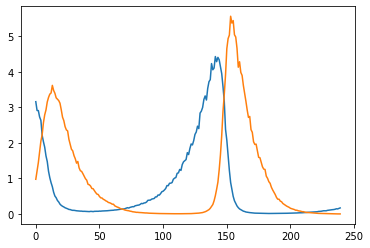

In [4]:
plt.plot(observations[:, 0])
plt.plot(observations[:, 1])

In [6]:
import numpy as np
import torch
import scipy
import argparse
import sys
import matplotlib.pyplot as plt
import matplotlib
from arma import ode_system, solve_magi
from arma import matrix
import time
import pickle
from multiprocessing import Pool

%matplotlib inline
from IPython.core.pylabtools import figsize # import figsize
#figsize(12.5, 4) # 设置 figsize
plt.rcParams['savefig.dpi'] = 200 #图片像素
plt.rcParams['figure.dpi'] = 200 #分辨率
torch.set_num_threads(1)


def fOde(theta, x):
    """
    description of ODE
    theta: list[4]
    return: array(n, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    Rdt = theta[0] * rabbit - theta[1] * rabbit * fox
    Fdt = theta[2] * rabbit * fox - theta[3] * fox
    return np.stack([Rdt, Fdt], axis=1)

def fOdeDx(theta, x):
    """
    returns ODE derivation of x given theta
    theta: list[4]
    x: array(n, 2)
    return: array(n, 2, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    resultDx = np.zeros(shape=[np.shape(x)[0], 2, 2])
    # [:, i, j]: jth equation derivative of the ith state
    # (0) / dR
    resultDx[:, 0, 0] = theta[0] - theta[0] * fox
    # (0) / dF
    resultDx[:, 1, 0] =  -theta[0] * rabbit
    # (1) / dR
    resultDx[:, 0, 1] = theta[2] * fox
    # (1) / dF
    resultDx[:, 0, 1] = theta[2] * rabbit - theta[3]
    return resultDx

def fOdeDtheta(theta, x):
    """
    returns ODE derivation of theta given x
    theta: list[4]
    x: array(n, 2)
    return: array(n, 4, 2)
    """
    resultDtheta = np.zeros(shape=[np.shape(x)[0], 4, 2])
    # [:, i, j]: jth equation derivative of the ith theta
    rabbit = x[:, 0]
    fox = x[:, 1]
    # (0) / 0
    resultDtheta[:, 0, 0] = rabbit
    # (0) / 1
    resultDtheta[:, 1, 0] = -rabbit * fox
    # (1) / 2
    resultDtheta[:, 2, 1] = rabbit * fox
    # (1) / 3
    resultDtheta[:, 3, 1] = -fox
    return resultDtheta

def copy_mat(arma_mat):
    return np.copy(matrix(arma_mat).reshape([-1])).reshape([arma_mat.n_rows, arma_mat.n_cols])

  



In [7]:
# def TVMAGI_solver(use_data_idx, fOde=fOde, fOdeDx=fOdeDx, fOdeDtheta=fOdeDtheta,
days = 20
discretization = 1
obs_per_day = 12 
theta_lowerbound=np.array([0., 0., 0., 0.])
theta_upperbound=np.array([np.inf, np.inf, np.inf, np.inf])
param_names = ['alpha', 'beta', 'delta', 'gamma']
is_time_varying=[False, False, False, True] 
use_trajectory='inferred'
learning_rate=np.array([1e-4, 1e-3, 1e-5])
n_iter = [15001, 200000, 15000, 200000]
    
yobs = observations
start_time = time.time()
nobs, p_dim = yobs.shape[0], yobs.shape[1]
n_points = nobs * discretization
theta_dim = theta_lowerbound.shape[0]
d_matrix = torch.zeros((n_points, n_points), dtype=torch.double)
for i in range(n_points):
    for j in range(n_points):
        if i > j:
            d_matrix[i][j] = (i - j) / (obs_per_day * discretization)
        else:
            d_matrix[i][j] = (j - i) / (obs_per_day * discretization)
Ode_system = ode_system("ODE-python", fOde, fOdeDx, fOdeDtheta,
                         thetaLowerBound=theta_lowerbound,
                         thetaUpperBound=theta_upperbound)
tvecObs = np.arange(0, days, 1. / obs_per_day)
tvecFull = np.arange(0, days, 1. / (obs_per_day * discretization))
yFull = np.ndarray([n_points, p_dim])
yFull.fill(np.nan)
yFull[np.arange(0, discretization * nobs, discretization).astype(int), :] = yobs
xInitExogenous = np.zeros_like(yFull)
# interpolate: find the ydata of tvecFull given observations
for i in range(p_dim):
    xInitExogenous[:, i] = np.interp(tvecFull, tvecObs, yobs[:, i])
# First stage: use MAGI package to optimize theta as constant
result = solve_magi(
    yFull,
    Ode_system,
    tvecFull,
    sigmaExogenous=np.array([]),
    phiExogenous=np.array([[]]),
    xInitExogenous=xInitExogenous,
    thetaInitExogenous=np.array([]),
    muExogenous=np.array([[]]),
    dotmuExogenous=np.array([[]]),
    priorTemperatureLevel=yFull.shape[0] / yobs.shape[0],
    priorTemperatureDeriv=yFull.shape[0] / yobs.shape[0],
    priorTemperatureObs=1.0,
    kernel="generalMatern",
    nstepsHmc=100,
    burninRatioHmc=0.5,
    niterHmc=n_iter[0],
    stepSizeFactorHmc=0.01,
    nEpoch=1,
    bandSize=40,
    useFrequencyBasedPrior=True,
    useBand=False,
    useMean=False,
    useScalerSigma=False,
    useFixedSigma=False,
    verbose=True)
samplesCpp = result['samplesCpp']
llikId = 0
xId = range(np.max(llikId) + 1, np.max(llikId) + yFull.size + 1)
# dimension of theta
thetaId = range(np.max(xId) + 1, np.max(xId) + theta_dim + 1)
sigmaId = range(np.max(thetaId) + 1, np.max(thetaId) + yFull.shape[1] + 1)
burnin = int(n_iter[0] * 0.5)
xsampled = samplesCpp[xId, (burnin + 1):]
xsampled = xsampled.reshape([yFull.shape[1], yFull.shape[0], -1])
CovAllDimensionsPyList = []
thetaSampled = samplesCpp[thetaId, (burnin + 1):]
inferred_theta = np.mean(thetaSampled, axis=-1)
sigmaSampled = samplesCpp[sigmaId, (burnin + 1):]
inferred_sigma = np.mean(sigmaSampled, axis=-1)
inferred_trajectory = np.mean(xsampled, axis=-1)
for each_gpcov in result['result_solved'].covAllDimensions:
    each_pycov = dict(
        Cinv=torch.from_numpy(matrix(each_gpcov.Cinv)).double(),
        Kinv=torch.from_numpy(matrix(each_gpcov.Kinv)).double(),
        mphi=torch.from_numpy(matrix(each_gpcov.mphi)).double(),
    )
    CovAllDimensionsPyList.append(each_pycov)

In [10]:
ydata.shape

torch.Size([240, 2])

In [13]:
def fOdeTorch(theta, x, constant_param_ls):
    """
    theta: list[4]: beta, ve, vi, pd
    x: array(n, 4)
    r: array(n, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    Rdt = constant_param_ls[0] * rabbit - constant_param_ls[1] * rabbit * fox
    Fdt = constant_param_ls[2] * rabbit * fox - theta[:, 0] * fox
    return torch.stack([Rdt, Fdt], axis=1)


def pointwisethetasigmallikTorch(xlatent, theta, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature):
    # length of observed y (t)
    n = ydata.shape[0]
    pdimension = ydata.shape[1]
    thetadimension = theta.shape[1]
    sigmaSq = torch.pow(sigma, 2)
    fderiv = fOdeTorch(theta, xlatent, time_constant_param_ls)
    res = torch.zeros([pdimension, 3]).double()
    fitDerivError = torch.zeros([n, pdimension]).double()
    nobs = torch.zeros([pdimension]).double()
    fitLevelErrorSumSq = torch.zeros([pdimension]).double()
    for vEachDim in range(pdimension):
        fitDerivError[:, vEachDim] = fderiv[:, vEachDim]
        fitDerivError[:, vEachDim] -= CovAllDimensionsPyList[vEachDim]['mphi'] @ xlatent[:, vEachDim]
        nobs[vEachDim] = torch.sum(torch.isfinite(ydata[:, vEachDim]))
        obsIdx = torch.isfinite(ydata[:, vEachDim])
        fitLevelErrorSumSq[vEachDim] = torch.sum(torch.square(xlatent[obsIdx, vEachDim] - ydata[obsIdx, vEachDim]))
    res[:, 0] = -0.5 * fitLevelErrorSumSq / sigmaSq - torch.log(sigma + 0.001) * nobs
    res[:, 0] /= priorTemperature[2]
    KinvfitDerivError = torch.zeros([n, pdimension]).double()
    CinvX = torch.zeros([n, pdimension]).double()
    for vEachDim in range(pdimension):
        # inverse of K
        KinvfitDerivError[:, vEachDim] = CovAllDimensionsPyList[vEachDim]['Kinv'] @ fitDerivError[:, vEachDim]
        # inverse of Cd
        CinvX[:, vEachDim] = CovAllDimensionsPyList[vEachDim]['Cinv'] @ xlatent[:, vEachDim]
    res[:, 1] = -0.5 * torch.sum(fitDerivError * KinvfitDerivError, dim=0) / priorTemperature[0]
    #  prior distriobution of X
    res[:, 2] = -0.5 * torch.sum(xlatent * CinvX, dim=0) / priorTemperature[1]
    return torch.sum(res)


TV_theta_mean = np.zeros(int(sum(is_time_varying)))
tv_index = 0
for thetaEachDim in range(theta_dim):
    if is_time_varying[thetaEachDim] == True:
        TV_theta_mean[tv_index] = inferred_theta[thetaEachDim]
        tv_index += 1

if use_trajectory == 'observation':
    pointwise_xlatent_torch = torch.tensor(xInitExogenous, requires_grad=True, dtype=torch.double)
elif use_trajectory == 'inferred':
    pointwise_xlatent_torch = torch.tensor(inferred_trajectory.transpose(), requires_grad=True, dtype=torch.double)
else:
    raise ValueError
tmp1 = np.array([TV_theta_mean])
initial_tvtheta = np.repeat(tmp1, pointwise_xlatent_torch.shape[0], axis=0)
pointwise_theta_torch = torch.tensor(initial_tvtheta, requires_grad=True, dtype=torch.double)
sigma_torch = torch.tensor(inferred_sigma, requires_grad=True, dtype=torch.double)
time_constant_param_ls = []
for thetaEachDim in range(theta_dim):
    if is_time_varying[thetaEachDim] == False:
        param_name = param_names[thetaEachDim]
        print(param_name)
        globals()[param_name] = torch.tensor([inferred_theta[thetaEachDim]], requires_grad=True, dtype=torch.double)
        print(eval(param_name))
        time_constant_param_ls.append(eval(param_name))

ydata = torch.from_numpy(yFull).double()
priorTemperature = torch.tensor([discretization, discretization, 1.0])  # ?
pointwise_optimizer = torch.optim.Adam([pointwise_xlatent_torch, pointwise_theta_torch, sigma_torch] + time_constant_param_ls, lr=1e-4)  # , weight_decay = 1.0
pointwise_lr_scheduler = torch.optim.lr_scheduler.StepLR(pointwise_optimizer, step_size=10000, gamma=0.5)
cur_loss = 1e20
for epoch in range(n_iter[1]):
    pointwise_optimizer.zero_grad()
    # compute loss function
    llik = pointwisethetasigmallikTorch(pointwise_xlatent_torch, pointwise_theta_torch, time_constant_param_ls, sigma_torch,
                                        ydata, CovAllDimensionsPyList, fOdeTorch,
                                        priorTemperature)
    new_loss = -llik
    if epoch % 200 == 0:
        print(epoch, new_loss.item())
        diff = new_loss.item() - cur_loss
        if torch.isnan(new_loss) == False and diff > -0.01 and diff < 0.01:
            break
        cur_loss = new_loss.item()
    new_loss.backward()
    pointwise_optimizer.step()
    pointwise_lr_scheduler.step()

alpha
tensor([0.5963], dtype=torch.float64, requires_grad=True)
beta
tensor([0.7361], dtype=torch.float64, requires_grad=True)
delta
tensor([1.0085], dtype=torch.float64, requires_grad=True)
0 -1100.8118001400826


/usr/local/lib/python3.6/dist-packages/torch/autograd/__init__.py:132: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  allow_unreachable=True)  # allow_unreachable flag


200 -1136.1610848489447
400 -1156.776278465853
600 -1172.4864677956234
800 -1185.0233407636388
1000 -1195.1958756296451
1200 -1203.5061501601333
1400 -1210.307860992369
1600 -1215.8781514323377
1800 -1220.452075501747
2000 -1224.2310912775984
2200 -1227.381920834861
2400 -1230.03830301409
2600 -1232.3001064205662
2800 -1234.241309446216
3000 -1235.9139672220574
3200 -1237.3561952196683
3400 -1238.5964952122501
3600 -1239.6583061151393
3800 -1240.561249695479
4000 -1241.3239072376646
4200 -1241.9624487519477
4400 -1242.4921532193907
4600 -1242.9278916710937
4800 -1243.282632434879
5000 -1243.5695194597088
5200 -1243.7990597540447
5400 -1243.98260764645
5600 -1244.1283801253708
5800 -1244.2444295460166
6000 -1244.3380919657202
6200 -1244.4145475184844
6400 -1244.4779593068379
6600 -1244.5320331115527
6800 -1244.5790659100735
7000 -1244.6210658381947
7200 -1244.659596501885
7400 -1244.694677860689
7600 -1244.7274232656014
7800 -1244.7578738113998
8000 -1244.786124369159
8200 -1244.8126043

In [27]:
pointwise_theta_torch.detach().numpy()[:, 0]

array([ 0.32546781,  0.59237742,  0.74942989,  0.87655726,  0.98674058,
        1.02641299,  1.02325105,  1.00268605,  0.9380653 ,  0.85775958,
        0.78721417,  0.72276915,  0.69044708,  0.74617011,  0.83234452,
        0.83895353,  0.76006448,  0.6749147 ,  0.67975409,  0.77948892,
        0.88299113,  0.89804787,  0.83663446,  0.75897912,  0.73547071,
        0.82592499,  0.93613109,  0.94885986,  0.8820203 ,  0.82076872,
        0.79031488,  0.7492696 ,  0.70760946,  0.7441969 ,  0.79528154,
        0.74483868,  0.69838944,  0.73186647,  0.8055121 ,  0.8743546 ,
        0.91402908,  0.86127658,  0.75435809,  0.71006102,  0.71086589,
        0.7666636 ,  0.86375099,  0.90898927,  0.89661894,  0.8967609 ,
        0.88690593,  0.80851572,  0.7486571 ,  0.75009439,  0.77610546,
        0.7988781 ,  0.79223352,  0.7470427 ,  0.71194916,  0.75875226,
        0.8901038 ,  1.11204019,  1.29195573,  1.30466936,  1.25666288,
        1.24907361,  1.24813601,  1.18220617,  1.15159302,  1.19

In [19]:
def construct(vals, occurence_times):
    ls = []
    for idx in range(len(vals)):
        if occurence_times[idx] != 0:
            for i in range(occurence_times[idx]):
                ls.append(vals[idx])
    return torch.cat(ls, axis=0).reshape(-1, vals.shape[1])
    
def new_likelihood(xlatent, vals, occurence_times, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature):
    new_theta = construct(vals, occurence_times)
    return pointwisethetasigmallikTorch(xlatent, new_theta, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature)



vals = pointwise_theta_torch.detach().clone()
# Initialize occurence times, sum(cur_occurence_times) = len(theta)
occurence_times = np.ones(len(vals)).astype(int)
pointwise_xlatent_torch.requires_grad = False
sigma_torch.requires_grad = False
total_iter = 238
vals_ls = np.zeros((total_iter, len(vals)))
occurence_times_ls = np.zeros((total_iter, len(vals)))
lik_ls = np.zeros(len(vals))
for EachIter in range(total_iter):
    print('Iteration: ', EachIter, '\n')
    n_clusters = np.count_nonzero(occurence_times)
    cur_loss = np.inf
    cur_best_idx = -1
    cur_occurence_times = occurence_times.copy()
    for idx in range(len(vals)-1):
        if occurence_times[idx] == 0:
            continue
        else:
            print('Current index: ', idx)
            # find the next index of theta value
            next_idx = idx + 1
            while next_idx <= len(vals)-1:
                if occurence_times[next_idx]:
                    break
                next_idx += 1
            # if there is no such next index, continue to the next iteration  
            if next_idx >= len(vals):
                continue      
            cur_vals = vals.detach().clone()
            new_val = (cur_vals[idx] + cur_vals[next_idx]) / 2
            new_vals = cur_vals.detach().clone()
            new_vals[idx], new_vals[next_idx] = new_val, new_val
            new_occurence_times = cur_occurence_times.copy()
            new_occurence_times[idx] = cur_occurence_times[idx] + cur_occurence_times[next_idx]
            new_occurence_times[next_idx] = 0
            pointwise_xlatent_torch_tmp = pointwise_xlatent_torch.detach().clone()
            pointwise_xlatent_torch_tmp.requires_grad = True
            time_constant_param_ls_tmp = time_constant_param_ls.copy()
            sigma_torch_tmp = sigma_torch.detach().clone()
            # Define new initial theta
            print(new_likelihood(pointwise_xlatent_torch_tmp, new_vals_tmp, new_occurence_times, time_constant_param_ls_tmp, sigma_torch_tmp,
                                            ydata, CovAllDimensionsPyList, fOdeTorch,
                                            priorTemperature))
            pointwise_optimizer = torch.optim.Adam([pointwise_xlatent_torch_tmp, new_vals_tmp, sigma_torch_tmp] + time_constant_param_ls_tmp, lr=1e-4)  # , weight_decay = 1.0
            pointwise_lr_scheduler = torch.optim.lr_scheduler.StepLR(pointwise_optimizer, step_size=5000, gamma=0.5)
            cur_loss_tmp = np.inf
            for epoch in range(100000):
                pointwise_optimizer.zero_grad()
                # compute loss function
                llik = new_likelihood(pointwise_xlatent_torch_tmp, new_vals_tmp, new_occurence_times, time_constant_param_ls, sigma_torch,
                                            ydata, CovAllDimensionsPyList, fOdeTorch,
                                            priorTemperature)
                new_loss = -llik
                if epoch % 200 == 0:
                    print(epoch, new_loss.item())
                    diff = new_loss.item() - cur_loss_tmp
                    if torch.isnan(new_loss) == False and diff > -1. and diff < 1.:
                        break
                    cur_loss_tmp = new_loss.item()
                new_loss.backward()
                pointwise_optimizer.step()
                pointwise_lr_scheduler.step()
            if cur_loss > new_loss.item():
                cur_loss = new_loss.item()
                cur_best_idx = idx
                cur_best_occurence_times = new_occurence_times.copy()
                print('Update change point!')
                cur_best_vals = new_vals_tmp.detach().clone()
                print('Updated change point list: ', cur_best_occurence_times)
    occurence_times = cur_best_occurence_times.copy()
    occurence_times_ls[EachIter] = occurence_times.copy()
    vals = cur_best_vals.clone()
    vals_ls[EachIter] = vals.detach().numpy()[:, 0]
    lik_ls[EachIter] = cur_loss

Iteration:  0 

Current index:  0
tensor(1225.7056, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1225.7056099533697
200 -1242.4444948940513
400 -1242.726357618984
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  1
tensor(1232.7803, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1232.7802878828147
200 -1243.7049587594809
400 -1243.7572559550085
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1

In [33]:
def construct(vals, occurence_times):
    ls = []
    for idx in range(len(vals)):
        if occurence_times[idx] != 0:
            for i in range(occurence_times[idx]):
                ls.append(vals[idx])
    return torch.cat(ls, axis=0).reshape(-1, vals.shape[1])

beta_ls = np.zeros((238, 240))
for i in range(238):
    print(i)
    beta = construct(torch.tensor(vals_ls[i]).reshape(-1, 1), occurence_times_ls[i].astype(int)).numpy()
    beta_ls[i] = beta[:, 0]
#     plt.plot(construct(torch.tensor(vals_ls[i]).reshape(-1, 1), occurence_times_ls[i].astype(int)).numpy().reshape(-1, 1))
#     plt.plot(gamma[::1000])
#     plt.title(str(i+1) + 'th Iteration: loss = '+ str(lik_ls[i]))
#     plt.savefig('LV-plots/plot-'+str(i)+'.png')
#     plt.clf()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237


In [35]:
np.save('beta list.npy', beta_ls)

In [28]:
construct(torch.tensor(vals_ls[i]).reshape(-1, 1), occurence_times_ls[i].astype(int)).numpy().reshape(-1, 1)

array([[0.32546781],
       [0.32546781],
       [0.32546781],
       [0.32546781],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.98674058],
       [0.986

In [29]:
vals_ls

array([[0.32546781, 0.59237742, 0.74942989, ..., 1.20819179, 1.10132126,
        1.0370445 ],
       [0.32546781, 0.59237742, 0.74942989, ..., 1.20819179, 1.10132126,
        1.0370445 ],
       [0.32546781, 0.59237742, 0.74942989, ..., 1.20819179, 1.10132126,
        1.0370445 ],
       ...,
       [0.32546781, 0.59237742, 0.74942989, ..., 1.20819179, 1.10132126,
        1.0370445 ],
       [0.32546781, 0.59237742, 0.74942989, ..., 1.20819179, 1.10132126,
        1.0370445 ],
       [0.32546781, 0.59237742, 0.74942989, ..., 1.20819179, 1.10132126,
        1.0370445 ]])

In [1]:
import numpy as np
import matplotlib.pyplot as plt

days = 20  
obs_per_day = 12
nobs = 240
X = np.arange(0, days, 1./(obs_per_day * 1000))
alpha = 0.6
beta = 0.75 
delta = 1. 
gamma = np.concatenate((0.6 * np.ones(60000), 1. * np.ones(60000), 0.6 * np.ones(60000), 1. * np.ones(60000)))

def gen_data(alpha, beta, delta, gamma, days, obs_per_day, state0=[3., 1.], linspace=1000, noise=True):
    nobs = days
    step_size = 1. / (linspace * obs_per_day)
    state_ls = np.ones((days * linspace * obs_per_day, 2))
    state_ls[0] = state0.copy()
    for i in range(1, linspace * days * obs_per_day):
        index = i - 1
        state_ls[i][0] = state_ls[i - 1][0] + step_size * (
                    alpha * state_ls[i - 1][0] - beta * state_ls[i - 1][0] * state_ls[i - 1][1])
        state_ls[i][1] = state_ls[i - 1][1] + step_size * (
                    delta * state_ls[i - 1][0] * state_ls[i - 1][1] - gamma[index]  * state_ls[i - 1][1])
    states = state_ls[::linspace]
    states *= np.random.normal(1, 0.03, states.shape)
    return states


observations = gen_data(alpha, beta, delta, gamma, days, obs_per_day)

import numpy as np
import torch
import scipy
import argparse
import sys
import matplotlib.pyplot as plt
import matplotlib
from arma import ode_system, solve_magi
from arma import matrix
import time
import pickle
from multiprocessing import Pool

torch.set_num_threads(1)


def fOde(theta, x):
    """
    description of ODE
    theta: list[4]
    return: array(n, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    Rdt = theta[0] * rabbit - theta[1] * rabbit * fox
    Fdt = theta[2] * rabbit * fox - theta[3] * fox
    return np.stack([Rdt, Fdt], axis=1)

def fOdeDx(theta, x):
    """
    returns ODE derivation of x given theta
    theta: list[4]
    x: array(n, 2)
    return: array(n, 2, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    resultDx = np.zeros(shape=[np.shape(x)[0], 2, 2])
    # [:, i, j]: jth equation derivative of the ith state
    # (0) / dR
    resultDx[:, 0, 0] = theta[0] - theta[0] * fox
    # (0) / dF
    resultDx[:, 1, 0] =  -theta[1] * rabbit
    # (1) / dR
    resultDx[:, 0, 1] = theta[2] * fox
    # (1) / dF
    resultDx[:, 0, 1] = theta[2] * rabbit - theta[3]
    return resultDx

def fOdeDtheta(theta, x):
    """
    returns ODE derivation of theta given x
    theta: list[4]
    x: array(n, 2)
    return: array(n, 4, 2)
    """
    resultDtheta = np.zeros(shape=[np.shape(x)[0], 4, 2])
    # [:, i, j]: jth equation derivative of the ith theta
    rabbit = x[:, 0]
    fox = x[:, 1]
    # (0) / 0
    resultDtheta[:, 0, 0] = rabbit
    # (0) / 1
    resultDtheta[:, 1, 0] = -rabbit * fox
    # (1) / 2
    resultDtheta[:, 2, 1] = rabbit * fox
    # (1) / 3
    resultDtheta[:, 3, 1] = -fox
    return resultDtheta

def copy_mat(arma_mat):
    return np.copy(matrix(arma_mat).reshape([-1])).reshape([arma_mat.n_rows, arma_mat.n_cols])

# def TVMAGI_solver(use_data_idx, fOde=fOde, fOdeDx=fOdeDx, fOdeDtheta=fOdeDtheta,
days = 20
discretization = 1
obs_per_day = 12 
theta_lowerbound=np.array([0., 0., 0., 0.])
theta_upperbound=np.array([np.inf, np.inf, np.inf, np.inf])
param_names = ['alpha', 'beta', 'delta', 'gamma']
is_time_varying=[False, False, False, True] 
use_trajectory='observation'
learning_rate=np.array([1e-4, 1e-3, 1e-5])
n_iter = [15001, 200000, 15000, 200000]
    
yobs = observations
nobs, p_dim = yobs.shape[0], yobs.shape[1]
n_points = nobs * discretization
theta_dim = theta_lowerbound.shape[0]
d_matrix = torch.zeros((n_points, n_points), dtype=torch.double)
for i in range(n_points):
    for j in range(n_points):
        if i > j:
            d_matrix[i][j] = (i - j) / (obs_per_day * discretization)
        else:
            d_matrix[i][j] = (j - i) / (obs_per_day * discretization)
Ode_system = ode_system("ODE-python", fOde, fOdeDx, fOdeDtheta,
                         thetaLowerBound=theta_lowerbound,
                         thetaUpperBound=theta_upperbound)
tvecObs = np.arange(0, days, 1. / obs_per_day)
tvecFull = np.arange(0, days, 1. / (obs_per_day * discretization))
yFull = np.ndarray([n_points, p_dim])
yFull.fill(np.nan)
yFull[np.arange(0, discretization * nobs, discretization).astype(int), :] = yobs
xInitExogenous = np.zeros_like(yFull)
# interpolate: find the ydata of tvecFull given observations
for i in range(p_dim):
    xInitExogenous[:, i] = np.interp(tvecFull, tvecObs, yobs[:, i])
# First stage: use MAGI package to optimize theta as constant
result = solve_magi(
    yFull,
    Ode_system,
    tvecFull,
    sigmaExogenous=np.array([]),
    phiExogenous=np.array([[]]),
    xInitExogenous=xInitExogenous,
    thetaInitExogenous=np.array([]),
    muExogenous=np.array([[]]),
    dotmuExogenous=np.array([[]]),
    priorTemperatureLevel=yFull.shape[0] / yobs.shape[0],
    priorTemperatureDeriv=yFull.shape[0] / yobs.shape[0],
    priorTemperatureObs=1.0,
    kernel="generalMatern",
    nstepsHmc=100,
    burninRatioHmc=0.5,
    niterHmc=n_iter[0],
    stepSizeFactorHmc=0.01,
    nEpoch=1,
    bandSize=40,
    useFrequencyBasedPrior=True,
    useBand=False,
    useMean=False,
    useScalerSigma=False,
    useFixedSigma=False,
    verbose=True)
samplesCpp = result['samplesCpp']
llikId = 0
xId = range(np.max(llikId) + 1, np.max(llikId) + yFull.size + 1)
# dimension of theta
thetaId = range(np.max(xId) + 1, np.max(xId) + theta_dim + 1)
sigmaId = range(np.max(thetaId) + 1, np.max(thetaId) + yFull.shape[1] + 1)
burnin = int(n_iter[0] * 0.5)
xsampled = samplesCpp[xId, (burnin + 1):]
xsampled = xsampled.reshape([yFull.shape[1], yFull.shape[0], -1])
CovAllDimensionsPyList = []
thetaSampled = samplesCpp[thetaId, (burnin + 1):]
inferred_theta = np.mean(thetaSampled, axis=-1)
sigmaSampled = samplesCpp[sigmaId, (burnin + 1):]
inferred_sigma = np.mean(sigmaSampled, axis=-1)
inferred_trajectory = np.mean(xsampled, axis=-1)
for each_gpcov in result['result_solved'].covAllDimensions:
    each_pycov = dict(
        Cinv=torch.from_numpy(matrix(each_gpcov.Cinv)).double(),
        Kinv=torch.from_numpy(matrix(each_gpcov.Kinv)).double(),
        mphi=torch.from_numpy(matrix(each_gpcov.mphi)).double(),
    )
    CovAllDimensionsPyList.append(each_pycov)
    

def fOdeTorch(theta, x, constant_param_ls):
    """
    theta: list[4]: beta, ve, vi, pd
    x: array(n, 4)
    r: array(n, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    Rdt = constant_param_ls[0] * rabbit - constant_param_ls[1] * rabbit * fox
    Fdt = constant_param_ls[2] * rabbit * fox - theta[:, 0] * fox
    return torch.stack([Rdt, Fdt], axis=1)


def pointwisethetasigmallikTorch(xlatent, theta, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature):
    # length of observed y (t)
    n = ydata.shape[0]
    pdimension = ydata.shape[1]
    thetadimension = theta.shape[1]
    sigmaSq = torch.pow(sigma, 2)
    fderiv = fOdeTorch(theta, xlatent, time_constant_param_ls)
    res = torch.zeros([pdimension, 3]).double()
    fitDerivError = torch.zeros([n, pdimension]).double()
    nobs = torch.zeros([pdimension]).double()
    fitLevelErrorSumSq = torch.zeros([pdimension]).double()
    for vEachDim in range(pdimension):
        fitDerivError[:, vEachDim] = fderiv[:, vEachDim]
        fitDerivError[:, vEachDim] -= CovAllDimensionsPyList[vEachDim]['mphi'] @ xlatent[:, vEachDim]
        nobs[vEachDim] = torch.sum(torch.isfinite(ydata[:, vEachDim]))
        obsIdx = torch.isfinite(ydata[:, vEachDim])
        fitLevelErrorSumSq[vEachDim] = torch.sum(torch.square(xlatent[obsIdx, vEachDim] - ydata[obsIdx, vEachDim]))
    res[:, 0] = -0.5 * fitLevelErrorSumSq / sigmaSq - torch.log(sigma + 0.001) * nobs
    res[:, 0] /= priorTemperature[2]
    KinvfitDerivError = torch.zeros([n, pdimension]).double()
    CinvX = torch.zeros([n, pdimension]).double()
    for vEachDim in range(pdimension):
        # inverse of K
        KinvfitDerivError[:, vEachDim] = CovAllDimensionsPyList[vEachDim]['Kinv'] @ fitDerivError[:, vEachDim]
        # inverse of Cd
        CinvX[:, vEachDim] = CovAllDimensionsPyList[vEachDim]['Cinv'] @ xlatent[:, vEachDim]
    res[:, 1] = -0.5 * torch.sum(fitDerivError * KinvfitDerivError, dim=0) / priorTemperature[0]
    #  prior distriobution of X
    res[:, 2] = -0.5 * torch.sum(xlatent * CinvX, dim=0) / priorTemperature[1]
    return torch.sum(res)


TV_theta_mean = np.zeros(int(sum(is_time_varying)))
tv_index = 0
for thetaEachDim in range(theta_dim):
    if is_time_varying[thetaEachDim] == True:
        TV_theta_mean[tv_index] = inferred_theta[thetaEachDim]
        tv_index += 1

if use_trajectory == 'observation':
    pointwise_xlatent_torch = torch.tensor(xInitExogenous, requires_grad=True, dtype=torch.double)
elif use_trajectory == 'inferred':
    pointwise_xlatent_torch = torch.tensor(inferred_trajectory.transpose(), requires_grad=True, dtype=torch.double)
else:
    raise ValueError
tmp1 = np.array([TV_theta_mean])
initial_tvtheta = np.repeat(tmp1, pointwise_xlatent_torch.shape[0], axis=0)
pointwise_theta_torch = torch.tensor(initial_tvtheta, requires_grad=True, dtype=torch.double)
sigma_torch = torch.tensor(inferred_sigma, requires_grad=True, dtype=torch.double)
time_constant_param_ls = []
for thetaEachDim in range(theta_dim):
    if is_time_varying[thetaEachDim] == False:
        param_name = param_names[thetaEachDim]
        print(param_name)
        globals()[param_name] = torch.tensor([inferred_theta[thetaEachDim]], requires_grad=True, dtype=torch.double)
        print(eval(param_name))
        time_constant_param_ls.append(eval(param_name))

ydata = torch.from_numpy(yFull).double()
priorTemperature = torch.tensor([discretization, discretization, 1.0])  # ?
pointwise_optimizer = torch.optim.Adam([pointwise_xlatent_torch, pointwise_theta_torch, sigma_torch] + time_constant_param_ls, lr=1e-4)  # , weight_decay = 1.0
pointwise_lr_scheduler = torch.optim.lr_scheduler.StepLR(pointwise_optimizer, step_size=10000, gamma=0.5)
cur_loss = np.inf
for epoch in range(n_iter[1]):
    pointwise_optimizer.zero_grad()
    # compute loss function
    llik = pointwisethetasigmallikTorch(pointwise_xlatent_torch, pointwise_theta_torch, time_constant_param_ls, sigma_torch,
                                        ydata, CovAllDimensionsPyList, fOdeTorch,
                                        priorTemperature)
    new_loss = -llik
    if epoch % 200 == 0:
        print(epoch, new_loss.item())
        diff = new_loss.item() - cur_loss
        if torch.isnan(new_loss) == False and diff > -0.01 and diff < 0.01:
            break
        cur_loss = new_loss.item()
    new_loss.backward()
    pointwise_optimizer.step()
    pointwise_lr_scheduler.step()
    
    



alpha
tensor([0.6350], dtype=torch.float64, requires_grad=True)
beta
tensor([0.8307], dtype=torch.float64, requires_grad=True)
delta
tensor([0.8147], dtype=torch.float64, requires_grad=True)
0 37406.938167904256


/usr/local/lib/python3.6/dist-packages/torch/autograd/__init__.py:132: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  allow_unreachable=True)  # allow_unreachable flag


200 26689.741078349514
400 19815.653491692603
600 15162.478146591367
800 11812.345003075003
1000 9315.368267593714
1200 7383.983123018758
1400 5865.61538354195
1600 4658.116181722379
1800 3689.9308757447307
2000 2908.5656670745175
2200 2273.7680014510443
2400 1753.843269659129
2600 1323.7177867163753
2800 963.8228570294631
3000 659.2635087882657
3200 399.02038797672776
3400 175.12667608951375
3600 -18.125283226384852
3800 -184.86832722146403
4000 -328.193540260414
4200 -450.5379079642509
4400 -553.957173578974
4600 -640.3137802734849
4800 -711.3994429521244
5000 -769.0038011669337
5200 -814.9374661278795
5400 -851.0199082741389
5600 -879.0418053472376
5800 -900.7132906484387
6000 -917.60844458445
6200 -931.1155962326951
6400 -942.4019401438995
6600 -952.3982545697394
6800 -961.8057427444313
7000 -971.1226031678184
7200 -980.6837988233466
7400 -990.7054150058451
7600 -1001.32524370069
7800 -1012.6348219585961
8000 -1024.7002597633273
8200 -1037.5728448021302
8400 -1051.2900247302423
860

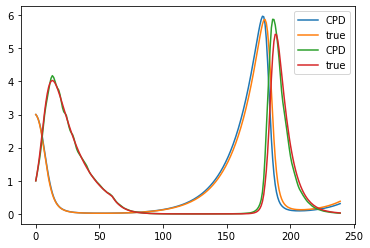

In [10]:
days = 20  
obs_per_day = 12
nobs = 240
X = np.arange(0, days, 1./(obs_per_day * 1000))
alpha = time_constant_param_ls[0].item()
beta = time_constant_param_ls[1].item() 
delta = time_constant_param_ls[2].item() 

alpha_true = 0.6
beta_true = 0.75 
delta_true = 1. 


gamma_true = np.concatenate((0.6 * np.ones(60), 1.5 * np.ones(60), 0.6 * np.ones(60), 1.5 * np.ones(60)))

def recover_data(alpha, beta, delta, gamma, days, obs_per_day, state0=[3., 1.], linspace=1000, noise=True):
    nobs = days
    step_size = 1. / (linspace * obs_per_day)
    state_ls = np.ones((days * linspace * obs_per_day, 2))
    state_ls[0] = state0.copy()
    for i in range(1, linspace * days * obs_per_day):
        index = int((i - 1) / 1000)
        state_ls[i][0] = state_ls[i - 1][0] + step_size * (
                    alpha * state_ls[i - 1][0] - beta * state_ls[i - 1][0] * state_ls[i - 1][1])
        state_ls[i][1] = state_ls[i - 1][1] + step_size * (
                    delta * state_ls[i - 1][0] * state_ls[i - 1][1] - gamma[index]  * state_ls[i - 1][1])
    states = state_ls[::linspace]
    return states


gamma = pointwise_theta_torch.detach().numpy()[:, 0]
reconstructed = recover_data(alpha, beta, delta, gamma, days, obs_per_day)
truth = recover_data(alpha_true, beta_true, delta_true, gamma_true, days, obs_per_day)
plt.plot(reconstructed[:, 0], label='CPD')
plt.plot(truth[:, 0], label='true')
plt.plot(reconstructed[:, 1], label='CPD')
plt.plot(truth[:, 1], label='true')
plt.legend()
plt.show()
#     plt.savefig('new-LV-x/plot-'+str(i)+'.png')
#     plt.clf()

In [1]:
import numpy as np
import matplotlib.pyplot as plt

days = 20  
obs_per_day = 12
nobs = 240
X = np.arange(0, days, 1./(obs_per_day * 1000))
alpha = 0.6
beta = 0.75 
delta = 1. 
gamma = np.concatenate((0.6 * np.ones(60000), 1. * np.ones(60000), 0.6 * np.ones(60000), 1. * np.ones(60000)))

def gen_data(alpha, beta, delta, gamma, days, obs_per_day, state0=[3., 1.], linspace=1000, noise=True):
    nobs = days
    step_size = 1. / (linspace * obs_per_day)
    state_ls = np.ones((days * linspace * obs_per_day, 2))
    state_ls[0] = state0.copy()
    for i in range(1, linspace * days * obs_per_day):
        index = i - 1
        state_ls[i][0] = state_ls[i - 1][0] + step_size * (
                    alpha * state_ls[i - 1][0] - beta * state_ls[i - 1][0] * state_ls[i - 1][1])
        state_ls[i][1] = state_ls[i - 1][1] + step_size * (
                    delta * state_ls[i - 1][0] * state_ls[i - 1][1] - gamma[index]  * state_ls[i - 1][1])
    states = state_ls[::linspace]
    states *= np.random.normal(1, 0.03, states.shape)
    return states


observations = gen_data(alpha, beta, delta, gamma, days, obs_per_day)

import numpy as np
import torch
import scipy
import argparse
import sys
import matplotlib.pyplot as plt
import matplotlib
from arma import ode_system, solve_magi
from arma import matrix
import time
import pickle
from multiprocessing import Pool

torch.set_num_threads(1)


def fOde(theta, x):
    """
    description of ODE
    theta: list[4]
    return: array(n, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    Rdt = theta[0] * rabbit - theta[1] * rabbit * fox
    Fdt = theta[2] * rabbit * fox - theta[3] * fox
    return np.stack([Rdt, Fdt], axis=1)

def fOdeDx(theta, x):
    """
    returns ODE derivation of x given theta
    theta: list[4]
    x: array(n, 2)
    return: array(n, 2, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    resultDx = np.zeros(shape=[np.shape(x)[0], 2, 2])
    # [:, i, j]: jth equation derivative of the ith state
    # (0) / dR
    resultDx[:, 0, 0] = theta[0] - theta[1] * fox
    # (0) / dF
    resultDx[:, 1, 0] =  -theta[1] * rabbit
    # (1) / dR
    resultDx[:, 0, 1] = theta[2] * fox
    # (1) / dF
    resultDx[:, 0, 1] = theta[2] * rabbit - theta[3]
    return resultDx

def fOdeDtheta(theta, x):
    """
    returns ODE derivation of theta given x
    theta: list[4]
    x: array(n, 2)
    return: array(n, 4, 2)
    """
    resultDtheta = np.zeros(shape=[np.shape(x)[0], 4, 2])
    # [:, i, j]: jth equation derivative of the ith theta
    rabbit = x[:, 0]
    fox = x[:, 1]
    # (0) / 0
    resultDtheta[:, 0, 0] = rabbit
    # (0) / 1
    resultDtheta[:, 1, 0] = -rabbit * fox
    # (1) / 2
    resultDtheta[:, 2, 1] = rabbit * fox
    # (1) / 3
    resultDtheta[:, 3, 1] = -fox
    return resultDtheta

def copy_mat(arma_mat):
    return np.copy(matrix(arma_mat).reshape([-1])).reshape([arma_mat.n_rows, arma_mat.n_cols])

# def TVMAGI_solver(use_data_idx, fOde=fOde, fOdeDx=fOdeDx, fOdeDtheta=fOdeDtheta,
days = 20
discretization = 1
obs_per_day = 12 
theta_lowerbound=np.array([0., 0., 0., 0.])
theta_upperbound=np.array([np.inf, np.inf, np.inf, np.inf])
param_names = ['alpha', 'beta', 'delta', 'gamma']
is_time_varying=[False, False, False, True] 
use_trajectory='observation'
learning_rate=np.array([1e-4, 1e-3, 1e-5])
n_iter = [15001, 200000, 15000, 200000]
    
yobs = observations
nobs, p_dim = yobs.shape[0], yobs.shape[1]
n_points = nobs * discretization
theta_dim = theta_lowerbound.shape[0]
d_matrix = torch.zeros((n_points, n_points), dtype=torch.double)
for i in range(n_points):
    for j in range(n_points):
        if i > j:
            d_matrix[i][j] = (i - j) / (obs_per_day * discretization)
        else:
            d_matrix[i][j] = (j - i) / (obs_per_day * discretization)
Ode_system = ode_system("ODE-python", fOde, fOdeDx, fOdeDtheta,
                         thetaLowerBound=theta_lowerbound,
                         thetaUpperBound=theta_upperbound)
tvecObs = np.arange(0, days, 1. / obs_per_day)
tvecFull = np.arange(0, days, 1. / (obs_per_day * discretization))
yFull = np.ndarray([n_points, p_dim])
yFull.fill(np.nan)
yFull[np.arange(0, discretization * nobs, discretization).astype(int), :] = yobs
xInitExogenous = np.zeros_like(yFull)
# interpolate: find the ydata of tvecFull given observations
for i in range(p_dim):
    xInitExogenous[:, i] = np.interp(tvecFull, tvecObs, yobs[:, i])
# First stage: use MAGI package to optimize theta as constant
result = solve_magi(
    yFull,
    Ode_system,
    tvecFull,
    sigmaExogenous=np.array([]),
    phiExogenous=np.array([[]]),
    xInitExogenous=xInitExogenous,
    thetaInitExogenous=np.array([]),
    muExogenous=np.array([[]]),
    dotmuExogenous=np.array([[]]),
    priorTemperatureLevel=yFull.shape[0] / yobs.shape[0],
    priorTemperatureDeriv=yFull.shape[0] / yobs.shape[0],
    priorTemperatureObs=1.0,
    kernel="generalMatern",
    nstepsHmc=100,
    burninRatioHmc=0.5,
    niterHmc=n_iter[0],
    stepSizeFactorHmc=0.01,
    nEpoch=1,
    bandSize=40,
    useFrequencyBasedPrior=True,
    useBand=False,
    useMean=False,
    useScalerSigma=False,
    useFixedSigma=False,
    verbose=True)
samplesCpp = result['samplesCpp']
llikId = 0
xId = range(np.max(llikId) + 1, np.max(llikId) + yFull.size + 1)
# dimension of theta
thetaId = range(np.max(xId) + 1, np.max(xId) + theta_dim + 1)
sigmaId = range(np.max(thetaId) + 1, np.max(thetaId) + yFull.shape[1] + 1)
burnin = int(n_iter[0] * 0.5)
xsampled = samplesCpp[xId, (burnin + 1):]
xsampled = xsampled.reshape([yFull.shape[1], yFull.shape[0], -1])
CovAllDimensionsPyList = []
thetaSampled = samplesCpp[thetaId, (burnin + 1):]
inferred_theta = np.mean(thetaSampled, axis=-1)
sigmaSampled = samplesCpp[sigmaId, (burnin + 1):]
inferred_sigma = np.mean(sigmaSampled, axis=-1)
inferred_trajectory = np.mean(xsampled, axis=-1)
for each_gpcov in result['result_solved'].covAllDimensions:
    each_pycov = dict(
        Cinv=torch.from_numpy(matrix(each_gpcov.Cinv)).double(),
        Kinv=torch.from_numpy(matrix(each_gpcov.Kinv)).double(),
        mphi=torch.from_numpy(matrix(each_gpcov.mphi)).double(),
    )
    CovAllDimensionsPyList.append(each_pycov)
    

def fOdeTorch(theta, x, constant_param_ls):
    """
    theta: list[4]: beta, ve, vi, pd
    x: array(n, 4)
    r: array(n, 2)
    """
    rabbit = x[:, 0]
    fox = x[:, 1]
    Rdt = constant_param_ls[0] * rabbit - constant_param_ls[1] * rabbit * fox
    Fdt = constant_param_ls[2] * rabbit * fox - theta[:, 0] * fox
    return torch.stack([Rdt, Fdt], axis=1)


def pointwisethetasigmallikTorch(xlatent, theta, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature):
    # length of observed y (t)
    n = ydata.shape[0]
    pdimension = ydata.shape[1]
    thetadimension = theta.shape[1]
    sigmaSq = torch.pow(sigma, 2)
    fderiv = fOdeTorch(theta, xlatent, time_constant_param_ls)
    res = torch.zeros([pdimension, 3]).double()
    fitDerivError = torch.zeros([n, pdimension]).double()
    nobs = torch.zeros([pdimension]).double()
    fitLevelErrorSumSq = torch.zeros([pdimension]).double()
    for vEachDim in range(pdimension):
        fitDerivError[:, vEachDim] = fderiv[:, vEachDim]
        fitDerivError[:, vEachDim] -= CovAllDimensionsPyList[vEachDim]['mphi'] @ xlatent[:, vEachDim]
        nobs[vEachDim] = torch.sum(torch.isfinite(ydata[:, vEachDim]))
        obsIdx = torch.isfinite(ydata[:, vEachDim])
        fitLevelErrorSumSq[vEachDim] = torch.sum(torch.square(xlatent[obsIdx, vEachDim] - ydata[obsIdx, vEachDim]))
    res[:, 0] = -0.5 * fitLevelErrorSumSq / sigmaSq - torch.log(sigma + 0.001) * nobs
    res[:, 0] /= priorTemperature[2]
    KinvfitDerivError = torch.zeros([n, pdimension]).double()
    CinvX = torch.zeros([n, pdimension]).double()
    for vEachDim in range(pdimension):
        # inverse of K
        KinvfitDerivError[:, vEachDim] = CovAllDimensionsPyList[vEachDim]['Kinv'] @ fitDerivError[:, vEachDim]
        # inverse of Cd
        CinvX[:, vEachDim] = CovAllDimensionsPyList[vEachDim]['Cinv'] @ xlatent[:, vEachDim]
    res[:, 1] = -0.5 * torch.sum(fitDerivError * KinvfitDerivError, dim=0) / priorTemperature[0]
    #  prior distriobution of X
    res[:, 2] = -0.5 * torch.sum(xlatent * CinvX, dim=0) / priorTemperature[1]
    return torch.sum(res)


TV_theta_mean = np.zeros(int(sum(is_time_varying)))
tv_index = 0
for thetaEachDim in range(theta_dim):
    if is_time_varying[thetaEachDim] == True:
        TV_theta_mean[tv_index] = inferred_theta[thetaEachDim]
        tv_index += 1

if use_trajectory == 'observation':
    pointwise_xlatent_torch = torch.tensor(xInitExogenous, requires_grad=True, dtype=torch.double)
elif use_trajectory == 'inferred':
    pointwise_xlatent_torch = torch.tensor(inferred_trajectory.transpose(), requires_grad=True, dtype=torch.double)
else:
    raise ValueError
tmp1 = np.array([TV_theta_mean])
initial_tvtheta = np.repeat(tmp1, pointwise_xlatent_torch.shape[0], axis=0)
pointwise_theta_torch = torch.tensor(initial_tvtheta, requires_grad=True, dtype=torch.double)
sigma_torch = torch.tensor(inferred_sigma, requires_grad=True, dtype=torch.double)
time_constant_param_ls = []
for thetaEachDim in range(theta_dim):
    if is_time_varying[thetaEachDim] == False:
        param_name = param_names[thetaEachDim]
        print(param_name)
        globals()[param_name] = torch.tensor([inferred_theta[thetaEachDim]], requires_grad=True, dtype=torch.double)
        print(eval(param_name))
        time_constant_param_ls.append(eval(param_name))

ydata = torch.from_numpy(yFull).double()
priorTemperature = torch.tensor([discretization, discretization, 1.0])  # ?
pointwise_optimizer = torch.optim.Adam([pointwise_xlatent_torch, pointwise_theta_torch, sigma_torch] + time_constant_param_ls, lr=1e-4)  # , weight_decay = 1.0
pointwise_lr_scheduler = torch.optim.lr_scheduler.StepLR(pointwise_optimizer, step_size=10000, gamma=0.5)
cur_loss = np.inf
for epoch in range(n_iter[1]):
    pointwise_optimizer.zero_grad()
    # compute loss function
    llik = pointwisethetasigmallikTorch(pointwise_xlatent_torch, pointwise_theta_torch, time_constant_param_ls, sigma_torch,
                                        ydata, CovAllDimensionsPyList, fOdeTorch,
                                        priorTemperature)
    new_loss = -llik
    if epoch % 200 == 0:
        print(epoch, new_loss.item())
        diff = new_loss.item() - cur_loss
        if torch.isnan(new_loss) == False and diff > -0.01 and diff < 0.01:
            break
        cur_loss = new_loss.item()
    new_loss.backward()
    pointwise_optimizer.step()
    pointwise_lr_scheduler.step()
    
    



alpha
tensor([0.5958], dtype=torch.float64, requires_grad=True)
beta
tensor([0.7812], dtype=torch.float64, requires_grad=True)
delta
tensor([0.9037], dtype=torch.float64, requires_grad=True)
0 89358.70624102777


/usr/local/lib/python3.6/dist-packages/torch/autograd/__init__.py:132: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  allow_unreachable=True)  # allow_unreachable flag


200 60357.53922480266
400 42319.51240485291
600 30313.389171512936
800 22026.67939351097
1000 16178.935009338136
1200 11929.56738669416
1400 8777.726420990592
1600 6396.023371715257
1800 4571.428027515933
2000 3163.213699641949
2200 2074.4510850384536
2400 1234.8697140547665
2600 591.3857771919314
2800 102.80201858249109
3000 -263.46304825171546
3200 -533.5907478917152
3400 -728.9055107623652
3600 -866.9224239675385
3800 -962.0267495865523
4000 -1025.905375062007
4200 -1067.8416397010233
4400 -1094.964646169332
4600 -1112.514778005797
4800 -1124.148612507769
5000 -1132.2740862845067
5200 -1138.382531203008
5400 -1143.3434740912824
5600 -1147.6359926191178
5800 -1151.5138224012492
6000 -1155.1079850517076
6200 -1158.4878082254854
6400 -1161.6917188051657
6600 -1164.7425742662094
6800 -1167.655960781667
7000 -1170.4429296320222
7200 -1173.1124020767177
7400 -1175.6719475019263
7600 -1178.1284053228871
7800 -1180.487380983198
8000 -1182.7532932496324
8200 -1184.9293878264184
8400 -1187.01

In [2]:
inferred_theta

array([0.59580149, 0.78121787, 0.90370964, 0.70839588])

In [9]:
time_constant_param_ls

[tensor([0.6319], dtype=torch.float64, requires_grad=True),
 tensor([0.8008], dtype=torch.float64, requires_grad=True),
 tensor([0.9274], dtype=torch.float64, requires_grad=True)]

In [3]:
def construct(vals, occurence_times):
    ls = []
    for idx in range(len(vals)):
        if occurence_times[idx] != 0:
            for i in range(occurence_times[idx]):
                ls.append(vals[idx])
    return torch.cat(ls, axis=0).reshape(-1, vals.shape[1])
    
def new_likelihood(xlatent, vals, occurence_times, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature):
    new_theta = construct(vals, occurence_times)
    return pointwisethetasigmallikTorch(xlatent, new_theta, time_constant_param_ls, sigma, ydata, CovAllDimensionsPyList, fOdeTorch,
                                 priorTemperature)



vals = pointwise_theta_torch.detach().clone()

# Initialize occurence times, sum(cur_occurence_times) = len(theta)
occurence_times = np.ones(len(vals)).astype(int)
pointwise_xlatent_torch.requires_grad = False
sigma_torch.requires_grad = False
total_iter = 238
vals_ls = np.zeros((total_iter, len(vals)))
occurence_times_ls = np.zeros((total_iter, len(vals)))
constant_ls = []
lik_ls = np.zeros(total_iter)
for EachIter in range(total_iter):
    print('Iteration: ', EachIter, '\n')
    cur_loss = np.inf
    cur_best_idx = -1
    cur_occurence_times = occurence_times.copy()
    for idx in range(len(vals)-1):
        if occurence_times[idx] == 0:
            continue
        else:
            print('Current index: ', idx)
            # find the next index of theta value
            next_idx = idx + 1
            while next_idx <= len(vals)-1:
                if occurence_times[next_idx]:
                    break
                next_idx += 1
            # if there is no such next index, continue to the next iteration  
            if next_idx >= len(vals):
                continue      
            cur_vals = vals.detach().clone()
            new_val = (cur_occurence_times[idx] * cur_vals[idx] + cur_occurence_times[next_idx] * cur_vals[next_idx]) / (cur_occurence_times[idx]+cur_occurence_times[next_idx])
            new_vals_tmp = cur_vals.detach().clone()
            new_vals_tmp[idx], new_vals_tmp[next_idx] = new_val, new_val
            new_occurence_times = cur_occurence_times.copy()
            new_occurence_times[idx] = cur_occurence_times[idx] + cur_occurence_times[next_idx]
            new_occurence_times[next_idx] = 0
            pointwise_xlatent_torch_tmp = pointwise_xlatent_torch.detach().clone()
            pointwise_xlatent_torch_tmp.requires_grad = True
            new_vals_tmp.requires_grad = True
            time_constant_param_ls_tmp = time_constant_param_ls.copy()
            sigma_torch_tmp = sigma_torch.detach().clone()
            sigma_torch_tmp.requires_grad = True
            # Define new initial theta
            print(new_likelihood(pointwise_xlatent_torch_tmp, new_vals_tmp, new_occurence_times, time_constant_param_ls_tmp, sigma_torch_tmp,
                                            ydata, CovAllDimensionsPyList, fOdeTorch,
                                            priorTemperature))
            pointwise_optimizer = torch.optim.Adam([pointwise_xlatent_torch_tmp, new_vals_tmp, sigma_torch_tmp] + time_constant_param_ls_tmp, lr=1e-4)  # , weight_decay = 1.0
            pointwise_lr_scheduler = torch.optim.lr_scheduler.StepLR(pointwise_optimizer, step_size=5000, gamma=0.5)
            cur_loss_tmp = np.inf
            for epoch in range(100000):
                pointwise_optimizer.zero_grad()
                # compute loss function
                llik = new_likelihood(pointwise_xlatent_torch_tmp, new_vals_tmp, new_occurence_times, time_constant_param_ls, sigma_torch,
                                            ydata, CovAllDimensionsPyList, fOdeTorch,
                                            priorTemperature)
                new_loss = -llik
                if epoch % 200 == 0:
                    print(epoch, new_loss.item())
                    diff = new_loss.item() - cur_loss_tmp
                    if torch.isnan(new_loss) == False and diff > -1. and diff < 1.:
                        break
                    cur_loss_tmp = new_loss.item()
                new_loss.backward()
                pointwise_optimizer.step()
                pointwise_lr_scheduler.step()
            if cur_loss > new_loss.item():
                cur_loss = new_loss.item()
                cur_best_idx = idx
                cur_best_occurence_times = new_occurence_times.copy()
                print('Update change point!')
                cur_best_vals = new_vals_tmp.detach().clone()
                print('Updated change point list: ', cur_best_occurence_times)
                cur_best_xlatent = pointwise_xlatent_torch_tmp.detach().clone()
                
    occurence_times = cur_best_occurence_times.copy()
    occurence_times_ls[EachIter] = occurence_times.copy()
    pointwise_xlatent_torch = cur_best_xlatent.clone()
    vals = cur_best_vals.clone()
    vals_ls[EachIter] = vals.detach().numpy()[:, 0]
    lik_ls[EachIter] = cur_loss
    constant_ls[EachIter] = time_constant_param_ls.copy()
    
np.save('new-occurence_times_ls.npy', occurence_times_ls)
np.save('new-vals_ls.npy', vals_ls)
np.save('new-lik_ls.npy', lik_ls)

Iteration:  0 

Current index:  0
tensor(1206.4962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4961645432136
200 -1207.161172678333
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  1
tensor(1206.9662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9661535162159
200 -1207.2708532966894
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

200 -1207.3275344014432
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  45
tensor(1207.1837, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1837334361092
200 -1207.3151723562075
Current index:  46
tensor(1207.2442, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.244152242256
200 -1207.3240342243594
Current index:  47
tensor(1207.2179, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2178810853707
200 -1207.3210329167412
Current index:  48
tensor(1207.1333, dtype=torch.float64

200 -1207.3274096717482
Current index:  106
tensor(1207.2571, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.25710688838
200 -1207.327416832747
Current index:  107
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572241628643
200 -1207.3274328332056
Current index:  108
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572339310068
200 -1207.327428289354
Current index:  109
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572086662608
200 -1207.327433210654
Current index:  110
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572059076433
200 -1207.3274281934446
Current index:  111
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572111863979
200 -1207.327400482482
Current index:  112
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572045361624
200 -1207.3274327313375
Current index:  113
tensor(1207.2572, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.3270228150104
Current index:  168
tensor(1207.2573, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.257299591251
200 -1207.3290489795818
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  169
tensor(1207.2590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.258970402122
200 -1207.3279510594496
Current index:  170
tensor(1207.2567, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.256666907648
200 -1207.3275465923589
Current index:  171
tensor(1207.2570, dtype=torch.float

200 -1207.318452875542
Current index:  222
tensor(1207.2494, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.249400840211
200 -1207.3260064050974
Current index:  223
tensor(1207.2396, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2395561377505
200 -1207.323942520188
Current index:  224
tensor(1207.1718, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.171777426185
200 -1207.307803511353
Current index:  225
tensor(1207.2028, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.202782290712
200 -1207.3152384136088
Current index:  226
tensor(1207.2573, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2572552944393
200 -1207.3274489721246
Current index:  227
tensor(1207.2094, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2093851158343
200 -1207.3165686247144
Current index:  228
tensor(1207.1534, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.153390306882
200 -1207.302357073434
Current index:  229
tensor(1207.2368, dtype=torch.float64, grad_fn=<SumBackward0>

200 -1207.2749742523474
Current index:  29
tensor(1206.7543, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7543106515702
200 -1207.2412290492243
Current index:  30
tensor(1207.2402, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.240152426201
200 -1207.3441700063777
Current index:  31
tensor(1206.8858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8857610254067
200 -1207.2696344957026
Current index:  32
tensor(1205.9472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9471837043031
200 -1207.0422267523224
400 -1207.0989454809355
Current index:  33
tensor(1206.2659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.265875570806
200 -1207.157495183992
Current index:  34
tensor(1207.1338, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.133802020921
200 -1207.3225283013994
Current index:  35
tensor(1204.6932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6931759815093
200 -1206.7079496078143
400 -1206.8033193990655
Current index:  36
tensor(1204.2903,

200 -1207.3553479251366
Current index:  80
tensor(1207.3034, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3033765806902
200 -1207.3556542690071
Current index:  81
tensor(1207.3038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.303765049605
200 -1207.355729370511
Current index:  82
tensor(1207.2986, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.298624707949
200 -1207.3545416411293
Current index:  83
tensor(1207.3013, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3012899602736
200 -1207.3551623227586
Current index:  84
tensor(1207.3040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3039649822313
200 -1207.3557725509097
Current index:  85
tensor(1207.3040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3039736302576
200 -1207.355781997431
Current index:  86
tensor(1207.3040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.303959480979
200 -1207.3557808799228
Current index:  87
tensor(1207.3037, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.3557932466686
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  140
tensor(1207.3040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3039592579016
200 -1207.3557781019863
Current index:  141
tensor(1207.3039, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3039396028435
200 -1207.3557882755813
Current index:  142
tensor(1207.3039, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.303944664684
200 -1207.3557988752766
Update change point!
Updated change point list:  [1 1

200 -1206.9678539890551
400 -1207.036514175922
Current index:  179
tensor(1206.9341, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9341383244555
200 -1207.322115542459
Current index:  180
tensor(1200.8648, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.8648407173387
200 -1205.746511072005
400 -1205.9516049937852
Current index:  181
tensor(1198.6397, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6397470869865
200 -1205.0889780938912
400 -1205.3622630453094
Current index:  182
tensor(1206.0027, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0027124881049
200 -1207.0959699148284
400 -1207.1408490878694
Current index:  183
tensor(1206.9834, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9833629622974
200 -1207.309279456226
Current index:  184
tensor(1207.2832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2831554039956
200 -1207.347576982551
Current index:  185
tensor(1200.0573, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.0573240665922
200 -1

200 -1207.3150475229554
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  2
tensor(1207.2930, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2930148758653
200 -1207.3592725113783
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

200 -1207.367175448463
Current index:  47
tensor(1207.2878, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2877681413174
200 -1207.364262243792
Current index:  48
tensor(1207.1944, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1943689046336
200 -1207.343934634787
Current index:  49
tensor(1207.3124, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3123532899947
200 -1207.3689690090548
Current index:  50
tensor(1207.0958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0958234348575
200 -1207.3201776486994
Current index:  51
tensor(1207.2766, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2766148425783
200 -1207.361878104005
Current index:  52
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.321741047081
200 -1207.3706385898975
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1

200 -1207.3706198207356
Current index:  95
tensor(1207.3214, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.321421117894
200 -1207.370565250687
Current index:  96
tensor(1207.3215, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3215203648476
200 -1207.370574828181
Current index:  97
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3217350760492
200 -1207.3706646235873
Current index:  98
tensor(1207.3216, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3216103616064
200 -1207.3706067512992
Current index:  99
tensor(1207.3215, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3215054408804
200 -1207.3705136693911
Current index:  100
tensor(1207.3215, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.321492573803
200 -1207.3705729158942
Current index:  101
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3217448651144
200 -1207.3706127465412
Current index:  102
tensor(1207.3214, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.3706529417655
Current index:  151
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3217390584434
200 -1207.370644908871
Current index:  152
tensor(1207.3209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.320871419881
200 -1207.3700255411295
Current index:  153
tensor(1207.3176, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3176337535053
200 -1207.3687387881228
Current index:  154
tensor(1207.3210, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3210475245805
200 -1207.3703272278922
Current index:  155
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3216891544973
200 -1207.3706489191486
Current index:  156
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.321706872424
200 -1207.3706337351691
Current index:  157
tensor(1207.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3217311771891
200 -1207.3706945170732
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 

200 -1207.256795196892
Current index:  202
tensor(1207.1530, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1530378103128
200 -1207.3386576610594
Current index:  203
tensor(1207.2932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2932233591569
200 -1207.3670792271757
Current index:  204
tensor(1207.1176, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1176017921302
200 -1207.3311487561616
Current index:  205
tensor(1206.3617, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3617390045565
200 -1207.1505481607978
Current index:  206
tensor(1206.7181, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7180653115788
200 -1207.2365597445496
Current index:  207
tensor(1207.2800, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2799749950057
200 -1207.3648088489263
Current index:  208
tensor(1206.9434, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.94343510152
200 -1207.287931307697
Current index:  209
tensor(1206.4414, dtype=torch.float64, grad_fn=<SumBackwa

200 -1204.630348313385
400 -1205.0073692986489
Current index:  10
tensor(1191.8717, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8717176299183
200 -1203.2775565309748
400 -1203.8003621686767
Current index:  11
tensor(1201.5577, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.557734232269
200 -1206.0547411994676
400 -1206.2604438041385
Current index:  12
tensor(1204.4783, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4782647527318
200 -1206.7894054732105
400 -1206.8784677879808
Current index:  13
tensor(1186.2719, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.2719093202227
200 -1201.6093976287666
400 -1202.281142767813
Current index:  14
tensor(1184.6227, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.6226828488475
200 -1201.21864640169
400 -1201.9159317603644
Current index:  15
tensor(1202.8713, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.87132394405
200 -1206.3306074788024
400 -1206.4944947922463
Current index:  16
tensor(1202.1477, dtype=torc

200 -1207.3850707182614
Current index:  64
tensor(1207.3400, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3399735856892
200 -1207.384468650304
Current index:  65
tensor(1207.3431, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.34312910456
200 -1207.3850699462223
Current index:  66
tensor(1207.3418, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3418146935883
200 -1207.384837487814
Current index:  67
tensor(1207.3396, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3396066775963
200 -1207.3844063432707
Current index:  68
tensor(1207.3427, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.34272327588
200 -1207.3850010274102
Current index:  69
tensor(1207.3394, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.339424424627
200 -1207.3843606180405
Current index:  70
tensor(1207.3420, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3419650231817
200 -1207.3848534108538
Current index:  71
tensor(1207.3304, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.3850712684969
Current index:  129
tensor(1207.3432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3431666607712
200 -1207.3850646778583
Current index:  130
tensor(1207.3431, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.343118539778
200 -1207.3850843175023
Current index:  131
tensor(1207.3433, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3432838724116
200 -1207.3850894685236
Current index:  132
tensor(1207.3432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3431968867635
200 -1207.3850645270986
Current index:  133
tensor(1207.3431, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3431243987147
200 -1207.3850549569806
Current index:  134
tensor(1207.3432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3431691335213
200 -1207.385030942056
Current index:  135
tensor(1207.3432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.343196235268
200 -1207.3850597949763
Current index:  136
tensor(1207.3432, dtype=torch.float64, grad_fn=<SumBackw

200 -1206.450849405197
400 -1206.5867700108618
Current index:  186
tensor(1194.1473, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.1473293049244
200 -1205.735928644138
400 -1205.9661658319546
Current index:  188
tensor(1205.9383, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9382975316457
200 -1207.3685120630375
400 -1207.379767197911
Current index:  189
tensor(1200.2455, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2454879879692
200 -1205.6646373401654
400 -1205.9253982004925
Current index:  190
tensor(1204.1443, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1443221193872
200 -1206.7065791224577
400 -1206.8110144088125
Current index:  191
tensor(1207.0723, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0723449650636
200 -1207.375604966505
Current index:  192
tensor(1207.3343, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3342772213682
200 -1207.3841422220012
Current index:  193
tensor(1207.0235, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.3879545242926
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  3
tensor(1207.2593, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2593365722555
200 -1207.3767884144886
Current index:  4
tensor(1206.8244, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8243765498005
200 -1207.2852331725376
Current index:  5
tensor(1207.0501, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0501313134382
200 -1207.3323433601058
Current index:  6
tensor(1207.3788, dtype=torch.float64, g

200 -1207.3904859318543
Current index:  52
tensor(1207.3539, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.353928307427
200 -1207.3992378979133
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  53
tensor(1207.3557, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3556766762945
200 -1207.3975796544375
Current index:  54
tensor(1207.3643, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.364326918706
200 -1207.3991933276172
Current index:  55
tensor(1207.3540, dtype=torch.float64,

200 -1207.3991676685523
Current index:  100
tensor(1207.3537, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3536762280842
200 -1207.3991065920563
Current index:  101
tensor(1207.3648, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3648425251567
200 -1207.399242556125
Current index:  102
tensor(1207.3644, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3644031248818
200 -1207.3991894470469
Current index:  103
tensor(1207.3538, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3537539654872
200 -1207.3991748708384
Current index:  104
tensor(1207.3648, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.364834748846
200 -1207.3991891856767
Current index:  105
tensor(1207.3641, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.364074869201
200 -1207.3991544670441
Current index:  106
tensor(1207.3541, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.354136981527
200 -1207.3991653717453
Current index:  107
tensor(1207.3648, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.3992153800164
Current index:  156
tensor(1207.3651, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3651140093366
200 -1207.399173268768
Current index:  157
tensor(1207.3647, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.364684294772
200 -1207.3992896934683
Current index:  158
tensor(1207.3539, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3538794611823
200 -1207.3990230670404
Current index:  159
tensor(1207.3640, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.363964381976
200 -1207.3984485042124
Current index:  160
tensor(1207.3630, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3629976241032
200 -1207.3982569804552
Current index:  161
tensor(1207.3520, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.352005644338
200 -1207.3984087563306
Current index:  162
tensor(1207.3643, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3643367940585
200 -1207.3988952290429
Current index:  163
tensor(1207.3538, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.3917480146683
Current index:  214
tensor(1207.3175, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.317508172874
200 -1207.3899646094005
Current index:  215
tensor(1207.1905, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1904908786041
200 -1207.3633528649136
Current index:  216
tensor(1207.3218, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3217580467062
200 -1207.390762640336
Current index:  217
tensor(1207.3576, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3575549251987
200 -1207.3979394597982
Current index:  218
tensor(1207.3505, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3505225930298
200 -1207.398657615132
Current index:  219
tensor(1207.3569, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.356893183458
200 -1207.3978768531088
Current index:  220
tensor(1207.3246, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3246013448884
200 -1207.3933691855323
Current index:  221
tensor(1207.3218, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.3930787766153
Current index:  21
tensor(1207.3342, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.33419746969
200 -1207.4018232528974
Current index:  22
tensor(1207.3693, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.369250215766
200 -1207.4081494669078
Current index:  23
tensor(1206.7202, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7201723697442
200 -1207.2748595238704
Current index:  24
tensor(1206.3213, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3212894040012
200 -1207.185062216386
Current index:  25
tensor(1207.1455, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1455132848728
200 -1207.366243558829
Current index:  26
tensor(1207.2009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2008707992427
200 -1207.377472702092
Current index:  27
tensor(1206.8205, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.820463297682
200 -1207.2959277113234
Current index:  28
tensor(1206.9804, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.4074946904948
Current index:  72
tensor(1207.3799, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3798872677805
200 -1207.4099339325526
Current index:  73
tensor(1207.3805, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3805190704916
200 -1207.410066966142
Current index:  74
tensor(1207.3796, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.379556894728
200 -1207.409821207076
Current index:  75
tensor(1207.3806, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3805536686632
200 -1207.4100673361095
Current index:  76
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812639782122
200 -1207.4101880617823
Current index:  77
tensor(1207.3793, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.379349237744
200 -1207.4098161168254
Current index:  78
tensor(1207.3769, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3768908955522
200 -1207.4092591365356
Current index:  79
tensor(1207.3793, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.4101099725235
Current index:  128
tensor(1207.3812, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812453745268
200 -1207.4101226245034
Current index:  129
tensor(1207.3812, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812405250417
200 -1207.4100966788128
Current index:  130
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812564757357
200 -1207.410169856203
Current index:  131
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812660732074
200 -1207.4101604966352
Current index:  132
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812672806405
200 -1207.4101031537843
Current index:  133
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812568125725
200 -1207.410169876727
Current index:  134
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3812683438034
200 -1207.4101247473693
Current index:  135
tensor(1207.3813, dtype=torch.float64, grad_fn=<SumBack

200 -1205.754403432377
400 -1205.984365316616
Current index:  188
tensor(1205.8980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8980400937112
200 -1207.3932437847088
400 -1207.402740823034
Current index:  189
tensor(1200.2725, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2725197519508
200 -1205.6953197767778
400 -1205.9525924612963
Current index:  190
tensor(1204.2410, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.240951620632
200 -1206.7341413081026
400 -1206.8356662533238
Current index:  191
tensor(1207.1213, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.121271893782
200 -1207.4006112612938
Current index:  192
tensor(1207.3682, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.368216517345
200 -1207.4091455419052
Current index:  193
tensor(1207.0616, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0616379383537
200 -1207.3505980053985
Current index:  194
tensor(1206.2686, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2686004887994
200 -12

200 -1207.4004163232403
Current index:  4
tensor(1206.8641, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.864079514284
200 -1207.3084803690444
Current index:  5
tensor(1207.0775, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0774967046978
200 -1207.3557057549988
Current index:  6
tensor(1207.4094, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4093879971572
200 -1207.4220897328703
Update change point!
Updated change point list:  [1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  7
tensor(1207.3572, dtype=torch.float64, gr

200 -1207.421441673384
Current index:  54
tensor(1207.4013, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4013025494282
200 -1207.4230450066011
Current index:  55
tensor(1207.4015, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.401474140793
200 -1207.4230725943225
Current index:  56
tensor(1207.3999, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.399866596596
200 -1207.422739397662
Current index:  57
tensor(1207.0404, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0404329836801
200 -1207.3356445557351
Current index:  58
tensor(1206.7329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7329410097116
200 -1207.2543414696402
Current index:  59
tensor(1207.0663, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0663037411832
200 -1207.341681288177
Current index:  60
tensor(1207.3563, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3562707042347
200 -1207.4137297769478
Current index:  61
tensor(1207.3985, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.4230295516131
Current index:  106
tensor(1207.4014, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4014162646604
200 -1207.4230155606474
Current index:  107
tensor(1207.4015, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.401530115146
200 -1207.4231106973325
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  108
tensor(1207.4015, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4015415276533
200 -1207.4230586357237
Current index:  109
tensor(1207.4015, dtype=torch.flo

200 -1207.422269360846
Current index:  162
tensor(1207.4007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4006965789524
200 -1207.4226756805256
Current index:  163
tensor(1207.4009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.400910837586
200 -1207.4231098705336
Current index:  164
tensor(1207.4007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4007335987997
200 -1207.4230799497907
Current index:  165
tensor(1207.4012, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4011871662753
200 -1207.423411556672
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

200 -1207.4108660339894
Current index:  226
tensor(1207.4016, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4015702843114
200 -1207.423063206936
Current index:  227
tensor(1207.3535, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3534780342563
200 -1207.4122652946871
Current index:  228
tensor(1207.2978, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.297772487189
200 -1207.3979867257488
Current index:  229
tensor(1207.3811, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.381104928954
200 -1207.4186990029723
Current index:  230
tensor(1207.3840, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.384025042139
200 -1207.419284928781
Current index:  231
tensor(1207.3609, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3608628345194
200 -1207.4135731039714
Current index:  232
tensor(1207.3986, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3986236403794
200 -1207.4225221344195
Current index:  233
tensor(1207.3936, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.1171766708153
400 -1207.1670528224288
Current index:  33
tensor(1206.4879, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4879341701817
200 -1207.2322624526564
Current index:  34
tensor(1207.2411, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2410712643782
200 -1207.3974867071456
Current index:  35
tensor(1204.8029, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8029228414218
200 -1206.7829657632
400 -1206.8716187082728
Current index:  36
tensor(1204.5243, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5242761732552
200 -1206.7148504383622
400 -1206.8088663037865
Current index:  37
tensor(1207.1980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1979903005345
200 -1207.3915599312727
Current index:  38
tensor(1206.5247, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.524694445231
200 -1207.2252768380768
Current index:  39
tensor(1204.9916, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9915583021193
200 -1206.824497795526
400 -1206.900

200 -1207.43014837678
Current index:  84
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4135204898798
200 -1207.4307439892486
Current index:  85
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413509919839
200 -1207.4307200831727
Current index:  86
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413511199155
200 -1207.4307444916774
Current index:  87
tensor(1207.4133, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4132851540187
200 -1207.430686284234
Current index:  88
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4134770113892
200 -1207.430732044291
Current index:  89
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4134600527473
200 -1207.4307216597322
Current index:  90
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413499092439
200 -1207.4307417602938
Current index:  91
tensor(1207.4134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.430743138235
Current index:  148
tensor(1207.4134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413433297388
200 -1207.43067758223
Current index:  149
tensor(1207.4134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4134410927127
200 -1207.4306891278534
Current index:  150
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413484128822
200 -1207.4307465202178
Current index:  151
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4134787392913
200 -1207.4307207676766
Current index:  152
tensor(1207.4125, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.412529633917
200 -1207.4299996987127
Current index:  153
tensor(1207.4080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4079982813641
200 -1207.4284997936602
Current index:  154
tensor(1207.4128, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4128146419775
200 -1207.4303573824973
Current index:  155
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.4209315229136
Current index:  213
tensor(1207.3739, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3738982404577
200 -1207.4232254482067
Current index:  214
tensor(1207.3661, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.366061476247
200 -1207.4215164811594
Current index:  215
tensor(1207.2502, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.250205323353
200 -1207.394913387047
Current index:  216
tensor(1207.3704, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3703744104596
200 -1207.422252340482
Current index:  217
tensor(1207.4062, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4061870160695
200 -1207.4293942289335
Current index:  218
tensor(1207.4102, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4102044498713
200 -1207.4301432784368
Current index:  219
tensor(1207.4056, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4055577812214
200 -1207.42931031012
Current index:  220
tensor(1207.3842, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.3788500908136
Current index:  20
tensor(1207.3268, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.326770719224
200 -1207.4201150535005
Current index:  21
tensor(1207.3769, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3769413952796
200 -1207.4287640325265
Current index:  22
tensor(1207.4125, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4125208739997
200 -1207.4351049467555
Current index:  23
tensor(1206.7617, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7617362093883
200 -1207.3019380539124
Current index:  24
tensor(1206.3746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3746278541694
200 -1207.2120372502045
Current index:  25
tensor(1207.1947, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1946831149644
200 -1207.3933568388723
Current index:  26
tensor(1207.2513, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2512735796004
200 -1207.4045556914853
Current index:  27
tensor(1206.8701, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.436804939433
Current index:  75
tensor(1207.4242, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.424202587757
200 -1207.436968420296
Current index:  76
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4249208256228
200 -1207.4370771663962
Current index:  77
tensor(1207.4230, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.423012805266
200 -1207.4367139354217
Current index:  78
tensor(1207.4205, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4205474302707
200 -1207.4361529343876
Current index:  79
tensor(1207.4229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4229085124093
200 -1207.436694417424
Current index:  80
tensor(1207.4243, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.424312509842
200 -1207.4369831365302
Current index:  81
tensor(1207.4247, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4247023645526
200 -1207.437072937763
Current index:  82
tensor(1207.4196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.4371150626034
Current index:  135
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.424909658956
200 -1207.437127252027
Current index:  136
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.424860173784
200 -1207.4371217380346
Current index:  137
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.424882272751
200 -1207.437111404113
Current index:  138
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4249266125908
200 -1207.4371127519307
Current index:  139
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.424927913422
200 -1207.4371565523966
Current index:  140
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4249175612408
200 -1207.437142242673
Current index:  141
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4249094698466
200 -1207.4371298988221
Current index:  142
tensor(1207.4249, dtype=torch.float64, grad_fn=<SumBackward0

200 -1207.397706276849
Current index:  205
tensor(1206.4632, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.463224504324
200 -1207.217133165249
Current index:  206
tensor(1206.8207, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.820741805137
200 -1207.3030423317978
Current index:  207
tensor(1207.3926, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3925727379092
200 -1207.4313235682207
Current index:  208
tensor(1207.0450, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0450201902513
200 -1207.354309244087
Current index:  209
tensor(1206.5447, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5447265477987
200 -1207.229045485141
Current index:  210
tensor(1206.7117, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.711690088208
200 -1207.269075964462
Current index:  211
tensor(1207.3486, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3486170097744
200 -1207.422153140249
Current index:  212
tensor(1207.3738, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1206.8437659627064
400 -1206.9281785639746
Current index:  13
tensor(1186.3203, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.3203387379463
200 -1201.6595034767593
400 -1202.3267818517922
Current index:  14
tensor(1184.2201, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.2200978084263
200 -1201.2656314127044
400 -1201.9587750710227
Current index:  15
tensor(1202.8784, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.8784272401738
200 -1206.3860587988042
400 -1206.5451597993201
Current index:  16
tensor(1202.1748, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.174785148496
200 -1206.1726152405392
400 -1206.3644317621029
Current index:  17
tensor(1194.8895, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.8894718287984
200 -1204.132697114815
400 -1204.5689965671631
Current index:  18
tensor(1204.4287, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4287049729685
200 -1206.7809482779896
400 -1206.8797598304543
Current index:  19
tensor(1207.0949, dtype

200 -1207.4425803491506
Current index:  67
tensor(1207.4311, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4310728159167
200 -1207.4421625060645
Current index:  68
tensor(1207.4342, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4341744524506
200 -1207.4427503910554
Current index:  69
tensor(1207.4309, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.430901307408
200 -1207.4421243601319
Current index:  70
tensor(1207.4334, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.433418806931
200 -1207.4426090493653
Current index:  71
tensor(1207.4218, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4218473048932
200 -1207.4401186696523
Current index:  72
tensor(1207.4332, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4332460113076
200 -1207.4425637905567
Current index:  73
tensor(1207.4339, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4338627712448
200 -1207.4426902818243
Current index:  74
tensor(1207.4329, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.442803835613
Current index:  116
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4345923288793
200 -1207.4428163963607
Current index:  117
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4345967752035
200 -1207.4428167593612
Current index:  118
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.434598175437
200 -1207.4428170531592
Current index:  119
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4345980115888
200 -1207.4428110491017
Current index:  120
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4345966603062
200 -1207.4428235494267
Current index:  121
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4345999741604
200 -1207.4428234788352
Current index:  122
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.434602451119
200 -1207.4428220044556
Current index:  123
tensor(1207.4346, dtype=torch.float64, grad_fn=<SumBackw

400 -1205.4483474648805
Current index:  182
tensor(1206.1713, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1712712646931
200 -1207.1911942474112
400 -1207.225649417349
Current index:  183
tensor(1207.1261, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.126125198097
200 -1207.3925019158348
Current index:  184
tensor(1207.4002, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.400248362928
200 -1207.4356511396413
Current index:  185
tensor(1200.4137, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.4137197418286
200 -1206.5249453758045
400 -1206.6536629406446
Current index:  186
tensor(1194.0844, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.0844306195854
200 -1205.778101882149
400 -1206.0064007921242
Current index:  188
tensor(1205.9029, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9028971197836
200 -1207.4256703851213
400 -1207.4315730702497
Current index:  189
tensor(1200.3126, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.3125833464999
200 -

200 -1207.4367123768077
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  3
tensor(1207.3162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3162245112749
200 -1207.4247656613536
Current index:  4
tensor(1206.8913, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8913113891113
200 -1207.3326917212837
Current index:  5
tensor(1207.0991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0991143174128
200 -1207.379788944201
Current index:  6
tensor(1207.4313, dtype=torch.float64, gr

200 -1207.438857654317
Current index:  52
tensor(1207.4420, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4420042584939
200 -1207.4476610536394
Current index:  53
tensor(1207.4329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4328656713317
200 -1207.4460142114172
Current index:  54
tensor(1207.4418, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4418300462335
200 -1207.4476142358003
Current index:  55
tensor(1207.4420, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4420273809528
200 -1207.447656593442
Current index:  56
tensor(1207.4404, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.440408866864
200 -1207.4473028351208
Current index:  57
tensor(1207.0810, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0809709254618
200 -1207.3603320476564
Current index:  58
tensor(1206.7732, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7732286558794
200 -1207.2788946759238
Current index:  59
tensor(1207.1066, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4477154609453
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  109
tensor(1207.4421, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4420700216779
200 -1207.4476624290282
Current index:  110
tensor(1207.4421, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4420706690948
200 -1207.4476526384483
Current index:  111
tensor(1207.4421, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.442052766873
200 -1207.4476707916117
Current index:  112
tensor(1207.4421, dtype=torch.flo

200 -1207.4222768807454
Current index:  177
tensor(1205.2525, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2524708353253
200 -1206.9130324330627
400 -1206.97583092595
Current index:  178
tensor(1205.8029, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8029011092376
200 -1207.068027803919
400 -1207.1250839854406
Current index:  179
tensor(1207.1361, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1361343589108
200 -1207.411240124039
Current index:  180
tensor(1200.9895, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9895419667769
200 -1205.8259172539342
400 -1206.0244930404451
Current index:  181
tensor(1198.7891, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.789093755047
200 -1205.1889975589265
400 -1205.4523443745566
Current index:  182
tensor(1206.1808, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.180845418977
200 -1207.196444289487
400 -1207.230021645751
Current index:  183
tensor(1207.1361, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207

200 -1207.2903717580198
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  1
tensor(1207.0017, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0017260209909
200 -1207.398194162265
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

200 -1207.4396155842378
Current index:  46
tensor(1207.4282, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.428206319676
200 -1207.448418949031
Current index:  47
tensor(1207.4134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413414112677
200 -1207.44553239687
Current index:  48
tensor(1207.3199, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3199421599527
200 -1207.4252583494967
Current index:  49
tensor(1207.4379, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4378957701342
200 -1207.450148204412
Current index:  50
tensor(1207.2214, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2214135047238
200 -1207.4013495447812
Current index:  51
tensor(1207.4022, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.402241586673
200 -1207.4430533378168
Current index:  52
tensor(1207.4474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4473690319905
200 -1207.451856920204
Current index:  53
tensor(1207.4382, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -120

200 -1207.4517538040232
Current index:  103
tensor(1207.4471, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4471418519702
200 -1207.4517738102977
Current index:  104
tensor(1207.4474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.447390471601
200 -1207.4518419714927
Current index:  105
tensor(1207.4472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4472156201637
200 -1207.4517941537842
Current index:  106
tensor(1207.4471, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4470606955629
200 -1207.451797270779
Current index:  107
tensor(1207.4474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4473524639268
200 -1207.4518249792086
Current index:  110
tensor(1207.4474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4473606362421
200 -1207.4517937455903
Current index:  111
tensor(1207.4473, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4473450023502
200 -1207.4517708910414
Current index:  112
tensor(1207.4474, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4517082278744
Current index:  159
tensor(1207.4461, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.446050343971
200 -1207.4510886135085
Current index:  160
tensor(1207.4456, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.44555353265
200 -1207.4510657539909
Current index:  161
tensor(1207.4455, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4454697370547
200 -1207.4510032375806
Current index:  162
tensor(1207.4462, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4462179273976
200 -1207.451526753697
Current index:  163
tensor(1207.4470, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4469866149848
200 -1207.4517385131376
Current index:  164
tensor(1207.4270, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4269667652643
200 -1207.445726615992
Current index:  165
tensor(1207.3639, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3638884416769
200 -1207.4382313857152
Current index:  172
tensor(1207.1439, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4410661758716
Current index:  228
tensor(1207.3437, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.343742975244
200 -1207.4268242087646
Current index:  229
tensor(1207.4270, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4269778981152
200 -1207.44745665954
Current index:  230
tensor(1207.4300, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4299585465856
200 -1207.4480888222138
Current index:  231
tensor(1207.4067, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.406748196874
200 -1207.4424106248011
Current index:  232
tensor(1207.4445, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4444896533123
200 -1207.451298406791
Current index:  233
tensor(1207.4395, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.439452412466
200 -1207.4502218400648
Current index:  234
tensor(1207.4432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.443177472479
200 -1207.45101601416
Current index:  235
tensor(1207.4445, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.4225410763029
Current index:  35
tensor(1204.8408, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.840774629982
200 -1206.8080630336103
400 -1206.8936442313036
Current index:  36
tensor(1204.5901, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.590064849274
200 -1206.73974132571
400 -1206.8308831005304
Current index:  37
tensor(1207.2541, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.25413282604
200 -1207.4166432503628
Current index:  38
tensor(1206.5627, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5627243391893
200 -1207.250128285481
Current index:  39
tensor(1205.0294, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0293880436593
200 -1206.8494622146336
400 -1206.9230923411915
Current index:  40
tensor(1205.9382, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.938205890051
200 -1207.0862263375532
400 -1207.1356783347471
Current index:  41
tensor(1207.4402, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4402247778378
200 -1207.454049

200 -1207.4558021787752
Current index:  87
tensor(1207.4514, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4513880063068
200 -1207.4557363821539
Current index:  88
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4516075970423
200 -1207.4557920888437
Current index:  89
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.451569719138
200 -1207.4557889809125
Current index:  90
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4516376267989
200 -1207.455795751847
Current index:  91
tensor(1207.4515, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4515253895545
200 -1207.4557748862808
Current index:  92
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4516246915646
200 -1207.4557929065372
Current index:  93
tensor(1207.4515, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4514931016781
200 -1207.455773844762
Current index:  94
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4557267231385
Current index:  149
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4515728065699
200 -1207.4557414753692
Current index:  150
tensor(1207.4490, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4489865960777
200 -1207.4544996691916
Current index:  153
tensor(1207.4446, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.444584246929
200 -1207.4531471143723
Current index:  154
tensor(1207.4510, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4510078142864
200 -1207.4553099614047
Current index:  155
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4516171534037
200 -1207.455780466671
Current index:  156
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4515535562323
200 -1207.4557122310662
Current index:  157
tensor(1207.4514, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4513914357617
200 -1207.4555849066146
Current index:  159
tensor(1207.4503, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4499665467688
Current index:  221
tensor(1207.4087, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4086814210957
200 -1207.446822556375
Current index:  222
tensor(1207.4439, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4439161691103
200 -1207.4543637772258
Current index:  223
tensor(1207.4339, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4338916987394
200 -1207.4522709998796
Current index:  224
tensor(1207.3661, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3661301763818
200 -1207.436163290374
Current index:  225
tensor(1207.3970, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3970416576508
200 -1207.443628186485
Current index:  226
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4516329100481
200 -1207.4557839838722
Current index:  227
tensor(1207.4036, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4036355840826
200 -1207.444979743751
Current index:  228
tensor(1207.3480, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.345004948385
Current index:  28
tensor(1207.0536, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0535587190147
200 -1207.3782919595196
Current index:  29
tensor(1206.9048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9048388521642
200 -1207.344484159136
Current index:  30
tensor(1207.3908, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3907975281293
200 -1207.447546174019
Current index:  31
tensor(1207.0363, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0363493600385
200 -1207.3728376816898
Current index:  32
tensor(1206.0977, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0976963715784
200 -1207.145529477411
400 -1207.1921343109898
Current index:  33
tensor(1206.5664, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.56644185029
200 -1207.2607115063624
Current index:  34
tensor(1207.2839, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2839074313997
200 -1207.4258474202425
Current index:  35
tensor(1204.8437, dtype=torch.float64, grad

200 -1207.4590521821783
Current index:  88
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4544780298083
200 -1207.4590912079018
Current index:  89
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4544722898706
200 -1207.4591064022716
Current index:  90
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.45450929436
200 -1207.459120440513
Current index:  91
tensor(1207.4544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4544307577062
200 -1207.459096901231
Current index:  92
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.454494875496
200 -1207.459121717308
Current index:  93
tensor(1207.4544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.454400880722
200 -1207.459089332025
Current index:  94
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4545116535846
200 -1207.459077185415
Current index:  95
tensor(1207.4542, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207

200 -1207.4591423668421
Current index:  148
tensor(1207.4544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4544367742028
200 -1207.4590974826694
Current index:  149
tensor(1207.4544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4544394325123
200 -1207.4590435705481
Current index:  150
tensor(1207.4518, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4517719204687
200 -1207.4578296777468
Current index:  153
tensor(1207.4471, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4470748189801
200 -1207.4564108867926
Current index:  154
tensor(1207.4538, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4538327134649
200 -1207.458637182462
Current index:  155
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4544753249247
200 -1207.4590715688491
Current index:  156
tensor(1207.4544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4543620528327
200 -1207.4591162099007
Current index:  157
tensor(1207.4542, dtype=torch.float64, grad_fn=<SumBac

200 -1207.4576423942026
Current index:  220
tensor(1207.4254, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4254278562837
200 -1207.4532600457928
Current index:  221
tensor(1207.4117, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4116622973986
200 -1207.4501040926184
Current index:  222
tensor(1207.4472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.447200928779
200 -1207.4576842783847
Current index:  223
tensor(1207.4371, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.437088851813
200 -1207.4555627787026
Current index:  224
tensor(1207.3692, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.369166295929
200 -1207.4394569917504
Current index:  225
tensor(1207.4000, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3999923671731
200 -1207.4468462851792
Current index:  226
tensor(1207.4549, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4548876327453
200 -1207.4591590145574
Current index:  227
tensor(1207.4067, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.42947345311
Current index:  27
tensor(1206.9035, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.903481033015
200 -1207.3480057446357
Current index:  28
tensor(1207.0558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.055849902985
200 -1207.381399091094
Current index:  29
tensor(1206.9077, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.907730327983
200 -1207.347674559478
Current index:  30
tensor(1207.3927, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3927059418552
200 -1207.4504307834504
Current index:  31
tensor(1207.0394, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.039431809264
200 -1207.3759654383593
Current index:  32
tensor(1206.0980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0979799056552
200 -1207.148747482956
400 -1207.194904410291
Current index:  33
tensor(1206.5659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5658925005164
200 -1207.2637335946358
Current index:  34
tensor(1207.2861, dtype=torch.float64, grad_fn=

200 -1207.4621330066336
Current index:  87
tensor(1207.4572, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4572324361604
200 -1207.4620569855426
Current index:  88
tensor(1207.4574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4573964866097
200 -1207.462127936582
Current index:  89
tensor(1207.4574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4573865396078
200 -1207.4620938225207
Current index:  90
tensor(1207.4574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4574190075327
200 -1207.4621292926945
Current index:  91
tensor(1207.4573, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4573396854935
200 -1207.4620852292492
Current index:  92
tensor(1207.4574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4574023749876
200 -1207.4621067732746
Current index:  93
tensor(1207.4574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4573697471928
200 -1207.462105991451
Current index:  94
tensor(1207.4574, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.4619843413593
Current index:  157
tensor(1207.4570, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.45704265299
200 -1207.4619069957184
Current index:  159
tensor(1207.4556, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.455559695161
200 -1207.461373314437
Current index:  160
tensor(1207.4558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4557718080234
200 -1207.4613267355035
Current index:  161
tensor(1207.4557, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.455681958255
200 -1207.4613099308965
Current index:  162
tensor(1207.4565, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4565070026329
200 -1207.4618650290613
Current index:  163
tensor(1207.4570, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4570439810616
200 -1207.4619342517635
Current index:  164
tensor(1207.4250, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4250479822995
200 -1207.4558603803312
Current index:  165
tensor(1207.3090, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.462129602372
Current index:  227
tensor(1207.4095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4094600160304
200 -1207.4513023105478
Current index:  228
tensor(1207.3537, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3537297462792
200 -1207.4370410250913
Current index:  229
tensor(1207.4370, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.437043779803
200 -1207.457706968032
Current index:  230
tensor(1207.4399, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4399373837102
200 -1207.4583695590056
Current index:  231
tensor(1207.4168, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4167995360033
200 -1207.4526465907036
Current index:  232
tensor(1207.4546, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4545641188467
200 -1207.4615609917153
Current index:  233
tensor(1207.4495, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4494610479592
200 -1207.4604719678036
Current index:  234
tensor(1207.4532, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.2663454328267
Current index:  34
tensor(1207.2880, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.288018314549
200 -1207.4315025154865
Current index:  35
tensor(1204.8488, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8487694644168
200 -1206.8171379959613
400 -1206.9016708729664
Current index:  36
tensor(1204.5833, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5833155381245
200 -1206.7486230206687
400 -1206.8386667116583
Current index:  37
tensor(1207.2495, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.24951640335
200 -1207.425519435321
Current index:  38
tensor(1206.5697, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5697263706911
200 -1207.2593851130619
Current index:  39
tensor(1205.0368, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.036752743616
200 -1206.858607051981
400 -1206.9304374321214
Current index:  40
tensor(1205.9291, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9290845028336
200 -1207.0945714371721
400 -1207.1434

200 -1207.464764879503
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  86
tensor(1207.4598, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4597641140126
200 -1207.4646417910644
Current index:  87
tensor(1207.4590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4590060195726
200 -1207.4646660773374
Current index:  88
tensor(1207.4597, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.459723904109
200 -1207.4646462858732
Current index:  89
tensor(1207.4592, dtype=torch.float64,

200 -1207.464735160705
Current index:  141
tensor(1207.4598, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4597644128946
200 -1207.4646398072725
Current index:  142
tensor(1207.4591, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4590974527061
200 -1207.4647159638469
Current index:  143
tensor(1207.4597, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4597091231642
200 -1207.4645787874065
Current index:  144
tensor(1207.4592, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4591696402376
200 -1207.4647140441962
Current index:  145
tensor(1207.4597, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4597491570019
200 -1207.464644912454
Current index:  146
tensor(1207.4592, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.459202104953
200 -1207.4647152511225
Current index:  148
tensor(1207.4597, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4596718168295
200 -1207.4645836165896
Current index:  149
tensor(1207.4591, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4572803942742
Current index:  214
tensor(1207.4122, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4121645154005
200 -1207.4553616686035
Current index:  215
tensor(1207.2958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2957713315955
200 -1207.4289380219968
Current index:  216
tensor(1207.4165, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4164758336506
200 -1207.4561645308827
Current index:  217
tensor(1207.4518, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4518087220765
200 -1207.4633923720335
Current index:  218
tensor(1207.4564, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.456437560673
200 -1207.4640735807652
Current index:  219
tensor(1207.4513, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4512952520365
200 -1207.4632974199722
Current index:  220
tensor(1207.4304, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4304401778672
200 -1207.4588358447247
Current index:  221
tensor(1207.4163, dtype=torch.float64, grad_fn=<SumBac

200 -1207.4498625054518
Current index:  21
tensor(1207.4176, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4175902247725
200 -1207.4584996288872
Current index:  22
tensor(1207.4511, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4511220437846
200 -1207.4648173717483
Current index:  23
tensor(1206.7986, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7986095622193
200 -1207.3317216897385
Current index:  24
tensor(1206.4117, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4116521627595
200 -1207.2419030103028
Current index:  25
tensor(1207.2317, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2317220932262
200 -1207.4231914478887
Current index:  26
tensor(1207.2883, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2882786642504
200 -1207.434358604741
Current index:  27
tensor(1206.9080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9080289147325
200 -1207.3528482442857
Current index:  28
tensor(1207.0597, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.4669835458026
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  77
tensor(1207.4604, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4604090055516
200 -1207.4665920054422
Current index:  78
tensor(1207.4580, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4579506536654
200 -1207.4660321566762
Current index:  79
tensor(1207.4603, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4603154933634
200 -1207.4665506056722
Current index:  80
tensor(1207.4617, dtype=torch.float6

200 -1207.4669844607151
Current index:  133
tensor(1207.4623, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4623460452945
200 -1207.466999061114
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  134
tensor(1207.4623, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4623397277983
200 -1207.4669900200581
Current index:  135
tensor(1207.4623, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4623229810172
200 -1207.4669787112452
Current index:  136
tensor(1207.4622, dtype=torch.flo

200 -1207.3531415191428
Current index:  202
tensor(1207.2921, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2920721121907
200 -1207.4350152367224
Current index:  203
tensor(1207.4415, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4415203360022
200 -1207.4634174968019
Current index:  204
tensor(1207.2617, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2616947071733
200 -1207.427497876816
Current index:  205
tensor(1206.5009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.500903175409
200 -1207.2467030116845
Current index:  206
tensor(1206.8567, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.856666331933
200 -1207.3327583358307
Current index:  207
tensor(1207.4295, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4294604069469
200 -1207.4611515124961
Current index:  208
tensor(1207.0824, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.082361315056
200 -1207.3841892470411
Current index:  209
tensor(1206.5824, dtype=torch.float64, grad_fn=<SumBackwa

200 -1204.724235247007
400 -1205.090482832115
Current index:  10
tensor(1192.0925, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.092463592692
200 -1203.3734313615464
400 -1203.885599609151
Current index:  11
tensor(1201.7623, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7622622889503
200 -1206.143828369799
400 -1206.3397617331166
Current index:  12
tensor(1204.6653, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6653362198463
200 -1206.8707092594382
400 -1206.952340222192
Current index:  13
tensor(1186.3574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.3574061143026
200 -1201.6885334514209
400 -1202.3518085262722
Current index:  14
tensor(1184.1893, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.1893443680772
200 -1201.2930288118941
400 -1201.9829624936833
Current index:  15
tensor(1202.8875, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.8874968153498
200 -1206.4127023159017
400 -1206.5689134728532
Current index:  16
tensor(1202.1686, dtype=tor

200 -1207.4689601040059
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  64
tensor(1207.4606, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4605634022766
200 -1207.4683451578985
Current index:  65
tensor(1207.4638, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4638079175245
200 -1207.4689528024219
Current index:  66
tensor(1207.4625, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.462481026331
200 -1207.4686976542112
Current index:  67
tensor(1207.4603, dtype=torch.float64

200 -1207.468887444031
Current index:  128
tensor(1207.4638, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4638400216081
200 -1207.468893910981
Current index:  129
tensor(1207.4639, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4638530052512
200 -1207.4689629550153
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  130
tensor(1207.4638, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4638460466297
200 -1207.4689587530227
Current index:  131
tensor(1207.4638, dtype=torch.floa

200 -1207.409536199912
Current index:  194
tensor(1206.3504, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.350378120971
200 -1207.2370873042082
Current index:  195
tensor(1206.7184, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7184184566793
200 -1207.318646387911
Current index:  196
tensor(1207.1308, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1307603897378
200 -1207.4056599000307
Current index:  197
tensor(1207.1167, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1166531776519
200 -1207.4023881488038
Current index:  198
tensor(1205.4500, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4499689694426
200 -1207.0089315692676
400 -1207.0756054045946
Current index:  199
tensor(1205.4533, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4532564155363
200 -1207.0113667393414
400 -1207.0779518098993
Current index:  200
tensor(1207.3509, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.350947979228
200 -1207.4516631216202
Current index:  201
tensor(12

200 -1207.4034489001756
Current index:  6
tensor(1207.4488, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.448796238651
200 -1207.469743721199
Update change point!
Updated change point list:  [1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  7
tensor(1207.4048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.404773788031
200 -1207.4607408317793
Current index:  8
tensor(1205.9344, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9343948388794
200 -1207.1312084808783
400 -1207.1736042534703
Current index:  9
tensor(1196.8936, d

200 -1207.3892226651978
Current index:  60
tensor(1207.4197, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.419678428203
200 -1207.4612855015928
Current index:  61
tensor(1207.4620, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.461952765465
200 -1207.4700342699177
Current index:  62
tensor(1207.4501, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4501346799643
200 -1207.4677231706864
Current index:  63
tensor(1207.4650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4650110229786
200 -1207.4705897351946
Current index:  64
tensor(1207.4618, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4617739007717
200 -1207.469986871483
Current index:  65
tensor(1207.4650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4650091127085
200 -1207.4705968302985
Current index:  66
tensor(1207.4637, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4636858685212
200 -1207.4703553063125
Current index:  67
tensor(1207.4615, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4706251107193
Current index:  123
tensor(1207.4650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.465039445704
200 -1207.4706358106598
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 2 0 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  124
tensor(1207.4650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4650388512005
200 -1207.4706319439056
Current index:  125
tensor(1207.4650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4650378213764
200 -1207.4706065134214
Current index:  126
tensor(1207.4650, dtype=torch.flo

200 -1207.4111927876593
Current index:  194
tensor(1206.3516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3515700985995
200 -1207.2387065635114
Current index:  195
tensor(1206.7186, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7186381906859
200 -1207.3202096845757
Current index:  196
tensor(1207.1329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1328683097954
200 -1207.4073941358492
Current index:  197
tensor(1207.1178, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1178391513636
200 -1207.4040579241146
Current index:  198
tensor(1205.4530, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4529918232795
200 -1207.0106566356621
400 -1207.0771452515783
Current index:  199
tensor(1205.4567, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4567392842928
200 -1207.0128582125226
400 -1207.0793403481662
Current index:  200
tensor(1207.3446, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3445740860411
200 -1207.4533804942967
Current index:  201
tenso

200 -1207.4492327208116
Current index:  4
tensor(1206.9143, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9142831218387
200 -1207.35744368544
Current index:  5
tensor(1207.1112, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1111616793187
200 -1207.4050778020987
Current index:  6
tensor(1207.4504, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4503940604368
200 -1207.4712519845239
Update change point!
Updated change point list:  [1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  7
tensor(1207.4062, dtype=torch.float64, gra

200 -1207.384521293195
Current index:  58
tensor(1206.7972, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.797217304716
200 -1207.3031377763984
Current index:  59
tensor(1207.1306, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1306139690441
200 -1207.390757013336
Current index:  60
tensor(1207.4206, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4206094241677
200 -1207.4626076531913
Current index:  61
tensor(1207.4628, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4628456098321
200 -1207.4716118369438
Current index:  62
tensor(1207.4510, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4510339604549
200 -1207.4690909935396
Current index:  63
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659097493159
200 -1207.4720320151382
Current index:  64
tensor(1207.4627, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4626592011518
200 -1207.471374901816
Current index:  65
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.4719830140987
Current index:  113
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.465933587479
200 -1207.4718663211393
Current index:  115
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.46592580841
200 -1207.4720808598347
Current index:  116
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659080224442
200 -1207.472109697259
Current index:  117
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659390679246
200 -1207.472144342538
Current index:  119
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659369043388
200 -1207.4721524868216
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 2 0 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1

200 -1207.0952327949065
400 -1207.1486999473561
Current index:  179
tensor(1207.1888, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.188849679335
200 -1207.434551697157
Current index:  180
tensor(1201.0088, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.008813079452
200 -1205.8420450253193
400 -1206.0391553717557
Current index:  181
tensor(1198.7909, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.7908877837049
200 -1205.2037067671736
400 -1205.465586202951
Current index:  182
tensor(1206.2090, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.208979289272
200 -1207.217537556319
400 -1207.2488390016676
Current index:  183
tensor(1207.1948, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1948289436382
200 -1207.4238279266788
Current index:  184
tensor(1207.4196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4195882619765
200 -1207.4641974579588
Current index:  185
tensor(1200.4030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.4030385105993
200 -12

200 -1207.419867266453
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  2
tensor(1207.3807, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3806671379334
200 -1207.462530705321
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1

200 -1207.4647103597645
Current index:  52
tensor(1207.4662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4662282127827
200 -1207.4734453555482
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 2 0
 1 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  53
tensor(1207.4571, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4570809116367
200 -1207.4718308169604
Current index:  54
tensor(1207.4660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.465979693135
200 -1207.4734344142867
Current index:  55
tensor(1207.4662, dtype=torch.float64

200 -1207.4733704065152
Current index:  99
tensor(1207.4660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659768671659
200 -1207.4734121836245
Current index:  100
tensor(1207.4660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.465964297605
200 -1207.4734111519351
Current index:  101
tensor(1207.4662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4662249264215
200 -1207.4734952779545
Current index:  102
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659208431922
200 -1207.4733840412837
Current index:  103
tensor(1207.4660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659833426706
200 -1207.4733725294022
Current index:  104
tensor(1207.4662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4662309418404
200 -1207.4734907195034
Current index:  105
tensor(1207.4661, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4660512739647
200 -1207.4734490130518
Current index:  106
tensor(1207.4659, dtype=torch.float64, grad_fn=<SumBack

200 -1207.3419436771019
Current index:  176
tensor(1207.2743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2743171849584
200 -1207.4440156133005
Current index:  177
tensor(1205.2531, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2531358596796
200 -1206.9324461896717
400 -1206.9928244275889
Current index:  178
tensor(1205.8525, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8524589756066
200 -1207.0966328973348
400 -1207.1500604438652
Current index:  179
tensor(1207.1929, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.192898293451
200 -1207.4359385493742
Current index:  180
tensor(1201.0073, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.0073333812115
200 -1205.8425104727971
400 -1206.039836671192
Current index:  181
tensor(1198.7867, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.7866531725035
200 -1205.2035140977616
400 -1205.4653268209408
Current index:  182
tensor(1206.2061, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2060581058668
200

200 -1207.313675118075
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  1
tensor(1207.0087, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0087216229547
200 -1207.421181271051
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1

200 -1207.470835242461
Current index:  47
tensor(1207.4343, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4343107218497
200 -1207.468382019912
Current index:  48
tensor(1207.3407, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.340703478736
200 -1207.4481971903163
Current index:  49
tensor(1207.4586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4585854991535
200 -1207.4731113869407
Current index:  50
tensor(1207.2423, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2422680953296
200 -1207.4242442671596
Current index:  51
tensor(1207.4230, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4230037714062
200 -1207.4659958985585
Current index:  52
tensor(1207.4681, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4680673099679
200 -1207.4748046657576
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1

200 -1207.474737349684
Current index:  103
tensor(1207.4678, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4678303796707
200 -1207.4747319007752
Current index:  104
tensor(1207.4681, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.468080155626
200 -1207.4747351753176
Current index:  105
tensor(1207.4679, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.467891847452
200 -1207.4747545932396
Current index:  106
tensor(1207.4678, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.467769706868
200 -1207.4747630099891
Current index:  107
tensor(1207.4680, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.468045396806
200 -1207.4747627660124
Current index:  110
tensor(1207.4680, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4680415566859
200 -1207.4747935657547
Current index:  111
tensor(1207.4680, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4680275812386
200 -1207.4747847064104
Current index:  112
tensor(1207.4680, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4271079348787
Current index:  184
tensor(1207.4215, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4215226183346
200 -1207.4665709347657
Current index:  185
tensor(1200.3798, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.3797607426716
200 -1206.5464885289525
400 -1206.672813305531
Current index:  186
tensor(1194.2029, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.202866313406
200 -1205.822894658324
400 -1206.046880233867
Current index:  188
tensor(1205.9025, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9024968369883
200 -1207.459025166932
400 -1207.461605000176
Current index:  189
tensor(1200.2986, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2986335227843
200 -1205.7598753934008
400 -1206.0079721470784
Current index:  190
tensor(1204.4236, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4236442598774
200 -1206.799354874745
400 -1206.8926784294258
Current index:  191
tensor(1207.2905, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -120

200 -1207.464992615128
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  3
tensor(1207.3376, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.337589519088
200 -1207.4533268802718
Current index:  4
tensor(1206.9209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9209189024891
200 -1207.3618610978074
Current index:  5
tensor(1207.1224, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1223917125562
200 -1207.4094598920115
Current index:  6
tensor(1207.4554, dtype=torch.float64, gra

200 -1207.47431020564
Current index:  54
tensor(1207.4685, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4684858210917
200 -1207.4759331377595
Current index:  55
tensor(1207.4687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4686692658229
200 -1207.4759501577175
Current index:  56
tensor(1207.4671, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.467054581005
200 -1207.4756661844128
Current index:  57
tensor(1207.1076, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1075894966075
200 -1207.3885859743991
Current index:  58
tensor(1206.7999, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.799897010429
200 -1207.307126648516
Current index:  59
tensor(1207.1333, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1333136818707
200 -1207.394562382965
Current index:  60
tensor(1207.4234, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.42339486954
200 -1207.4665854495527
Current index:  61
tensor(1207.4657, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -120

200 -1207.475967615449
Current index:  119
tensor(1207.4687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.468725684922
200 -1207.4759705914857
Current index:  120
tensor(1207.4687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4687448303298
200 -1207.4759998637273
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 2 0 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 1 1 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  121
tensor(1207.4687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.468743307184
200 -1207.4760262235054
Update change point!
Updated change point list:  [1 1 1

200 -1207.3453887886617
Current index:  176
tensor(1207.2771, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.277116639113
200 -1207.4464092475912
Current index:  177
tensor(1205.2557, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2557437760643
200 -1206.9351819019653
400 -1206.9956167517862
Current index:  178
tensor(1205.8514, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8514163829018
200 -1207.0992985751082
400 -1207.1523959708702
Current index:  179
tensor(1207.1893, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1892534309104
200 -1207.4383278877574
Current index:  180
tensor(1201.0006, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.0006161189954
200 -1205.8434345525457
400 -1206.0409559510344
Current index:  181
tensor(1198.7818, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.7817729070694
200 -1205.2036572461811
400 -1205.4657572776377
Current index:  182
tensor(1206.2033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.203285204494
200

200 -1207.3162737381676
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  1
tensor(1206.9978, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9977965401567
200 -1207.423613691419
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 

200 -1207.4733598852927
Current index:  47
tensor(1207.4368, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4368237163135
200 -1207.4708652321908
Current index:  48
tensor(1207.3432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.343243051505
200 -1207.4506657818738
Current index:  49
tensor(1207.4612, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4611517873273
200 -1207.4755843835774
Current index:  50
tensor(1207.2449, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2448636068607
200 -1207.4267492440135
Current index:  51
tensor(1207.4256, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4255738386296
200 -1207.4683599264304
Current index:  52
tensor(1207.4706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4706321194499
200 -1207.477233368797
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 

200 -1207.4772502785365
Current index:  90
tensor(1207.4706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.470614171336
200 -1207.4772605244848
Current index:  91
tensor(1207.4705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4705343751402
200 -1207.4772573494045
Current index:  92
tensor(1207.4706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.470606672689
200 -1207.477271910872
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 2 0 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  93
tensor(1207.4705, dtype=torch.float64, 

200 -1207.4772236786168
Current index:  145
tensor(1207.4706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4705543393425
200 -1207.4772076084591
Current index:  146
tensor(1207.4704, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4703775868584
200 -1207.4770850585542
Current index:  149
tensor(1207.4706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4705646704065
200 -1207.4771844663012
Current index:  150
tensor(1207.4670, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.466956831568
200 -1207.4757658605831
Current index:  153
tensor(1207.4602, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4601538393067
200 -1207.4738194885906
Current index:  154
tensor(1207.4676, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.467598508265
200 -1207.4754361552082
Current index:  155
tensor(1207.4713, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4712740413943
200 -1207.4770574835845
Current index:  157
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4758017989905
Current index:  220
tensor(1207.4413, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4412679341676
200 -1207.4714068327678
Current index:  221
tensor(1207.4276, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4276282184587
200 -1207.4681118900485
Current index:  222
tensor(1207.4629, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4629438370357
200 -1207.475737603235
Current index:  223
tensor(1207.4528, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.452786891472
200 -1207.4737050686617
Current index:  224
tensor(1207.3848, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3847649984632
200 -1207.4565929254259
Current index:  225
tensor(1207.3701, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3701416253666
200 -1207.465553712965
Current index:  226
tensor(1207.3776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3775895429944
200 -1207.466907566013
Current index:  228
tensor(1207.3670, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.3643086979062
Current index:  28
tensor(1207.0720, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0719902398046
200 -1207.3975936109368
Current index:  29
tensor(1206.9234, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9234122766147
200 -1207.363832168595
Current index:  30
tensor(1207.4096, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4095823127986
200 -1207.4668296629502
Current index:  31
tensor(1207.0553, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0553294493047
200 -1207.3922368550752
Current index:  32
tensor(1206.1154, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1153837330176
200 -1207.164848079406
400 -1207.2096977662475
Current index:  33
tensor(1206.5645, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5644684024087
200 -1207.2801649392632
Current index:  34
tensor(1207.3001, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3001349461015
200 -1207.4452074686244
Current index:  35
tensor(1204.8605, dtype=torch.float64, 

200 -1207.4780447081403
Current index:  80
tensor(1207.4710, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.471010756436
200 -1207.478333718658
Current index:  81
tensor(1207.4714, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4714096541434
200 -1207.478430377473
Current index:  82
tensor(1207.4664, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4663992532082
200 -1207.477213350901
Current index:  83
tensor(1207.4668, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4667708859802
200 -1207.4779026807453
Current index:  84
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4716292695166
200 -1207.4784456165612
Current index:  86
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4716186671208
200 -1207.4784688410778
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 

200 -1207.4784364434736
Current index:  141
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4716210048482
200 -1207.478455836869
Current index:  142
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4716298691674
200 -1207.4784199326145
Current index:  143
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4716113750505
200 -1207.4784334363703
Current index:  144
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.471601208792
200 -1207.4783696827385
Current index:  145
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4715548120826
200 -1207.4784304099196
Current index:  146
tensor(1207.4714, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.471385307626
200 -1207.4782985135384
Current index:  149
tensor(1207.4716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4715703788884
200 -1207.4783778104484
Current index:  150
tensor(1207.4678, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4425866355853
Current index:  216
tensor(1207.4283, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4283016910776
200 -1207.4700068735588
Current index:  217
tensor(1207.4642, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4641629843632
200 -1207.4771497297727
Current index:  218
tensor(1207.4683, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4682677463406
200 -1207.4778682637382
Current index:  219
tensor(1207.4637, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4636832087413
200 -1207.477033897997
Current index:  220
tensor(1207.4423, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.442289639223
200 -1207.4725978935146
Current index:  221
tensor(1207.4287, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4286755070789
200 -1207.4695023905515
Current index:  222
tensor(1207.4640, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4639790760848
200 -1207.4770257809785
Current index:  223
tensor(1207.4538, dtype=torch.float64, grad_fn=<SumBack

200 -1207.3443602131142
Current index:  24
tensor(1206.4243, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4243110247303
200 -1207.2547499426396
Current index:  25
tensor(1207.2446, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2445720521027
200 -1207.4358372597528
Current index:  26
tensor(1207.2996, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2995747415662
200 -1207.4469620262935
Current index:  27
tensor(1206.9202, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9202336013027
200 -1207.3654674458824
Current index:  28
tensor(1207.0729, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0728992924987
200 -1207.3987311367855
Current index:  29
tensor(1206.9246, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9246376084552
200 -1207.365034370047
Current index:  30
tensor(1207.4106, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4105607144838
200 -1207.4680031158537
Current index:  31
tensor(1207.0563, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.4794525165094
Current index:  76
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.473041325838
200 -1207.4795948402125
Current index:  77
tensor(1207.4711, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4711440224955
200 -1207.4791974831248
Current index:  78
tensor(1207.4687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.468678868854
200 -1207.4786578675817
Current index:  79
tensor(1207.4710, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4710440743083
200 -1207.4791677915498
Current index:  80
tensor(1207.4724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4724299906475
200 -1207.4794622297404
Current index:  81
tensor(1207.4728, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.472834198325
200 -1207.4795474557031
Current index:  82
tensor(1207.4678, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4678174943883
200 -1207.4783599850484
Current index:  83
tensor(1207.4682, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4796240038004
Current index:  138
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4730316642767
200 -1207.4796446525406
Current index:  139
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4730244507832
200 -1207.4796455883338
Current index:  140
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4730194507924
200 -1207.4796277408373
Current index:  141
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4730296647258
200 -1207.4796071204682
Current index:  142
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4730459716388
200 -1207.4796093768514
Current index:  143
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4730192594884
200 -1207.4796267863014
Current index:  144
tensor(1207.4730, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4729942969125
200 -1207.4796225748437
Current index:  145
tensor(1207.4729, dtype=torch.float64, grad_fn=<SumBa

200 -1207.4698555930004
Current index:  213
tensor(1207.4336, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4336356801969
200 -1207.472156027138
Current index:  214
tensor(1207.4255, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.425517012212
200 -1207.4704198653585
Current index:  215
tensor(1207.3094, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3093911319384
200 -1207.4438480749918
Current index:  216
tensor(1207.4297, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4297316860225
200 -1207.4711867289034
Current index:  217
tensor(1207.4656, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4656160316958
200 -1207.4783238098025
Current index:  218
tensor(1207.4697, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4697069180875
200 -1207.4790507389669
Current index:  219
tensor(1207.4651, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4651017234683
200 -1207.4781963209562
Current index:  220
tensor(1207.4437, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4635774388425
Current index:  21
tensor(1207.4320, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4319567515086
200 -1207.4723665982815
Current index:  22
tensor(1207.4662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4662319446932
200 -1207.4787151307298
Current index:  23
tensor(1206.8138, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8138294514697
200 -1207.3456078576137
Current index:  24
tensor(1206.4266, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4266487065054
200 -1207.255842651511
Current index:  25
tensor(1207.2462, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.24617844186
200 -1207.4369894656968
Current index:  26
tensor(1207.3023, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3023170395763
200 -1207.448051453649
Current index:  27
tensor(1206.9220, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9220294266163
200 -1207.3665896298285
Current index:  28
tensor(1207.0746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.4804580214818
Current index:  73
tensor(1207.4738, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4737884702101
200 -1207.4806428509967
Current index:  74
tensor(1207.4729, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.472927537358
200 -1207.4804468630157
Current index:  75
tensor(1207.4738, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4738017253935
200 -1207.4806472080436
Current index:  76
tensor(1207.4746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4746392547308
200 -1207.480786468418
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 0 0 1
 1 1 3 0 0 1 3 0 0 1 1 1 2 0 1 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

200 -1207.4807707105201
Current index:  136
tensor(1207.4743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4743438787687
200 -1207.4807232025819
Current index:  137
tensor(1207.4744, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4744271525876
200 -1207.4807392591113
Current index:  138
tensor(1207.4745, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4744913843997
200 -1207.4807957232006
Current index:  139
tensor(1207.4745, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.474470754848
200 -1207.4807894546361
Current index:  140
tensor(1207.4746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.474610373219
200 -1207.4806998218633
Current index:  141
tensor(1207.4745, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4745052367944
200 -1207.4807301898861
Current index:  142
tensor(1207.4746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4746415159123
200 -1207.480749330074
Current index:  143
tensor(1207.4745, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.3127742670783
Current index:  211
tensor(1207.3988, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3987992764971
200 -1207.4658217839797
Current index:  212
tensor(1207.4250, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4249505056625
200 -1207.4709877508396
Current index:  213
tensor(1207.4355, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4355100970874
200 -1207.4732879591493
Current index:  214
tensor(1207.4271, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4270772085554
200 -1207.471575585142
Current index:  215
tensor(1207.3113, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3112774037427
200 -1207.4449870707417
Current index:  216
tensor(1207.4312, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4312007261012
200 -1207.4723086613403
Current index:  217
tensor(1207.4671, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4670677566853
200 -1207.4794640501348
Current index:  218
tensor(1207.4712, dtype=torch.float64, grad_fn=<SumBac

200 -1206.8189536329382
400 -1206.9140595840413
Current index:  19
tensor(1207.1603, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1603447946486
200 -1207.423185319678
Current index:  20
tensor(1207.3861, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.386128322472
200 -1207.4646838942494
Current index:  21
tensor(1207.4331, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.433084616333
200 -1207.4734969379592
Current index:  22
tensor(1207.4677, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4676618976096
200 -1207.4798680118615
Current index:  23
tensor(1206.8156, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.815551122988
200 -1207.3467814464732
Current index:  24
tensor(1206.4271, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4271005991982
200 -1207.2567858983416
Current index:  25
tensor(1207.2472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2471594953104
200 -1207.4381193524769
Current index:  26
tensor(1207.3024, dtype=torch.float64, gr

200 -1207.4809617285202
Current index:  79
tensor(1207.4739, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4739464193449
200 -1207.4814748579934
Current index:  80
tensor(1207.4754, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4753504251903
200 -1207.481784104371
Current index:  81
tensor(1207.4757, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4757457631745
200 -1207.4818503829692
Current index:  82
tensor(1207.4708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4707549532436
200 -1207.4806397456528
Current index:  83
tensor(1207.4711, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.471083494137
200 -1207.4813493097213
Current index:  84
tensor(1207.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4759613326378
200 -1207.4819010681995
Current index:  86
tensor(1207.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4759503300493
200 -1207.4819065334514
Current index:  87
tensor(1207.4757, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.4819010669453
Current index:  139
tensor(1207.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.475962236098
200 -1207.4818958771993
Current index:  140
tensor(1207.4759, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4759378716294
200 -1207.481899144764
Current index:  141
tensor(1207.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4759545951028
200 -1207.481897282089
Current index:  142
tensor(1207.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4759789192626
200 -1207.4819223996988
Current index:  143
tensor(1207.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.47595040458
200 -1207.4819030775334
Current index:  144
tensor(1207.4759, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4759272778242
200 -1207.4818918368264
Current index:  145
tensor(1207.4759, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4758578292904
200 -1207.4818624376453
Current index:  146
tensor(1207.4757, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4744198841195
Current index:  214
tensor(1207.4284, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4283654796386
200 -1207.472691289449
Current index:  215
tensor(1207.3125, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.312516128446
200 -1207.4461080684428
Current index:  216
tensor(1207.4326, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4326387921965
200 -1207.4734083979624
Current index:  217
tensor(1207.4685, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4685214489564
200 -1207.480577975668
Current index:  218
tensor(1207.4726, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4726199820198
200 -1207.4812864155233
Current index:  219
tensor(1207.4680, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.468025347744
200 -1207.4804769396123
Current index:  220
tensor(1207.4466, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4466227677567
200 -1207.4760822507653
Current index:  221
tensor(1207.4330, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.4746490304865
Current index:  22
tensor(1207.4687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4687290643171
200 -1207.4809890175711
Current index:  23
tensor(1206.8170, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8169598094273
200 -1207.347776189145
Current index:  24
tensor(1206.4294, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4293913898027
200 -1207.258034089934
Current index:  25
tensor(1207.2488, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2488064224879
200 -1207.4392112294736
Current index:  26
tensor(1207.3049, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3048719510027
200 -1207.450377282065
Current index:  27
tensor(1206.9246, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9246017605178
200 -1207.368874058027
Current index:  28
tensor(1207.0773, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.077280830845
200 -1207.4021632723432
Current index:  29
tensor(1206.9286, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.4828563981253
Current index:  74
tensor(1207.4765, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.476504900449
200 -1207.4826565564777
Current index:  75
tensor(1207.4775, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4774830398753
200 -1207.482841936593
Current index:  76
tensor(1207.4782, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4781996691631
200 -1207.4830012870443
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 3 0 0 1
 1 1 3 0 0 1 3 0 0 1 1 1 3 0 0 1 1 1 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  77
tensor(1207.4763, dtype=torch.float64,

200 -1207.4830264459524
Current index:  143
tensor(1207.4778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.477841588411
200 -1207.4829452932652
Current index:  144
tensor(1207.4778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4777913792138
200 -1207.4829673779284
Current index:  145
tensor(1207.4777, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4777236826712
200 -1207.482902260286
Current index:  146
tensor(1207.4776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4775588486898
200 -1207.4828270973005
Current index:  149
tensor(1207.4778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.47776278935
200 -1207.4828505609175
Current index:  150
tensor(1207.4737, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4736586187628
200 -1207.4814068141582
Current index:  153
tensor(1207.4660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4659810400278
200 -1207.4791985677464
Current index:  154
tensor(1207.4738, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.4816814450678
Current index:  218
tensor(1207.4749, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.474875440576
200 -1207.4824015950649
Current index:  219
tensor(1207.4703, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4702617383543
200 -1207.4815411635514
Current index:  220
tensor(1207.4489, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4488503893456
200 -1207.4771499893457
Current index:  221
tensor(1207.4352, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4352074233414
200 -1207.4739842307672
Current index:  222
tensor(1207.4705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.470520986677
200 -1207.4814789287843
Current index:  223
tensor(1207.4604, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4603720493342
200 -1207.4794597240345
Current index:  224
tensor(1207.3924, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3924119750498
200 -1207.462336028711
Current index:  225
tensor(1207.3778, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4403349136282
Current index:  26
tensor(1207.3051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.305092839807
200 -1207.4513815201417
Current index:  27
tensor(1206.9246, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9246101219178
200 -1207.3698167444977
Current index:  28
tensor(1207.0780, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0780243401673
200 -1207.4031590878121
Current index:  29
tensor(1206.9297, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9297060140148
200 -1207.369314720722
Current index:  30
tensor(1207.4160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.416014310897
200 -1207.4724515238872
Current index:  31
tensor(1207.0618, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0618208462738
200 -1207.3978983379623
Current index:  32
tensor(1206.1232, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1232364437235
200 -1207.1705960787053
400 -1207.2152512894763
Current index:  33
tensor(1206.5786, dtype=torch.float64, g

200 -1207.4840171659353
Current index:  88
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787200126702
200 -1207.4840693019864
Current index:  89
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787187145184
200 -1207.484071080384
Current index:  90
tensor(1207.4788, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.47875137253
200 -1207.4840726350794
Current index:  91
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4786744434768
200 -1207.4840450554473
Current index:  92
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787401225826
200 -1207.4840748763186
Current index:  93
tensor(1207.4786, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4786404500485
200 -1207.4840575132744
Current index:  94
tensor(1207.4788, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787528846841
200 -1207.4840819119886
Current index:  95
tensor(1207.4784, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4838035950515
Current index:  163
tensor(1207.4783, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4782591664411
200 -1207.4837783778944
Current index:  164
tensor(1207.4173, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4172623293025
200 -1207.4809190890642
Current index:  165
tensor(1207.1300, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1300048277135
200 -1207.443426839537
Current index:  172
tensor(1207.0140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0139510062045
200 -1207.3818209600922
Current index:  173
tensor(1206.6682, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6682385407166
200 -1207.2849805855733
Current index:  174
tensor(1206.2874, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2874010274406
200 -1207.1975934170823
Current index:  175
tensor(1206.8480, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.84799616294
200 -1207.3547612009884
Current index:  176
tensor(1207.2859, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4835018668227
Current index:  233
tensor(1207.4708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4708221059595
200 -1207.4824406353564
Current index:  234
tensor(1207.4745, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4745273242847
200 -1207.483225944496
Current index:  235
tensor(1207.4758, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4758292477213
200 -1207.4834940838807
Current index:  236
tensor(1207.4724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.472444975389
200 -1207.4827453526573
Current index:  237
tensor(1207.4786, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4785747043397
200 -1207.4840581840758
Current index:  238
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787303628982
200 -1207.4840822256942
Iteration:  30 

Current index:  0
tensor(1206.6833, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6833167595469
200 -1207.3239243202843
Update change point!
Updated change point list:  [2 0 1 1 1 

200 -1207.2797533436594
Current index:  39
tensor(1205.0590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0590014225772
200 -1206.8786719240807
400 -1206.9493896901465
Current index:  40
tensor(1205.9508, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9507506216519
200 -1207.1149607617301
400 -1207.162448010004
Current index:  41
tensor(1207.4581, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4581108834213
200 -1207.483318217503
Current index:  42
tensor(1206.7124, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7124142943312
200 -1207.2946778827259
Current index:  43
tensor(1206.4978, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4978370716467
200 -1207.3675384584706
Current index:  44
tensor(1207.3590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3589525470006
200 -1207.4729395852376
Current index:  46
tensor(1207.4607, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4607261397005
200 -1207.4812364895815
Current index:  47
tensor(1207.446

200 -1207.4851646034617
Current index:  99
tensor(1207.4796, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.479631606131
200 -1207.4850465924403
Current index:  100
tensor(1207.4801, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4800934280784
200 -1207.485078893007
Current index:  101
tensor(1207.4800, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4800163116938
200 -1207.4851610232704
Current index:  102
tensor(1207.4797, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.479662518825
200 -1207.4851059402931
Current index:  103
tensor(1207.4795, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4794687082185
200 -1207.4851474411066
Current index:  104
tensor(1207.4795, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4795387071504
200 -1207.4851370675333
Current index:  106
tensor(1207.4800, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4800459607145
200 -1207.4851270453676
Current index:  107
tensor(1207.4800, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.4705753622995
400 -1207.4730131675597
Current index:  189
tensor(1200.2562, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2562358807113
200 -1205.7578739413448
400 -1206.0077821039722
Current index:  190
tensor(1204.4140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4139860123978
200 -1206.8051327140274
400 -1206.8991611354222
Current index:  191
tensor(1207.2950, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2950002876314
200 -1207.476005967916
Current index:  192
tensor(1207.4729, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4729377388044
200 -1207.4842721332338
Current index:  193
tensor(1207.1722, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.172218099939
200 -1207.426260741695
Current index:  194
tensor(1206.3711, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3710982622943
200 -1207.2541042927733
Current index:  195
tensor(1206.7385, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7385104485597
200 -1207.3353080921665
Curr

200 -1207.4638777454654
Current index:  4
tensor(1206.9383, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9383101455087
200 -1207.3732734935966
Current index:  5
tensor(1207.1421, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.142053019008
200 -1207.420789479071
Current index:  6
tensor(1207.4684, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4683624911363
200 -1207.485513020827
Update change point!
Updated change point list:  [1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 2 0 1 3 0 0 1
 1 1 3 0 0 1 3 0 0 2 0 1 3 0 0 1 1 1 2 0 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  7
tensor(1207.4185, dtype=torch.float64, grad

200 -1207.4859374634952
Current index:  57
tensor(1207.1203, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1203412304571
200 -1207.398831414052
Current index:  58
tensor(1206.8128, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8127649443027
200 -1207.3174196121058
Current index:  59
tensor(1207.1462, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.146159155675
200 -1207.404763996347
Current index:  60
tensor(1207.4361, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4361355530714
200 -1207.4768490077163
Current index:  61
tensor(1207.4784, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4783742462705
200 -1207.4856494332385
Current index:  62
tensor(1207.4666, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4665675983117
200 -1207.4833734430856
Current index:  63
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814426800483
200 -1207.4861684000475
Current index:  64
tensor(1207.4782, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4862228869172
Current index:  116
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814120413218
200 -1207.4861747625823
Current index:  117
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814115991999
200 -1207.4862092775047
Current index:  120
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814203812034
200 -1207.4861928972891
Current index:  122
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814404080807
200 -1207.486215319361
Current index:  123
tensor(1207.4815, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814625550919
200 -1207.4862356935791
Current index:  126
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814483052264
200 -1207.4862105617449
Current index:  127
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4814073313562
200 -1207.4862324625574
Current index:  128
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBac

200 -1207.0283188836318
400 -1207.0943438781449
Current index:  200
tensor(1207.3734, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3733715805615
200 -1207.468893673864
Current index:  201
tensor(1206.9313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9313154855902
200 -1207.3725678547125
Current index:  202
tensor(1207.3136, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3135829104972
200 -1207.4542871611404
Current index:  203
tensor(1207.4621, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.462066251911
200 -1207.4827049948872
Current index:  204
tensor(1207.2819, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.28192381576
200 -1207.4467534462888
Current index:  205
tensor(1206.5211, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5210708289183
200 -1207.2660083560304
Current index:  206
tensor(1206.8781, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8781288439186
200 -1207.3520012893937
Current index:  207
tensor(1207.4495, dtype=torch.flo

200 -1207.1416804054982
400 -1207.184573853625
Current index:  9
tensor(1196.8525, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.8524772767946
200 -1204.7238721898925
400 -1205.0921699811092
Current index:  10
tensor(1191.9409, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9409093677114
200 -1203.369139819954
400 -1203.8828252743847
Current index:  11
tensor(1201.7711, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7711246018334
200 -1206.1520175306628
400 -1206.3488786253151
Current index:  12
tensor(1204.7048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7048250049252
200 -1206.8946672647703
400 -1206.9746034240939
Current index:  13
tensor(1186.4274, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.4274141375672
200 -1201.7213501292224
400 -1202.3828736874234
Current index:  14
tensor(1184.2776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.277604056581
200 -1201.323939434128
400 -1202.0122881412235
Current index:  15
tensor(1202.9243, dtype=to

200 -1207.4866283707102
Current index:  68
tensor(1207.4820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4819574586922
200 -1207.487216075157
Current index:  69
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4786795210453
200 -1207.4865737318087
Current index:  70
tensor(1207.4812, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.481199051224
200 -1207.4870775269524
Current index:  71
tensor(1207.4697, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4696555900937
200 -1207.484574031159
Current index:  72
tensor(1207.4810, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4810301307107
200 -1207.487026036954
Current index:  73
tensor(1207.4816, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4816475883508
200 -1207.4871509565144
Current index:  74
tensor(1207.4807, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4806835883219
200 -1207.4869555700668
Current index:  75
tensor(1207.4817, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.4872733707457
Current index:  145
tensor(1207.4822, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4821763630453
200 -1207.4872381283626
Current index:  146
tensor(1207.4821, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4820675988822
200 -1207.4871239079607
Current index:  149
tensor(1207.4823, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4822996261576
200 -1207.4872018500564
Current index:  150
tensor(1207.4778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4777921164373
200 -1207.4855254255017
Current index:  153
tensor(1207.4695, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4694584874942
200 -1207.48309537064
Current index:  154
tensor(1207.4748, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4747673523839
200 -1207.4839853748115
Current index:  155
tensor(1207.4831, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.483055863328
200 -1207.4870891037667
Current index:  157
tensor(1207.4835, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4858581385138
Current index:  220
tensor(1207.4530, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4530443608257
200 -1207.4814204148638
Current index:  221
tensor(1207.4394, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4394185307146
200 -1207.4783125117335
Current index:  222
tensor(1207.4747, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4747138950725
200 -1207.4858432370143
Current index:  223
tensor(1207.4646, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4645544221753
200 -1207.4837199583249
Current index:  224
tensor(1207.3966, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3965798212018
200 -1207.4666072181412
Current index:  225
tensor(1207.3820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3819516239728
200 -1207.4755056732151
Current index:  226
tensor(1207.3895, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3894804129407
200 -1207.4769806667227
Current index:  228
tensor(1207.3788, dtype=torch.float64, grad_fn=<SumBa

200 -1207.37410533189
Current index:  28
tensor(1207.0833, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0833028252628
200 -1207.407388917122
Current index:  29
tensor(1206.9348, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9347521657642
200 -1207.3735177072363
Current index:  30
tensor(1207.4210, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.421014396788
200 -1207.4767258704687
Current index:  31
tensor(1207.0667, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0667133376078
200 -1207.4021020431885
Current index:  32
tensor(1206.1275, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1275074609516
200 -1207.1747845415784
400 -1207.2193090648734
Current index:  33
tensor(1206.5855, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5855049451116
200 -1207.2899904445164
Current index:  34
tensor(1207.3121, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3121201312047
200 -1207.4550189411689
Current index:  35
tensor(1204.8723, dtype=torch.float64, gr

200 -1207.4877366360001
Current index:  84
tensor(1207.4837, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4836717059907
200 -1207.4883354336648
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 3 0 0 1
 1 1 3 0 0 1 5 0 0 0 0 1 3 0 0 1 1 1 2 0 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  86
tensor(1207.4837, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4836621486102
200 -1207.4883052393898
Current index:  87
tensor(1207.4834, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4834201933586
200 -1207.488254479946
Current index:  88
tensor(1207.4836, dtype=torch.float64

200 -1207.2893352278336
Current index:  174
tensor(1206.2944, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2943715213164
200 -1207.2021854405284
Current index:  175
tensor(1206.8529, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8528697581287
200 -1207.3592320302378
Current index:  176
tensor(1207.2904, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2903896405792
200 -1207.4583225837916
Current index:  177
tensor(1205.2704, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2704187036366
200 -1206.9474494370252
400 -1207.0076312963167
Current index:  178
tensor(1205.8661, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8660577955634
200 -1207.1121624026468
400 -1207.1652453209451
Current index:  179
tensor(1207.1898, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.189820378806
200 -1207.4501565596706
Current index:  180
tensor(1200.9860, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9860248966238
200 -1205.85020611043
400 -1206.0474645068891
Curr

200 -1207.488290731649
Current index:  238
tensor(1207.4836, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4836307478154
200 -1207.488319716319
Iteration:  34 

Current index:  0
tensor(1206.6860, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.686008647409
200 -1207.3279368492922
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 3 0 0 1
 1 1 3 0 0 1 5 0 0 0 0 1 3 0 0 1 1 1 2 0 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  1
tensor(1207.0228, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.022845724805
200 -1207.4353434905254
Update change point!
Updated change point l

200 -1207.3716675793019
Current index:  44
tensor(1207.3634, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3633710681643
200 -1207.477126320745
Current index:  46
tensor(1207.4660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.466045070525
200 -1207.4853802444304
Current index:  47
tensor(1207.4514, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.451411791044
200 -1207.4829597005894
Current index:  48
tensor(1207.3576, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3575961920897
200 -1207.4627304063415
Current index:  49
tensor(1207.4754, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4753901604809
200 -1207.4876149955098
Current index:  50
tensor(1207.2590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.259047218501
200 -1207.4387999906403
Current index:  51
tensor(1207.4398, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4397757061583
200 -1207.4805762381127
Current index:  52
tensor(1207.4848, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.4892827066433
Current index:  100
tensor(1207.4844, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4843574563174
200 -1207.489271853994
Current index:  101
tensor(1207.4842, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.484187464017
200 -1207.4892767878005
Current index:  103
tensor(1207.4843, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4843277758332
200 -1207.4892640616051
Current index:  104
tensor(1207.4845, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.48447193205
200 -1207.4893143949216
Current index:  106
tensor(1207.4845, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4845033129382
200 -1207.4892742437219
Current index:  107
tensor(1207.4848, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.484777624034
200 -1207.489342532273
Current index:  110
tensor(1207.4848, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.484769415083
200 -1207.4893370640407
Current index:  111
tensor(1207.4848, dtype=torch.float64, grad_fn=<SumBackward0

200 -1205.8608880785182
400 -1206.0817249287243
Current index:  188
tensor(1205.8402, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8401691423833
200 -1207.4753426508992
400 -1207.4776489721673
Current index:  189
tensor(1200.2477, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2476883753075
200 -1205.7572446969698
400 -1206.007864676169
Current index:  190
tensor(1204.4133, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4132821277676
200 -1206.807506287363
400 -1206.9017983418144
Current index:  191
tensor(1207.2979, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2978647033333
200 -1207.4802140277916
Current index:  192
tensor(1207.4769, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4769250800796
200 -1207.4884375172333
Current index:  193
tensor(1207.1762, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1762079339114
200 -1207.430534654206
Current index:  194
tensor(1206.3778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3777867602262
200 

200 -1207.4681666937336
Current index:  4
tensor(1206.9454, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.945376795531
200 -1207.3778692826581
Current index:  5
tensor(1207.1481, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1481173837237
200 -1207.425413736215
Current index:  6
tensor(1207.4733, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4733240462183
200 -1207.489624254643
Update change point!
Updated change point list:  [1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 3 0 0 1
 1 1 4 0 0 0 5 0 0 0 0 1 3 0 0 1 1 1 2 0 1 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  7
tensor(1207.4210, dtype=torch.float64, grad

200 -1207.4029836378645
Current index:  58
tensor(1206.8169, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8169453547025
200 -1207.3215316250378
Current index:  59
tensor(1207.1504, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1503594474784
200 -1207.4088985539006
Current index:  60
tensor(1207.4404, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4404194600975
200 -1207.4809684663505
Current index:  61
tensor(1207.4827, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.482711235778
200 -1207.4898251044442
Current index:  62
tensor(1207.4709, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4708866166673
200 -1207.4875214087947
Current index:  63
tensor(1207.4858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4857706573944
200 -1207.4903807809364
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1

200 -1207.4903187038233
Current index:  113
tensor(1207.4852, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4852439010624
200 -1207.4902859019812
Current index:  117
tensor(1207.4857, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4856631974371
200 -1207.4903519903044
Current index:  122
tensor(1207.4858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4857554322177
200 -1207.4903625172183
Current index:  123
tensor(1207.4858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4857972201075
200 -1207.4902835550174
Current index:  126
tensor(1207.4858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4857760069262
200 -1207.4903974611307
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 3 0 0 1
 1 1 4 0 0 0 5 0 0 0 0 1 3 0 0 2 0 1 2 0 1 4 0 0 0 1 1 1 

200 -1207.4273140432979
Current index:  197
tensor(1207.1394, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.139428659751
200 -1207.4235742529972
Current index:  198
tensor(1205.4717, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4716703880008
200 -1207.029665854228
400 -1207.0958462813414
Current index:  199
tensor(1205.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4902435740878
200 -1207.0321820128415
400 -1207.098355881234
Current index:  200
tensor(1207.3805, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3804593897773
200 -1207.472965659014
Current index:  201
tensor(1206.9363, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9362523583654
200 -1207.376650425619
Current index:  202
tensor(1207.3185, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.318545202304
200 -1207.4584443611507
Current index:  203
tensor(1207.4670, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4669599736258
200 -1207.4868326608998
Current index:  204
tensor(1207

200 -1207.480368368289
Current index:  8
tensor(1205.9225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.922464721075
200 -1207.1441660628716
400 -1207.1873077883117
Current index:  9
tensor(1196.8352, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.8351660112487
200 -1204.723070650528
400 -1205.0918887085952
Current index:  10
tensor(1191.9357, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9357194421118
200 -1203.3682937312449
400 -1203.882240610411
Current index:  11
tensor(1201.7602, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7601758641142
200 -1206.1536146802273
400 -1206.350850821962
Current index:  12
tensor(1204.7118, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7117685464013
200 -1206.900083272162
400 -1206.979862394297
Current index:  13
tensor(1186.4435, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.4435041965035
200 -1201.7287118266997
400 -1202.3897272073145
Current index:  14
tensor(1184.3125, dtype=torch.float64, grad_fn=<SumBac

200 -1207.491166941506
Current index:  67
tensor(1207.4845, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4845036796034
200 -1207.4907055691501
Current index:  68
tensor(1207.4867, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4866581818262
200 -1207.4913183804854
Current index:  69
tensor(1207.4843, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4843409789423
200 -1207.4906471321601
Current index:  70
tensor(1207.4859, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4858989333602
200 -1207.4911902041363
Current index:  71
tensor(1207.4753, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.475315316147
200 -1207.4886522441905
Current index:  72
tensor(1207.4857, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4857334482122
200 -1207.4911421233874
Current index:  73
tensor(1207.4873, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4873069022765
200 -1207.4911664718284
Current index:  74
tensor(1207.4854, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.4914159816785
Current index:  136
tensor(1207.4879, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.487859130255
200 -1207.4913194938376
Current index:  137
tensor(1207.4870, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4870197251926
200 -1207.4913734271995
Current index:  138
tensor(1207.4881, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4880526437614
200 -1207.4913712588987
Current index:  139
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4870695501454
200 -1207.4914060636797
Current index:  140
tensor(1207.4880, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4880093674212
200 -1207.4913741311684
Current index:  141
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4870667847185
200 -1207.4913924177033
Current index:  142
tensor(1207.4881, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4880538225384
200 -1207.4913620482894
Current index:  143
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBac

200 -1207.3233490408406
Current index:  211
tensor(1207.4107, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4107288175346
200 -1207.4764027863775
Current index:  212
tensor(1207.4370, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.436962816635
200 -1207.4816047332104
Current index:  213
tensor(1207.4488, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4487656793988
200 -1207.4838816023837
Current index:  214
tensor(1207.4396, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4396359426225
200 -1207.482166078807
Current index:  215
tensor(1207.3232, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3231867369254
200 -1207.4556087056478
Current index:  216
tensor(1207.4446, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4446319167243
200 -1207.4828770098738
Current index:  217
tensor(1207.4796, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4795968913268
200 -1207.490101469551
Current index:  218
tensor(1207.4847, dtype=torch.float64, grad_fn=<SumBackw

200 -1206.8283468657123
400 -1206.9236564964676
Current index:  19
tensor(1207.1695, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1695083103937
200 -1207.4334236827713
Current index:  20
tensor(1207.3961, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3960740075063
200 -1207.4750650697108
Current index:  21
tensor(1207.4441, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4440865356137
200 -1207.4839428189464
Current index:  22
tensor(1207.4791, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4791001180083
200 -1207.4903719149545
Current index:  23
tensor(1206.8280, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8279615367974
200 -1207.3574030522789
Current index:  24
tensor(1206.4400, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.439959899294
200 -1207.2676073958714
Current index:  25
tensor(1207.2594, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2593571263506
200 -1207.4485971863558
Current index:  26
tensor(1207.3152, dtype=torch.float64,

200 -1207.492147327014
Current index:  71
tensor(1207.4755, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.475536019393
200 -1207.489666696112
Current index:  72
tensor(1207.4869, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.486920903183
200 -1207.492100667905
Current index:  73
tensor(1207.4875, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4875459239756
200 -1207.492181226865
Current index:  74
tensor(1207.4866, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4865801909768
200 -1207.4920443985175
Current index:  75
tensor(1207.4876, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.487560518401
200 -1207.492193650237
Current index:  76
tensor(1207.4883, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4882787296
200 -1207.492379865584
Current index:  77
tensor(1207.4864, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4863617383855
200 -1207.4919414259357
Current index:  78
tensor(1207.4839, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.48

200 -1207.492150685444
Current index:  159
tensor(1207.4870, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.486975847422
200 -1207.4915637842885
Current index:  160
tensor(1207.4855, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.485450865364
200 -1207.4911740081202
Current index:  161
tensor(1207.4848, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.484804179126
200 -1207.4912380755109
Current index:  162
tensor(1207.4878, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4877998774173
200 -1207.4920686511225
Current index:  163
tensor(1207.4878, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4878417486423
200 -1207.4921902524052
Current index:  164
tensor(1207.4394, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4393500492179
200 -1207.4899578385464
Current index:  165
tensor(1207.1354, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1354026463073
200 -1207.4513978128687
Current index:  172
tensor(1206.9907, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.4661718824157
Current index:  229
tensor(1207.4678, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4678362007871
200 -1207.4878675544394
Current index:  230
tensor(1207.4708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4707625394567
200 -1207.4886014204872
Current index:  231
tensor(1207.4476, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4476084594166
200 -1207.482910671692
Current index:  232
tensor(1207.4853, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4853334469226
200 -1207.4917716777882
Current index:  233
tensor(1207.4803, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4802747262556
200 -1207.4906916271652
Current index:  234
tensor(1207.4840, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4840332421254
200 -1207.4914835372783
Current index:  235
tensor(1207.4853, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4853261729922
200 -1207.4917776388165
Current index:  236
tensor(1207.4819, dtype=torch.float64, grad_fn=<SumBac

200 -1207.4600463953789
Current index:  35
tensor(1204.8778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8778481411005
200 -1206.845697647349
400 -1206.9289744118385
Current index:  36
tensor(1204.6193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6193028893954
200 -1206.7773200786517
400 -1206.865984632664
Current index:  37
tensor(1207.2762, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2761555659263
200 -1207.4541398776846
Current index:  38
tensor(1206.5995, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5995128603422
200 -1207.2879824780323
Current index:  39
tensor(1205.0675, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0675419794925
200 -1206.8872124572772
400 -1206.957775758644
Current index:  40
tensor(1205.9674, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9674282395385
200 -1207.1232203151185
400 -1207.1708326397998
Current index:  41
tensor(1207.4672, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4672236208062
200 -1207.4

200 -1207.492047652257
Current index:  83
tensor(1207.4833, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4833242185055
200 -1207.4926482341057
Current index:  84
tensor(1207.4894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4894071468243
200 -1207.4933124246845
Current index:  87
tensor(1207.4892, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4891900982282
200 -1207.493280680713
Current index:  88
tensor(1207.4894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4893734927268
200 -1207.493277016959
Current index:  89
tensor(1207.4894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4893686486644
200 -1207.4933157285764
Current index:  90
tensor(1207.4894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4893985995282
200 -1207.4933049637239
Current index:  91
tensor(1207.4893, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4893204841378
200 -1207.4932636768535
Current index:  92
tensor(1207.4894, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1205.2031387822567
400 -1205.4667799338392
Current index:  182
tensor(1206.1912, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1911686374483
200 -1207.2284800803832
400 -1207.2607409021855
Current index:  183
tensor(1207.2387, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2387374607874
200 -1207.4505247364184
Current index:  184
tensor(1207.4317, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4316959563366
200 -1207.4825077103815
Current index:  185
tensor(1200.2102, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2102118767662
200 -1206.5368179648754
400 -1206.6666300243423
Current index:  186
tensor(1194.4738, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.4738194462648
200 -1205.870267870886
400 -1206.0903619167054
Current index:  188
tensor(1205.8757, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8757310416531
200 -1207.479831520377
400 -1207.4820023436669
Current index:  189
tensor(1200.2420, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.482903904264
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 3 0 0 1
 1 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  3
tensor(1207.3623, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3622995500293
200 -1207.4722051214574
Current index:  4
tensor(1206.9518, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9518228055874
200 -1207.3822689860376
Current index:  5
tensor(1207.1549, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.154949653927
200 -1207.4297061223874
Current index:  6
tensor(1207.4773, dtype=torch.float64, gra

200 -1207.49261859517
Current index:  54
tensor(1207.4900, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4900217348993
200 -1207.4942267853003
Current index:  55
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.490163016662
200 -1207.4942277499756
Current index:  56
tensor(1207.4885, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4885248123762
200 -1207.4939665089908
Current index:  57
tensor(1207.1290, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.129018915303
200 -1207.4068742955365
Current index:  58
tensor(1206.8216, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.821626547341
200 -1207.325466170265
Current index:  59
tensor(1207.1551, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.155146918992
200 -1207.4128701076643
Current index:  60
tensor(1207.4450, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4449749252626
200 -1207.4849165898968
Current index:  61
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.4941998314935
Current index:  138
tensor(1207.4903, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.490253079369
200 -1207.4942377808757
Current index:  139
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4902046685504
200 -1207.494226347233
Current index:  140
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4901664167492
200 -1207.4940675607718
Current index:  141
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4901731701552
200 -1207.4942207040012
Current index:  142
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.49020934734
200 -1207.494257174907
Current index:  143
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.49018364497
200 -1207.4942519758024
Current index:  144
tensor(1207.4901, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4901209237416
200 -1207.494208688253
Current index:  145
tensor(1207.4898, dtype=torch.float64, grad_fn=<SumBackward0>

200 -1207.4844220307773
Current index:  213
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.451613799058
200 -1207.4867966491279
Current index:  214
tensor(1207.4437, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4436949990125
200 -1207.4850277100281
Current index:  215
tensor(1207.3276, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3275766055954
200 -1207.4584364690845
Current index:  216
tensor(1207.4477, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.447711617158
200 -1207.4857879193823
Current index:  217
tensor(1207.4834, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4834488877725
200 -1207.4929445361727
Current index:  218
tensor(1207.4878, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4877844469486
200 -1207.4936614068356
Current index:  219
tensor(1207.4831, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4830657798368
200 -1207.4927905288082
Current index:  220
tensor(1207.4616, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4779224771269
Current index:  21
tensor(1207.4471, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4471011443184
200 -1207.4867512516962
Current index:  22
tensor(1207.4822, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4821997334245
200 -1207.4932250733946
Current index:  23
tensor(1206.8320, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8320107871978
200 -1207.3601663878799
Current index:  24
tensor(1206.4425, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4424797804827
200 -1207.2703989276597
Current index:  25
tensor(1207.2624, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2624312370506
200 -1207.451377532656
Current index:  26
tensor(1207.3179, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3179027470603
200 -1207.4623934743183
Current index:  27
tensor(1206.9382, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.938161425545
200 -1207.3808718243847
Current index:  28
tensor(1207.0909, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.4950697226834
Current index:  74
tensor(1207.4901, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4900583690758
200 -1207.4948912880136
Current index:  75
tensor(1207.4911, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.491050385083
200 -1207.4950891441204
Current index:  76
tensor(1207.4918, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4917627308441
200 -1207.495228972751
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 4 0 0 0
 1 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 1 1 1 1 1 1 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  77
tensor(1207.4899, dtype=torch.float64,

200 -1207.495098728041
Current index:  146
tensor(1207.4913, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4912952524783
200 -1207.4949444799609
Current index:  149
tensor(1207.4916, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4916167025913
200 -1207.495048147336
Current index:  150
tensor(1207.4863, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4862974274797
200 -1207.4933902288722
Current index:  153
tensor(1207.4765, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4764673461166
200 -1207.4902713931965
Current index:  154
tensor(1207.4794, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4793659079187
200 -1207.4906076703826
Current index:  155
tensor(1207.4921, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4920567800773
200 -1207.4949868562567
Current index:  157
tensor(1207.4918, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.491771077946
200 -1207.4949090494972
Current index:  159
tensor(1207.4905, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4893715362664
Current index:  221
tensor(1207.4488, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4487707425465
200 -1207.486195549546
Current index:  222
tensor(1207.4841, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4840618859623
200 -1207.4937737266207
Current index:  223
tensor(1207.4740, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4739535777853
200 -1207.4916995943372
Current index:  224
tensor(1207.4060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4060306419747
200 -1207.4745953096703
Current index:  225
tensor(1207.3915, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3914609515796
200 -1207.4834651974584
Current index:  226
tensor(1207.3987, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3986833871802
200 -1207.4848759594356
Current index:  228
tensor(1207.3882, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.388178548261
200 -1207.4690268175732
Current index:  229
tensor(1207.4713, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4152285480686
Current index:  29
tensor(1206.9434, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9433976240139
200 -1207.3814261812113
Current index:  30
tensor(1207.4297, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4297097594995
200 -1207.4845226201237
Current index:  31
tensor(1207.0756, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0755554786087
200 -1207.4098438659457
Current index:  32
tensor(1206.1370, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1369623406385
200 -1207.182703240085
400 -1207.2271576406938
Current index:  33
tensor(1206.6030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6030414767301
200 -1207.2978711155993
Current index:  34
tensor(1207.3218, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3218129073994
200 -1207.4628783255187
Current index:  35
tensor(1204.8812, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8811776598823
200 -1206.8484800866597
400 -1206.9317269355834
Current index:  36
tensor(1204.62

200 -1207.496053323352
Current index:  88
tensor(1207.4936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4936050310175
200 -1207.4959893533828
Current index:  89
tensor(1207.4929, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4929213734881
200 -1207.4960653538246
Current index:  90
tensor(1207.4929, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4929332413767
200 -1207.496156373632
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 2 0 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 4 0 0 0
 1 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 1 1 1 1 2 0 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1]
Current index:  91
tensor(1207.4924, dtype=torch.float64,

400 -1205.4670171710966
Current index:  182
tensor(1206.1746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1745795727184
200 -1207.2298146648914
400 -1207.262371776199
Current index:  183
tensor(1207.2429, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2428508096377
200 -1207.4539554016337
Current index:  184
tensor(1207.4331, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4331245456156
200 -1207.4849578300577
Current index:  185
tensor(1200.1858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.1857645266386
200 -1206.535675784954
400 -1206.665956390379
Current index:  186
tensor(1194.5041, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.50413285785
200 -1205.8769797931182
400 -1206.0965346385624
Current index:  188
tensor(1205.8830, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8830400245065
200 -1207.4829723272524
400 -1207.485082790246
Current index:  189
tensor(1200.2388, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.238758127492
200 -120

200 -1207.442948721623
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 4 0 0 0
 1 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 1 1 1 1 2 0 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  2
tensor(1207.4053, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4053040738054
200 -1207.4857692819
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 4 0 0 0
 1 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0

200 -1207.4881984824324
Current index:  52
tensor(1207.4938, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4937876366012
200 -1207.497047043148
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 4 0 0 0
 1 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 1 1 1 1 2 0 1 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  53
tensor(1207.4846, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4846303563518
200 -1207.495231876018
Current index:  54
tensor(1207.4935, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4935406766322
200 -1207.496995192842
Current index:  55
tensor(1207.4937, dtype=torch.float64, 

200 -1207.4970254700656
Current index:  128
tensor(1207.4937, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4936912901803
200 -1207.49701490469
Current index:  129
tensor(1207.4936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4936353223716
200 -1207.496989994468
Current index:  132
tensor(1207.4937, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.493691121203
200 -1207.4969926878316
Current index:  136
tensor(1207.4936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4935562202286
200 -1207.4968687193568
Current index:  137
tensor(1207.4937, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.493703081283
200 -1207.4970097839741
Current index:  138
tensor(1207.4938, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4937852182184
200 -1207.4970314050825
Current index:  139
tensor(1207.4938, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4937578307952
200 -1207.4970159043316
Current index:  140
tensor(1207.4937, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4142123060797
Current index:  209
tensor(1206.6146, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6145684232295
200 -1207.28892439104
Current index:  210
tensor(1206.7815, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7815489253767
200 -1207.3289981925795
Current index:  211
tensor(1207.4182, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4181786284473
200 -1207.4820211847705
Current index:  212
tensor(1207.4436, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4435890313398
200 -1207.4872426696056
Current index:  213
tensor(1207.4547, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4547222087663
200 -1207.4894785555125
Current index:  214
tensor(1207.4464, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4463660705483
200 -1207.4878192759998
Current index:  215
tensor(1207.3306, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.330637727306
200 -1207.4612366369413
Current index:  216
tensor(1207.4505, dtype=torch.float64, grad_fn=<SumBackw

200 -1204.1794847012839
400 -1204.6129091388568
Current index:  18
tensor(1204.4839, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.483914100732
200 -1206.8333928188738
400 -1206.9287566272283
Current index:  19
tensor(1207.1721, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1721374529807
200 -1207.4389381824717
Current index:  20
tensor(1207.4013, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4013194068502
200 -1207.4806619037222
Current index:  21
tensor(1207.4499, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4498728419026
200 -1207.4895602397273
Current index:  22
tensor(1207.4851, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4850629374546
200 -1207.4959107624463
Current index:  23
tensor(1206.8342, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.83418615549
200 -1207.3629239563998
Current index:  24
tensor(1206.4468, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.446764663665
200 -1207.2732022647913
Current index:  25
tensor(1207.2659,

200 -1207.4977479251231
Current index:  71
tensor(1207.4821, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.48212061793
200 -1207.4952022313519
Current index:  72
tensor(1207.4937, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4936873449942
200 -1207.4977228462762
Current index:  73
tensor(1207.4942, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4941713259695
200 -1207.4977735189636
Current index:  74
tensor(1207.4934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.493352525737
200 -1207.4976327028103
Current index:  75
tensor(1207.4942, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.494198655263
200 -1207.497812363021
Current index:  76
tensor(1207.4951, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4950557677043
200 -1207.4979848695482
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1

200 -1207.4977722134113
Current index:  159
tensor(1207.4940, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4939562941026
200 -1207.497128213551
Current index:  160
tensor(1207.4914, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4913619565973
200 -1207.496520214772
Current index:  161
tensor(1207.4911, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4911274655774
200 -1207.4967450334857
Current index:  162
tensor(1207.4943, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.494273809231
200 -1207.497779777929
Current index:  163
tensor(1207.4945, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4944905793136
200 -1207.497905458869
Current index:  164
tensor(1207.4520, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4519522659348
200 -1207.4959046734266
Current index:  165
tensor(1207.1408, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1407657504906
200 -1207.4569019721241
Current index:  172
tensor(1207.0199, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4717779939115
Current index:  229
tensor(1207.4749, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4749376040136
200 -1207.4935174857892
Current index:  230
tensor(1207.4776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4775931760114
200 -1207.4941999383693
Current index:  231
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.454486827487
200 -1207.4884933743908
Current index:  232
tensor(1207.4919, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4919227352798
200 -1207.4974033091362
Current index:  233
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4870847326952
200 -1207.4963179508825
Current index:  234
tensor(1207.4907, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.490670786132
200 -1207.4971040758542
Current index:  235
tensor(1207.4922, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4921853377696
200 -1207.4974205222818
Current index:  236
tensor(1207.4888, dtype=torch.float64, grad_fn=<SumBack

200 -1206.8512376626538
400 -1206.9344574543882
Current index:  36
tensor(1204.6288, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6287542637156
200 -1206.7829488959221
400 -1206.871588787861
Current index:  37
tensor(1207.2868, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2868183911096
200 -1207.4596922867652
Current index:  38
tensor(1206.6059, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6059093701658
200 -1207.2935033485578
Current index:  39
tensor(1205.0742, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0741860591013
200 -1206.8926560838745
400 -1206.963161872578
Current index:  40
tensor(1205.9746, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9746037074945
200 -1207.1286143634893
400 -1207.1762417303717
Current index:  41
tensor(1207.4747, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4747168412737
200 -1207.4970833076577
Current index:  42
tensor(1206.7276, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7276307502357
200 -1207.

200 -1207.498749767837
Current index:  101
tensor(1207.4953, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4953000672149
200 -1207.4987684081605
Current index:  103
tensor(1207.4954, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4954344275236
200 -1207.4988028174048
Current index:  104
tensor(1207.4956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4956061770658
200 -1207.4988100350547
Current index:  106
tensor(1207.4957, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4956774558207
200 -1207.4988312866017
Current index:  107
tensor(1207.4955, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4955338309194
200 -1207.4988297348941
Current index:  112
tensor(1207.4958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4958250900547
200 -1207.4988382074325
Current index:  113
tensor(1207.4953, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4953330884214
200 -1207.49883412132
Current index:  117
tensor(1207.4958, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.0405909653691
400 -1207.1065732639008
Current index:  200
tensor(1207.3946, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3946189679946
200 -1207.481485431148
Current index:  201
tensor(1206.9468, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9468474243374
200 -1207.3851972369087
Current index:  202
tensor(1207.3284, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3283692063592
200 -1207.4669867663788
Current index:  203
tensor(1207.4765, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4764786170938
200 -1207.4952632704367
Current index:  204
tensor(1207.2960, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2960113577508
200 -1207.4593829657979
Current index:  205
tensor(1206.5349, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5349085984494
200 -1207.2785135253944
Current index:  206
tensor(1206.8920, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.892027238726
200 -1207.3646188392104
Current index:  207
tensor(1207.4642, dtype=torch.f

200 -1204.7226534323313
400 -1205.0921669170539
Current index:  10
tensor(1191.9189, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9188984929342
200 -1203.366793610046
400 -1203.8816892755094
Current index:  11
tensor(1201.7475, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.747513985311
200 -1206.1575010544989
400 -1206.355174451236
Current index:  12
tensor(1204.7270, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7269525672482
200 -1206.9108479443073
400 -1206.9900280130958
Current index:  13
tensor(1186.4750, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.4750355440779
200 -1201.7433944588333
400 -1202.4038521445366
Current index:  14
tensor(1184.3517, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.3517369207811
200 -1201.3446753296485
400 -1202.0322406695627
Current index:  15
tensor(1202.9516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.9515621020473
200 -1206.4502437193107
400 -1206.6046612730659
Current index:  16
tensor(1202.1863, dtype=

200 -1207.4991545570133
Current index:  65
tensor(1207.4944, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4943509008822
200 -1207.4995214637229
Current index:  67
tensor(1207.4935, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4935311934896
200 -1207.4990169256366
Current index:  68
tensor(1207.4965, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.49646122366
200 -1207.4996505735567
Current index:  69
tensor(1207.4932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.493187142078
200 -1207.4990446702263
Current index:  70
tensor(1207.4957, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4957070866549
200 -1207.49943291627
Current index:  71
tensor(1207.4842, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4841582527774
200 -1207.4970067863655
Current index:  72
tensor(1207.4956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4955589787314
200 -1207.4994786197321
Current index:  73
tensor(1207.4962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.4977365371574
Current index:  153
tensor(1207.4797, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4797454892464
200 -1207.494221146138
Current index:  154
tensor(1207.4801, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4800889113944
200 -1207.4944208623656
Current index:  155
tensor(1207.4960, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4960493340604
200 -1207.4995399275917
Current index:  157
tensor(1207.4959, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4959164775078
200 -1207.4995053338153
Current index:  159
tensor(1207.4956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4955939628862
200 -1207.4988755872628
Current index:  160
tensor(1207.4932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4932264613371
200 -1207.498221143262
Current index:  161
tensor(1207.4932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4931521158846
200 -1207.4984503584428
Current index:  162
tensor(1207.4963, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4961835651661
Current index:  224
tensor(1207.4112, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4111861661981
200 -1207.4791045006536
Current index:  225
tensor(1207.3966, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3966232277771
200 -1207.4879739316616
Current index:  226
tensor(1207.4040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.404028665128
200 -1207.4893851931763
Current index:  228
tensor(1207.3931, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.393068191434
200 -1207.4735739871962
Current index:  229
tensor(1207.4765, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.476532236737
200 -1207.4952518790292
Current index:  230
tensor(1207.4792, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4792012822804
200 -1207.4959078309334
Current index:  231
tensor(1207.4564, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4563571515737
200 -1207.4902215877955
Current index:  232
tensor(1207.4940, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.1871264278525
400 -1207.2316505776575
Current index:  33
tensor(1206.6088, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6088147270434
200 -1207.3022856900316
Current index:  34
tensor(1207.3268, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.32678769618
200 -1207.4673119520814
Current index:  35
tensor(1204.8865, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8864579660917
200 -1206.8529307634492
400 -1206.936016881848
Current index:  36
tensor(1204.6309, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.630906659701
200 -1206.7845481269983
400 -1206.8731990517354
Current index:  37
tensor(1207.2899, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2899376768796
200 -1207.4614105927708
Current index:  38
tensor(1206.6080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.608013893474
200 -1207.295254248666
Current index:  39
tensor(1205.0757, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0757305799257
200 -1206.894445627002
400 -1206.96485

200 -1207.5005282614052
Current index:  88
tensor(1207.4980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4979847646546
200 -1207.5005959757846
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 2 0 1 1 1 1 1 1 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  89
tensor(1207.4980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4979810820587
200 -1207.500590466037
Current index:  90
tensor(1207.4980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4980117528376
200 -1207.5005662316407
Current index:  91
tensor(1207.4979, dtype=torch.float64

400 -1206.0543725648022
Current index:  181
tensor(1198.7100, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.7100040052414
200 -1205.2036677627545
400 -1205.4679419199874
Current index:  182
tensor(1206.1826, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1826418928204
200 -1207.232356482267
400 -1207.265113422784
Current index:  183
tensor(1207.2520, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2520453901943
200 -1207.4594274441067
Current index:  184
tensor(1207.4351, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4351417640319
200 -1207.4888213075953
Current index:  185
tensor(1200.1509, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.1508561724013
200 -1206.5347331563908
400 -1206.665948449408
Current index:  186
tensor(1194.5236, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.523628777089
200 -1205.8866754538144
400 -1206.1052987542132
Current index:  188
tensor(1205.9482, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9482037335456
200 -

200 -1207.4901133190656
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  3
tensor(1207.3724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3724167021305
200 -1207.4796168631528
Current index:  4
tensor(1206.9639, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9639465983396
200 -1207.3902464807554
Current index:  5
tensor(1207.1670, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1670292618471
200 -1207.4375949410542
Current index:  6
tensor(1207.4852, dtype=torch.float64, g

200 -1207.501437835354
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 3 0 0 1 1 1 1 1 1 1 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  56
tensor(1207.4976, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4976222089208
200 -1207.5011088300048
Current index:  57
tensor(1207.1386, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.138568959726
200 -1207.4141483350845
Current index:  58
tensor(1206.8313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8312864632915
200 -1207.3328428478196
Current index:  59
tensor(1207.1643, dtype=torch.float64,

200 -1207.5014613077767
Current index:  122
tensor(1207.4991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4990569820884
200 -1207.5014509458636
Current index:  123
tensor(1207.4988, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.49881693292
200 -1207.5014334066211
Current index:  128
tensor(1207.4991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.499065659955
200 -1207.5014416068223
Current index:  129
tensor(1207.4992, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.499175617219
200 -1207.5014411685665
Current index:  132
tensor(1207.4992, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4992382882624
200 -1207.5014521130179
Current index:  136
tensor(1207.4990, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4990378892235
200 -1207.501377413916
Current index:  137
tensor(1207.4992, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4992474258236
200 -1207.5014412036971
Current index:  138
tensor(1207.4993, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4187009104262
Current index:  209
tensor(1206.6196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6195871506925
200 -1207.2934222297274
Current index:  210
tensor(1206.7864, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7863674197265
200 -1207.333382308229
Current index:  211
tensor(1207.4230, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4229844517363
200 -1207.486489618641
Current index:  212
tensor(1207.4483, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4483278099979
200 -1207.4916467070934
Current index:  213
tensor(1207.4598, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.459808687669
200 -1207.4939641404983
Current index:  214
tensor(1207.4517, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4517412876894
200 -1207.4922369652745
Current index:  215
tensor(1207.3357, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3357121980932
200 -1207.4656601487495
Current index:  216
tensor(1207.4560, dtype=torch.float64, grad_fn=<SumBackw

200 -1204.1826614058607
400 -1204.6160575899457
Current index:  18
tensor(1204.5462, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5461534382362
200 -1206.8375551363242
400 -1206.9326435239175
Current index:  19
tensor(1207.1791, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1791145049365
200 -1207.4431987195173
Current index:  20
tensor(1207.4055, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.405487473089
200 -1207.4849153887176
Current index:  21
tensor(1207.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4545105103894
200 -1207.4938373883488
Current index:  22
tensor(1207.4898, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.489821828929
200 -1207.5002690859374
Current index:  23
tensor(1206.8389, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8388830387044
200 -1207.367371847638
Current index:  24
tensor(1206.4519, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4518635687912
200 -1207.2773561576967
Current index:  25
tensor(1207.2705

200 -1207.5021689652694
Current index:  76
tensor(1207.5000, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5000053508118
200 -1207.5023096593509
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 3 0 0 1 1 1 2 0 1 1 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  77
tensor(1207.4981, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4980869447431
200 -1207.5018724132442
Current index:  78
tensor(1207.4956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4956297567935
200 -1207.5013587411104
Current index:  79
tensor(1207.4980, dtype=torch.float6

200 -1206.9612807161816
400 -1207.021245580138
Current index:  178
tensor(1205.8820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8820287143385
200 -1207.126611900599
400 -1207.1794168372137
Current index:  179
tensor(1207.1963, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1962681129326
200 -1207.4637003364558
Current index:  180
tensor(1200.9728, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9727768247833
200 -1205.8573727817761
400 -1206.0552617755557
Current index:  181
tensor(1198.7045, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.7044843208887
200 -1205.2033403126206
400 -1205.4678637009606
Current index:  182
tensor(1206.1775, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1774655048011
200 -1207.2333833496116
400 -1207.2662639276396
Current index:  183
tensor(1207.2551, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2550724865278
200 -1207.4614645867996
Current index:  184
tensor(1207.4357, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4488878607635
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 3 0 0 1 1 1 2 0 1 1 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  2
tensor(1207.4135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.413469469903
200 -1207.491790562392
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 3 0 0 1 1 1 2 0 1 1 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0

200 -1207.494448451318
Current index:  52
tensor(1207.4837, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.483721746478
200 -1207.5014477870322
Current index:  54
tensor(1207.5008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5007588591427
200 -1207.5030136590112
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 3 0 0 1 1 1 2 0 1 1 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  55
tensor(1207.5006, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.500560290349
200 -1207.502993336324
Current index:  56
tensor(1207.4990, dtype=torch.float64, g

200 -1207.503114309579
Current index:  129
tensor(1207.5008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5008253570488
200 -1207.5031105381531
Current index:  132
tensor(1207.5011, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.501097667573
200 -1207.5031084814434
Current index:  136
tensor(1207.5009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.500894514103
200 -1207.5030649766336
Current index:  137
tensor(1207.5009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5008678687504
200 -1207.5031048515566
Current index:  138
tensor(1207.5009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5008506171291
200 -1207.5030875475627
Current index:  140
tensor(1207.5008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5008413857813
200 -1207.5031217892129
Current index:  141
tensor(1207.5008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5008242229776
200 -1207.5030740362718
Current index:  142
tensor(1207.5005, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4880361630844
Current index:  212
tensor(1207.4502, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4501720424666
200 -1207.493350752231
Current index:  213
tensor(1207.4616, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.461626013083
200 -1207.4955937666296
Current index:  214
tensor(1207.4531, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4531065118713
200 -1207.4938365947282
Current index:  215
tensor(1207.3375, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3375188535451
200 -1207.467302898594
Current index:  216
tensor(1207.4576, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4576392684307
200 -1207.4946591037722
Current index:  217
tensor(1207.4936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4936187841556
200 -1207.501804519853
Current index:  218
tensor(1207.4979, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4978542115823
200 -1207.502529446886
Current index:  219
tensor(1207.4932, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4448725957
Current index:  20
tensor(1207.4073, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4073400612037
200 -1207.486576411602
Current index:  21
tensor(1207.4558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.455786834193
200 -1207.4955260875931
Current index:  22
tensor(1207.4914, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4914432078485
200 -1207.5019641142085
Current index:  23
tensor(1206.8404, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8404330625588
200 -1207.3690699319327
Current index:  24
tensor(1206.4544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4543522563213
200 -1207.2792574334794
Current index:  25
tensor(1207.2721, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.272058085141
200 -1207.4602351837589
Current index:  26
tensor(1207.3278, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.327807177796
200 -1207.4711957363884
Current index:  27
tensor(1206.9469, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.503802527439
Current index:  74
tensor(1207.4998, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.49983755507
200 -1207.503562647426
Current index:  75
tensor(1207.5002, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5002484764254
200 -1207.5038307377686
Current index:  76
tensor(1207.4979, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.497851167073
200 -1207.5035928728764
Current index:  78
tensor(1207.4974, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4974412209237
200 -1207.5029444065995
Current index:  79
tensor(1207.5000, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4999508190779
200 -1207.5035071403217
Current index:  80
tensor(1207.5014, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5014200232408
200 -1207.5038257798867
Current index:  81
tensor(1207.5018, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5018170707283
200 -1207.5038780932082
Current index:  82
tensor(1207.4968, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.3053474137682
Current index:  174
tensor(1206.3132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3132233917127
200 -1207.2183750060808
Current index:  175
tensor(1206.8727, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8727377003343
200 -1207.3752405608668
Current index:  176
tensor(1207.3074, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3073779930578
200 -1207.4738457741564
Current index:  177
tensor(1205.2874, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2873937162822
200 -1206.9628816484103
400 -1207.0228732483756
Current index:  178
tensor(1205.8829, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8828581577661
200 -1207.1282644160503
400 -1207.181119300688
Current index:  179
tensor(1207.1990, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.199019182613
200 -1207.4653647226128
Current index:  180
tensor(1200.9725, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9725008635323
200 -1205.8591053117989
400 -1206.057202483592
Curr

200 -1207.5038692030566
Current index:  238
Iteration:  51 

Current index:  0
tensor(1206.7013, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7012692804688
200 -1207.3430340310038
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 4 0 0 0 1 1 2 0 2 0 2 0 1 2 0 1 1 2 0 1 2 0 1 5 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 2 0 1 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  1
tensor(1207.0414, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0413590875576
200 -1207.45055416803
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1

200 -1207.4924891878163
Current index:  46
tensor(1207.4830, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4830094748947
200 -1207.5008253452002
Current index:  47
tensor(1207.4691, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4691481040281
200 -1207.4983356096604
Current index:  48
tensor(1207.3752, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3752341112727
200 -1207.4781275229655
Current index:  49
tensor(1207.4935, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4935290520314
200 -1207.502958344366
Current index:  50
tensor(1207.2780, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2779689825181
200 -1207.4513111564734
Current index:  51
tensor(1207.4193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4193056693111
200 -1207.496111463655
Current index:  52
tensor(1207.4855, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.48554848407
200 -1207.5031148076293
Current index:  54
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5047219537958
Current index:  117
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5023755823534
200 -1207.504768531267
Current index:  122
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5024238239748
200 -1207.504757891547
Current index:  123
tensor(1207.5026, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5026058666622
200 -1207.5046846585833
Current index:  128
tensor(1207.5026, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5026238499527
200 -1207.5047349163444
Current index:  129
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5024186445285
200 -1207.5046482856155
Current index:  132
tensor(1207.5028, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5027518910765
200 -1207.5047241718771
Current index:  136
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5024365449735
200 -1207.5046977645236
Current index:  137
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBack

200 -1207.4989389996774
Current index:  208
tensor(1207.1227, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1226510670494
200 -1207.4220378231464
Current index:  209
tensor(1206.6239, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6239004363895
200 -1207.2967251960292
Current index:  210
tensor(1206.7895, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7894742040994
200 -1207.3367367950568
Current index:  211
tensor(1207.4266, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4265601327725
200 -1207.4897617250272
Current index:  212
tensor(1207.4516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4516248387636
200 -1207.4949338846163
Current index:  213
tensor(1207.4632, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4631607326394
200 -1207.497282989286
Current index:  214
tensor(1207.4553, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4553421593992
200 -1207.4955498465165
Current index:  215
tensor(1207.3395, dtype=torch.float64, grad_fn=<SumBac

200 -1206.2278937453302
400 -1206.4164699880223
Current index:  17
tensor(1194.9346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.93463989529
200 -1204.185142288607
400 -1204.618448252073
Current index:  18
tensor(1204.5382, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.538200628254
200 -1206.8404761355116
400 -1206.9357724741797
Current index:  19
tensor(1207.1815, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1814645759373
200 -1207.4464055219532
Current index:  20
tensor(1207.4087, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.408673850398
200 -1207.4882233257867
Current index:  21
tensor(1207.4576, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4575558992492
200 -1207.4970973983452
Current index:  22
tensor(1207.4931, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4931474237678
200 -1207.5035884926187
Current index:  23
tensor(1206.8427, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8426757075385
200 -1207.3706668463733
Current index:

200 -1207.5053511112883
Current index:  71
tensor(1207.4909, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4909478003647
200 -1207.502842249508
Current index:  72
tensor(1207.5022, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5022471490201
200 -1207.505309145081
Current index:  73
tensor(1207.5030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5029969692484
200 -1207.5054033843048
Current index:  74
tensor(1207.5019, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5018513383309
200 -1207.5051844389718
Current index:  75
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5024295495155
200 -1207.5054385338099
Current index:  76
tensor(1207.4999, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.499900287754
200 -1207.5051991365372
Current index:  78
tensor(1207.4993, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4993266358733
200 -1207.5045517442081
Current index:  79
tensor(1207.5016, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4033165673081
Current index:  173
tensor(1206.6950, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6949968900665
200 -1207.3071343724453
Current index:  174
tensor(1206.3151, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.315148604222
200 -1207.219945071757
Current index:  175
tensor(1206.8757, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8757249755795
200 -1207.3768407630039
Current index:  176
tensor(1207.3095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3095484704381
200 -1207.4754555426207
Current index:  177
tensor(1205.2894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2893702528895
200 -1206.9645625842022
400 -1207.0246720642626
Current index:  178
tensor(1205.8827, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8827296554387
200 -1207.1298112075087
400 -1207.18269880883
Current index:  179
tensor(1207.1991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1990657927363
200 -1207.4668704345102
Current index:  180
tensor(12

200 -1207.5041964898073
Current index:  237
tensor(1207.5031, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5031432949
200 -1207.5055317057547
Current index:  238
Iteration:  53 

Current index:  0
tensor(1206.7019, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7019275988478
200 -1207.3450190924727
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 4 0 0 0 1 1 2 0 2 0 2 0 1 2 0 1 1 2 0 1 2 0 6 0 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 3 0 0 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  1
tensor(1207.0072, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0071606214347
200 -1207.4521215671364
Update change point!
U

200 -1207.3886905756992
Current index:  44
tensor(1207.3832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3832004470592
200 -1207.4941414468321
Current index:  46
tensor(1207.4849, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4849291030114
200 -1207.5024333176762
Current index:  47
tensor(1207.4708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4707562214749
200 -1207.4999372940692
Current index:  48
tensor(1207.3770, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3770383459678
200 -1207.479712093671
Current index:  49
tensor(1207.4951, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4950548150114
200 -1207.50460870282
Current index:  50
tensor(1207.2797, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2797365905185
200 -1207.452875090209
Current index:  51
tensor(1207.4211, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4211057157436
200 -1207.4976619714005
Current index:  52
tensor(1207.4872, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.506322661594
Current index:  117
tensor(1207.5043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5043025641571
200 -1207.5063443715362
Current index:  122
tensor(1207.5045, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5044876501424
200 -1207.5063367982516
Current index:  123
tensor(1207.5043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5043427371857
200 -1207.5063068721317
Current index:  128
tensor(1207.5043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5043195951084
200 -1207.5063073270853
Current index:  129
tensor(1207.5043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5043474395384
200 -1207.506323512362
Current index:  132
tensor(1207.5044, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5044182185443
200 -1207.5063475739457
Current index:  136
tensor(1207.5044, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.504351878912
200 -1207.5062043474627
Current index:  137
tensor(1207.5044, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.4234736081858
Current index:  209
tensor(1206.6247, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6247221279382
200 -1207.2982787445894
Current index:  210
tensor(1206.7916, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7916354353106
200 -1207.3382321803751
Current index:  211
tensor(1207.4282, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.428236425822
200 -1207.4913809879058
Current index:  212
tensor(1207.4535, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4535276966017
200 -1207.4964961514797
Current index:  213
tensor(1207.4650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.465035729705
200 -1207.4988792921947
Current index:  214
tensor(1207.4571, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4570667146722
200 -1207.4971129423297
Current index:  215
tensor(1207.3412, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3412277428329
200 -1207.4705675297955
Current index:  216
tensor(1207.4612, dtype=torch.float64, grad_fn=<SumBack

200 -1204.1862799981627
400 -1204.6196935265816
Current index:  18
tensor(1204.5387, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5387214240045
200 -1206.8420081363088
400 -1206.937237342779
Current index:  19
tensor(1207.1826, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1825685236422
200 -1207.4479650216758
Current index:  20
tensor(1207.4102, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4101742874
200 -1207.4897512572225
Current index:  21
tensor(1207.4591, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4591117334878
200 -1207.4986134665264
Current index:  22
tensor(1207.4948, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4947803754233
200 -1207.5051276270628
Current index:  23
tensor(1206.8440, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8439914600783
200 -1207.3721548031504
Current index:  24
tensor(1206.4571, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4570606491966
200 -1207.2824340548702
Current index:  25
tensor(1207.2763,

200 -1207.506755814039
Current index:  78
tensor(1207.5008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5008442700357
200 -1207.5060954485448
Current index:  79
tensor(1207.5033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5033288543125
200 -1207.5067112664353
Current index:  80
tensor(1207.5047, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5046527695054
200 -1207.5070240264704
Current index:  81
tensor(1207.5051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.505078887511
200 -1207.50709999457
Current index:  82
tensor(1207.5002, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5001533701634
200 -1207.5058461924013
Current index:  83
tensor(1207.4988, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4987870304105
200 -1207.5064803979647
Current index:  84
tensor(1207.5048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5047879051858
200 -1207.5070168141629
Current index:  88
tensor(1207.5052, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1205.9004083694244
400 -1206.118106437687
Current index:  188
tensor(1205.9848, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9848209574898
200 -1207.4950788152078
400 -1207.4969019873322
Current index:  189
tensor(1200.2237, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.223706382276
200 -1205.7574178130278
400 -1206.0106826146634
Current index:  190
tensor(1204.3846, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3846277630096
200 -1206.8186123044857
400 -1206.913871799722
Current index:  191
tensor(1207.3178, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3177921098697
200 -1207.4984407042364
Current index:  192
tensor(1207.4946, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.494576348862
200 -1207.5062908435038
Current index:  193
tensor(1207.1979, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.197903286539
200 -1207.4488702565611
Current index:  194
tensor(1206.3857, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3857216591848
200 -1

200 -1207.4862878251065
Current index:  4
tensor(1206.9725, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9724757962872
200 -1207.3972126907452
Current index:  5
tensor(1207.1784, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1784431943597
200 -1207.4445075143678
Current index:  6
tensor(1207.4933, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4933055481333
200 -1207.507468274196
Update change point!
Updated change point list:  [1 1 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 4 0 0 0 1 1 2 0 2 0 2 0 1 2 0 1 1 2 0 1 2 0 6 0 0 0 0
 0 1 4 0 0 0 5 0 0 0 0 1 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 3 0 0 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  7
tensor(1207.4383, dtype=torch.float64, gr

200 -1207.4264334750237
Current index:  60
tensor(1207.4606, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4605506197765
200 -1207.4984918848013
Current index:  61
tensor(1207.5033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5033373228134
200 -1207.5073540882963
Current index:  62
tensor(1207.4795, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4795060242805
200 -1207.5050240014107
Current index:  63
tensor(1207.4929, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.492903453774
200 -1207.5072865705404
Current index:  65
tensor(1207.5038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5037843058121
200 -1207.5076792037162
Current index:  67
tensor(1207.5029, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.502889996098
200 -1207.5072188302486
Current index:  68
tensor(1207.5057, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5056887915252
200 -1207.5078215101526
Current index:  69
tensor(1207.5025, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.5079108873642
Current index:  123
tensor(1207.5060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.505973259209
200 -1207.5078930420732
Current index:  128
tensor(1207.5060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5060327894994
200 -1207.5078880771753
Current index:  129
tensor(1207.5059, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5059409652513
200 -1207.5078398843143
Current index:  132
tensor(1207.5061, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5060524006547
200 -1207.5079045757511
Current index:  136
tensor(1207.5059, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5059200533306
200 -1207.5078192705123
Current index:  137
tensor(1207.5061, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5060597754846
200 -1207.5078966006754
Current index:  138
tensor(1207.5057, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.505721630892
200 -1207.5078303685277
Current index:  141
tensor(1207.5060, dtype=torch.float64, grad_fn=<SumBack

200 -1207.339872966031
Current index:  211
tensor(1207.4296, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4295513432169
200 -1207.4929368133462
Current index:  212
tensor(1207.4549, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.454916465245
200 -1207.498116666412
Current index:  213
tensor(1207.4666, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4665800027694
200 -1207.5004040768936
Current index:  214
tensor(1207.4586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.458551157453
200 -1207.4986893686082
Current index:  215
tensor(1207.3427, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3427330444188
200 -1207.4721266497006
Current index:  216
tensor(1207.4629, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4628858485048
200 -1207.4994421231888
Current index:  217
tensor(1207.4988, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4987636825863
200 -1207.5066100567901
Current index:  218
tensor(1207.5028, dtype=torch.float64, grad_fn=<SumBackwa

400 -1206.938739264799
Current index:  19
tensor(1207.1839, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1838802924397
200 -1207.4494346478577
Current index:  20
tensor(1207.4116, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.411645876277
200 -1207.4912450800111
Current index:  21
tensor(1207.4607, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.460658514207
200 -1207.5002150959454
Current index:  22
tensor(1207.4964, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4964066507682
200 -1207.5066825585254
Current index:  23
tensor(1206.8461, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8460640287256
200 -1207.3735947242944
Current index:  24
tensor(1206.4585, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.45854887
200 -1207.2839904986101
Current index:  25
tensor(1207.2775, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2775413208783
200 -1207.4650046935044
Current index:  26
tensor(1207.3329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -120

200 -1207.5073764538452
Current index:  83
tensor(1207.5001, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.500066062415
200 -1207.5079846259432
Current index:  84
tensor(1207.5060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5059778744167
200 -1207.508584964924
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 5 0 0 0 0 1 2 0 2 0 2 0 1 2 0 1 1 2 0 1 2 0 6 0 0 0 0
 0 1 4 0 0 0 6 0 0 0 0 0 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 3 0 0 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  88
tensor(1207.5065, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5064994445554
200 -1207.50862469598
Update change point!
Updated change point list:  [1 1 1 1 1

200 -1205.8616063269787
400 -1206.0597115718751
Current index:  181
tensor(1198.6936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6935737057483
200 -1205.2052530862284
400 -1205.470252912236
Current index:  182
tensor(1206.1755, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.175496390771
200 -1207.2372830100362
400 -1207.2704563485136
Current index:  183
tensor(1207.2645, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2644785974803
200 -1207.4689322744814
Current index:  184
tensor(1207.4398, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.43982679467
200 -1207.4958937409729
Current index:  185
tensor(1200.0956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.0955645395443
200 -1206.533948664929
400 -1206.6663543368732
Current index:  186
tensor(1194.5732, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.5732335449297
200 -1205.9033548827574
400 -1206.1206696610006
Current index:  188
tensor(1206.0041, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.4980112847384
Update change point!
Updated change point list:  [1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 4 0 0 0 1 3 0 0 2 0 2 0 1 2 0 1 1 2 0 1 2 0 6 0 0 0 0
 0 1 4 0 0 0 6 0 0 0 0 0 5 0 0 0 0 1 3 0 0 4 0 0 0 1 1 3 0 0 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 1 1 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  3
tensor(1207.3832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.38323666338
200 -1207.4878171132755
Current index:  4
tensor(1206.9753, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9752787022435
200 -1207.3988862656017
Current index:  5
tensor(1207.1799, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1798784568887
200 -1207.446216730505
Current index:  6
tensor(1207.4939, dtype=torch.float64, grad

200 -1207.50910914872
Current index:  57
tensor(1207.1438, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1437639324001
200 -1207.4172234726284
Current index:  58
tensor(1206.8374, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8373898879931
200 -1207.3401699046785
Current index:  59
tensor(1207.1722, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1721740286437
200 -1207.4278747993287
Current index:  60
tensor(1207.4621, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.462109429351
200 -1207.4999208840018
Current index:  61
tensor(1207.5048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5048083546963
200 -1207.5088763520234
Current index:  62
tensor(1207.4809, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4809422171504
200 -1207.506591585172
Current index:  63
tensor(1207.4944, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.494375335947
200 -1207.5088272349626
Current index:  65
tensor(1207.5053, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.5091754247367
Current index:  157
tensor(1207.5074, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5073927245417
200 -1207.5092060524817
Current index:  159
tensor(1207.5056, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5056274627368
200 -1207.5082823424643
Current index:  160
tensor(1207.5020, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5020458773824
200 -1207.507448284263
Current index:  161
tensor(1207.5033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5033211846894
200 -1207.508087651062
Current index:  162
tensor(1207.5073, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5072779312006
200 -1207.5093560628025
Current index:  163
tensor(1207.5077, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5076887084074
200 -1207.5094464158124
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1
 1 1 

200 -1207.5080187657327
Current index:  223
tensor(1207.4899, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.489906948354
200 -1207.5058966760976
Current index:  224
tensor(1207.4221, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4220805773155
200 -1207.4887595355985
Current index:  225
tensor(1207.4075, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4074524859325
200 -1207.4976940061995
Current index:  226
tensor(1207.4150, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4149535485487
200 -1207.4990430525827
Current index:  228
tensor(1207.4043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4042872007317
200 -1207.4833182884836
Current index:  229
tensor(1207.4873, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4872944844356
200 -1207.5049445101827
Current index:  230
tensor(1207.4903, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4902961119296
200 -1207.5056641279498
Current index:  231
tensor(1207.4671, dtype=torch.float64, grad_fn=<SumBac

200 -1207.4239276251499
Current index:  32
tensor(1206.1524, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1523972038008
200 -1207.1967230217506
400 -1207.241106437685
Current index:  33
tensor(1206.6214, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6214209504974
200 -1207.3117973409953
Current index:  34
tensor(1207.3375, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3375410410026
200 -1207.4768291448447
Current index:  35
tensor(1204.8970, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8969846931768
200 -1206.862473972371
400 -1206.9454665748203
Current index:  36
tensor(1204.6445, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6444768953784
200 -1206.794068176919
400 -1206.8825576557888
Current index:  37
tensor(1207.3042, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.304205941573
200 -1207.4709390275798
Current index:  38
tensor(1206.6187, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6186503881918
200 -1207.3048405185375
Current inde

200 -1207.5100083766024
Current index:  96
tensor(1207.5082, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5082301765824
200 -1207.5101113521137
Current index:  97
tensor(1207.5084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5084159797907
200 -1207.510063835336
Current index:  99
tensor(1207.5084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5084433259767
200 -1207.5101242762364
Current index:  100
tensor(1207.5082, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5081799574027
200 -1207.5099527033617
Current index:  101
tensor(1207.5082, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5081569682493
200 -1207.5099865927405
Current index:  103
tensor(1207.5083, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.508262461306
200 -1207.5100550602087
Current index:  104
tensor(1207.5066, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5065600443795
200 -1207.510092430364
Current index:  106
tensor(1207.5085, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.4474860475914
Current index:  197
tensor(1207.1603, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1602763450196
200 -1207.4430364068844
Current index:  198
tensor(1205.4914, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.491445616853
200 -1207.0490892602002
400 -1207.1149729041429
Current index:  199
tensor(1205.5142, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5142294915645
200 -1207.0516937887874
400 -1207.11742775933
Current index:  200
tensor(1207.4105, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4104724221788
200 -1207.4928584381396
Current index:  201
tensor(1206.9604, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9604207602006
200 -1207.3965664547823
Current index:  202
tensor(1207.3411, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.341099252923
200 -1207.478315901831
Current index:  203
tensor(1207.4887, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4887008617316
200 -1207.5065997543707
Current index:  204
tensor(120

200 -1207.4990245092686
Current index:  8
tensor(1205.9162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9162145221965
200 -1207.157394241259
400 -1207.2015064532116
Current index:  9
tensor(1196.7329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.7328927804763
200 -1204.723866859916
400 -1205.0942703534988
Current index:  10
tensor(1191.9108, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9107528903578
200 -1203.367499839047
400 -1203.8832240595475
Current index:  11
tensor(1201.7282, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7282277930906
200 -1206.163473314376
400 -1206.361877448196
Current index:  12
tensor(1204.7445, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.744490721967
200 -1206.9246378499233
400 -1207.0031628285212
Current index:  13
tensor(1186.5105, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.51049169372
200 -1201.7616139582067
400 -1202.421213906695
Current index:  14
tensor(1184.3952, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5106819493135
Current index:  71
tensor(1207.4960, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4960232622302
200 -1207.5081631432004
Current index:  72
tensor(1207.5075, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5074717551483
200 -1207.5106479629467
Current index:  73
tensor(1207.5081, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5080733915238
200 -1207.5107702157138
Current index:  74
tensor(1207.5071, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5070896762525
200 -1207.510528509101
Current index:  75
tensor(1207.5075, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.50751113294
200 -1207.510756723128
Current index:  76
tensor(1207.5051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.505132333956
200 -1207.5105369857533
Current index:  78
tensor(1207.5044, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5043930561799
200 -1207.509883044525
Current index:  79
tensor(1207.5068, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.3123672013285
Current index:  174
tensor(1206.3216, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3215812445967
200 -1207.2252998343768
Current index:  175
tensor(1206.8805, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8804977479874
200 -1207.3821379856133
Current index:  176
tensor(1207.3155, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3154568522107
200 -1207.4808551926449
Current index:  177
tensor(1205.2952, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2952335630562
200 -1206.9701116640858
400 -1207.0301505174098
Current index:  178
tensor(1205.8857, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8857051908726
200 -1207.1353076581722
400 -1207.1880285975699
Current index:  179
tensor(1207.1991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1991108813218
200 -1207.4720389518511
Current index:  180
tensor(1200.9676, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9676462944042
200 -1205.8630419503713
400 -1206.0613869797965
C

200 -1207.5108609906442
Current index:  238
Iteration:  60 

Current index:  0
tensor(1206.7076, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7075900216712
200 -1207.3501915114261
Update change point!
Updated change point list:  [2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 4 0 0 0 1 5 0 0 0 0 2 0 1 2 0 1 1 2 0 1 2 0 6 0 0 0 0
 0 1 4 0 0 0 6 0 0 0 0 0 5 0 0 0 0 4 0 0 0 4 0 0 0 1 1 3 0 0 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 2 0 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  1
tensor(1207.0281, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.028120275062
200 -1207.4572677016026
Update change point!
Updated change point list:  [1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 

200 -1207.4991478534807
Current index:  46
tensor(1207.4904, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4904324799409
200 -1207.5076492693074
Current index:  47
tensor(1207.4765, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.476461941615
200 -1207.505183671023
Current index:  48
tensor(1207.3828, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3828067791585
200 -1207.485016438443
Current index:  49
tensor(1207.5008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5007671818553
200 -1207.5098191397337
Current index:  50
tensor(1207.2856, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2855629840412
200 -1207.4581056106856
Current index:  51
tensor(1207.4271, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4271052365534
200 -1207.5029686884545
Current index:  52
tensor(1207.4938, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4938398277325
200 -1207.5098583491767
Current index:  54
tensor(1207.5094, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.5114693914754
Current index:  106
tensor(1207.5099, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5098611179935
200 -1207.511553622903
Current index:  112
tensor(1207.5099, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5098998825256
200 -1207.5115931953128
Update change point!
Updated change point list:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 0 1 1 1 1 1 1 2 0 1 2 0 1 1 1 1 1 1 2 0 2 0 1 1 1 1 1 1 1
 1 1 2 0 1 1 1 1 1 1 4 0 0 0 1 5 0 0 0 0 2 0 1 2 0 1 1 2 0 1 2 0 6 0 0 0 0
 0 5 0 0 0 0 6 0 0 0 0 0 5 0 0 0 0 4 0 0 0 4 0 0 0 1 1 3 0 0 1 3 0 0 1 3 0
 0 1 3 0 0 1 1 2 0 2 0 1 1 1 1 2 0 7 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 2 0]
Current index:  113
tensor(1207.5097, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.509674869952
200 -1207.511601026986
Update change point!
Updated change point list:  [ 1  1

200 -1207.0504436049368
400 -1207.1164044505008
Current index:  199
tensor(1205.5159, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5158740655152
200 -1207.0531296800714
400 -1207.118884919403
Current index:  200
tensor(1207.4124, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4123503641292
200 -1207.494280132331
Current index:  201
tensor(1206.9620, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9620466841998
200 -1207.3979538930162
Current index:  202
tensor(1207.3426, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3426469131778
200 -1207.4797237137686
Current index:  203
tensor(1207.4902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4902265412654
200 -1207.508027862778
Current index:  204
tensor(1207.3096, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3096240937807
200 -1207.472016216077
Current index:  205
tensor(1206.5485, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5484769658233
200 -1207.2913948009227
Current index:  206
tensor(12

200 -1207.5119023281202
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  1  5  0  0  0  0  2  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0  1 10  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  4  0  0  0  4  0  0  0  1  1  3  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  1  2  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  2  0]
Current index:  7
tensor(1207.4422, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4422148490453
200 -1207.5003481228482
Current index:  8
tensor(1205.9159, dtype=torch.float64, grad_fn=<Sum

200 -1207.430714393162
Current index:  60
tensor(1207.4653, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4653495999628
200 -1207.5028717320693
Current index:  61
tensor(1207.5081, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.508078977676
200 -1207.5117275600014
Current index:  62
tensor(1207.4842, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4841683313207
200 -1207.509427281571
Current index:  63
tensor(1207.4976, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4976333273316
200 -1207.5116954900195
Current index:  65
tensor(1207.5086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5085628690185
200 -1207.5120531541563
Current index:  67
tensor(1207.5077, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5076655562075
200 -1207.511650764536
Current index:  68
tensor(1207.5104, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5103537942455
200 -1207.5122069228557
Current index:  69
tensor(1207.5072, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5120217200629
Current index:  150
tensor(1207.5022, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5022068364067
200 -1207.5097300888858
Current index:  153
tensor(1207.4863, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4863015295427
200 -1207.5046434674591
Current index:  154
tensor(1207.4791, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4790765329874
200 -1207.5046291952895
Current index:  155
tensor(1207.5103, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5103259714328
200 -1207.5120269298905
Current index:  157
tensor(1207.5103, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5103420972448
200 -1207.5120621386868
Current index:  159
tensor(1207.5082, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5082158512669
200 -1207.5109490560676
Current index:  160
tensor(1207.5045, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5045071034049
200 -1207.5103368851878
Current index:  161
tensor(1207.5064, dtype=torch.float64, grad_fn=<SumBa

200 -1207.5087617753773
Current index:  224
tensor(1207.4251, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4251175822562
200 -1207.4916276474698
Current index:  225
tensor(1207.4105, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4104772803676
200 -1207.5005925249473
Current index:  226
tensor(1207.4179, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4179017515858
200 -1207.5019461817074
Current index:  228
tensor(1207.4074, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.407413885283
200 -1207.4861191532839
Current index:  229
tensor(1207.4905, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4905095989411
200 -1207.507913620247
Current index:  230
tensor(1207.4934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4934139649888
200 -1207.5085214830874
Current index:  231
tensor(1207.4703, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4702541271495
200 -1207.502803609277
Current index:  232
tensor(1207.5080, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.2884030248647
Current index:  25
tensor(1207.2818, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.281803494695
200 -1207.4692778428537
Current index:  26
tensor(1207.3373, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3373030141152
200 -1207.4802171378797
Current index:  27
tensor(1206.9569, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9568596097783
200 -1207.398764120047
Current index:  28
tensor(1207.1095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1094522668213
200 -1207.4320165341692
Current index:  29
tensor(1206.9613, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9612920551467
200 -1207.3982308018708
Current index:  30
tensor(1207.4476, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4476146887855
200 -1207.5012657919651
Current index:  31
tensor(1207.0936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.093624678953
200 -1207.426780378039
Current index:  32
tensor(1206.1551, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.511731694511
Current index:  83
tensor(1207.5049, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5049020146294
200 -1207.5123494434101
Current index:  84
tensor(1207.5105, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5105242496943
200 -1207.5128882385402
Current index:  88
tensor(1207.5112, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5112035523352
200 -1207.5129934815195
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  6  0  0  0  0  0  2  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  4  0  0  0  4  0  0  0  1  1  3  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  1  2  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1

200 -1205.206424320674
400 -1205.4715005461826
Current index:  182
tensor(1206.1718, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1718244783974
200 -1207.2399970668312
400 -1207.2734527512926
Current index:  183
tensor(1207.2727, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2726709124381
200 -1207.4740763954965
Current index:  184
tensor(1207.4422, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.442249682123
200 -1207.499673992748
Current index:  185
tensor(1200.0670, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.0669575517513
200 -1206.5334395889627
400 -1206.666489118741
Current index:  186
tensor(1194.6031, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.6031087696442
200 -1205.9121834335456
400 -1206.1290434856262
Current index:  188
tensor(1206.0229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0229045177439
200 -1207.5014533062404
400 -1207.503183053082
Current index:  189
tensor(1200.2172, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.4592696211369
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  1  5  0  0  0  0  2  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  4  0  0  0  4  0  0  0  1  1  3  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  2  0]
Current index:  2
tensor(1207.4263, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4263470593908
200 -1207.5021946794386
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

200 -1207.501432209202
Current index:  46
tensor(1207.4927, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4927135410328
200 -1207.5097342888698
Current index:  47
tensor(1207.4788, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787768187211
200 -1207.5073018542935
Current index:  48
tensor(1207.3851, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3851252709105
200 -1207.4870670575276
Current index:  49
tensor(1207.5030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.502974296407
200 -1207.5119109697373
Current index:  50
tensor(1207.2879, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2878802475736
200 -1207.4602326543995
Current index:  51
tensor(1207.4294, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4293993155725
200 -1207.5049799273775
Current index:  52
tensor(1207.4962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4961979589611
200 -1207.511870609013
Current index:  54
tensor(1207.5117, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.513576397544
Current index:  141
tensor(1207.5122, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.512183663965
200 -1207.5136284381383
Current index:  142
tensor(1207.5119, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5119339429973
200 -1207.5136265940864
Current index:  145
tensor(1207.5113, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.511344580305
200 -1207.5135123362231
Current index:  146
tensor(1207.5107, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5106578484165
200 -1207.513212039639
Current index:  149
tensor(1207.5120, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5120204806694
200 -1207.513383326651
Current index:  150
tensor(1207.5032, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.503246629711
200 -1207.5110644767155
Current index:  153
tensor(1207.4868, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4868200676055
200 -1207.5056777416637
Current index:  154
tensor(1207.4784, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.5122490213944
Current index:  220
tensor(1207.4830, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4829788586826
200 -1207.5078257653322
Current index:  221
tensor(1207.4694, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4693821919323
200 -1207.504666743289
Current index:  222
tensor(1207.5046, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.504641526862
200 -1207.5122519274892
Current index:  223
tensor(1207.4946, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4945645258754
200 -1207.51015914463
Current index:  224
tensor(1207.4266, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4265583925753
200 -1207.4930070816213
Current index:  225
tensor(1207.4121, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4120800404532
200 -1207.5018771099867
Current index:  226
tensor(1207.4194, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4193609183374
200 -1207.503316317262
Current index:  228
tensor(1207.4089, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4969294086643
Current index:  21
tensor(1207.4667, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4667320768076
200 -1207.5058747135022
Current index:  22
tensor(1207.5024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5023591649842
200 -1207.5123973183668
Current index:  23
tensor(1206.8521, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8520650079572
200 -1207.3792913063762
Current index:  24
tensor(1206.4643, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.464287623237
200 -1207.289766319071
Current index:  25
tensor(1207.2838, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2838253517102
200 -1207.4707332839296
Current index:  26
tensor(1207.3388, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3388323590484
200 -1207.4816140817302
Current index:  27
tensor(1206.9585, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9585033514281
200 -1207.4001065055172
Current index:  28
tensor(1207.1112, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.513387813
Current index:  79
tensor(1207.5111, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5110501294066
200 -1207.5139683457714
Current index:  80
tensor(1207.5123, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5122835429302
200 -1207.51423874581
Current index:  81
tensor(1207.5129, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5128606270432
200 -1207.514358305766
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0  1  5  0  0  0  0  2  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  4  0  0  0  4  0  0  0  1  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1

200 -1207.4755438088896
Current index:  180
tensor(1200.9689, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9689221080607
200 -1205.86524979434
400 -1206.063784780381
Current index:  181
tensor(1198.6960, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6959884578353
200 -1205.207300460765
400 -1205.4722957038086
Current index:  182
tensor(1206.1620, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1620360701834
200 -1207.2408177435414
400 -1207.274363749314
Current index:  183
tensor(1207.2739, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.273933029523
200 -1207.4756357254332
Current index:  184
tensor(1207.4435, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4435368492752
200 -1207.5009514256808
Current index:  185
tensor(1200.0555, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.0554585051782
200 -1206.5335449566724
400 -1206.6668343900224
Current index:  186
tensor(1194.5990, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.598954686507
200 -120

200 -1207.4605183088256
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  1  7  0  0  0  0  0  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  4  0  0  0  4  0  0  0  1  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  2  0]
Current index:  2
tensor(1207.4274, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4273626044628
200 -1207.5035126081325
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

200 -1207.5027800648215
Current index:  46
tensor(1207.4941, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4941026046433
200 -1207.5110943460704
Current index:  47
tensor(1207.4802, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4801748968048
200 -1207.5086297583903
Current index:  48
tensor(1207.3865, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3864819515718
200 -1207.4884447460813
Current index:  49
tensor(1207.5044, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5044195288333
200 -1207.5133353141553
Current index:  50
tensor(1207.2892, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2891818869964
200 -1207.461649737335
Current index:  51
tensor(1207.4308, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4308050419754
200 -1207.506438677658
Current index:  52
tensor(1207.4976, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4976023233608
200 -1207.5132917867984
Current index:  54
tensor(1207.5132, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.5149963609579
Current index:  128
tensor(1207.5132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5131807685402
200 -1207.5150442373676
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  1  7  0  0  0  0  0  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  8  0  0  0  0  0  0  0  1  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  2  0]
Current index:  132
tensor(1207.5137, dtype=torch.float64, grad_fn=

200 -1207.306922852675
Current index:  210
tensor(1206.8008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8007736847314
200 -1207.347034418397
Current index:  211
tensor(1207.4373, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4373199020413
200 -1207.500037973031
Current index:  212
tensor(1207.4626, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4626324284463
200 -1207.5052691584706
Current index:  213
tensor(1207.4742, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4742452025362
200 -1207.5075565643097
Current index:  214
tensor(1207.4662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4661853130715
200 -1207.5058568646632
Current index:  215
tensor(1207.3504, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3503574844888
200 -1207.4792776187944
Current index:  216
tensor(1207.4705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4705422084817
200 -1207.5066055551538
Current index:  217
tensor(1207.5064, dtype=torch.float64, grad_fn=<SumBackw

200 -1206.1662451299612
400 -1206.364854410961
Current index:  12
tensor(1204.7526, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7526074320504
200 -1206.9304073333515
400 -1207.0088684510051
Current index:  13
tensor(1186.5246, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5245666225599
200 -1201.7691279893106
400 -1202.4282962661487
Current index:  14
tensor(1184.4314, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.4314256423283
200 -1201.369132996983
400 -1202.0555723015032
Current index:  15
tensor(1202.9820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.9820401656968
200 -1206.468840778121
400 -1206.622683760001
Current index:  16
tensor(1202.1985, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.198546861567
200 -1206.236559366656
400 -1206.425516369409
Current index:  17
tensor(1194.9376, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9376114688052
200 -1204.193356125696
400 -1204.6269320243628
Current index:  18
tensor(1204.5389, dtype=torch

200 -1207.514968616655
Current index:  70
tensor(1207.5132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.513228366167
200 -1207.5154548906294
Current index:  71
tensor(1207.5016, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.501571471868
200 -1207.5128337218832
Current index:  72
tensor(1207.5129, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5128980981274
200 -1207.5154216837032
Current index:  73
tensor(1207.5136, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5136238354708
200 -1207.5155287415491
Current index:  74
tensor(1207.5127, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5127107186595
200 -1207.5153027972565
Current index:  75
tensor(1207.5131, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.513092301013
200 -1207.5155042408107
Current index:  76
tensor(1207.5106, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5105656467033
200 -1207.5152981165038
Current index:  78
tensor(1207.5100, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.3173633204951
Current index:  174
tensor(1206.3274, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3273760146174
200 -1207.230136655975
Current index:  175
tensor(1206.8854, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8853789960367
200 -1207.386905983608
Current index:  176
tensor(1207.3209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3208642314112
200 -1207.4856121877165
Current index:  177
tensor(1205.3007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3007300577924
200 -1206.9748679447744
400 -1207.0347929051154
Current index:  178
tensor(1205.8931, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8931401667721
200 -1207.1402103632502
400 -1207.1929824863496
Current index:  179
tensor(1207.2029, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2029073473145
200 -1207.4767432773847
Current index:  180
tensor(1200.9663, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.966299236203
200 -1205.8662919047702
400 -1206.0644635227843
Curr

200 -1207.5156603368623
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  1  7  0  0  0  0  0  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  8  0  0  0  0  0  0  0  1  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  238
Iteration:  67 

Current index:  0
tensor(1206.7120, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7120488642204
200 -1207.3545795913205
Update change point!
Updated cha

200 -1207.4301204154078
Current index:  32
tensor(1206.1586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1585531205178
200 -1207.2028301213631
400 -1207.2471624062864
Current index:  33
tensor(1206.6285, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6285273873445
200 -1207.3180057316313
Current index:  34
tensor(1207.3441, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3440886851781
200 -1207.4830051382608
Current index:  35
tensor(1204.9037, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9036581210564
200 -1206.8685954955904
400 -1206.951399667986
Current index:  36
tensor(1204.6520, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.652031419189
200 -1206.8001145467338
400 -1206.8882903275917
Current index:  37
tensor(1207.3132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3131940351204
200 -1207.4770884157617
Current index:  38
tensor(1206.6259, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.625887370112
200 -1207.3109707664044
Current ind

200 -1207.5162440529123
Current index:  100
tensor(1207.5146, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5146447191978
200 -1207.51618844899
Current index:  101
tensor(1207.5145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5145339874998
200 -1207.5162104121307
Current index:  103
tensor(1207.5148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.514776039451
200 -1207.5162490482312
Current index:  104
tensor(1207.5134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5133972647059
200 -1207.5161833679977
Current index:  106
tensor(1207.5126, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.512602409145
200 -1207.5161150086756
Current index:  112
tensor(1207.5132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5132370160666
200 -1207.5161721878162
Current index:  123
tensor(1207.5093, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5093314717224
200 -1207.5159561880882
Current index:  128
tensor(1207.5150, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.5127947419364
Current index:  204
tensor(1207.3142, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3141750476984
200 -1207.4767792964635
Current index:  205
tensor(1206.5540, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5539903464478
200 -1207.295903103594
Current index:  206
tensor(1206.9108, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9107535039116
200 -1207.382068856146
Current index:  207
tensor(1207.4827, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4827095399537
200 -1207.5103949618947
Current index:  208
tensor(1207.1354, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1353666588382
200 -1207.4334354124364
Current index:  209
tensor(1206.6353, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.635298751276
200 -1207.3081109807385
Current index:  210
tensor(1206.8021, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8020746032234
200 -1207.3482641958453
Current index:  211
tensor(1207.4386, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5047457909664
Current index:  8
tensor(1205.9149, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9149299693015
200 -1207.1618057392216
400 -1207.206123648341
Current index:  9
tensor(1196.7141, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.7140638543906
200 -1204.7249925412289
400 -1205.0958080415253
Current index:  10
tensor(1191.9007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9007166787717
200 -1203.3682268401749
400 -1203.88432881593
Current index:  11
tensor(1201.7226, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7225840450244
200 -1206.1670771037423
400 -1206.3655480470034
Current index:  12
tensor(1204.7541, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7541315768349
200 -1206.9319266775876
400 -1207.0102508927143
Current index:  13
tensor(1186.5287, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5287426453
200 -1201.7708728043644
400 -1202.430130859665
Current index:  14
tensor(1184.4360, dtype=torch.float64, grad_fn=<SumBac

200 -1207.516844287353
Current index:  69
tensor(1207.5122, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5121932523427
200 -1207.5162309839893
Current index:  70
tensor(1207.5146, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5145638514623
200 -1207.5167372060755
Current index:  71
tensor(1207.5030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5029518081888
200 -1207.5141928947776
Current index:  72
tensor(1207.5145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5144871325906
200 -1207.5166896189244
Current index:  73
tensor(1207.5151, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5151123296766
200 -1207.5167756997225
Current index:  74
tensor(1207.5140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.514038890591
200 -1207.5165471943842
Current index:  75
tensor(1207.5145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.514462033031
200 -1207.5167996138407
Current index:  76
tensor(1207.5122, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4780011832545
Current index:  180
tensor(1200.9645, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9645140956895
200 -1205.8675184616234
400 -1206.066223038853
Current index:  181
tensor(1198.6948, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6948448600301
200 -1205.2086183729025
400 -1205.4736310684461
Current index:  182
tensor(1206.1592, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1592470682094
200 -1207.2425161832336
400 -1207.276145468762
Current index:  183
tensor(1207.2772, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2771681680829
200 -1207.4785737155507
Current index:  184
tensor(1207.4448, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4448317245551
200 -1207.5032005243047
Current index:  185
tensor(1200.0438, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.0438416862844
200 -1206.5338164162417
400 -1206.6673707172863
Current index:  186
tensor(1194.6229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.622929696664
200 

200 -1207.4630389349056
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  8  0  0  0  0  0  0  0
  1  2  0  1  1  2  0  1  2  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  2
tensor(1207.4274, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.427356558555
200 -1207.5060342269358
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  1

200 -1207.5053145842937
Current index:  46
tensor(1207.4968, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4967837143124
200 -1207.5136108456923
Current index:  47
tensor(1207.4828, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.482790985849
200 -1207.511119711596
Current index:  48
tensor(1207.3891, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.389127426292
200 -1207.4909563948722
Current index:  49
tensor(1207.5071, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5070516567946
200 -1207.5157770882272
Current index:  50
tensor(1207.2919, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2918989059792
200 -1207.4641286697683
Current index:  51
tensor(1207.4333, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4332916172157
200 -1207.508884917403
Current index:  52
tensor(1207.5002, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5001780209102
200 -1207.5157674920624
Current index:  54
tensor(1207.5158, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5174969828986
Current index:  106
tensor(1207.5140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5139743803004
200 -1207.5174099343767
Current index:  112
tensor(1207.5146, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5146291641468
200 -1207.5174255976685
Current index:  123
tensor(1207.5111, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.511056193324
200 -1207.5171892890417
Current index:  128
tensor(1207.5040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.504030970047
200 -1207.516651005411
Current index:  137
tensor(1207.5159, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5159201666804
200 -1207.5174595115639
Current index:  141
tensor(1207.5162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.516157586306
200 -1207.5175010293915
Current index:  142
tensor(1207.5159, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5159384028252
200 -1207.5174947793917
Current index:  145
tensor(1207.5154, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.5083736485258
Current index:  215
tensor(1207.3528, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3528051499238
200 -1207.4817545991282
Current index:  216
tensor(1207.4731, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4731498301635
200 -1207.509100565288
Current index:  217
tensor(1207.5090, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5090138591058
200 -1207.5162643483866
Current index:  218
tensor(1207.5131, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5130935120228
200 -1207.5169292260994
Current index:  219
tensor(1207.5085, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5084736316994
200 -1207.5160331332947
Current index:  220
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4870708050428
200 -1207.5116941480726
Current index:  221
tensor(1207.4734, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4734459971846
200 -1207.5085776064334
Current index:  222
tensor(1207.5087, dtype=torch.float64, grad_fn=<SumBac

200 -1206.2385915133113
400 -1206.4275702169834
Current index:  17
tensor(1194.9361, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9360949179074
200 -1204.1952422416152
400 -1204.62861547523
Current index:  18
tensor(1204.5384, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5384223878382
200 -1206.8522971590414
400 -1206.9474685056794
Current index:  19
tensor(1207.1908, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1907664924656
200 -1207.4588557884688
Current index:  20
tensor(1207.4205, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4205358283461
200 -1207.5007522486503
Current index:  21
tensor(1207.4702, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.470197614493
200 -1207.509686394461
Current index:  22
tensor(1207.5062, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5061865592684
200 -1207.5161849119395
Current index:  23
tensor(1206.8568, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8567720266883
200 -1207.3832143424572
Current inde

200 -1207.5176710850842
Current index:  80
tensor(1207.5164, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5163911404254
200 -1207.5179493514502
Current index:  81
tensor(1207.5168, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.516794178643
200 -1207.5180983945975
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0  8  0  0  0  0  0  0  0
  1  2  0  1  1  2  0  3  0  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1

400 -1206.9220522838905
Current index:  191
tensor(1207.3256, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3256302025106
200 -1207.5096302114928
Current index:  192
tensor(1207.5051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5051053268292
200 -1207.5173799896688
Current index:  193
tensor(1207.2102, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2101900780517
200 -1207.4601282371611
Current index:  194
tensor(1206.4072, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4071674216193
200 -1207.2886002242358
Current index:  195
tensor(1206.7780, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.777991623413
200 -1207.3692833269029
Current index:  196
tensor(1207.1887, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1887108422293
200 -1207.4555592798276
Current index:  197
tensor(1207.1687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1686861922135
200 -1207.4510131556167
Current index:  198
tensor(1205.4994, dtype=torch.float64, grad_fn=<SumBac

200 -1207.4973196292153
Current index:  4
tensor(1206.9873, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9872601976417
200 -1207.4088348898322
Current index:  5
tensor(1207.1941, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.194118702674
200 -1207.4561745301066
Current index:  6
tensor(1207.5040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5039655078906
200 -1207.518376588046
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  8  0  0  0  0  0  0  0
  1  3  0  0  1  2  0  3  0  0  6  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1 

200 -1207.5184033364937
Current index:  57
tensor(1207.1534, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1533880514007
200 -1207.4264683820193
Current index:  58
tensor(1206.8470, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8469563545164
200 -1207.3494981417803
Current index:  59
tensor(1207.1819, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1818878534345
200 -1207.4372042661023
Current index:  60
tensor(1207.4719, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4719031387474
200 -1207.509288339495
Current index:  61
tensor(1207.5145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5145468293608
200 -1207.5181388733326
Current index:  62
tensor(1207.4907, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4906915999554
200 -1207.5159021751658
Current index:  63
tensor(1207.5041, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5041205822588
200 -1207.5181293660203
Current index:  65
tensor(1207.5150, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.5184943754316
Current index:  159
tensor(1207.5141, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5140650220224
200 -1207.5171766679227
Current index:  160
tensor(1207.5098, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5097523847537
200 -1207.5162032150392
Current index:  161
tensor(1207.5020, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5020058529403
200 -1207.5175852416407
Current index:  162
tensor(1207.3802, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3801993574657
200 -1207.5134236577512
Current index:  165
tensor(1207.1519, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.151851925556
200 -1207.4785420524418
Current index:  172
tensor(1207.0529, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.052912886539
200 -1207.417219099265
Current index:  173
tensor(1206.7105, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7105323090548
200 -1207.3204090551599
Current index:  174
tensor(1206.3304, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5149663971165
Current index:  231
tensor(1207.4769, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4769086641234
200 -1207.5093121417835
Current index:  232
tensor(1207.5146, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.514606022176
200 -1207.5181800925664
Current index:  233
tensor(1207.5095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5095222373275
200 -1207.5171037691598
Current index:  234
tensor(1207.5135, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5135115348776
200 -1207.5179460032068
Current index:  235
tensor(1207.5141, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5141310318068
200 -1207.518029965976
Current index:  236
tensor(1207.5046, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5045800111989
200 -1207.5174415998945
Current index:  237
Iteration:  72 

Current index:  0
tensor(1206.7152, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.71520046826
200 -1207.3572652784153
Update change point!
Updated change point 

200 -1207.4331471512992
Current index:  32
tensor(1206.1618, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1618305936263
200 -1207.2059537496998
400 -1207.2501145952829
Current index:  33
tensor(1206.6323, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6323034634702
200 -1207.3210986684717
Current index:  34
tensor(1207.3474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3474209012707
200 -1207.4860123125118
Current index:  35
tensor(1204.9070, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9069823816342
200 -1206.8714924473352
400 -1206.954385358266
Current index:  36
tensor(1204.6558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6557680753476
200 -1206.8028986519366
400 -1206.8913347925904
Current index:  37
tensor(1207.3173, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3172695743606
200 -1207.4800767513807
Current index:  38
tensor(1206.6290, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6289854122033
200 -1207.3140277166412
Current i

200 -1207.5192264400243
Current index:  101
tensor(1207.5155, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5154569061447
200 -1207.5192529450246
Current index:  103
tensor(1207.5173, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5172524975565
200 -1207.519317459347
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  8  0  0  0  0  0  0  0
  4  0  0  0  1  2  0  9  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1 

200 -1207.385125363971
Current index:  207
tensor(1207.4858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.485817638436
200 -1207.5134640943265
Current index:  208
tensor(1207.1385, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1385428018698
200 -1207.4365062248187
Current index:  209
tensor(1206.6385, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6385445865935
200 -1207.311294208952
Current index:  210
tensor(1206.8053, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8053150953444
200 -1207.3513728711978
Current index:  211
tensor(1207.4420, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4419521012403
200 -1207.5043493063713
Current index:  212
tensor(1207.4672, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4672194303425
200 -1207.509518157485
Current index:  213
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787455777716
200 -1207.5118078313217
Current index:  214
tensor(1207.4707, dtype=torch.float64, grad_fn=<SumBackwa

400 -1205.0967405659794
Current index:  10
tensor(1191.8959, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8958585505025
200 -1203.368735850252
400 -1203.8851545656344
Current index:  11
tensor(1201.7197, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7197226785747
200 -1206.1688361339761
400 -1206.3675909273747
Current index:  12
tensor(1204.7593, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7593428804416
200 -1206.9354873231468
400 -1207.013681592994
Current index:  13
tensor(1186.5339, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5338590462686
200 -1201.7752547276896
400 -1202.4341074094555
Current index:  14
tensor(1184.4684, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.4684329241518
200 -1201.375236737597
400 -1202.0615148708152
Current index:  15
tensor(1202.9909, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.9908752993279
200 -1206.4737436345124
400 -1206.6272785813633
Current index:  16
tensor(1202.2021, dtype=torch.float64, grad_fn=<

200 -1207.5196398167222
Current index:  71
tensor(1207.5059, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5058794757242
200 -1207.517133890568
Current index:  72
tensor(1207.5174, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5173603701892
200 -1207.5196029405195
Current index:  73
tensor(1207.5180, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5179730486889
200 -1207.5197341116873
Current index:  74
tensor(1207.5170, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5169687447365
200 -1207.5193839635676
Current index:  75
tensor(1207.5174, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5173847401934
200 -1207.5197621797502
Current index:  76
tensor(1207.5150, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5150457682512
200 -1207.519484463341
Current index:  78
tensor(1207.5143, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5143207984306
200 -1207.5188569926404
Current index:  79
tensor(1207.5167, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1206.5338271828489
400 -1206.6676589210242
Current index:  186
tensor(1194.6424, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.6423967555993
200 -1205.925235199606
400 -1206.1412516881558
Current index:  188
tensor(1206.0638, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0638383392336
200 -1207.5088628413737
400 -1207.5103563059724
Current index:  189
tensor(1200.2113, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2112568219836
200 -1205.7599446664822
400 -1206.014610407834
Current index:  190
tensor(1204.3743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3742700961739
200 -1206.8276812152033
400 -1206.9233604078713
Current index:  191
tensor(1207.3259, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3259166136577
200 -1207.511400553185
Current index:  192
tensor(1207.5067, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5066787171927
200 -1207.5190963500213
Current index:  193
tensor(1207.2124, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5088903200576
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  8  0  0  0  0  0  0  0
  5  0  0  0  0  2  0  9  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  3
tensor(1207.3963, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3962512944026
200 -1207.4991456827984
Current index:  4
tensor(1206.9906, dtype=torch.float64, grad_fn=<Sum

200 -1207.5204287651354
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1  1  4  0  0  0  8  0  0  0  0  0  0  0
  5  0  0  0  0  2  0  9  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  3  0
  0  1  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  55
tensor(1207.5162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5161660611398
200 -1207.5201803207174
Current index:  57
tensor(1207.1555, dtype=torch.float64, grad_fn=<S

200 -1207.5178683726042
Current index:  161
tensor(1207.5045, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5044948406521
200 -1207.519338975553
Current index:  162
tensor(1207.4054, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4053658870896
200 -1207.516099318152
Current index:  165
tensor(1207.1624, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.162438032257
200 -1207.4803761566818
Current index:  172
tensor(1207.0695, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0694805576745
200 -1207.4189977807587
Current index:  173
tensor(1206.7124, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7124015519116
200 -1207.3223826620606
Current index:  174
tensor(1206.3320, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3319562885345
200 -1207.2348695318633
Current index:  175
tensor(1206.8916, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8915958481648
200 -1207.391644770013
Current index:  176
tensor(1207.3260, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.5199136036301
Current index:  233
tensor(1207.5116, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.511633465661
200 -1207.518852911111
Current index:  234
tensor(1207.5155, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5154852249157
200 -1207.519680139062
Current index:  235
tensor(1207.5162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.516240738923
200 -1207.5197440458219
Current index:  236
tensor(1207.5068, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5067793509363
200 -1207.5192386028227
Current index:  237
Iteration:  75 

Current index:  0
tensor(1206.7166, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.716613004538
200 -1207.3591480461023
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  1  1

200 -1207.3227373390923
Current index:  34
tensor(1207.3492, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3492199689908
200 -1207.4877712075008
Current index:  35
tensor(1204.9086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.908644289441
200 -1206.8733169963234
400 -1206.9560897269453
Current index:  36
tensor(1204.6581, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6581315906087
200 -1206.8049109282506
400 -1206.8931941743267
Current index:  37
tensor(1207.3218, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3218010314995
200 -1207.4817669490408
Current index:  38
tensor(1206.6313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.631322482527
200 -1207.3156950560438
Current index:  39
tensor(1205.0984, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0984313953527
200 -1206.9146569740499
400 -1206.9849094397778
Current index:  40
tensor(1206.0060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0059727255184
200 -1207.1509589897137
400 -1207.

200 -1207.5209011769289
Current index:  96
tensor(1207.5166, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5165611341954
200 -1207.5208426125225
Current index:  101
tensor(1207.5168, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5168198256792
200 -1207.520742572835
Current index:  112
tensor(1207.5183, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.518308770821
200 -1207.520896079498
Current index:  123
tensor(1207.5149, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.514939562862
200 -1207.5206999817308
Current index:  128
tensor(1207.5070, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5070328977035
200 -1207.5200649098613
Current index:  137
tensor(1207.5194, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5193783957857
200 -1207.52093420649
Current index:  141
tensor(1207.5196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5195669374875
200 -1207.5209523988867
Current index:  142
tensor(1207.5195, dtype=torch.float64, grad_fn=<SumBackward0

200 -1207.5135397388278
Current index:  214
tensor(1207.4724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.472413339166
200 -1207.511755351997
Current index:  215
tensor(1207.3566, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3566373734932
200 -1207.4852630107825
Current index:  216
tensor(1207.4767, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4767082262338
200 -1207.5125513052385
Current index:  217
tensor(1207.5126, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5126498165155
200 -1207.5196283467556
Current index:  218
tensor(1207.5166, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.516644086521
200 -1207.520379739119
Current index:  219
tensor(1207.5121, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5121082947926
200 -1207.5195719918759
Current index:  220
tensor(1207.4907, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.49068389063
200 -1207.5151415118341
Current index:  221
tensor(1207.4770, dtype=torch.float64, grad_fn=<SumBackward

400 -1206.6291421539333
Current index:  16
tensor(1202.2024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.202419531559
200 -1206.2416250482
400 -1206.4304724345802
Current index:  17
tensor(1194.9405, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9404743848381
200 -1204.1979689137822
400 -1204.6313148238373
Current index:  18
tensor(1204.5414, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.541423827216
200 -1206.8555817005313
400 -1206.950846729912
Current index:  19
tensor(1207.1933, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1932505861093
200 -1207.4622859561393
Current index:  20
tensor(1207.4241, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4240536877403
200 -1207.5041284973472
Current index:  21
tensor(1207.4734, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4734346010755
200 -1207.513047522584
Current index:  22
tensor(1207.5097, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5097356568328
200 -1207.5195470573344
Current index: 

200 -1207.5206196907088
Current index:  79
tensor(1207.5190, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.518990568274
200 -1207.5211896587616
Current index:  80
tensor(1207.5199, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5198502914136
200 -1207.521472346587
Current index:  81
tensor(1207.5092, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5092491421024
200 -1207.520250667069
Current index:  83
tensor(1207.5136, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5136119153892
200 -1207.5206825751711
Current index:  84
tensor(1207.5120, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5120195886955
200 -1207.5212265306325
Current index:  88
tensor(1207.5170, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5170492255907
200 -1207.5214736863961
Current index:  96
tensor(1207.5172, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.517167845315
200 -1207.5213923162264
Current index:  101
tensor(1207.5171, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4079455679191
Current index:  202
tensor(1207.3533, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.353299322824
200 -1207.4897170134752
Current index:  203
tensor(1207.5007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5007010102909
200 -1207.5180430434705
Current index:  204
tensor(1207.3201, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3200824565306
200 -1207.4821072638347
Current index:  205
tensor(1206.5590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5590409109761
200 -1207.301311034255
Current index:  206
tensor(1206.9161, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9161045077813
200 -1207.3873558050573
Current index:  207
tensor(1207.4881, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.488141498076
200 -1207.515778472074
Current index:  208
tensor(1207.1408, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1407999276994
200 -1207.4388343740989
Current index:  209
tensor(1206.6409, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.5096773875225
Current index:  8
tensor(1205.9144, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9143956066891
200 -1207.165656503459
400 -1207.210114894549
Current index:  9
tensor(1196.6902, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.6902363343002
200 -1204.7259717627107
400 -1205.0972342405446
Current index:  10
tensor(1191.8946, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8946042599823
200 -1203.3689431235057
400 -1203.8854216731002
Current index:  11
tensor(1201.7176, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7175962781807
200 -1206.170084862205
400 -1206.3688724920537
Current index:  12
tensor(1204.7621, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7620851389229
200 -1206.938165146512
400 -1207.0161935215324
Current index:  13
tensor(1186.5433, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5432927970196
200 -1201.7787733946134
400 -1202.4375138616208
Current index:  14
tensor(1184.4963, dtype=torch.float64, grad_fn=<Sum

200 -1207.5219656092336
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  2  0  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0  8  0  0  0  0  0  0  0
  5  0  0  0  0 11  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  1  4  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  69
tensor(1207.5174, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5174485776297
200 -1207.5212985573373
Current index:  70
tensor(1207.5199, dtype=torch.float64, grad_fn=<S

200 -1207.5111712748617
400 -1207.5125125236023
Current index:  189
tensor(1200.2072, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2072410025894
200 -1205.7603817444033
400 -1206.0156844684689
Current index:  190
tensor(1204.3719, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.371901684457
200 -1206.8290710737883
400 -1206.9249063373745
Current index:  191
tensor(1207.3282, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3282209372687
200 -1207.5135426294405
Current index:  192
tensor(1207.5088, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5088368535835
200 -1207.521250495875
Current index:  193
tensor(1207.2145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.214479746454
200 -1207.4640111104072
Current index:  194
tensor(1206.4185, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4184802399905
200 -1207.2924444701455
Current index:  195
tensor(1206.7843, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.784321654166
200 -1207.3731246170873
Curre

200 -1207.501253418136
Current index:  4
tensor(1206.9934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.993441379077
200 -1207.4129390100325
Current index:  5
tensor(1207.2004, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.200410667318
200 -1207.4601982055808
Current index:  6
tensor(1207.5099, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.509863155873
200 -1207.5221991297844
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  1  2  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0  8  0  0  0  0  0  0  0
  5  0  0  0  0 11  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1

200 -1207.5222090874183
Current index:  57
tensor(1207.1571, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.157071780071
200 -1207.4301964049316
Current index:  58
tensor(1206.8514, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8514172877353
200 -1207.3531994265154
Current index:  59
tensor(1207.1861, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.186070521279
200 -1207.4409404365538
Current index:  60
tensor(1207.4761, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.476090898811
200 -1207.513099764253
Current index:  61
tensor(1207.5188, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5187947080508
200 -1207.5219958015791
Current index:  62
tensor(1207.4949, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4949160364836
200 -1207.5196032612794
Current index:  63
tensor(1207.5084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5083938379476
200 -1207.52194141212
Current index:  65
tensor(1207.5193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.5141079208652
Current index:  192
tensor(1207.5094, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5093719061388
200 -1207.5217755018537
Current index:  193
tensor(1207.2153, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2152991438325
200 -1207.4645486195789
Current index:  194
tensor(1206.4192, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4192072018463
200 -1207.2930888537603
Current index:  195
tensor(1206.7849, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7849019568384
200 -1207.3737753051535
Current index:  196
tensor(1207.1942, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1941847329595
200 -1207.4599570161313
Current index:  197
tensor(1207.1736, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1735683949364
200 -1207.455416156051
Current index:  198
tensor(1205.5038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5038218661316
200 -1207.061275010254
400 -1207.1269468270307
Current index:  199
tensor(1205.5277, dtype=torch.f

200 -1207.5017208614538
Current index:  4
tensor(1206.9936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.993637409756
200 -1207.4134892469376
Current index:  5
tensor(1207.2015, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2015185886303
200 -1207.4608397732545
Current index:  6
tensor(1207.5121, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5121176436828
200 -1207.5226290675264
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0  8  0  0  0  0  0  0  0
  5  0  0  0  0 11  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1

200 -1207.5223877107856
Current index:  65
tensor(1207.5198, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5197786599347
200 -1207.5227805962368
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  1  1  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0  8  0  0  0  0  0  0  0
  5  0  0  0  0 11  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  67
tensor(1207.5188, dtype=torch.float64, grad_fn=<S

200 -1207.237431387405
Current index:  175
tensor(1206.8942, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8941932265852
200 -1207.3941461652612
Current index:  176
tensor(1207.3291, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3290713445786
200 -1207.4928441207685
Current index:  177
tensor(1205.3090, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.308983533018
200 -1206.9821708093953
400 -1207.041838060924
Current index:  178
tensor(1205.9015, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9015082464477
200 -1207.1478825122745
400 -1207.2004054375639
Current index:  179
tensor(1207.2049, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2049095457364
200 -1207.4839018257435
Current index:  180
tensor(1200.9615, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9615045069268
200 -1205.8711906435046
400 -1206.070013895427
Current index:  181
tensor(1198.6853, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6852727662585
200 -1205.2102577123296
400 -

200 -1207.4688560612371
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  2  0  1  1  1  1  1
  1  1  1  1  2  0  1  1  1  2  0  1  4  0  0  0 13  0  0  0  0  0  0  0
  0  0  0  0  0 11  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  2
tensor(1207.4330, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4329601213801
200 -1207.5118262983453
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

200 -1207.5111886089812
Current index:  46
tensor(1207.5028, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5028355246343
200 -1207.5194694640577
Current index:  47
tensor(1207.4893, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4893255477311
200 -1207.5170981638794
Current index:  48
tensor(1207.3958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.395793373246
200 -1207.4969263080961
Current index:  49
tensor(1207.5133, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5132721596997
200 -1207.5216861197223
Current index:  50
tensor(1207.3008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.300807700643
200 -1207.470490631732
Current index:  51
tensor(1207.4431, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4430525751284
200 -1207.514779547721
Current index:  52
tensor(1207.4814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.481374582198
200 -1207.521733941548
Current index:  54
tensor(1207.5170, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.523057579701
Current index:  159
tensor(1207.5178, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5177755065977
200 -1207.5214767759003
Current index:  160
tensor(1207.5143, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5143363615216
200 -1207.5207927914566
Current index:  161
tensor(1207.5094, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5094185994856
200 -1207.5225794082103
Current index:  162
tensor(1207.4428, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4428303310676
200 -1207.5203997121694
Current index:  165
tensor(1207.1722, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.172229504491
200 -1207.4836364122086
Current index:  172
tensor(1207.0715, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.071505248802
200 -1207.4223023785771
Current index:  173
tensor(1206.7164, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7164367253938
200 -1207.3253806816997
Current index:  174
tensor(1206.3359, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.519676063122
Current index:  231
tensor(1207.4820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4819931376107
200 -1207.5139480926837
Current index:  232
tensor(1207.5197, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5196757494653
200 -1207.5228568804228
Current index:  233
tensor(1207.5147, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5147256012738
200 -1207.5217402798735
Current index:  234
tensor(1207.5185, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.518503369399
200 -1207.5225828046398
Current index:  235
tensor(1207.5193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5193300784433
200 -1207.5227452932897
Current index:  236
tensor(1207.5099, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5098659524854
200 -1207.522114743349
Current index:  237
Iteration:  81 

Current index:  0
tensor(1206.7197, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7196863938418
200 -1207.3620267920605
Update change point!
Updated change point

200 -1207.4377704259412
Current index:  32
tensor(1206.1666, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1665966727132
200 -1207.2104780766535
400 -1207.2544582100381
Current index:  33
tensor(1206.6376, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6376024773526
200 -1207.325534548018
Current index:  34
tensor(1207.3523, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3522628553342
200 -1207.4906327740525
Current index:  35
tensor(1204.9117, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.911745512456
200 -1206.8757884607253
400 -1206.9587412913154
Current index:  36
tensor(1204.6616, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6616048694545
200 -1206.8078968075065
400 -1206.8960740618736
Current index:  37
tensor(1207.3248, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.324844725796
200 -1207.4847280251274
Current index:  38
tensor(1206.6347, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6347347034398
200 -1207.3185807994437
Current ind

200 -1207.523169176564
Current index:  149
tensor(1207.5223, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5222745757342
200 -1207.5234415362188
Current index:  150
tensor(1207.5084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.50837384009
200 -1207.5201936489407
Current index:  153
tensor(1207.4871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4870865460102
200 -1207.513045532128
Current index:  154
tensor(1207.4676, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4676107648556
200 -1207.5135630471318
Current index:  155
tensor(1207.5220, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5220334398603
200 -1207.5234917374555
Current index:  157
tensor(1207.5225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5225153091324
200 -1207.5236153638934
Current index:  159
tensor(1207.5181, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5181221305597
200 -1207.5219444476927
Current index:  160
tensor(1207.5147, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.5203348964174
Current index:  224
tensor(1207.4373, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4373019404418
200 -1207.503231840947
Current index:  225
tensor(1207.4228, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4227682575163
200 -1207.5121663204702
Current index:  226
tensor(1207.4302, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4302061607605
200 -1207.513553292651
Current index:  228
tensor(1207.4196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4196377243852
200 -1207.497765372977
Current index:  229
tensor(1207.5026, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5026380186496
200 -1207.519509026537
Current index:  230
tensor(1207.5056, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5055901564672
200 -1207.5201162013686
Current index:  231
tensor(1207.4825, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.482528717692
200 -1207.5143953815273
Current index:  232
tensor(1207.5201, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.480592290714
Current index:  26
tensor(1207.3492, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3491924276836
200 -1207.491534688669
Current index:  27
tensor(1206.9686, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9685793860194
200 -1207.4100373425626
Current index:  28
tensor(1207.1214, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1213735758984
200 -1207.4433148029948
Current index:  29
tensor(1206.9728, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9728453096368
200 -1207.4095831642844
Current index:  30
tensor(1207.4595, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4594888742208
200 -1207.5126854774774
Current index:  31
tensor(1207.1055, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.105547317597
200 -1207.4381562593662
Current index:  32
tensor(1206.1670, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1669655133687
200 -1207.2109625651078
400 -1207.2550684149362
Current index:  33
tensor(1206.6381, dtype=torch.float64, g

200 -1207.523893964581
Current index:  78
tensor(1207.5194, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5194164189288
200 -1207.5232985981988
Current index:  79
tensor(1207.5219, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5219062762235
200 -1207.523889107333
Current index:  80
tensor(1207.5225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5225244661765
200 -1207.5241435509192
Current index:  81
tensor(1207.5130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5130357432
200 -1207.5229657149237
Current index:  83
tensor(1207.5160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.515953965877
200 -1207.5233715261816
Current index:  84
tensor(1207.5154, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5153673381014
200 -1207.523866472011
Current index:  88
tensor(1207.5197, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5197069260676
200 -1207.5240267823654
Current index:  112
tensor(1207.5215, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.3562140805152
Current index:  211
tensor(1207.4471, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4470652832806
200 -1207.5092713791314
Current index:  212
tensor(1207.4724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4724087759673
200 -1207.514542671744
Current index:  213
tensor(1207.4840, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.483969791611
200 -1207.516786373114
Current index:  214
tensor(1207.4758, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4758273742968
200 -1207.5151073445013
Current index:  215
tensor(1207.3600, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3600486655505
200 -1207.488459732931
Current index:  216
tensor(1207.4802, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4802380502479
200 -1207.5158654852626
Current index:  217
tensor(1207.5160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5160171249345
200 -1207.5229920266029
Current index:  218
tensor(1207.5201, dtype=torch.float64, grad_fn=<SumBackwa

200 -1201.782383761676
400 -1202.4406628493766
Current index:  14
tensor(1184.4967, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.4966657583866
200 -1201.3826654763193
400 -1202.0685034073713
Current index:  15
tensor(1202.9991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.9991213746453
200 -1206.4792381093916
400 -1206.632634163966
Current index:  16
tensor(1202.2066, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.2065961931348
200 -1206.244245059576
400 -1206.4330686424967
Current index:  17
tensor(1194.9390, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9389906867286
200 -1204.2005524974502
400 -1204.6337186912008
Current index:  18
tensor(1204.5367, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5366744305963
200 -1206.8583204489119
400 -1206.953657170246
Current index:  19
tensor(1207.1952, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1952225409084
200 -1207.4653409664302
Current index:  20
tensor(1207.4267, dtype=torch.float64, grad_fn=<S

200 -1207.5243169456487
Current index:  80
tensor(1207.5229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.522919602015
200 -1207.5245524695915
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  2  0  1  2  0  1  1
  1  1  1  3  0  0  1  1  3  0  0  1  4  0  0  0 24  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  81
tensor(1207.5133, dtype=torch.float64, grad_fn=<Su

200 -1207.390418980764
Current index:  207
tensor(1207.4914, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4914353923778
200 -1207.5188331178933
Current index:  208
tensor(1207.1440, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.144041276939
200 -1207.442007155304
Current index:  209
tensor(1206.6440, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.644022809921
200 -1207.3166492341097
Current index:  210
tensor(1206.8108, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8108065423014
200 -1207.3567570464206
Current index:  211
tensor(1207.4475, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4475165105778
200 -1207.5097403010955
Current index:  212
tensor(1207.4728, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.472750813415
200 -1207.5149076248804
Current index:  213
tensor(1207.4843, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4842870452528
200 -1207.517225347296
Current index:  214
tensor(1207.4762, dtype=torch.float64, grad_fn=<SumBackward

400 -1205.0975376991184
Current index:  10
tensor(1191.8987, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.898740180442
200 -1203.3691637667873
400 -1203.8858666473448
Current index:  11
tensor(1201.7100, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7100030006204
200 -1206.1717617521972
400 -1206.370730166911
Current index:  12
tensor(1204.7667, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7666762712888
200 -1206.941859280332
400 -1207.0197229802961
Current index:  13
tensor(1186.5520, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5519872011273
200 -1201.7835028893978
400 -1202.4420779195252
Current index:  14
tensor(1184.5050, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.504979082848
200 -1201.3831479620171
400 -1202.0689541295872
Current index:  15
tensor(1203.0007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.0006839448765
200 -1206.479725491732
400 -1206.6330583760614
Current index:  16
tensor(1202.2055, dtype=torch.float64, grad_fn=<Su

200 -1207.5225151572045
Current index:  72
tensor(1207.5231, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5231325969876
200 -1207.524911673851
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  2  0  1  2  0  1  1
  2  0  1  3  0  0  1  1  3  0  0  1  4  0  0  0 24  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  73
tensor(1207.5230, dtype=torch.float64, grad_fn=<Su

200 -1207.3763274748621
Current index:  196
tensor(1207.1974, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.197443571822
200 -1207.4626004946836
Current index:  197
tensor(1207.1761, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1760604646188
200 -1207.4578787753667
Current index:  198
tensor(1205.5082, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5082357625238
200 -1207.0635758277942
400 -1207.1292850090638
Current index:  199
tensor(1205.5291, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5291027781159
200 -1207.0663286788251
400 -1207.1319962697762
Current index:  200
tensor(1207.4284, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4283577929514
200 -1207.5077394247623
Current index:  201
tensor(1206.9769, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9769282042816
200 -1207.4114223326942
Current index:  202
tensor(1207.3570, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.357046877482
200 -1207.4931557717503
Current index:  203
tensor(

200 -1207.4161651510506
Current index:  5
tensor(1207.2050, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2049862645604
200 -1207.4633621562593
Current index:  6
tensor(1207.5131, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5131193328016
200 -1207.5250071465825
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  2  0  1  2  0  1  1
  1  1  1  3  0  0  1  1  3  0  0  1  4  0  0  0 35  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1 

200 -1207.525263881057
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  2  0  1  1
  1  1  1  3  0  0  1  1  3  0  0  1  4  0  0  0 35  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  67
tensor(1207.5193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.519260574095
200 -1207.5248016308965
Current index:  68
tensor(1207.5175, dtype=torch.float64, grad_fn=<Sum

200 -1207.0640638435034
400 -1207.1297413797565
Current index:  199
tensor(1205.5308, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5307635582144
200 -1207.066709295542
400 -1207.1323777174343
Current index:  200
tensor(1207.4288, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4288266522046
200 -1207.5080532169525
Current index:  201
tensor(1206.9774, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9773682618963
200 -1207.4118636336607
Current index:  202
tensor(1207.3575, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3574663587099
200 -1207.4935506653494
Current index:  203
tensor(1207.5048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5048434208054
200 -1207.5219010361925
Current index:  204
tensor(1207.3242, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3241729876686
200 -1207.4859517446914
Current index:  205
tensor(1206.5631, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5631218238577
200 -1207.305153844256
Current index:  206
tensor(

200 -1207.5132323572052
Current index:  8
tensor(1205.9130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9130392417644
200 -1207.1681460490772
400 -1207.2128274982242
Current index:  9
tensor(1196.6695, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.669454022801
200 -1204.7263908917148
400 -1205.0977422604942
Current index:  10
tensor(1191.8910, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8909732908303
200 -1203.3690101323937
400 -1203.8857658520735
Current index:  11
tensor(1201.7109, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7108605919002
200 -1206.1720044026456
400 -1206.3710386698276
Current index:  12
tensor(1204.7672, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.767175546896
200 -1206.9426563128625
400 -1207.0204223341784
Current index:  13
tensor(1186.5539, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.553936771657
200 -1201.7848490913484
400 -1202.4431685152736
Current index:  14
tensor(1184.5185, dtype=torch.float64, grad_fn=<Su

200 -1207.5232508005943
Current index:  72
tensor(1207.5240, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.524002708089
200 -1207.5255832604528
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  2  0  1  1
  2  0  1  3  0  0  1  1  3  0  0  1  4  0  0  0 35  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  73
tensor(1207.5237, dtype=torch.float64, grad_fn=<Su

200 -1207.4938883467084
Current index:  203
tensor(1207.5051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5051267003587
200 -1207.5222525252598
Current index:  204
tensor(1207.3244, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3244388393098
200 -1207.4862363101438
Current index:  205
tensor(1206.5631, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.563126060228
200 -1207.3054016027195
Current index:  206
tensor(1206.9205, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.92048220098
200 -1207.3915877739903
Current index:  207
tensor(1207.4926, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4925976344307
200 -1207.5199481846353
Current index:  208
tensor(1207.1454, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1453567762703
200 -1207.4430031261836
Current index:  209
tensor(1206.6452, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6451805687798
200 -1207.3177286791465
Current index:  210
tensor(1206.8118, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.513552010756
Current index:  8
tensor(1205.9129, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9128796413888
200 -1207.1683379832778
400 -1207.212961616457
Current index:  9
tensor(1196.6674, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.6673746495203
200 -1204.726466825423
400 -1205.0979218063687
Current index:  10
tensor(1191.8951, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8951440285173
200 -1203.3691658537864
400 -1203.8859202595672
Current index:  11
tensor(1201.7099, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7099406986445
200 -1206.1722292314553
400 -1206.3713058862877
Current index:  12
tensor(1204.7688, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.768760813074
200 -1206.9430795297544
400 -1207.0207723249127
Current index:  13
tensor(1186.5538, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5538314917683
200 -1201.785210531566
400 -1202.443878848573
Current index:  14
tensor(1184.4974, dtype=torch.float64, grad_fn=<SumBa

200 -1207.5257544871743
Current index:  75
tensor(1207.5177, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5177166846552
200 -1207.5253032972741
Current index:  78
tensor(1207.5194, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.519401882028
200 -1207.5244066380183
Current index:  79
tensor(1207.5210, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.52097056423
200 -1207.5255562584907
Current index:  80
tensor(1207.5148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.51475340865
200 -1207.524868883035
Current index:  83
tensor(1207.5191, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5190735029448
200 -1207.5252534320002
Current index:  84
tensor(1207.5206, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5206137073355
200 -1207.5257328116265
Current index:  88
tensor(1207.5087, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.508710847947
200 -1207.524355257133
Current index:  123
tensor(1207.5200, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.5110005132965
Current index:  212
tensor(1207.4743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4742771849424
200 -1207.5162735690524
Current index:  213
tensor(1207.4857, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4857394152318
200 -1207.5184127691732
Current index:  214
tensor(1207.4777, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4777127247696
200 -1207.5168176098139
Current index:  215
tensor(1207.3619, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3619082087016
200 -1207.4901467725397
Current index:  216
tensor(1207.4820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4819987111655
200 -1207.5175751776817
Current index:  217
tensor(1207.5179, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5179150400245
200 -1207.524691438938
Current index:  218
tensor(1207.5219, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5219240302206
200 -1207.5254204011112
Current index:  219
tensor(1207.5174, dtype=torch.float64, grad_fn=<SumBac

200 -1201.3851557119337
400 -1202.0711572709315
Current index:  15
tensor(1203.0027, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.0027299347691
200 -1206.481177976902
400 -1206.6343948473518
Current index:  16
tensor(1202.2071, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.2071392324885
200 -1206.2455261835648
400 -1206.434352766191
Current index:  17
tensor(1194.9383, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9383491641102
200 -1204.2016962514826
400 -1204.6351973305493
Current index:  18
tensor(1204.5277, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5276914831127
200 -1206.8599876926532
400 -1206.9551742071576
Current index:  19
tensor(1207.1960, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1959774851978
200 -1207.4669354488897
Current index:  20
tensor(1207.4282, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.42816529117
200 -1207.5088223216803
Current index:  21
tensor(1207.4781, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.47

200 -1207.524446942581
Current index:  123
tensor(1207.5201, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.520119579694
200 -1207.5257277804815
Current index:  128
tensor(1207.5130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5130038459174
200 -1207.5253929496462
Current index:  137
tensor(1207.5194, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5193797684415
200 -1207.5257484355889
Current index:  141
tensor(1207.5157, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.515675573563
200 -1207.525857074999
Current index:  146
tensor(1207.5215, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5214919887298
200 -1207.525427144736
Current index:  149
tensor(1207.5245, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5245332420477
200 -1207.5256325626538
Current index:  150
tensor(1207.5080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5080142955394
200 -1207.5220521395354
Current index:  153
tensor(1207.4850, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.525689045354
Current index:  219
tensor(1207.5176, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5176000957204
200 -1207.5248506992407
Current index:  220
tensor(1207.4962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4961866758567
200 -1207.5204301297417
Current index:  221
tensor(1207.4825, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4825250660242
200 -1207.5172662401555
Current index:  222
tensor(1207.5178, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5177971167745
200 -1207.5248716239958
Current index:  223
tensor(1207.5077, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5077145123455
200 -1207.522750287992
Current index:  224
tensor(1207.4398, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4397870300536
200 -1207.5055963388195
Current index:  225
tensor(1207.4253, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4253220097212
200 -1207.5145475551994
Current index:  226
tensor(1207.4326, dtype=torch.float64, grad_fn=<SumBack

200 -1207.5090312529924
Current index:  21
tensor(1207.4785, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4785070379548
200 -1207.5179461617893
Current index:  22
tensor(1207.5149, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5149206154088
200 -1207.5245427750358
Current index:  23
tensor(1206.8652, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8652496480581
200 -1207.3917016502878
Current index:  24
tensor(1206.4779, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4779186676062
200 -1207.3018474197565
Current index:  25
tensor(1207.2965, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2964743738062
200 -1207.4828672396216
Current index:  26
tensor(1207.3515, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3514961703959
200 -1207.493659480836
Current index:  27
tensor(1206.9707, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9707171405307
200 -1207.4121121613657
Current index:  28
tensor(1207.1238, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.5256424306094
Current index:  78
tensor(1207.5198, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5197997359096
200 -1207.5249761389919
Current index:  79
tensor(1207.5220, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5219770431809
200 -1207.5261240757218
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  2  0  1  1
  3  0  0  3  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  

200 -1207.5206587230873
Current index:  208
tensor(1207.1461, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1461398203282
200 -1207.4436921681058
Current index:  209
tensor(1206.6461, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6460621771948
200 -1207.3184139136988
Current index:  210
tensor(1206.8128, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8128086107006
200 -1207.3584469490277
Current index:  211
tensor(1207.4494, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4494324011403
200 -1207.5115003098394
Current index:  212
tensor(1207.4747, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.474720564385
200 -1207.516674876453
Current index:  213
tensor(1207.4863, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4862950495815
200 -1207.5189996293793
Current index:  214
tensor(1207.4782, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4782389364336
200 -1207.5172257120048
Current index:  215
tensor(1207.3625, dtype=torch.float64, grad_fn=<SumBack

200 -1203.3685366102336
400 -1203.8853129096688
Current index:  11
tensor(1201.7054, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7053506292589
200 -1206.1722003535801
400 -1206.3713072834723
Current index:  12
tensor(1204.7687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7686926778838
200 -1206.9437958276212
400 -1207.021584904309
Current index:  13
tensor(1186.5584, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5584415895437
200 -1201.7864126077338
400 -1202.4447189178134
Current index:  14
tensor(1184.5162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.51622803174
200 -1201.3859834101486
400 -1202.0717082322278
Current index:  15
tensor(1203.0041, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.0040587722242
200 -1206.4817105506875
400 -1206.6349258832981
Current index:  16
tensor(1202.2060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.2059714034463
200 -1206.2456048916092
400 -1206.4346460673914
Current index:  17
tensor(1194.9429, dtype=

200 -1207.526188257068
Current index:  141
tensor(1207.5160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5160198133258
200 -1207.5262394703977
Current index:  146
tensor(1207.5217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5216917470145
200 -1207.5257770265962
Current index:  149
tensor(1207.5248, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5247721270475
200 -1207.525945448526
Current index:  150
tensor(1207.5074, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5073972834425
200 -1207.522227570769
Current index:  153
tensor(1207.4841, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4841387597821
200 -1207.5142076884702
Current index:  154
tensor(1207.4593, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4592648413827
200 -1207.515182808687
Current index:  155
tensor(1207.5244, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5243705887788
200 -1207.526064705246
Current index:  157
tensor(1207.5252, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.5176497412385
Current index:  222
tensor(1207.5182, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5181806441442
200 -1207.5252001968247
Current index:  223
tensor(1207.5080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5080457653653
200 -1207.5230696406209
Current index:  224
tensor(1207.4401, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4400729342565
200 -1207.5059177464875
Current index:  225
tensor(1207.4256, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4256133555095
200 -1207.514860348369
Current index:  226
tensor(1207.4330, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4330250585085
200 -1207.5162766205294
Current index:  228
tensor(1207.4225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4224684125938
200 -1207.5004260394282
Current index:  229
tensor(1207.5055, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5054802985514
200 -1207.5222216647098
Current index:  230
tensor(1207.5085, dtype=torch.float64, grad_fn=<SumBac

200 -1207.392032791649
Current index:  24
tensor(1206.4777, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4776515368235
200 -1207.302293903986
Current index:  25
tensor(1207.2961, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2961143512878
200 -1207.4830992267127
Current index:  26
tensor(1207.3511, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3510809877678
200 -1207.493951987154
Current index:  27
tensor(1206.9704, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9703683547264
200 -1207.41241794283
Current index:  28
tensor(1207.1235, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1235267920501
200 -1207.4457643938522
Current index:  29
tensor(1206.9749, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9748756124898
200 -1207.4119603253735
Current index:  30
tensor(1207.4614, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4614064369068
200 -1207.5150896633415
Current index:  31
tensor(1207.1075, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.5263479306532
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  2  0  2  0
  3  0  0  3  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  71
tensor(1207.5028, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5028396019984
200 -1207.5243682406513
Current index:  72
tensor(1207.5130, dtype=torch.float64, grad_fn=<S

200 -1207.3064476298282
Current index:  206
tensor(1206.9209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9208903261538
200 -1207.3924709557464
Current index:  207
tensor(1207.4930, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4930165893336
200 -1207.5209255635068
Current index:  208
tensor(1207.1457, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1456996164184
200 -1207.4439004084406
Current index:  209
tensor(1206.6455, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6454938382988
200 -1207.3186738052818
Current index:  210
tensor(1206.8123, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8123281281128
200 -1207.3586395648085
Current index:  211
tensor(1207.4490, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4489946756248
200 -1207.5117127889375
Current index:  212
tensor(1207.4744, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4744043574867
200 -1207.5168481440119
Current index:  213
tensor(1207.4860, dtype=torch.float64, grad_fn=<SumBa

200 -1206.4821215834809
400 -1206.6353026920065
Current index:  16
tensor(1202.2001, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.2001007255167
200 -1206.2457933488902
400 -1206.4347277900636
Current index:  17
tensor(1194.9403, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9402954293764
200 -1204.202025364285
400 -1204.6354985316893
Current index:  18
tensor(1204.5631, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5631050554587
200 -1206.860270897767
400 -1206.9554568808605
Current index:  19
tensor(1207.2014, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2013713284077
200 -1207.467414979671
Current index:  20
tensor(1207.4296, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4296136726425
200 -1207.5093354472795
Current index:  21
tensor(1207.4787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4787386705975
200 -1207.5183184724572
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  2

200 -1207.5263341532175
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  1  1  2  0  3  0  0  2  0  2  0
  3  0  0  3  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  57
tensor(1207.1558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1557734619394
200 -1207.4320209312493
Current index:  58
tensor(1206.8522, dtype=torch.float64, grad_fn=<S

200 -1207.4876857280035
Current index:  180
tensor(1200.9636, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9635979928303
200 -1205.8724003704851
400 -1206.070580623711
Current index:  181
tensor(1198.6517, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6517393444287
200 -1205.2074771785524
400 -1205.4733833822957
Current index:  182
tensor(1206.1605, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.160532730503
200 -1207.247789464022
400 -1207.28182736893
Current index:  183
tensor(1207.3001, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.300053321665
200 -1207.4906237182076
Current index:  184
tensor(1207.4464, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4463910323966
200 -1207.5115160172802
Current index:  185
tensor(1199.9620, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.9619891616248
200 -1206.5303970261202
400 -1206.6655679682754
Current index:  186
tensor(1194.7229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.722944870001
200 -120

200 -1207.4720884577791
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  2  0  2  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  2
tensor(1207.4401, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.440073446705
200 -1207.5154222413416
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2

200 -1207.156829530703
400 -1207.2039265209396
Current index:  41
tensor(1207.5107, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5107205221368
200 -1207.5251307211763
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  2  0  2  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  42
tensor(1206.7574, dtype=to

200 -1207.5264411773915
Current index:  128
tensor(1207.5130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5129640955436
200 -1207.5259773903606
Current index:  137
tensor(1207.5194, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5193854270601
200 -1207.526540983276
Current index:  141
tensor(1207.5160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5160378557946
200 -1207.5265281921234
Current index:  146
tensor(1207.5209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.52093233687
200 -1207.5259813061189
Current index:  149
tensor(1207.5243, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.524255386703
200 -1207.5262178790426
Current index:  150
tensor(1207.5060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.505971221303
200 -1207.522311339413
Current index:  153
tensor(1207.4817, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4816941831473
200 -1207.5138716415413
Current index:  154
tensor(1207.4549, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.525407349649
Current index:  220
tensor(1207.4963, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4962605054138
200 -1207.521106393811
Current index:  221
tensor(1207.4828, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4828090985848
200 -1207.5179069213325
Current index:  222
tensor(1207.5180, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5179658179784
200 -1207.5255182087878
Current index:  223
tensor(1207.5080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.50796000015
200 -1207.5233977793337
Current index:  224
tensor(1207.4399, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4399014163232
200 -1207.5062887109837
Current index:  225
tensor(1207.4253, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.425326479321
200 -1207.5151781388754
Current index:  226
tensor(1207.4329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.432898840473
200 -1207.516602203816
Current index:  228
tensor(1207.4223, dtype=torch.float64, grad_fn=<SumBackward0

200 -1207.5249694186496
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  5  0  0
  0  0  3  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  23
tensor(1206.8645, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8644685850259
200 -1207.392249163076
Current index:  24
tensor(1206.4804, dtype=torch.float64, grad_fn=<Su

200 -1207.5241816387584
Current index:  72
tensor(1207.5003, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.50033204296
200 -1207.5242852508113
Current index:  78
tensor(1207.5033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5033438294704
200 -1207.5241930885081
Current index:  79
tensor(1207.5177, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5176824303944
200 -1207.526057744076
Current index:  83
tensor(1207.5217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5216870232439
200 -1207.526488601251
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 40  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4

200 -1207.3783110877303
Current index:  196
tensor(1207.1975, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1974709249466
200 -1207.464507905916
Current index:  197
tensor(1207.1758, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1757657648138
200 -1207.4596822695748
Current index:  198
tensor(1205.5086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5085818258513
200 -1207.0655136958073
400 -1207.1311514710837
Current index:  199
tensor(1205.5311, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5310553712743
200 -1207.068332516636
400 -1207.1338700018177
Current index:  200
tensor(1207.4274, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4273972867145
200 -1207.509581311743
Current index:  201
tensor(1206.9776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9776324646173
200 -1207.413225969286
Current index:  202
tensor(1207.3583, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3583186095734
200 -1207.4951082612924
Current index:  203
tensor(12

200 -1207.4045644796308
Current index:  5
tensor(1206.9101, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9101197635591
200 -1207.4632036684736
Current index:  6
tensor(1207.3980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3980149479567
200 -1207.5146328473256
Current index:  8
tensor(1205.9158, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9157864917256
200 -1207.1551295708102
400 -1207.1961670604512
Current index:  9
tensor(1195.5216, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5215867614659
200 -1204.7346624370157
400 -1205.10890508382
Current index:  10
tensor(1191.9357, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9357415726868
200 -1203.361966696326
400 -1203.8848733987181
Current index:  11
tensor(1201.7382, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7381761765873
200 -1206.1686306768063
400 -1206.3673233424702
Current index:  12
tensor(1204.7898, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7897596616567
200 -1206.94641

200 -1207.5253113598594
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  2  0  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0  4  0  0  0  8  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  50
tensor(1207.3039, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3038909143006
200 -1207.4741058904187
Current index:  51
tensor(1207.4461, dtype=torch.float64, grad_fn=<S

200 -1207.151915463859
400 -1207.2043394122452
Current index:  179
tensor(1207.2145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2145307450812
200 -1207.4877533742588
Current index:  180
tensor(1200.9598, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9598454764403
200 -1205.8723796377171
400 -1206.0709662748682
Current index:  181
tensor(1198.6538, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6537903674844
200 -1205.2069335802094
400 -1205.4729253800706
Current index:  182
tensor(1206.1536, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1535876924027
200 -1207.2470290446333
400 -1207.281227271149
Current index:  183
tensor(1207.2998, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.299834822039
200 -1207.4911188221022
Current index:  184
tensor(1207.4461, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4460575330284
200 -1207.511427029694
Current index:  185
tensor(1199.9477, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.9476788815023
200 -

200 -1207.4725507016765
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  2
tensor(1207.4375, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.437457807623
200 -1207.515867969241
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2 

200 -1207.157097464325
400 -1207.204218173185
Current index:  41
tensor(1207.5117, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5117387181099
200 -1207.525587928318
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  2  0  1  1  1  3  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  42
tensor(1206.7583, dtype=torc

200 -1207.5254890807114
Current index:  137
tensor(1207.5130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.512987373733
200 -1207.5252798308836
Current index:  149
tensor(1207.5248, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5247616425147
200 -1207.5265541126769
Current index:  150
tensor(1207.5052, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5052024197403
200 -1207.5224479868284
Current index:  153
tensor(1207.4806, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4805996728667
200 -1207.5139333779525
Current index:  154
tensor(1207.4526, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4525860465183
200 -1207.5151752317574
Current index:  155
tensor(1207.5244, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5243974217951
200 -1207.5266681506926
Current index:  157
tensor(1207.5254, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5253599978917
200 -1207.5268663063969
Current index:  159
tensor(1207.5188, dtype=torch.float64, grad_fn=<SumBac

200 -1207.5188374283302
Current index:  217
tensor(1207.5189, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5188654865187
200 -1207.5260189901726
Current index:  218
tensor(1207.5229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.52291538743
200 -1207.5267705866636
Current index:  219
tensor(1207.5184, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5183560266246
200 -1207.525921278823
Current index:  220
tensor(1207.4970, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4969783530785
200 -1207.521518513829
Current index:  221
tensor(1207.4832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4832272156143
200 -1207.5183754785267
Current index:  222
tensor(1207.5186, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.518581088293
200 -1207.5259076440063
Current index:  223
tensor(1207.5084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5084472674919
200 -1207.5238243257195
Current index:  224
tensor(1207.4405, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.5254324225243
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  2  0  1  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  23
tensor(1206.8660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.865979063385
200 -1207.392742885184
Current index:  24
tensor(1206.4786, dtype=torch.float64, grad_fn=<Sum

200 -1207.4458243885142
Current index:  60
tensor(1207.4811, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4811041793878
200 -1207.518066043126
Current index:  61
tensor(1207.5231, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5230994520907
200 -1207.526778606244
Current index:  62
tensor(1207.4983, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4982546889273
200 -1207.5244372496384
Current index:  63
tensor(1207.5140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5139664146154
200 -1207.5268963168628
Current index:  65
tensor(1207.5020, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5019726453725
200 -1207.5265077206654
Current index:  68
tensor(1207.4524, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4523777212748
200 -1207.5246760170571
Current index:  72
tensor(1207.5007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5007431748418
200 -1207.524763467245
Current index:  78
tensor(1207.5039, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.0658505552994
400 -1207.1316226716285
Current index:  199
tensor(1205.5310, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5310449758008
200 -1207.0687961835647
400 -1207.1342867743645
Current index:  200
tensor(1207.4288, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4288173645662
200 -1207.5100870046163
Current index:  201
tensor(1206.9787, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9787147911206
200 -1207.4138514923254
Current index:  202
tensor(1207.3590, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3589883612474
200 -1207.4955920856185
Current index:  203
tensor(1207.5064, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5064465919377
200 -1207.5239260126923
Current index:  204
tensor(1207.3257, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3256921018974
200 -1207.48797613121
Current index:  205
tensor(1206.5646, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5645760989298
200 -1207.3071664173938
Current index:  206
tensor(

200 -1207.1547088118757
400 -1207.1957749950789
Current index:  9
tensor(1195.5893, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5892510803378
200 -1204.7334108492569
400 -1205.1075351990628
Current index:  10
tensor(1191.9370, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9369536646182
200 -1203.360660548181
400 -1203.8837521146538
Current index:  11
tensor(1201.7339, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7338515270294
200 -1206.1683641782834
400 -1206.3671596932568
Current index:  12
tensor(1204.7908, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7907606284243
200 -1206.9471205465543
400 -1207.0238976260916
Current index:  13
tensor(1186.5810, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.580973273185
200 -1201.7936178817597
400 -1202.4516714745555
Current index:  14
tensor(1184.4778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.4777815964544
200 -1201.3905077014624
400 -1202.075894260568
Current index:  15
tensor(1203.0045, dtype=t

200 -1207.474485368613
Current index:  51
tensor(1207.4466, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4466131281974
200 -1207.5188111235339
Current index:  52
tensor(1207.4852, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4852346300272
200 -1207.5257064328837
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  5  0  0  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  5  0  0  0  0  9  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  3  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1

200 -1207.5173788192528
400 -1207.5186707483062
Current index:  189
tensor(1200.1785, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.1785378832715
200 -1205.756447235682
400 -1206.0127185711008
Current index:  190
tensor(1204.3643, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3642539329635
200 -1206.8309730823566
400 -1206.9272960174376
Current index:  191
tensor(1207.3372, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3371882198244
200 -1207.5191541488866
Current index:  192
tensor(1207.5150, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5149760748677
200 -1207.5266522349186
Current index:  193
tensor(1207.2209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2208522287442
200 -1207.469722336754
Current index:  194
tensor(1206.4182, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4182411629727
200 -1207.2984148732107
Current index:  195
tensor(1206.7894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7893696686483
200 -1207.3788211073938
Cur

200 -1207.5050643005936
Current index:  4
tensor(1206.9866, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9866044290952
200 -1207.405364312327
Current index:  5
tensor(1206.9116, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9115502050245
200 -1207.4637302476756
Current index:  6
tensor(1207.3960, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.395995169099
200 -1207.514905162494
Current index:  8
tensor(1205.9104, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9103592151014
200 -1207.1542945592073
400 -1207.1955445057183
Current index:  9
tensor(1195.5567, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5567217295034
200 -1204.7327253203857
400 -1205.1069826064129
Current index:  10
tensor(1191.9318, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9318177606692
200 -1203.3599766129273
400 -1203.8831649577178
Current index:  11
tensor(1201.7350, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7349525011282
200 -1206.1679406194698
400 -1206.366926

200 -1207.5008949099406
Current index:  49
tensor(1207.5171, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5170585247738
200 -1207.5256481476306
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  2  0  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 39  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0 14  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  3  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  50
tensor(1207.3043, dtype=torch.float64, grad_fn=<S

200 -1207.398675939321
Current index:  176
tensor(1207.3326, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3326464792185
200 -1207.4973206664977
Current index:  177
tensor(1205.3130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3129963482697
200 -1206.9865629720093
400 -1207.046163791084
Current index:  178
tensor(1205.9084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9084403474526
200 -1207.1523977639151
400 -1207.2048291908707
Current index:  179
tensor(1207.2132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2131863287168
200 -1207.4880477572462
Current index:  180
tensor(1200.9535, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9535332427486
200 -1205.8714676318486
400 -1206.070201444924
Current index:  181
tensor(1198.6479, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6479207957311
200 -1205.2051877546464
400 -1205.4715737292008
Current index:  182
tensor(1206.1503, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1502885772413
200 

200 -1207.4729280219926
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 53  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  3  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  2
tensor(1207.4391, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.439099786795
200 -1207.5162398908606
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2

200 -1207.1575497709864
400 -1207.2045411441009
Current index:  41
tensor(1207.5103, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5103078838565
200 -1207.525964382942
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 53  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  2  0  3  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  42
tensor(1206.7583, dtype=to

200 -1207.5201651739337
Current index:  160
tensor(1207.4723, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4722702151269
200 -1207.5235096810156
Current index:  161
tensor(1207.3687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.368680527051
200 -1207.5213922435873
Current index:  165
tensor(1207.1592, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1591821707761
200 -1207.4876690346653
Current index:  172
tensor(1207.0858, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0858266393584
200 -1207.426379471668
Current index:  173
tensor(1206.7197, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7197417025518
200 -1207.3296821950526
Current index:  174
tensor(1206.3388, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.338833003762
200 -1207.2424167544627
Current index:  175
tensor(1206.8983, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8982752286806
200 -1207.3991343758353
Current index:  176
tensor(1207.3326, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5272088559843
Current index:  233
tensor(1207.5187, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5187117178539
200 -1207.526079820491
Current index:  234
tensor(1207.5225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5224606100805
200 -1207.5269836034681
Current index:  235
tensor(1207.5234, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5233607095506
200 -1207.5270301548267
Current index:  236
tensor(1207.5138, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5137573157522
200 -1207.5265438896226
Current index:  237
Iteration:  101 

Current index:  0
tensor(1206.7224, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7224338616631
200 -1207.3655596160079
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  3  0  0  1  1  1  1  1  1  2  0  3  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0 

200 -1207.4466884005064
Current index:  29
tensor(1206.9762, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9761730411028
200 -1207.4129317750117
Current index:  30
tensor(1207.4627, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4626986408102
200 -1207.5160215008927
Current index:  31
tensor(1207.1088, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1087579832101
200 -1207.441516183313
Current index:  32
tensor(1206.1703, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1702809977833
200 -1207.2143057005553
400 -1207.2582795959352
Current index:  33
tensor(1206.6406, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.640608699517
200 -1207.3293849526267
Current index:  34
tensor(1207.3558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.355839547834
200 -1207.4943484375292
Current index:  35
tensor(1204.9152, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9151943865334
200 -1206.8799712957598
400 -1206.9626483342788
Current index:  36
tensor(1204.6628

200 -1207.5254948808333
Current index:  149
tensor(1207.5245, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5245169979755
200 -1207.5266707882834
Current index:  150
tensor(1207.5025, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.502546591624
200 -1207.522319884226
Current index:  153
tensor(1207.4773, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4773023603643
200 -1207.5127471935161
Current index:  154
tensor(1207.4024, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4024369733327
200 -1207.5088119325449
Current index:  155
tensor(1207.4922, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4922035693035
200 -1207.5206698252846
Current index:  160
tensor(1207.4727, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4727154294903
200 -1207.5235520168653
Current index:  161
tensor(1207.3800, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3799650114306
200 -1207.521850511625
Current index:  165
tensor(1207.1637, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5172739212026
Current index:  228
tensor(1207.4232, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.423167939689
200 -1207.5014941147192
Current index:  229
tensor(1207.5062, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5061524419148
200 -1207.5232444658795
Current index:  230
tensor(1207.5091, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5090600981623
200 -1207.5238162818112
Current index:  231
tensor(1207.4859, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4859379474055
200 -1207.5182489448416
Current index:  232
tensor(1207.5235, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5235464506825
200 -1207.5270986360547
Current index:  233
tensor(1207.5186, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5186098304903
200 -1207.5260482231433
Current index:  234
tensor(1207.5225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5224826270044
200 -1207.5267954881576
Current index:  235
tensor(1207.5232, dtype=torch.float64, grad_fn=<SumBac

200 -1207.3928065560767
Current index:  24
tensor(1206.4816, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4816262905142
200 -1207.3031648258082
Current index:  25
tensor(1207.2965, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2964502503796
200 -1207.483955279985
Current index:  26
tensor(1207.3519, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3518996697535
200 -1207.494815720508
Current index:  27
tensor(1206.9715, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9714711035722
200 -1207.4131254632523
Current index:  28
tensor(1207.1249, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.124859517567
200 -1207.4464737041894
Current index:  29
tensor(1206.9759, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9759006653044
200 -1207.4127794175038
Current index:  30
tensor(1207.4626, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4626238760816
200 -1207.515917812259
Current index:  31
tensor(1207.1087, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5267150060147
Current index:  68
tensor(1207.4524, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.452416905429
200 -1207.5248117325627
Current index:  72
tensor(1207.5007, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5006903228696
200 -1207.5248627753272
Current index:  78
tensor(1207.5038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.503750080923
200 -1207.5247446644894
Current index:  79
tensor(1207.5184, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5183697243742
200 -1207.5266617993507
Current index:  83
tensor(1207.5222, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5222292590115
200 -1207.527022978044
Current index:  84
tensor(1207.3750, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.375025144469
200 -1207.494816563084
Current index:  137
tensor(1207.5119, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.511934599192
200 -1207.5254036211734
Current index:  149
tensor(1207.5245, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5261422933718
Current index:  220
tensor(1207.4972, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4972337657582
200 -1207.5217351357082
Current index:  221
tensor(1207.4837, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4836694704213
200 -1207.5185218457877
Current index:  222
tensor(1207.5189, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.51887417238
200 -1207.5261657246415
Current index:  223
tensor(1207.5088, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.508847943267
200 -1207.5240340151395
Current index:  224
tensor(1207.4408, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4408198949914
200 -1207.506918895558
Current index:  225
tensor(1207.4264, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4263743494826
200 -1207.5158138802667
Current index:  226
tensor(1207.4336, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4336397438665
200 -1207.5171915576739
Current index:  228
tensor(1207.4232, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.5254799006018
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  1  1  5  0  0  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 53  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  23
tensor(1206.8664, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8664033993132
200 -1207.3928052558686
Current index:  24
tensor(1206.4791, dtype=torch.float64, grad_fn=<S

200 -1207.5247615662165
Current index:  63
tensor(1207.5126, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5125771600588
200 -1207.526972669197
Current index:  68
tensor(1207.4511, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4511013559868
200 -1207.5246256086975
Current index:  72
tensor(1207.5009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5009188404588
200 -1207.5247625957718
Current index:  78
tensor(1207.5036, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5036186778816
200 -1207.5246483880835
Current index:  79
tensor(1207.5182, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5181964404119
200 -1207.5265372174981
Current index:  83
tensor(1207.5220, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5219627723495
200 -1207.5269078612782
Current index:  84
tensor(1207.3772, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3771674995678
200 -1207.4953283825423
Current index:  137
tensor(1207.5115, dtype=torch.float64, grad_fn=<SumBackward0>

200 -1207.5267944746865
Current index:  219
tensor(1207.5184, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5184255945683
200 -1207.525993254737
Current index:  220
tensor(1207.4970, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4970442722342
200 -1207.5216012309218
Current index:  221
tensor(1207.4834, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.483430014573
200 -1207.5184730243398
Current index:  222
tensor(1207.5187, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5187125200746
200 -1207.5260029638712
Current index:  223
tensor(1207.5086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5085782874635
200 -1207.5239114228161
Current index:  224
tensor(1207.4406, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4406368989817
200 -1207.5066560397418
Current index:  225
tensor(1207.4261, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.426065629607
200 -1207.5156030499975
Current index:  226
tensor(1207.4334, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5253871770078
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  5  0  0  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0  1 53  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  23
tensor(1206.8658, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8658232093294
200 -1207.39267422214
Current index:  24
tensor(1206.4783, dtype=torch.float64, grad_fn=<Sum

200 -1207.526502320486
Current index:  83
tensor(1207.5220, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5219831482566
200 -1207.5268387478586
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  5  0  0  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  84
tensor(1207.3796, dtype=torch.float64, grad_fn=<Su

200 -1207.5260120559847
Current index:  218
tensor(1207.5231, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5231301113201
200 -1207.5267720914112
Current index:  219
tensor(1207.5186, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5185770159724
200 -1207.5259141646586
Current index:  220
tensor(1207.4971, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4970663514705
200 -1207.5215428085119
Current index:  221
tensor(1207.4835, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4834612805032
200 -1207.5183562139873
Current index:  222
tensor(1207.5188, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5188039523216
200 -1207.5259324875778
Current index:  223
tensor(1207.5086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5085883794866
200 -1207.523837301701
Current index:  224
tensor(1207.4407, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4407148261969
200 -1207.5066729322257
Current index:  225
tensor(1207.4262, dtype=torch.float64, grad_fn=<SumBac

200 -1207.5251948541795
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  5  0  0  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  3  0  0]
Current index:  23
tensor(1206.8662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.866229187527
200 -1207.3924504729255
Current index:  24
tensor(1206.4789, dtype=torch.float64, grad_fn=<Su

200 -1207.5245486683416
Current index:  72
tensor(1207.4999, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4999192885061
200 -1207.5243169273124
Current index:  78
tensor(1207.5040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5039898905575
200 -1207.5243837055255
Current index:  79
tensor(1207.2908, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2907822623256
200 -1207.5132911076257
Current index:  83
tensor(1207.3575, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3574712468298
200 -1207.4915242138504
Current index:  137
tensor(1207.5115, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5115119418206
200 -1207.524999871449
Current index:  149
tensor(1207.5240, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5240217078808
200 -1207.5260404379437
Current index:  150
tensor(1207.5002, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5001600251148
200 -1207.521342442758
Current index:  153
tensor(1207.4735, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.5181473078978
Current index:  222
tensor(1207.5187, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5186881602003
200 -1207.525692209187
Current index:  223
tensor(1207.5086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5085982000628
200 -1207.5235877825348
Current index:  224
tensor(1207.4406, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4406154744406
200 -1207.5064646776618
Current index:  225
tensor(1207.4261, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4260998228415
200 -1207.5152538045504
Current index:  226
tensor(1207.4335, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4334765699018
200 -1207.5168267813976
Current index:  228
tensor(1207.4229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4229312430575
200 -1207.5008797264882
Current index:  229
tensor(1207.5060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5059680371469
200 -1207.5227340402826
Current index:  230
tensor(1207.5090, dtype=torch.float64, grad_fn=<SumBac

200 -1207.524952362363
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  5  0  0  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  2  0  1  1  1  3  0  0]
Current index:  23
tensor(1206.8660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8659836956926
200 -1207.3921655501301
Current index:  24
tensor(1206.4787, dtype=torch.float64, grad_fn=<Su

200 -1207.5243356891924
Current index:  72
tensor(1207.4994, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4993722060667
200 -1207.5241623531174
Current index:  78
tensor(1207.5038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5037738271749
200 -1207.5242451163062
Current index:  79
tensor(1207.2906, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2905536043054
200 -1207.513241949678
Current index:  83
tensor(1207.3585, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3585061440144
200 -1207.4917227737333
Current index:  137
tensor(1207.5108, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5108218704904
200 -1207.5247977878423
Current index:  149
tensor(1207.5236, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.52359255105
200 -1207.5257743290047
Current index:  150
tensor(1207.4991, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4990843222936
200 -1207.5209960924196
Current index:  153
tensor(1207.4722, dtype=torch.float64, grad_fn=<SumBackward0

200 -1207.5255028034096
Current index:  220
tensor(1207.4967, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4966557390535
200 -1207.5211320156643
Current index:  221
tensor(1207.4831, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4831106149975
200 -1207.517916844205
Current index:  222
tensor(1207.5182, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5182481190861
200 -1207.5255342205114
Current index:  223
tensor(1207.5083, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5083375653098
200 -1207.5234064522178
Current index:  224
tensor(1207.4403, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4403090564833
200 -1207.5063466719685
Current index:  225
tensor(1207.4260, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4259663841517
200 -1207.5152484324053
Current index:  226
tensor(1207.4319, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4319106532703
200 -1207.5163948358827
Current index:  228
tensor(1207.4216, dtype=torch.float64, grad_fn=<SumBac

200 -1207.524849758414
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  5  0  0  0  0  4  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1  2  0  2  0  1  3  0  0]
Current index:  23
tensor(1206.8660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.866022168767
200 -1207.392200869262
Current index:  24
tensor(1206.4787, dtype=torch.float64, grad_fn=<SumB

200 -1207.5242365637746
Current index:  72
tensor(1207.4996, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4995850831756
200 -1207.5240422964891
Current index:  78
tensor(1207.5038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5038489213346
200 -1207.524118179998
Current index:  79
tensor(1207.2907, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2907244917992
200 -1207.5130434103066
Current index:  83
tensor(1207.3602, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3602211728407
200 -1207.4918288280123
Current index:  137
tensor(1207.5109, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5109327985988
200 -1207.524707391209
Current index:  149
tensor(1207.5235, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5235440908423
200 -1207.5256788171898
Current index:  150
tensor(1207.4983, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4983078261898
200 -1207.5208035841101
Current index:  153
tensor(1207.4714, dtype=torch.float64, grad_fn=<SumBackward

200 -1207.5254103034968
Current index:  220
tensor(1207.4969, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4968547375902
200 -1207.5210381025754
Current index:  221
tensor(1207.4832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4831998937511
200 -1207.5179132829262
Current index:  222
tensor(1207.5185, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5185028132141
200 -1207.5254106475604
Current index:  223
tensor(1207.5084, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5084001524233
200 -1207.5233408544052
Current index:  224
tensor(1207.4407, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4406770155401
200 -1207.506309380764
Current index:  225
tensor(1207.4265, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4265225693393
200 -1207.5152026680844
Current index:  226
tensor(1207.4320, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4320366618078
200 -1207.5163888413758
Current index:  228
tensor(1207.4237, dtype=torch.float64, grad_fn=<SumBac

200 -1207.3920082158377
Current index:  24
tensor(1206.4779, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4778986324118
200 -1207.3019373920292
Current index:  25
tensor(1207.2968, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.296776746442
200 -1207.4829730703207
Current index:  26
tensor(1207.3514, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3514369413874
200 -1207.493813143176
Current index:  27
tensor(1206.9706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9706033937816
200 -1207.4122912778275
Current index:  28
tensor(1207.1239, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1238726367583
200 -1207.4455563270371
Current index:  29
tensor(1206.9753, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9752544135779
200 -1207.411741881357
Current index:  30
tensor(1207.4616, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4616119486157
200 -1207.5149504375054
Current index:  31
tensor(1207.1078, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.4922290567945
Current index:  137
tensor(1207.5104, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5103872296409
200 -1207.5244157541174
Current index:  149
tensor(1207.5231, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5231345596737
200 -1207.5254625586913
Current index:  150
tensor(1207.4972, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4972007823376
200 -1207.5204377318514
Current index:  153
tensor(1207.4705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4704946754891
200 -1207.510043646772
Current index:  154
tensor(1207.3856, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3855947972452
200 -1207.506095049736
Current index:  155
tensor(1207.4836, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4836067003228
200 -1207.519330371538
Current index:  160
tensor(1207.4750, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4749969531847
200 -1207.5228914016357
Current index:  161
tensor(1207.4447, dtype=torch.float64, grad_fn=<SumBackw

200 -1207.5161751668088
Current index:  228
tensor(1207.4240, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4240474504252
200 -1207.5008230134615
Current index:  229
tensor(1207.5080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5079512008588
200 -1207.5227551756286
Current index:  230
tensor(1207.5053, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5053068186267
200 -1207.5218458294369
Current index:  231
tensor(1207.4548, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4548122912934
200 -1207.5179363859588
Current index:  232
tensor(1207.4922, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4921646575065
200 -1207.5250458580663
Current index:  234
tensor(1207.5203, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5203419035
200 -1207.5258917459773
Current index:  236
tensor(1207.5179, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5178736975304
200 -1207.5257639807255
Current index:  237
Iteration:  109 

Current index:  0
tensor(1206.7207, dt

200 -1207.482623516846
Current index:  26
tensor(1207.3511, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3511144222862
200 -1207.4934242461495
Current index:  27
tensor(1206.9703, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9702998192029
200 -1207.4118395522503
Current index:  28
tensor(1207.1235, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.123474701442
200 -1207.445335050651
Current index:  29
tensor(1206.9750, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9749953130954
200 -1207.4114169697336
Current index:  30
tensor(1207.4615, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4615282616874
200 -1207.5145801205579
Current index:  31
tensor(1207.1077, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.107704882414
200 -1207.439952593268
Current index:  32
tensor(1206.1693, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.16927219124
200 -1207.2127556647897
400 -1207.2566777008233
Current index:  33
tensor(1206.6402, dtype=torch.float64, grad_

200 -1207.486820169809
Current index:  172
tensor(1207.0493, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.049320818148
200 -1207.4254769436534
Current index:  173
tensor(1206.7204, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7203949486561
200 -1207.3284170048148
Current index:  174
tensor(1206.3397, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3397307974142
200 -1207.2407652672086
Current index:  175
tensor(1206.8977, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8976595558145
200 -1207.3974173673153
Current index:  176
tensor(1207.3324, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.33241405908
200 -1207.496127926187
Current index:  177
tensor(1205.3113, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3112998103197
200 -1206.9856796597273
400 -1207.045250899353
Current index:  178
tensor(1205.9025, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9024501476906
200 -1207.1514198616135
400 -1207.2036824040626
Current index:  179
tensor(1207

200 -1207.5214340403058
Current index:  231
tensor(1207.4555, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.455531604195
200 -1207.5176858261957
Current index:  232
tensor(1207.4931, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4931124388725
200 -1207.5246683259436
Current index:  234
tensor(1207.5196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.519634368858
200 -1207.5255002426657
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1 

200 -1207.3911916219613
Current index:  24
tensor(1206.4759, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.47591114738
200 -1207.3013179652876
Current index:  25
tensor(1207.2973, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2972701431136
200 -1207.4822375872245
Current index:  26
tensor(1207.3509, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3508716693423
200 -1207.4930184731404
Current index:  27
tensor(1206.9705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9704979073235
200 -1207.4114778785179
Current index:  28
tensor(1207.1228, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1228245414868
200 -1207.4448039139806
Current index:  29
tensor(1206.9747, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9746684159109
200 -1207.4109325808308
Current index:  30
tensor(1207.4611, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4611406666643
200 -1207.5141710589294
Current index:  31
tensor(1207.1074, dtype=torch.float64, grad_fn=<SumBackward0>)


200 -1207.5222091880833
Current index:  161
tensor(1207.4555, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4554549541053
200 -1207.5232564335897
Current index:  165
tensor(1207.1785, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1785340993324
200 -1207.4864536139653
Current index:  172
tensor(1207.0527, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.052709143787
200 -1207.4251243044991
Current index:  173
tensor(1206.7201, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7201147210865
200 -1207.3280054661955
Current index:  174
tensor(1206.3395, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.339493820118
200 -1207.2403587997135
Current index:  175
tensor(1206.8970, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8969514521468
200 -1207.3969938281548
Current index:  176
tensor(1207.3324, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3324367217638
200 -1207.4957605467257
Current index:  177
tensor(1205.3128, dtype=torch.float64, grad_fn=<SumBack

200 -1207.5000099827703
Current index:  229
tensor(1207.5069, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5069130159377
200 -1207.5218309136073
Current index:  230
tensor(1207.5048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5048260302588
200 -1207.5210489348476
Current index:  231
tensor(1207.4536, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4536127027063
200 -1207.516927400686
Current index:  232
tensor(1207.5023, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5023039106013
200 -1207.5248606818927
Current index:  234
tensor(1207.4764, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4764133808935
200 -1207.5246147258665
Current index:  237
Iteration:  111 

Current index:  0
tensor(1206.7247, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7247382345554
200 -1207.3637318621222
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1

200 -1207.4110943641206
Current index:  28
tensor(1207.1223, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1223297605434
200 -1207.444477153124
Current index:  29
tensor(1206.9738, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9737865936158
200 -1207.4107093931257
Current index:  30
tensor(1207.4603, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4603290626405
200 -1207.5138161383302
Current index:  31
tensor(1207.1064, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1064337914677
200 -1207.4392868722034
Current index:  32
tensor(1206.1681, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1680664117066
200 -1207.2119813717136
400 -1207.2558666208715
Current index:  33
tensor(1206.6374, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6373707772905
200 -1207.3271576386396
Current index:  34
tensor(1207.3533, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3533030513795
200 -1207.4921595287863
Current index:  35
tensor(1204.9126, dtype=torch.float64,

200 -1207.3276762606188
Current index:  174
tensor(1206.3378, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3377839634968
200 -1207.2398882546238
Current index:  175
tensor(1206.8958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8958449785114
200 -1207.3965785219107
Current index:  176
tensor(1207.3313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3312791561802
200 -1207.495351728774
Current index:  177
tensor(1205.3110, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3110443981304
200 -1206.9847288742817
400 -1207.0442050287588
Current index:  178
tensor(1205.9090, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.908971707112
200 -1207.1505794178402
400 -1207.2027314493766
Current index:  179
tensor(1207.2165, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.216489512733
200 -1207.485975277913
Current index:  180
tensor(1200.9455, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9454996694326
200 -1205.8667895558324
400 -1206.0651490553078
Curre

200 -1207.5242802038606
Current index:  237
Iteration:  112 

Current index:  0
tensor(1206.7204, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7204270743869
200 -1207.3628787826328
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  2  0  1  1  1  1  1  1  2  0  1  1  1  1  5  0  0  0  0  3  0  0]
Current index:  1
tensor(1207.0

200 -1207.2113595464814
400 -1207.2553004447382
Current index:  33
tensor(1206.6375, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6374744704615
200 -1207.3264937861927
Current index:  34
tensor(1207.3528, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.352777417958
200 -1207.491453191642
Current index:  35
tensor(1204.9123, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9122890441438
200 -1206.8768822464149
400 -1206.959421667615
Current index:  36
tensor(1204.6603, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.660279861869
200 -1206.8085529695609
400 -1206.8964992991755
Current index:  37
tensor(1207.3209, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3209294246367
200 -1207.4855556729308
Current index:  38
tensor(1206.6344, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6344265716452
200 -1207.319384023328
Current index:  39
tensor(1205.1016, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.101648039035
200 -1206.9184754545906
400 -1206.9883

200 -1207.1500735899685
400 -1207.2023333061034
Current index:  179
tensor(1207.2088, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2087534672812
200 -1207.4852453724866
Current index:  180
tensor(1200.9426, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.942587157065
200 -1205.8663018852976
400 -1206.0649818553568
Current index:  181
tensor(1198.6268, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6268394879758
200 -1205.197705577023
400 -1205.464387573987
Current index:  182
tensor(1206.1399, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.139895606563
200 -1207.2413954760073
400 -1207.2758616750975
Current index:  183
tensor(1207.3060, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3059755532665
200 -1207.4904386048079
Current index:  184
tensor(1207.4377, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4376974176428
200 -1207.5078023788558
Current index:  185
tensor(1199.8627, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.8627306588128
200 -

200 -1207.4695336946183
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  2  0  1  1  1  1  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  2
tensor(1207.4373, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4373227016752
200 -1207.5129286605425
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

400 -1206.9885845656959
Current index:  40
tensor(1206.0018, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0017931986813
200 -1207.154281552093
400 -1207.2011161086316
Current index:  41
tensor(1207.5095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5094601254732
200 -1207.5227481676134
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  1  1  1  2  0  4  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  3  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 

200 -1206.5132371040515
400 -1206.649983845154
Current index:  186
tensor(1194.8168, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.8167974571502
200 -1205.9528252415253
400 -1206.163830766443
Current index:  188
tensor(1206.1146, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1145602347813
200 -1207.5150271022821
400 -1207.5159916845046
Current index:  189
tensor(1200.2159, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.215876211868
200 -1205.7658176945708
400 -1206.0090198363612
Current index:  190
tensor(1204.4236, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4235860335475
200 -1206.7956165860937
400 -1206.8731801735394
Current index:  191
tensor(1207.3010, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3010374415271
200 -1207.515934881653
Current index:  192
tensor(1206.9230, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9229911354234
200 -1207.464804323025
Current index:  194
tensor(1206.3705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1207.501485330117
Current index:  4
tensor(1206.9852, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9851842593553
200 -1207.4025803988725
Current index:  5
tensor(1206.9145, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9145375857138
200 -1207.4607825029047
Current index:  6
tensor(1207.3900, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3899991897206
200 -1207.5107956321058
Current index:  8
tensor(1205.8959, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8958943791054
200 -1207.1477337963179
400 -1207.1888999125013
Current index:  9
tensor(1195.5706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5705642115724
200 -1204.7217438961407
400 -1205.0963108139422
Current index:  10
tensor(1191.9075, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9074868816451
200 -1203.3488592285219
400 -1203.8724496813575
Current index:  11
tensor(1201.7169, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7169422523673
200 -1206.1610430030382
400 -1206.3602

200 -1207.4963609418892
Current index:  49
tensor(1207.5132, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5131883785966
200 -1207.5217540252897
Current index:  50
tensor(1207.2822, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2821729729562
200 -1207.4632159463617
Current index:  51
tensor(1207.3602, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.360244675273
200 -1207.50812646163
Current index:  52
tensor(1206.4797, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4796913541475
200 -1207.4149951965683
Current index:  58
tensor(1206.8493, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8492635462276
200 -1207.3434357844671
Current index:  59
tensor(1207.1968, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1967669712988
200 -1207.4410146124728
Current index:  60
tensor(1207.4409, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.440927664274
200 -1207.5142380191403
Current index:  61
tensor(1207.3731, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.5178195791775
Current index:  208
tensor(1207.1427, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1427405686904
200 -1207.4407186931448
Current index:  209
tensor(1206.6429, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6428988188902
200 -1207.315531879408
Current index:  210
tensor(1206.8109, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8109349572533
200 -1207.3559078923236
Current index:  211
tensor(1207.4474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4473806058936
200 -1207.5087156254335
Current index:  212
tensor(1207.4706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4705542957656
200 -1207.5136121938815
Current index:  213
tensor(1207.4826, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4825747108648
200 -1207.5159310711056
Current index:  214
tensor(1207.4762, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4762016521665
200 -1207.5146029074722
Current index:  215
tensor(1207.3679, dtype=torch.float64, grad_fn=<SumBac

200 -1207.5206195538267
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  2  0  1  1  1  1  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  23
tensor(1206.8618, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8617680101147
200 -1207.3880261100721
Current index:  24
tensor(1206.4744, dtype=torch.float64, grad_fn=<S

200 -1207.4832334016476
Current index:  172
tensor(1207.0753, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.075268211087
200 -1207.4218750479517
Current index:  173
tensor(1206.7163, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.716290809983
200 -1207.3248383219243
Current index:  174
tensor(1206.3356, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3355885925957
200 -1207.2371417386348
Current index:  175
tensor(1206.8934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8933974406523
200 -1207.3938206304003
Current index:  176
tensor(1207.3286, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3285753074315
200 -1207.4925205161667
Current index:  177
tensor(1205.3089, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3089167390358
200 -1206.981932929802
400 -1207.0411850515648
Current index:  178
tensor(1205.9067, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9066964192016
200 -1207.148065116695
400 -1207.2001062592985
Current index:  179
tensor(12

200 -1207.5128124565658
Current index:  232
Iteration:  116 

Current index:  0
tensor(1206.7163, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7162904037611
200 -1207.359532435351
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1  4  0  0  0  7  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  1  1  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  1
tensor(1207.05

200 -1207.207974601315
400 -1207.2518428985459
Current index:  33
tensor(1206.6345, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6344619083206
200 -1207.3231174982257
Current index:  34
tensor(1207.3497, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.349667447638
200 -1207.4881342309318
Current index:  35
tensor(1204.9091, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9091046027834
200 -1206.873382523735
400 -1206.955905400077
Current index:  36
tensor(1204.6574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6573733094767
200 -1206.8049060307485
400 -1206.8930086290334
Current index:  37
tensor(1207.3185, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3185437126594
200 -1207.4821957935533
Current index:  38
tensor(1206.6313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6313001187555
200 -1207.3161001732653
Current index:  39
tensor(1205.0986, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.098648600535
200 -1206.9150856564393
400 -1206.985

400 -1206.6451695549167
Current index:  186
tensor(1194.8306, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.8306195033474
200 -1205.9516865296728
400 -1206.162591947796
Current index:  188
tensor(1206.1143, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1142621409704
200 -1207.5120497826722
400 -1207.5130619546603
Current index:  189
tensor(1200.2034, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2034097843514
200 -1205.7611568056743
400 -1206.004580497051
Current index:  190
tensor(1204.4162, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4161574289274
200 -1206.7920558869014
400 -1206.8691310111321
Current index:  191
tensor(1207.2969, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2968818667987
200 -1207.5128628306402
Current index:  192
tensor(1206.9219, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.921887945366
200 -1207.4616689844538
Current index:  194
tensor(1206.3642, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3641553393609
200 

200 -1207.4990218771409
Current index:  4
tensor(1206.9840, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.983992839395
200 -1207.4005507913148
Current index:  5
tensor(1206.9054, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.905421722964
200 -1207.4579954741378
Current index:  6
tensor(1207.3811, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3811045846946
200 -1207.5081645033638
Current index:  8
tensor(1205.8856, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.885577040695
200 -1207.144804085649
400 -1207.1860530796228
Current index:  9
tensor(1195.7035, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.7034522744384
200 -1204.7193787364674
400 -1205.0935199035202
Current index:  10
tensor(1191.9110, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9109916933726
200 -1203.3457168306131
400 -1203.8698156179944
Current index:  11
tensor(1201.6975, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.6975322643616
200 -1206.15804386338
400 -1206.357517057

200 -1207.493730242771
Current index:  49
tensor(1207.5094, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5093923347597
200 -1207.519094957438
Current index:  50
tensor(1207.2776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2776122651912
200 -1207.4604439429859
Current index:  51
tensor(1207.3600, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3600371225589
200 -1207.505629303573
Current index:  52
tensor(1206.4760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4759797152178
200 -1207.412714307361
Current index:  58
tensor(1206.8469, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.846940810638
200 -1207.3410133136222
Current index:  59
tensor(1207.1939, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.193934641783
200 -1207.4384945351862
Current index:  60
tensor(1207.4375, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4375427737857
200 -1207.511658505341
Current index:  61
tensor(1207.3708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -12

200 -1207.4900114339648
Current index:  216
tensor(1207.4461, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4460737726317
200 -1207.5139226524147
Current index:  217
tensor(1207.4831, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4830534039427
200 -1207.517826182001
Current index:  220
tensor(1207.4764, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4764355032814
200 -1207.5111317016524
Current index:  221
tensor(1207.4705, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4705273645582
200 -1207.5105985181794
Current index:  222
tensor(1207.5122, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.5121604697595
200 -1207.5196047388163
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0 

200 -1207.5181512000477
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1
  1  1  1  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  2  0  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  23
tensor(1206.8585, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8584865751995
200 -1207.385470813948
Current index:  24
tensor(1206.4716, dtype=torch.float64, grad_fn=<Su

200 -1206.9802792692922
400 -1207.0397006812407
Current index:  178
tensor(1205.9010, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9010238600022
200 -1207.1452282740506
400 -1207.197632359716
Current index:  179
tensor(1207.2035, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2034936990403
200 -1207.480808549782
Current index:  180
tensor(1200.9367, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9366780398395
200 -1205.8614604957843
400 -1206.0602206016292
Current index:  181
tensor(1198.6153, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.6153348462476
200 -1205.1917545760718
400 -1205.4585626855983
Current index:  182
tensor(1206.1288, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1287914117402
200 -1207.2358756673193
400 -1207.2705007273642
Current index:  183
tensor(1207.2980, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2980488653134
200 -1207.4861814275987
Current index:  184
tensor(1207.4325, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.5069843795336
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  1  1  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  2  0  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  3
tensor(1207.3932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.393222878299
200 -1207.4966845037247
Current index:  4
tensor(1206.9819, dtype=torch.float64, grad_fn=<SumB

200 -1207.491118175537
Current index:  49
tensor(1207.5079, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.507908756763
200 -1207.5167820092217
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  2  0  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  50
tensor(1207.2751, dtype=torch.float64, grad_fn=<Sum

200 -1207.3110343148135
Current index:  210
tensor(1206.8098, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8098230682785
200 -1207.3519592376422
Current index:  211
tensor(1207.4442, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4442359832346
200 -1207.5043490679677
Current index:  212
tensor(1207.4643, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4643227043673
200 -1207.5084184712603
Current index:  213
tensor(1207.4789, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4789139553536
200 -1207.5113283106293
Current index:  214
tensor(1207.4776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4775689296587
200 -1207.5109521926604
Current index:  215
tensor(1207.3829, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3829142006011
200 -1207.487161708718
Current index:  216
tensor(1207.4407, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4406749808397
200 -1207.5113915909394
Current index:  217
tensor(1207.4725, dtype=torch.float64, grad_fn=<SumBac

200 -1207.515137263354
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  1  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  2  0  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  23
tensor(1206.8557, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8557111076186
200 -1207.382507325501
Current index:  24
tensor(1206.4689, dtype=torch.float64, grad_fn=<Sum

200 -1207.4996966769395
Current index:  185
tensor(1199.8275, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.8275163883511
200 -1206.5025742457713
400 -1206.6399793237047
Current index:  186
tensor(1194.8032, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.8032168105983
200 -1205.9475336391254
400 -1206.1586242136057
Current index:  188
tensor(1206.1351, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1351387283657
200 -1207.5078660359036
400 -1207.5088507643272
Current index:  189
tensor(1200.2033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2033458343067
200 -1205.7559639324713
400 -1205.9992361606937
Current index:  190
tensor(1204.4086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4086145186777
200 -1206.7870233819312
400 -1206.8648273503404
Current index:  191
tensor(1207.2925, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2924647942386
200 -1207.5085839812236
Current index:  192
tensor(1206.9166, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.493334060286
Current index:  4
tensor(1206.9786, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9786093743282
200 -1207.3947667875784
Current index:  5
tensor(1206.9093, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9092897230075
200 -1207.4528190908359
Current index:  6
tensor(1207.3806, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3806125027415
200 -1207.5024137973337
Current index:  8
tensor(1205.8836, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.883590108419
200 -1207.1384316535732
400 -1207.1797967536909
Current index:  9
tensor(1195.5646, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5646489972091
200 -1204.7108013538273
400 -1205.0857906229016
Current index:  10
tensor(1191.8912, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8911573794885
200 -1203.3380851487175
400 -1203.8619744751109
Current index:  11
tensor(1201.7032, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7032281376232
200 -1206.1519793530515
400 -1206.35127

200 -1207.5040911810456
Current index:  72
tensor(1207.4859, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4859410058775
200 -1207.5124335684873
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  7  0  0  0  0  0  0  4  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  2  0  1  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  78
tensor(1207.4912, dtype=torch.float64, grad_fn=<S

200 -1207.5051173232027
Current index:  213
tensor(1207.4755, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4754599294988
200 -1207.5079988513662
Current index:  214
tensor(1207.4743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4743417883064
200 -1207.5076509579085
Current index:  215
tensor(1207.3797, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3796599116047
200 -1207.4838760386447
Current index:  216
tensor(1207.4374, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4373511898032
200 -1207.5080255413227
Current index:  217
tensor(1207.4685, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4684613984223
200 -1207.5113867331897
Current index:  220
tensor(1207.4586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4585584225779
200 -1207.5013448919065
Current index:  221
tensor(1207.4178, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4178104914486
200 -1207.5046000315615
Current index:  222
tensor(1207.4807, dtype=torch.float64, grad_fn=<SumBa

200 -1207.25101513476
Current index:  25
tensor(1207.2593, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2592712415872
200 -1207.4645768808505
Current index:  26
tensor(1207.3393, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3392667042067
200 -1207.480641929188
Current index:  27
tensor(1206.9493, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9493068176157
200 -1207.3968823438993
Current index:  28
tensor(1207.1047, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1047222365448
200 -1207.4304948568035
Current index:  29
tensor(1206.9582, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9582136735794
200 -1207.3971452682804
Current index:  30
tensor(1207.4472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4471529549687
200 -1207.5011121107796
Current index:  31
tensor(1207.0934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0933521102572
200 -1207.4266332415473
Current index:  32
tensor(1206.1538, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1207.5036137373077
400 -1207.5046921723438
Current index:  189
tensor(1200.1857, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.185706755434
200 -1205.7505282191485
400 -1205.994276064845
Current index:  190
tensor(1204.4047, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.404682381206
200 -1206.7827837072414
400 -1206.860185610241
Current index:  191
tensor(1207.2895, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2895010222453
200 -1207.504365669798
Current index:  192
tensor(1206.9126, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9125643819282
200 -1207.4532769214811
Current index:  194
tensor(1206.3582, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3582068133549
200 -1207.2518103017974
Current index:  195
tensor(1206.7327, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7326659836938
200 -1207.359208981766
Current index:  196
tensor(1207.1808, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1807617424504
200 -1207.4501539455282
Current

200 -1207.4981341340851
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  3  0  0  1  1  3  0  0  1  2  0  1  1  1  1  8  0  0  0  0  0  0  0]
Current index:  3
tensor(1207.3840, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3839664171837
200 -1207.4878548560055
Current index:  4
tensor(1206.9736, dtype=torch.float64, grad_fn=<Sum

200 -1207.446395039653
Current index:  51
tensor(1207.2958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.295768703108
200 -1207.4856007458861
Current index:  52
tensor(1206.4620, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4620080657776
200 -1207.4010795066679
Current index:  58
tensor(1206.8347, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8347289974186
200 -1207.3293859500827
Current index:  59
tensor(1207.1827, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1826950280993
200 -1207.4271062212747
Current index:  60
tensor(1207.4269, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4269066675079
200 -1207.5004467186823
Current index:  61
tensor(1207.3554, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.355389937576
200 -1207.5033664409823
Current index:  63
tensor(1207.2872, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.287227548126
200 -1207.4998276462316
Current index:  72
tensor(1207.0633, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1207.499386272857
Current index:  213
tensor(1207.4699, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4698868570135
200 -1207.5023712096142
Current index:  214
tensor(1207.4690, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4689993283196
200 -1207.502115707772
Current index:  215
tensor(1207.3766, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3766407359733
200 -1207.4790132570004
Current index:  216
tensor(1207.4363, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4362749611112
200 -1207.5029914571319
Current index:  217
tensor(1207.4606, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.46060317863
200 -1207.5057840437498
Current index:  220
tensor(1207.4621, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4621403642184
200 -1207.4983067544435
Current index:  221
tensor(1207.4350, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4350115604068
200 -1207.5019493954842
Current index:  222
tensor(1207.2733, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.4583220526129
Current index:  26
tensor(1207.3329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.332872318262
200 -1207.4743410493795
Current index:  27
tensor(1206.9442, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9442119802334
200 -1207.3905313907712
Current index:  28
tensor(1207.0973, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.097260825791
200 -1207.4240526170033
Current index:  29
tensor(1206.9508, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9507753648459
200 -1207.3906555212727
Current index:  30
tensor(1207.4413, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4412810123752
200 -1207.4947670326649
Current index:  31
tensor(1207.0871, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.087082963199
200 -1207.4201773802383
Current index:  32
tensor(1206.1480, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1479638797705
200 -1207.1928181313604
400 -1207.2366398230522
Current index:  33
tensor(1206.6204, dtype=torch.float64, g

200 -1205.7434455177158
400 -1205.9871902232928
Current index:  190
tensor(1204.3910, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3909752385011
200 -1206.7758710493868
400 -1206.8534800605526
Current index:  191
tensor(1207.2831, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2831306099529
200 -1207.4979688347016
Current index:  192
tensor(1206.9048, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9047565637095
200 -1207.446681307364
Current index:  194
tensor(1206.3526, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3525761460503
200 -1207.2452408326085
Current index:  195
tensor(1206.7268, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7268126546992
200 -1207.3532272489847
Current index:  196
tensor(1207.1773, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1773392104126
200 -1207.444742347745
Current index:  197
tensor(1207.1451, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.145119321511
200 -1207.4366965552335
Current index:  198
tensor(1

200 -1207.4810525499515
Current index:  4
tensor(1206.9673, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.967330661921
200 -1207.3826301494814
Current index:  5
tensor(1206.8983, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.898328262947
200 -1207.4406008463077
Current index:  6
tensor(1207.3667, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3666983291168
200 -1207.4898574254794
Current index:  8
tensor(1205.8675, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8674887187144
200 -1207.1251076031194
400 -1207.1664981982985
Current index:  9
tensor(1195.5435, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5434732994652
200 -1204.696233575189
400 -1205.0714041674642
Current index:  10
tensor(1191.8717, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8716587965685
200 -1203.3237588527209
400 -1203.8477547234907
Current index:  11
tensor(1201.6875, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.68749230136
200 -1206.1386576047362
400 -1206.33803219

200 -1207.493252177383
Current index:  72
tensor(1207.0697, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0696720086626
200 -1207.4839857809447
Current index:  78
tensor(1207.3320, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3319560359332
200 -1207.4925651486594
Current index:  83
tensor(1207.3777, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.377705556182
200 -1207.479026746682
Current index:  137
tensor(1207.1655, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1654828484716
200 -1207.4648567685954
Current index:  149
tensor(1207.4608, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4608144736812
200 -1207.495611057287
Current index:  153
tensor(1207.4354, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.435364561957
200 -1207.4835250600286
Current index:  154
tensor(1207.3290, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.329043307695
200 -1207.4788571056506
Current index:  155
tensor(1207.4451, dtype=torch.float64, grad_fn=<SumBackward0>)

200 -1207.4849695407206
Current index:  226
tensor(1207.4166, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4166415605787
200 -1207.4936939300544
Current index:  228
tensor(1207.4032, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4031809021017
200 -1207.478128787806
Current index:  229
tensor(1207.4827, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4827289329764
200 -1207.4988001532568
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1

200 -1207.3594951044602
400 -1207.3741191784607
Current index:  24
tensor(1206.3666, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3665866485417
200 -1207.2377715800812
Current index:  25
tensor(1207.2463, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2463165142508
200 -1207.4512865345075
Current index:  26
tensor(1207.3256, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3255932726665
200 -1207.46730879791
Current index:  27
tensor(1206.9373, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.937280060843
200 -1207.3833538889953
Current index:  28
tensor(1207.0901, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.09012720885
200 -1207.416944122353
Current index:  29
tensor(1206.9435, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.943472531792
200 -1207.3835802552135
Current index:  30
tensor(1207.4340, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4340427884204
200 -1207.4877560252942
Current index:  31
tensor(1207.0798, dtype=torch.float64, grad_

200 -1205.933900389477
400 -1206.1443277379644
Current index:  188
tensor(1206.0911, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.091128226306
200 -1207.4904004322493
400 -1207.4913488368238
Current index:  189
tensor(1200.1724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.172433534478
200 -1205.7353409007505
400 -1205.9794493687266
Current index:  190
tensor(1204.3841, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3840775948843
200 -1206.7682576741713
400 -1206.846151198125
Current index:  191
tensor(1207.2781, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.278065814247
200 -1207.49092531908
Current index:  192
tensor(1206.8974, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8973935247473
200 -1207.4397200042367
Current index:  194
tensor(1206.3446, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.344639891438
200 -1207.23837296231
Current index:  195
tensor(1206.7242, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7242084236068
200 -1207.3

200 -1207.475152283516
Current index:  4
tensor(1206.9612, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.961175360197
200 -1207.3767865394193
Current index:  5
tensor(1206.8937, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8936553143444
200 -1207.4347829302797
Current index:  6
tensor(1207.3599, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3598509133894
200 -1207.4838740172922
Current index:  8
tensor(1205.8600, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8600309617968
200 -1207.1187592799322
400 -1207.1599608043869
Current index:  9
tensor(1195.5544, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5543649546084
200 -1204.6893265427439
400 -1205.0644104292328
Current index:  10
tensor(1191.8660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8659539525834
200 -1203.3167233646918
400 -1203.8407697345024
Current index:  11
tensor(1201.6807, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.680699624348
200 -1206.132285758581
400 -1206.3316331

200 -1207.4873206597822
Current index:  72
tensor(1207.0639, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0638835050577
200 -1207.478099972637
Current index:  78
tensor(1207.3261, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3261083352104
200 -1207.4866726977093
Current index:  83
tensor(1207.3761, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.376149144227
200 -1207.4742077600931
Current index:  137
tensor(1207.1481, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1481218324416
200 -1207.4582226455727
Current index:  149
tensor(1207.4524, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4524233313514
200 -1207.4894473496602
Current index:  153
tensor(1207.4281, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4281442897764
200 -1207.4771851747178
Current index:  154
tensor(1207.3187, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3187378771108
200 -1207.4726758661818
Current index:  155
tensor(1207.4373, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.4802121274042
Current index:  226
tensor(1207.3923, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3922625245186
200 -1207.4841355636092
Current index:  228
tensor(1207.2824, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2824243935247
200 -1207.472870013647
Current index:  229
tensor(1207.1123, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1123009631328
200 -1207.484507275893
Current index:  232
Iteration:  128 

Current index:  0
tensor(1206.6841, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6841489639723
200 -1207.330684249995
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  1  1
  1  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0 

400 -1206.9235800776682
Current index:  36
tensor(1204.6148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6148118335982
200 -1206.7727027377596
400 -1206.8602090732036
Current index:  37
tensor(1207.2938, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2938489968374
200 -1207.4542866133686
Current index:  38
tensor(1206.5687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5686967304873
200 -1207.279474545432
Current index:  39
tensor(1204.9669, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9668856213739
200 -1206.8325218038467
400 -1206.893296087051
Current index:  40
tensor(1204.6402, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6402289164887
200 -1207.13228958248
400 -1207.1699030775649
Current index:  41
tensor(1206.0677, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0676825885153
200 -1207.3096479472838
400 -1207.327254734329
Current index:  43
tensor(1206.5814, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5814045386117
200 -1207.376

400 -1207.101494020253
Current index:  200
tensor(1207.4095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4094882433478
200 -1207.4779209385727
Current index:  201
tensor(1206.8765, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8764800230415
200 -1207.353497370391
Current index:  202
tensor(1207.1685, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1685340280408
200 -1207.4595681387846
Current index:  203
tensor(1207.1228, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1227680195466
200 -1207.4551081522627
Current index:  205
tensor(1206.6152, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6151844549263
200 -1207.2803237392823
Current index:  206
tensor(1206.9276, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9275687501336
200 -1207.368350791238
Current index:  207
tensor(1207.4621, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4620548879316
200 -1207.487450203785
Current index:  208
tensor(1207.1160, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.3481133292917
400 -1207.362764015592
Current index:  24
tensor(1206.3575, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3574927455834
200 -1207.226314765244
Current index:  25
tensor(1207.2354, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2353883578703
200 -1207.4399024408385
Current index:  26
tensor(1207.3148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3147824399298
200 -1207.4559155123459
Current index:  27
tensor(1206.9260, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9259595029398
200 -1207.3721943067055
Current index:  28
tensor(1207.0791, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0790985938154
200 -1207.405550998413
Current index:  29
tensor(1206.9325, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9325410763865
200 -1207.3723349858558
Current index:  30
tensor(1207.4230, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4230278090579
200 -1207.4762598565635
Current index:  31
tensor(1207.0687, dtype=torch.float64, g

200 -1207.4791762079806
400 -1207.4800076546671
Current index:  189
tensor(1200.1577, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.157665668915
200 -1205.722315047628
400 -1205.9665994252973
Current index:  190
tensor(1204.3728, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3727784279374
200 -1206.7565951698716
400 -1206.8342398727077
Current index:  191
tensor(1207.2634, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.263391981169
200 -1207.4795581719263
Current index:  192
tensor(1206.8867, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8866893787117
200 -1207.428329539137
Current index:  194
tensor(1206.3352, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3351962399738
200 -1207.2270204760862
Current index:  195
tensor(1206.7109, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7108723643887
200 -1207.3350109758876
Current index:  196
tensor(1207.1606, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1605990331398
200 -1207.426360229333
Curren

200 -1206.9076964163467
400 -1206.9836262991762
Current index:  13
tensor(1186.5690, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5690196728333
200 -1201.7598438936247
400 -1202.4167595359231
Current index:  14
tensor(1184.5033, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.5032566565537
200 -1201.3587065989782
400 -1202.042986389697
Current index:  15
tensor(1202.9852, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.9852313503507
200 -1206.4465895507228
400 -1206.5982971034668
Current index:  16
tensor(1202.1305, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.1304609639774
200 -1206.1951865899277
400 -1206.3839398875484
Current index:  17
tensor(1194.8607, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.8607192534178
200 -1204.1474748595028
400 -1204.5798304542732
Current index:  18
tensor(1204.5158, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5158272082817
200 -1206.8200038632312
400 -1206.9155756180623
Current index:  19
tensor(1207.1762, dtyp

200 -1207.3853862516016
Current index:  173
tensor(1206.6779, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.677911783429
200 -1207.2873626484402
Current index:  174
tensor(1206.2955, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2955084636674
200 -1207.1988741025953
Current index:  175
tensor(1206.8530, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.85303048251
200 -1207.3555150690809
Current index:  176
tensor(1207.2913, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2912532385703
200 -1207.4548933547876
Current index:  177
tensor(1205.2725, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2724967793724
200 -1206.944638101258
400 -1207.0039784675769
Current index:  178
tensor(1205.8677, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8676729529243
200 -1207.1106431291068
400 -1207.1626301170759
Current index:  179
tensor(1207.1686, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1685979088152
200 -1207.445146400874
Current index:  180
tensor(120

200 -1207.4679811866379
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1  1  2  0  9  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  1  1  1  1  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  3
tensor(1207.3554, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3554023676866
200 -1207.457912846306
Current index:  4
tensor(1206.9447, dtype=torch.float64, grad_fn=<SumB

200 -1207.4699936697114
Current index:  72
tensor(1207.0465, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0465037045726
200 -1207.4606220025353
Current index:  78
tensor(1207.3086, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3086115110564
200 -1207.4692139666945
Current index:  83
tensor(1207.3708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3707920569861
200 -1207.4595283775034
Current index:  137
tensor(1207.1091, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1090659580193
200 -1207.4400341125097
Current index:  149
tensor(1207.4314, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.431373433111
200 -1207.4714493016058
Current index:  153
tensor(1207.4074, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4074108839357
200 -1207.4591914393836
Current index:  154
tensor(1207.2984, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2984013764997
200 -1207.4547965726783
Current index:  155
tensor(1207.4164, dtype=torch.float64, grad_fn=<SumBackwa

200 -1207.4185193245944
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1  1 11  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  4  0  0  0  1  1  5  0  0  0  0  1 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  1  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  1  1  1  1  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  2
tensor(1207.3863, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3863338739784
200 -1207.4619365085703
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

200 -1207.4532438835254
Current index:  52
tensor(1206.3890, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3890171045227
200 -1207.3564746386883
Current index:  58
tensor(1206.7872, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.78718903639
200 -1207.2887438650655
Current index:  59
tensor(1207.1873, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1873129821124
200 -1207.4037651959286
Current index:  60
tensor(1207.4466, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.4466219419107
200 -1207.4701922758159
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 

200 -1207.4604634807351
Current index:  221
tensor(1207.3599, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.359855798219
200 -1207.460090016985
Current index:  222
tensor(1207.2917, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.291729505016
200 -1207.4537967568153
Current index:  225
tensor(1207.3578, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.357799608556
200 -1207.4585712928613
Current index:  226
tensor(1207.3715, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3714738077895
200 -1207.4614408107436
Current index:  228
tensor(1207.2870, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2869795324955
200 -1207.4506833960054
Current index:  229
tensor(1207.1414, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.141398007364
200 -1207.4614861040377
Current index:  232
Iteration:  133 

Current index:  0
tensor(1206.6628, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6627757315816
200 -1207.3084564259093
Update change point!
Updated change point 

200 -1207.2723694369752
Current index:  34
tensor(1207.2969, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2969098782287
200 -1207.4367464177542
Current index:  35
tensor(1204.8431, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8430939917016
200 -1206.8186024940362
400 -1206.9012481930047
Current index:  36
tensor(1204.5926, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5926222788678
200 -1206.749904288628
400 -1206.8374917911576
Current index:  37
tensor(1207.2716, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2715972534386
200 -1207.431636559516
Current index:  38
tensor(1206.5496, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5496013898426
200 -1207.2578677028205
Current index:  39
tensor(1204.9501, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9501225231184
200 -1206.811724172901
400 -1206.8717950911782
Current index:  40
tensor(1204.6233, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6232802660209
200 -1207.1100272136591
400 -1207.1

200 -1207.3289040155196
Current index:  202
tensor(1207.1387, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1387077551249
200 -1207.4362619539975
Current index:  203
tensor(1207.0444, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0443501885045
200 -1207.4261834459685
Current index:  205
tensor(1206.4832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4832283879077
200 -1207.2150857696802
Current index:  206
tensor(1206.3962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3962374019904
200 -1207.3445214037106
Current index:  207
tensor(1206.7679, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7679143749851
200 -1207.3931452026543
Current index:  209
tensor(1206.6943, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6942518985493
200 -1207.2775165912617
Current index:  210
tensor(1206.8081, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.808074858578
200 -1207.3156250848328
Current index:  211
tensor(1207.3978, dtype=torch.float64, grad_fn=<SumBac

200 -1207.3236137319745
400 -1207.338132827269
Current index:  24
tensor(1206.3351, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3350532695767
200 -1207.201933439665
Current index:  25
tensor(1207.2115, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2114953562498
200 -1207.415361928952
Current index:  26
tensor(1207.2904, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2903713289265
200 -1207.431343272917
Current index:  27
tensor(1206.9017, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9017106731271
200 -1207.3475993987909
Current index:  28
tensor(1207.0547, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0547343673488
200 -1207.3810521414273
Current index:  29
tensor(1206.9080, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9080000630465
200 -1207.347690944815
Current index:  30
tensor(1207.3985, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3985419624732
200 -1207.45180277197
Current index:  31
tensor(1207.0443, dtype=torch.float64, grad_

200 -1206.7311398757713
400 -1206.8088516132138
Current index:  191
tensor(1207.2380, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2379533385533
200 -1207.4551010981086
Current index:  192
tensor(1206.8628, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8627572673947
200 -1207.403843692605
Current index:  194
tensor(1206.3093, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3092600255936
200 -1207.2027732695897
Current index:  195
tensor(1206.6894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6893946218622
200 -1207.3106149318662
Current index:  196
tensor(1207.1379, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1379044749162
200 -1207.4018281875292
Current index:  197
tensor(1207.1040, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1040210489386
200 -1207.3935414413208
Current index:  198
tensor(1205.4193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4193024733554
200 -1206.9956114547651
400 -1207.061151769189
Current index:  199
tensor(

200 -1206.4196050808164
400 -1206.571532643556
Current index:  16
tensor(1202.0424, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.0424303691163
200 -1206.1645860399758
400 -1206.353363363386
Current index:  17
tensor(1194.8037, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.8037067051796
200 -1204.1161591907241
400 -1204.5483031923159
Current index:  18
tensor(1204.5626, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5625721758497
200 -1206.7903765782828
400 -1206.8858481101083
Current index:  19
tensor(1207.1028, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1028424748615
200 -1207.3991313476693
Current index:  20
tensor(1207.3597, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3596609171816
200 -1207.4404417613428
Current index:  21
tensor(1207.3534, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3533963459881
200 -1207.4480523221719
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  

200 -1207.1626083030633
400 -1207.197578889901
Current index:  183
tensor(1207.2850, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.285010625529
200 -1207.4248846593532
Current index:  184
tensor(1207.3360, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3360224713665
200 -1207.4383360384873
Current index:  185
tensor(1199.9274, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.9273957604582
200 -1206.448763056026
400 -1206.5709009384668
Current index:  186
tensor(1181.8778, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.8778165350423
200 -1205.9294755452215
400 -1206.0978551610651
Current index:  188
tensor(1190.0291, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.0291022718484
200 -1205.663592718668
400 -1205.8766956319141
Current index:  190
tensor(1204.4196, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4195668294637
200 -1206.7333873725725
400 -1206.7880340243187
Current index:  191
tensor(1205.4408, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1204.6257834044968
400 -1205.0000037516756
Current index:  10
tensor(1191.8171, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.8170522712212
200 -1203.2511788159145
400 -1203.7760089774729
Current index:  11
tensor(1201.6436, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.6436016285568
200 -1206.0748183444048
400 -1206.2752203956384
Current index:  12
tensor(1204.7924, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7923732057943
200 -1206.8748713818045
400 -1206.9506806960926
Current index:  13
tensor(1186.5195, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.5195286045453
200 -1201.7281887077854
400 -1202.3841603164396
Current index:  14
tensor(1184.4809, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.4808559675696
200 -1201.3137067401135
400 -1201.9987986559968
Current index:  15
tensor(1202.8838, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.8838188614295
200 -1206.401207930006
400 -1206.553854513963
Current index:  16
tensor(1202.0761, dtype

200 -1207.4090472192647
Current index:  149
tensor(1207.3779, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.377939004154
200 -1207.439158909991
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  1  1  1  1  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  153
tensor(1207.3642, dtype=torch.float64, grad_fn=<S

200 -1207.3845977478964
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  1  1  1  1  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  2
tensor(1207.3330, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3329809662364
200 -1207.4276417144606
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

200 -1207.415969370068
Current index:  49
tensor(1206.9731, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9730717400944
200 -1207.3802749872784
Current index:  51
tensor(1207.2252, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2251749726888
200 -1207.4174340009072
Current index:  52
tensor(1206.2528, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2528079231902
200 -1207.3155086920583
400 -1207.3259186591258
Current index:  58
tensor(1206.5703, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5702965634305
200 -1207.2224225229036
Current index:  59
tensor(1206.4395, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4395026660868
200 -1207.3266872768052
Current index:  60
tensor(1207.0443, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0443136657545
200 -1207.4206966367651
Current index:  72
tensor(1206.9647, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9646712932258
200 -1207.419004383869
Current index:  78
tensor(1207.2493, dtype=torch.float64, 

200 -1207.4299191576927
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  1  1  2  0  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  214
tensor(1207.3566, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.3565534141394
200 -1207.4251307189697
Current index:  215
tensor(1207.0555, dtype=torch.float64, grad_fn=

200 -1207.3447954412973
Current index:  32
tensor(1206.0557, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0556565551096
200 -1207.1175650543973
400 -1207.1614790088934
Current index:  33
tensor(1206.4537, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4536686295762
200 -1207.2329678494266
Current index:  34
tensor(1207.2379, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2378527249664
200 -1207.3969942972335
Current index:  35
tensor(1204.7853, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7853310445346
200 -1206.7789058563412
400 -1206.8617811619079
Current index:  36
tensor(1204.4547, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4547038623368
200 -1206.710274741342
400 -1206.797956566345
Current index:  37
tensor(1207.1866, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1866341968753
200 -1207.3919414747559
Current index:  38
tensor(1206.4933, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.493347748942
200 -1207.2180887348914
Current ind

200 -1207.280258142206
Current index:  196
tensor(1207.0940, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.093969606252
200 -1207.3697602080294
Current index:  197
tensor(1207.0511, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.051115620722
200 -1207.3606762440131
Current index:  198
tensor(1205.3706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.370563638615
200 -1206.9631042421067
400 -1207.028717866166
Current index:  199
tensor(1205.3069, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3069250360434
200 -1206.9750893104851
400 -1207.0404697182394
Current index:  200
tensor(1207.3034, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.303404679413
200 -1207.416108312234
Current index:  201
tensor(1206.7886, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7886110991942
200 -1207.2895193335567
Current index:  202
tensor(1207.0751, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0750769215208
200 -1207.3967392886375
Current index:  203
tensor(1206.

200 -1201.2932356614901
400 -1201.9780437336194
Current index:  15
tensor(1202.8702, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.8702465239185
200 -1206.3785476111466
400 -1206.5305388952725
Current index:  16
tensor(1202.0404, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.0403612147281
200 -1206.137126366369
400 -1206.3240820610063
Current index:  17
tensor(1194.7106, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.7105899757314
200 -1204.0580882551312
400 -1204.4980248353788
Current index:  18
tensor(1204.3979, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3978824653293
200 -1206.7247632251847
400 -1206.8161177714783
Current index:  19
tensor(1207.0173, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0173238022512
200 -1207.3403025893522
Current index:  20
tensor(1207.1962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1962301951348
200 -1207.4048444097261
Current index:  21
tensor(1206.0668, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206

200 -1207.2899069922728
400 -1207.3160079787108
Current index:  173
tensor(1205.5052, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.505216681086
200 -1207.222122264015
400 -1207.2385225555213
Current index:  174
tensor(1206.2592, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2592154049032
200 -1207.13911410028
Current index:  175
tensor(1206.7652, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7652294798136
200 -1207.295803082181
Current index:  176
tensor(1207.2119, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2118698160068
200 -1207.392902910799
Current index:  177
tensor(1205.1932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.1932274159005
200 -1206.881593920542
400 -1206.9405822578547
Current index:  178
tensor(1205.8235, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8234542937196
200 -1207.0497968349964
400 -1207.1010637553095
Current index:  179
tensor(1207.1679, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.167885889062
200 -1207

200 -1207.402025069536
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0  5  0  0  0  0 54  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  3
tensor(1207.2752, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.275247711263
200 -1207.3930729764345
Current index:  4
tensor(1206.8794, dtype=torch.float64, grad_fn=<SumBa

200 -1207.1970447733784
Current index:  59
tensor(1206.4172, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.417170322144
200 -1207.3012402389827
Current index:  60
tensor(1207.0217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0216610255952
200 -1207.3952951063857
Current index:  72
tensor(1206.9312, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9312419102648
200 -1207.3935012873424
Current index:  78
tensor(1207.2253, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2253262513673
200 -1207.4034255497954
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0 59  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0

200 -1207.3515809215592
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 12  0  0  0  0  0  0  0  0  0  0  0
  6  0  0  0  0  0 59  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  1  3  0  0  1  2  0  1  3  0  0  8  0  0  0  0  0  0  0]
Current index:  2
tensor(1207.2989, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2989080272132
200 -1207.3947393935155
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

200 -1207.3832362394091
Current index:  49
tensor(1206.9367, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.936732583185
200 -1207.3474517266022
Current index:  51
tensor(1207.1897, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1897388139419
200 -1207.3847218576316
Current index:  52
tensor(1206.2365, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2364878500007
200 -1207.2827651584996
400 -1207.2931880797523
Current index:  58
tensor(1206.5445, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5445390193981
200 -1207.1893013284218
Current index:  59
tensor(1206.3689, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3688671587765
200 -1207.2919285558332
Current index:  60
tensor(1207.0990, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.099009814383
200 -1207.3969053766875
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2 

200 -1207.383807225935
Current index:  229
tensor(1207.0549, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0548934121616
200 -1207.3946066117346
Current index:  232
Iteration:  142 

Current index:  0
tensor(1206.5867, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5867394076358
200 -1207.2371779993828
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  2  0  3  0
  0  2  0  1  6  0  0  0  0  0  1  1 18  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0 59  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  

200 -1207.1857469138192
Current index:  39
tensor(1204.8641, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.864099251235
200 -1206.739124056046
400 -1206.799436132057
Current index:  40
tensor(1204.4321, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4321430800005
200 -1207.0377232583674
400 -1207.0749414956026
Current index:  41
tensor(1205.9949, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9949069169488
200 -1207.2228442824016
400 -1207.2387451683885
Current index:  43
tensor(1206.4928, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4928163251532
200 -1207.2873999765552
Current index:  44
tensor(1207.1195, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.119534616733
200 -1207.3872085198486
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 18  0  0  0  0  0  0  0  0  0  0  0


200 -1207.1457028089385
Current index:  206
tensor(1206.3307, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3306750274994
200 -1207.2753751789176
Current index:  207
tensor(1206.5842, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5842083872794
200 -1207.3104795534168
Current index:  209
tensor(1206.5647, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5646957264476
200 -1207.1788326594512
Current index:  210
tensor(1206.0661, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0661002797874
200 -1207.2550957787123
400 -1207.2711249712568
Current index:  211
tensor(1207.0505, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.050474318858
200 -1207.3681484343033
Current index:  215
tensor(1206.7844, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.784379757872
200 -1207.3260547901104
Current index:  216
tensor(1207.2483, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2483175892414
200 -1207.3848097668094
Current index:  221
tensor(1207.2592, dtype=torch.f

200 -1207.308833053508
Current index:  32
tensor(1206.0120, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0120135188258
200 -1207.0815920783766
400 -1207.1253535981434
Current index:  33
tensor(1206.4340, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4340096504636
200 -1207.197029225625
Current index:  34
tensor(1207.1995, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1995276543357
200 -1207.3610139996626
Current index:  35
tensor(1204.7475, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7475320581354
200 -1206.7430121781813
400 -1206.825702695124
Current index:  36
tensor(1204.3935, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3934529740459
200 -1206.6742791188642
400 -1206.7619574289565
Current index:  37
tensor(1207.1516, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1516373553777
200 -1207.3559468307662
Current index:  38
tensor(1206.4545, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.454496776657
200 -1207.1821488630796
Current inde

200 -1207.141932272658
Current index:  206
tensor(1206.3217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3217269805987
200 -1207.2718170708404
Current index:  207
tensor(1206.5753, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5752627064512
200 -1207.3069199848178
Current index:  209
tensor(1206.5558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.555791057826
200 -1207.1751289113968
Current index:  210
tensor(1206.0563, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0563155532764
200 -1207.251341386683
400 -1207.2675659242918
Current index:  211
tensor(1207.0387, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0387071212383
200 -1207.3645399519962
Current index:  215
tensor(1206.7756, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7755744362773
200 -1207.3223298145706
Current index:  216
tensor(1207.2339, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.233900334028
200 -1207.3811260598088
Current index:  221
tensor(1207.2517, dtype=torch.flo

200 -1207.29815594588
Current index:  32
tensor(1206.0064, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0063543238198
200 -1207.0708110639307
400 -1207.114666714639
Current index:  33
tensor(1206.4353, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4352535150479
200 -1207.1860776168292
Current index:  34
tensor(1207.1962, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1962431639204
200 -1207.350496788416
Current index:  35
tensor(1204.7441, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7441499972838
200 -1206.7327807423012
400 -1206.8156677385641
Current index:  36
tensor(1204.3945, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3944823854245
200 -1206.6636250212068
400 -1206.7510960692975
Current index:  37
tensor(1207.1462, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1462461062583
200 -1207.344732691794
Current index:  38
tensor(1206.4641, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4641015407346
200 -1207.1754211469047
Current index

200 -1207.3705977494667
Current index:  221
tensor(1207.2473, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2473212749178
200 -1207.3701839159135
Current index:  222
tensor(1207.1899, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1899082674163
200 -1207.364401685601
Current index:  225
tensor(1207.2539, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.253892647103
200 -1207.3691010778443
Current index:  226
tensor(1207.2620, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2620016143342
200 -1207.3718990992063
Current index:  228
tensor(1207.1838, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1838232474925
200 -1207.361181730455
Current index:  229
tensor(1207.0370, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0369890415068
200 -1207.3719199982052
Current index:  232
Iteration:  145 

Current index:  0
tensor(1206.5657, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5657417104096
200 -1207.2110151826098
Update change point!
Updated change poin

200 -1207.0186939061034
400 -1207.054833020677
Current index:  41
tensor(1206.1763, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1763379876732
200 -1207.2202174313893
400 -1207.2299584947996
Current index:  43
tensor(1206.4558, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4558447877648
200 -1207.2721741274931
Current index:  44
tensor(1206.9869, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9869057127157
200 -1207.3583278419514
Current index:  49
tensor(1206.8987, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.898657169389
200 -1207.3117096634612
Current index:  51
tensor(1207.1677, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1676692190572
200 -1207.3517047097066
Current index:  52
tensor(1206.1434, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1433812112389
200 -1207.241496319797
400 -1207.2523091606422
Current index:  58
tensor(1206.5477, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.547725996068
200 -1207.1576421571453
Current inde

200 -1207.3578066496536
Current index:  226
tensor(1207.2510, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.2509830197046
200 -1207.360558640766
Current index:  228
tensor(1207.1732, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1731995839216
200 -1207.3498980020613
Current index:  229
tensor(1207.0285, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0285383333924
200 -1207.3607013178303
Update change point!
Updated change point list:  [ 1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1

200 -1207.3243023424566
Current index:  38
tensor(1206.4400, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4400328847566
200 -1207.1527032848985
Current index:  39
tensor(1204.8726, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.872558183873
200 -1206.7145965114232
400 -1206.7732644950408
Current index:  40
tensor(1204.5189, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5188664147051
200 -1207.0084169824977
400 -1207.0445932102891
Current index:  41
tensor(1206.1648, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1648308565723
200 -1207.2096591493614
400 -1207.219429888462
Current index:  43
tensor(1206.4489, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4488906853924
200 -1207.261636859429
Current index:  44
tensor(1206.9767, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9767155273928
200 -1207.3478666098665
Current index:  49
tensor(1206.8875, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.887530883957
200 -1207.3012105452412
Current inde

200 -1207.3504565410672
Current index:  229
Iteration:  147 

Current index:  0
tensor(1206.5491, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5490669993058
200 -1207.1941197835501
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  1  3  0  0  1  3  0  0 11  0  0  0  0  0  0  0  0  0  0]
Current index:  1
tensor(1206.8

200 -1207.2247738042215
400 -1207.235527436406
Current index:  58
tensor(1206.5285, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.528523146277
200 -1207.1409179795396
Current index:  59
tensor(1206.3129, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3129097491144
200 -1207.2431259580517
Current index:  60
tensor(1205.4466, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4465826596534
200 -1207.0920670946002
400 -1207.211111722771
Current index:  137
tensor(1206.7074, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7073591056255
200 -1207.3233941075623
Current index:  149
tensor(1207.0161, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.016053060531
200 -1207.3223473290548
Current index:  154
tensor(1207.1690, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1690426641499
200 -1207.3251650924503
Current index:  155
tensor(1181.6280, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.6280209162867
200 -1204.0846441536537
400 -1205.2708347303646
600 -120

200 -1207.3182897472461
400 -1207.3221634239712
Current index:  229
Iteration:  148 

Current index:  0
tensor(1206.5574, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.557377838378
200 -1207.189086534741
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  1  3  0  0  4  0  0  0 11  0  0  0  0  0  0  0  0  0  0]
Current i

200 -1207.2189727268237
400 -1207.2297677500094
Current index:  58
tensor(1206.5095, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5095291880084
200 -1207.135171371249
Current index:  59
tensor(1206.3065, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3064846326956
200 -1207.2374329308896
Current index:  60
tensor(1205.4391, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4391156906004
200 -1207.0867608970914
400 -1207.2052304955382
Current index:  137
tensor(1206.7165, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7165462239218
200 -1207.3175505062773
Current index:  149
tensor(1207.0144, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.014433984959
200 -1207.3164354734813
Current index:  154
tensor(1207.1616, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1616224665795
200 -1207.3193285197967
Current index:  155
tensor(1181.6042, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.604161774555
200 -1204.071438773548
400 -1205.266873291286
600 -1205

200 -1207.3203503472932
Current index:  229
Iteration:  149 

Current index:  0
tensor(1206.5439, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.543867946421
200 -1207.1799281876865
Update change point!
Updated change point list:  [ 2  0  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  1
  2  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  4  0  0  0  4  0  0  0 11  0  0  0  0  0  0  0  0  0  0]
Current index:  1
tensor(1206.77

200 -1207.2094479232428
400 -1207.2200522050825
Current index:  58
tensor(1206.5229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5229206195195
200 -1207.125613645419
Current index:  59
tensor(1206.2984, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2983883366437
200 -1207.2279667222385
Current index:  60
tensor(1205.4309, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4309474830445
200 -1207.0770730240415
400 -1207.1958632973015
Current index:  137
tensor(1206.6892, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6892285551878
200 -1207.3079374688405
Current index:  149
tensor(1207.0062, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0062033426505
200 -1207.3068099580923
Current index:  154
tensor(1207.1495, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.149516337142
200 -1207.309849988339
Current index:  155
tensor(1181.5820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.5819578962332
200 -1204.057007817169
400 -1205.2552894032806
600 -120

200 -1207.2743651429987
Update change point!
Updated change point list:  [ 1  2  0  1  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  3
  0  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  4  0  0  0  4  0  0  0 11  0  0  0  0  0  0  0  0  0  0]
Current index:  2
tensor(1207.1551, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1550796199735
200 -1207.3174404960753
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  

400 -1205.241962371801
600 -1205.3642180676698
Current index:  161
tensor(1170.9940, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1170.994020283256
200 -1207.048797848623
400 -1207.1657948040943
Current index:  172
tensor(1199.1954, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.1954292562532
200 -1207.1982836678076
400 -1207.2235955242052
Current index:  173
tensor(1205.8307, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8306651380294
200 -1207.1296228090048
400 -1207.1460590093977
Current index:  174
tensor(1206.2018, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2017773413008
200 -1207.0479242582758
Current index:  175
tensor(1206.4043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.40429906483
200 -1207.204267556906
Current index:  176
tensor(1207.0278, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0278201230858
200 -1207.2988249089226
Current index:  177
tensor(1205.0343, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0343119559554
200 -12

200 -1207.2238078856126
Current index:  5
tensor(1206.7921, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7921146843823
200 -1207.269951185751
Current index:  6
tensor(1207.1731, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1730569627146
200 -1207.3038734469474
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  3  0  0  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  5  0  0  0
  0  2  0  1  6  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  3
  0  0  1  1  1  1  1  1  1  1  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0  

200 -1207.1172456221698
400 -1207.1340856849638
Current index:  174
tensor(1206.1637, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1637229248763
200 -1207.0353988273582
Current index:  175
tensor(1206.6134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.613449728887
200 -1207.1917330253964
Current index:  176
tensor(1207.0966, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.09661385324
200 -1207.288484337007
Current index:  177
tensor(1205.0764, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0763548273612
200 -1206.776340116223
400 -1206.8355049933334
Current index:  178
tensor(1205.7148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7148246777579
200 -1206.9469521321212
400 -1206.9981789655876
Current index:  179
tensor(1207.0498, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0497818535605
200 -1207.278485073539
Current index:  180
tensor(1200.7051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.7050620923383
200 -1205.6379934494823
400 -12

200 -1206.9105036855156
400 -1206.9521057771121
Current index:  9
tensor(1195.5534, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.5534139044232
200 -1204.4579688514789
400 -1204.8352053142812
Current index:  10
tensor(1191.5755, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.5755296107582
200 -1203.0794214736525
400 -1203.6072533537238
Current index:  11
tensor(1201.4536, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.4535658287546
200 -1205.9175326838422
400 -1206.1201007563989
Current index:  12
tensor(1204.6842, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6842480438509
200 -1206.739310959367
400 -1206.814040503265
Current index:  13
tensor(1186.4380, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.4379820016898
200 -1201.6047707784446
400 -1202.2590570302323
Current index:  14
tensor(1184.4422, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.4421653082704
200 -1201.1881988341815
400 -1201.8720238302776
Current index:  15
tensor(1202.7608, dtype=

200 -1206.9959816668027
400 -1207.0335300864856
Current index:  183
tensor(1207.1629, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1628758464976
200 -1207.2802901994514
Current index:  184
tensor(1207.1531, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1531272211037
200 -1207.2808341570628
Current index:  185
tensor(1199.4469, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.446893243637
200 -1206.2487668923823
400 -1206.3765751249252
Current index:  186
tensor(1182.1431, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.1431280516758
200 -1205.80262724678
400 -1205.974127659349
Current index:  188
tensor(1190.5950, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.5950184143796
200 -1205.4838852980304
400 -1205.5946117079857
Current index:  190
tensor(1200.9148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9148271635277
200 -1206.5299700867135
400 -1206.6017415299748
Current index:  191
tensor(1204.6053, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1205.9039694600724
400 -1206.1064867083244
Current index:  12
tensor(1204.6692, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.669245107863
200 -1206.7271358930216
400 -1206.8017954563634
Current index:  13
tensor(1186.4355, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.4355308488575
200 -1201.5939287179158
400 -1202.2482819207319
Current index:  14
tensor(1184.3928, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.3927727233468
200 -1201.177174659917
400 -1201.8607949359064
Current index:  15
tensor(1202.7573, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.7573492841093
200 -1206.252774184796
400 -1206.4039820411717
Current index:  16
tensor(1201.8916, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.8916419011716
200 -1206.0022530689628
400 -1206.1896554575171
Current index:  17
tensor(1194.5591, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.5590524377844
200 -1203.9217312851176
400 -1204.3620948652717
Current index:  18
tensor(1204.2567, dtype=

200 -1207.1391742603787
Current index:  196
tensor(1206.9666, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9665653368547
200 -1207.233834048504
Current index:  197
tensor(1206.8994, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8993857022974
200 -1207.2193943128427
Current index:  198
tensor(1205.2076, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2076468091132
200 -1206.8192991506944
400 -1206.88550646157
Current index:  199
tensor(1205.1594, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.1594017050943
200 -1206.8347566252255
400 -1206.9004180945853
Current index:  200
tensor(1207.1629, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.1628661826053
200 -1207.2780124860728
Update change point!
Updated change point list:  [ 1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0

200 -1206.238995965435
400 -1206.3899849244024
Current index:  16
tensor(1201.8834, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.883440128377
200 -1205.9876557296595
400 -1206.1751702078495
Current index:  17
tensor(1194.5420, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.542031678835
200 -1203.9067002164613
400 -1204.3470525518976
Current index:  18
tensor(1204.2378, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.2378466456958
200 -1206.57698916538
400 -1206.6688318346253
Current index:  19
tensor(1206.8674, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.867407951041
200 -1207.1946428335168
Current index:  20
tensor(1207.0478, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0478402290614
200 -1207.2597600760766
Current index:  21
tensor(1205.9006, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9006030428054
200 -1207.1445665212384
400 -1207.1596972014995
Current index:  24
tensor(1206.0001, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0000

400 -1206.8677718320318
Current index:  200
tensor(1206.1820, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.182001979661
200 -1207.1513212083714
Current index:  202
tensor(1207.0682, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.068214773375
200 -1207.2567698743264
Current index:  203
tensor(1206.8275, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8275188431135
200 -1207.2320363490762
Current index:  205
tensor(1206.2949, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.294868858508
200 -1207.0259059356445
Current index:  206
tensor(1206.2286, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2286396272602
200 -1207.1583559875564
Current index:  207
tensor(1206.4588, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.45882451333
200 -1207.1896523239839
Current index:  209
tensor(1206.4490, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4490002751454
200 -1207.0601627925216
Current index:  210
tensor(1205.9693, dtype=torch.float64, grad_fn=<SumBackwar

200 -1207.1802249008865
Current index:  20
tensor(1207.0341, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0341442541937
200 -1207.2453636562761
Current index:  21
tensor(1205.8890, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8890231116316
200 -1207.130215897393
400 -1207.14524293477
Current index:  24
tensor(1206.0611, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0610785680094
200 -1207.013577360941
Current index:  25
tensor(1206.9940, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.994021727171
200 -1207.2165130031212
Current index:  26
tensor(1207.0742, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0742435859393
200 -1207.2314786859938
Current index:  27
tensor(1206.6311, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6311242070926
200 -1207.135046145812
Current index:  28
tensor(1206.7384, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7384395015645
200 -1207.1507109985373
Current index:  29
tensor(1206.1775, dtype=torch.float64, grad

200 -1207.1426355363606
Current index:  207
tensor(1206.4417, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4416776610724
200 -1207.1751013038374
Current index:  209
tensor(1206.4293, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4292771057753
200 -1207.0448171366452
Current index:  210
tensor(1205.9433, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9433260569817
200 -1207.122900700234
400 -1207.1389295983147
Current index:  211
tensor(1206.9451, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9450938770551
200 -1207.237585740434
Current index:  215
tensor(1206.7432, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7431609747252
200 -1207.202953172297
Current index:  216
tensor(1206.7057, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7056914340462
200 -1207.2398131985256
Current index:  221
tensor(1206.9207, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.92070361821
200 -1207.253325601739
Update change point!
Updated change point list:  [ 1  1

200 -1207.1258300606664
Current index:  28
tensor(1206.7225, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7225003980875
200 -1207.1415734549269
Current index:  29
tensor(1206.1624, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1624080898073
200 -1207.13557067856
Current index:  30
tensor(1206.4805, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.480504207585
200 -1207.1739563125864
Current index:  32
tensor(1206.0647, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0647456736006
200 -1206.9689020211986
Current index:  33
tensor(1206.4392, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4392304026053
200 -1207.0778324344421
Current index:  34
tensor(1207.0585, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.058467031649
200 -1207.2197946078063
Current index:  35
tensor(1204.6333, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6332722251477
200 -1206.6106672784992
400 -1206.6920034094994
Current index:  36
tensor(1204.3134, dtype=torch.float64, gr

200 -1207.1720332595307
400 -1207.1784245822312
Current index:  221
Iteration:  157 

Current index:  0
tensor(1206.3106, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.310561612408
200 -1207.0693544465285
Update change point!
Updated change point list:  [ 2  0  2  0  1  1  3  0  0  1  1  1  1  1  1  1  1  1  1  1  1  3  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  0  2  0  1  3
  0  0  1  1  1  1  1  1  2  0  1  2  0  1  1  2  0  1  1  4  0  0  0  1
  5  0  0  0  0 19  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current 

200 -1206.9977512122887
400 -1207.1094716544515
Current index:  137
tensor(1206.7875, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.787482888512
200 -1207.2056086814905
Current index:  149
tensor(1206.9502, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9502168594795
200 -1207.2036518826771
Current index:  154
tensor(1207.0360, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.0360212659639
200 -1207.2075229123564
Current index:  155
tensor(1181.3556, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.35557988876
200 -1203.9151942539388
400 -1205.1323964759845
600 -1205.2642645143828
Current index:  161
tensor(1167.6367, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1167.6366972883798
200 -1206.9497879902847
400 -1207.0703086164444
Current index:  172
tensor(1197.7501, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.7500611936039
200 -1207.1087795499234
400 -1207.1338318925843
Current index:  173
tensor(1205.3750, dtype=torch.float64, grad_fn=<SumBackward0>)
0 

200 -1202.8472734414831
400 -1203.4074903919495
Current index:  11
tensor(1201.3182, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.3181751701518
200 -1205.8106133055303
400 -1206.0186902423436
Current index:  12
tensor(1204.5710, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5709588024906
200 -1206.65324704353
400 -1206.728978231817
Current index:  13
tensor(1186.2913, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.2913311372165
200 -1201.4955070919586
400 -1202.1529893746456
Current index:  14
tensor(1184.1398, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.1397872161506
200 -1201.087769969272
400 -1201.7734587897994
Current index:  15
tensor(1202.6997, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.6996532982437
200 -1206.1812600902606
400 -1206.3326217035262
Current index:  16
tensor(1201.8488, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.8488477250537
200 -1205.9313413420925
400 -1206.1192946095211
Current index:  17
tensor(1194.4885, dtype=t

200 -1206.1502938269778
400 -1206.2805056024872
Current index:  186
tensor(1182.3287, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.3287386248871
200 -1205.7365755055916
400 -1205.9042282638425
Current index:  188
tensor(1190.4733, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.4733464585454
200 -1205.3850681660897
400 -1205.497306268248
Current index:  190
tensor(1200.7543, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.7542633203695
200 -1206.4390737446745
400 -1206.5131915185234
Current index:  191
tensor(1204.1253, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1253461561394
200 -1207.1336768910946
400 -1207.142102227291
Current index:  194
tensor(1205.8224, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8223592372287
200 -1206.9279602414024
400 -1206.9560603805246
Current index:  195
tensor(1206.4360, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4359620870812
200 -1207.06595255417
Current index:  196
tensor(1206.9187, dtype=torch.float64, gra

200 -1207.0812808878836
Current index:  28
tensor(1206.7041, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7041273191694
200 -1207.0946299842567
Current index:  29
tensor(1206.1347, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.13468285815
200 -1207.0864337082376
Current index:  30
tensor(1206.4532, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4532284067382
200 -1207.1245085191674
Current index:  32
tensor(1206.0292, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0292350268219
200 -1206.9195444497855
Current index:  33
tensor(1206.4022, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4022039336173
200 -1207.028150328439
Current index:  34
tensor(1207.0205, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1207.020471658675
200 -1207.1698028735445
Current index:  35
tensor(1204.6034, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6034380078004
200 -1206.560841496556
400 -1206.6421199316214
Current index:  36
tensor(1204.3404, dtype=torch.float64, gra

400 -1206.698402984912
Current index:  199
tensor(1203.3923, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.3923293522844
200 -1206.7409612776014
400 -1206.7983596165714
Current index:  200
tensor(1206.0743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0742891522523
200 -1207.0751935765602
400 -1207.0870844289543
Current index:  202
tensor(1206.9823, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9822742148617
200 -1207.1831304378418
Update change point!
Updated change point list:  [ 1  1  3  0  0  1  3  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11 

200 -1206.8985007641863
Current index:  33
tensor(1206.3810, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3809709613033
200 -1207.007031241984
Current index:  34
tensor(1206.9989, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9989444992354
200 -1207.148653264192
Current index:  35
tensor(1204.5815, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.581522803078
200 -1206.539685694052
400 -1206.6208067496964
Current index:  36
tensor(1204.3134, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3133708665896
200 -1206.4733145743385
400 -1206.5595841960408
Current index:  37
tensor(1206.9669, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.9669450023123
200 -1207.1460837078794
Current index:  38
tensor(1206.2570, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2570410451947
200 -1206.9711824489373
Current index:  39
tensor(1204.6652, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6651726441153
200 -1206.5259884470638
400 -1206.5844261429093
Current inde

200 -1206.9627701279255
Current index:  206
tensor(1206.1496, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1495525957305
200 -1207.065895116661
Current index:  207
tensor(1206.4201, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.4200775010993
200 -1207.1004941826748
Current index:  209
tensor(1206.3853, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3853374101132
200 -1206.9714908319402
Current index:  210
tensor(1205.8923, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8923078703629
200 -1207.044199653701
400 -1207.0598424912591
Current index:  211
tensor(1206.9030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.903043527977
200 -1207.155516108167
Current index:  215
tensor(1206.6300, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6299608540598
200 -1207.117398230482
Current index:  216
tensor(1205.4230, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4230294817482
200 -1207.1051632609099
400 -1207.109207153029
Current index:  221
Iteration: 

200 -1206.930499874355
400 -1207.0397487382256
Current index:  137
tensor(1206.6054, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.6054359248678
200 -1207.1281468409925
Current index:  149
tensor(1206.8436, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8436220171907
200 -1207.126362481822
Current index:  154
tensor(1206.8864, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8863744564956
200 -1207.130426441751
Current index:  155
tensor(1181.1104, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.1103762107127
200 -1203.7970281329895
400 -1205.0204120493681
600 -1205.1427586394666
Current index:  161
tensor(1168.2351, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.2351360043904
200 -1206.874351230486
400 -1206.9918720296705
Current index:  172
tensor(1197.9411, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.9411460323186
200 -1207.0297882793147
400 -1207.0538520089588
Current index:  173
tensor(1205.3789, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

200 -1207.0780690461131
Current index:  6
tensor(1203.2223, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.2223440805421
200 -1206.7125734189533
400 -1206.7688342361187
Current index:  9
tensor(1190.7879, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.7878918797137
200 -1203.9950951708051
400 -1204.2946002421086
Current index:  10
tensor(1189.7683, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1189.7682636596373
200 -1202.7612290285365
400 -1203.3215733774027
Current index:  11
tensor(1201.1887, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.1887230853417
200 -1205.7223984820698
400 -1205.9326996006012
Current index:  12
tensor(1204.4414, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4414472375493
200 -1206.5700707894048
400 -1206.6443125135495
Current index:  13
tensor(1186.1530, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.1529512962816
200 -1201.3937899694674
400 -1202.0525479710975
Current index:  14
tensor(1184.1754, dtype=torch.float64, grad_fn=

200 -1206.6061495036547
400 -1206.6643883868376
Current index:  178
tensor(1205.5128, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.512755144178
200 -1206.7668862249625
400 -1206.8178863621752
Current index:  179
tensor(1206.7339, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7339395523686
200 -1207.1019823602765
Current index:  180
tensor(1200.6290, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.6289662013187
200 -1205.5053753431603
400 -1205.7042057036151
Current index:  181
tensor(1198.2552, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.2552063398864
200 -1204.7100174221441
400 -1204.8961675149517
Current index:  182
tensor(1203.0475, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.0475111833575
200 -1206.7166327812306
400 -1206.763555884777
Current index:  183
tensor(1186.7267, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.7266890170972
200 -1206.0215197397258
400 -1206.172129894282
Current index:  186
tensor(1174.5649, dtype=torch.float64, gr

200 -1201.3650883080209
400 -1202.0236877928733
Current index:  14
tensor(1184.1484, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.1484407717285
200 -1200.9367503564922
400 -1201.6242241120017
Current index:  15
tensor(1202.5718, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.5717515468268
200 -1206.0531834156573
400 -1206.2049724639592
Current index:  16
tensor(1201.7586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.7585643761
200 -1205.8077970568147
400 -1206.0009171313422
Current index:  17
tensor(1193.9253, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.925309886945
200 -1203.6138139311222
400 -1204.0811357976752
Current index:  18
tensor(1203.5176, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.5175606659068
200 -1206.2280723978813
400 -1206.3040790701502
Current index:  19
tensor(1205.9539, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.953876473725
200 -1207.0031844661062
400 -1207.0126089663122
Current index:  20
tensor(1205.8680, dtype=to

200 -1206.009681667379
400 -1206.1538319183169
Current index:  186
tensor(1174.5485, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.5485152941483
200 -1205.6575155741205
400 -1205.7789986023495
Current index:  188
tensor(1194.0766, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.0766284761505
200 -1205.2977652889967
400 -1205.4289182286307
Current index:  190
tensor(1195.7157, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.7156912171517
200 -1206.3193879391865
400 -1206.3962025404314
Current index:  191
tensor(1204.7646, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7645788170137
200 -1207.024113780216
400 -1207.0315408731058
Current index:  194
tensor(1205.7822, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7821862281162
200 -1206.8205392561185
400 -1206.847239765635
Current index:  195
tensor(1206.3586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3585522655685
200 -1206.9599097424853
Current index:  196
tensor(1206.8267, dtype=torch.float64, gr

200 -1206.9617375741457
Current index:  28
tensor(1206.5846, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5846180275753
200 -1206.9754762205534
Current index:  29
tensor(1206.0180, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0180376444619
200 -1206.967175856681
Current index:  30
tensor(1206.3340, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3339558276048
200 -1207.005156807646
Current index:  32
tensor(1205.9101, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9100900917285
200 -1206.8002013916048
Current index:  33
tensor(1206.2830, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2830374426699
200 -1206.908730642353
Current index:  34
tensor(1206.8995, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8994710971551
200 -1207.0504931294204
Current index:  35
tensor(1204.4835, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4834752655102
200 -1206.4416666628438
400 -1206.5228663065818
Current index:  36
tensor(1204.2243, dtype=torch.float64, g

200 -1206.8545991127908
400 -1206.8701712633006
Current index:  216
tensor(1205.5474, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5474299000887
200 -1207.0212747969274
400 -1207.0241182529485
Current index:  221
Iteration:  165 

Current index:  0
tensor(1206.3430, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.342972807346
200 -1206.9102427510256
Update change point!
Updated change point list:  [ 2  0  3  0  0  1  3  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  1  1  1  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  1  6  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  2  0  1  1  1  1  1  3  0  0  2  0  2  0  1  3
  

200 -1207.0278496312997
Current index:  149
tensor(1206.7759, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7759142686332
200 -1207.0255627687143
Current index:  154
tensor(1206.8180, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.8180249432685
200 -1207.030212091265
Current index:  155
tensor(1181.1427, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.1427301073363
200 -1203.7401599142127
400 -1204.9419824470895
600 -1205.0714225426627
Current index:  161
tensor(1168.5472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.5471713594375
200 -1206.7747768250274
400 -1206.8926944479492
Current index:  172
tensor(1197.8942, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.8941950587955
200 -1206.9247066534208
400 -1206.9501018548067
Current index:  173
tensor(1205.2420, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2420118255213
200 -1206.8608769787984
400 -1206.882105727614
Current index:  174
tensor(1206.0258, dtype=torch.float64, grad_fn=<SumBackward0>)
0

200 -1205.7274533010907
400 -1205.9212027498297
Current index:  17
tensor(1193.8731, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.873095949828
200 -1203.544465296893
400 -1204.010838171483
Current index:  18
tensor(1203.4977, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.497701339399
200 -1206.1620093215693
400 -1206.2365437530275
Current index:  19
tensor(1205.9484, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.948355707559
200 -1206.9299509910275
Current index:  20
tensor(1205.9473, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9472561121238
200 -1206.9407679108012
Current index:  24
tensor(1206.3071, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.3070864294718
200 -1206.8499407629306
Current index:  25
tensor(1206.7030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7030257626293
200 -1206.9943997309397
Current index:  26
tensor(1205.6720, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.672039971249
200 -1206.8884354431382
400 -1206.9059

200 -1205.9387639497436
400 -1206.081534146231
Current index:  186
tensor(1174.2372, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.2372393216697
200 -1205.5678661785726
400 -1205.6911809062758
Current index:  188
tensor(1194.0428, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.0427502912676
200 -1205.2261422777478
400 -1205.3566791718777
Current index:  190
tensor(1195.6070, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.6069549017866
200 -1206.2431462860177
400 -1206.3196881006743
Current index:  191
tensor(1204.6756, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.6756359039869
200 -1206.9441882781566
400 -1206.952054993963
Current index:  194
tensor(1205.6972, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.6971542322494
200 -1206.739122153831
400 -1206.7665870436385
Current index:  195
tensor(1206.2651, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2651440467791
200 -1206.8779185520036
Current index:  196
tensor(1206.7348, dtype=torch.float64, gr

200 -1206.3655114726605
400 -1206.4467964139767
Current index:  36
tensor(1204.1049, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1049162854572
200 -1206.2982467794645
400 -1206.3846188860934
Current index:  37
tensor(1206.7793, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.7792820455984
200 -1206.9718091101604
Current index:  38
tensor(1206.0747, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0747135797096
200 -1206.7971949176756
Current index:  39
tensor(1204.4827, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.4826710752986
200 -1206.3517653394656
400 -1206.4103782207721
Current index:  40
tensor(1204.1058, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.105843103911
200 -1206.646823758613
400 -1206.6835118794143
Current index:  41
tensor(1205.7030, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7030089034633
200 -1206.8413992107303
400 -1206.8507018630535
Current index:  43
tensor(1205.8489, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.

200 -1206.8286446159984
Update change point!
Updated change point list:  [ 2  0  3  0  0  1  3  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  5  0  0  0  0  7  0  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  1  1  1  1  2  0  4  0  0  0  1  2  0  1  1  5  0  0  0  0
  5  0  0  0  0 19  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  1
tensor(1206.1875, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1874785162177
200 -1206.944589645449
Update change point!
Updated change point list:  [ 1  4  0  0  0  1  3

200 -1206.71488278283
400 -1206.8255462240336
Current index:  172
tensor(1198.4589, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.4588960686253
200 -1206.8585907105094
400 -1206.881471659237
Current index:  173
tensor(1205.3782, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3781645187266
200 -1206.8100219097255
400 -1206.8250748543364
Current index:  174
tensor(1206.0258, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0257505547074
200 -1206.7437162177414
Current index:  175
tensor(1205.8512, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.851241451734
200 -1206.8643437454903
400 -1206.8743012775715
Current index:  176
tensor(1203.1756, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.175565504242
200 -1206.4573596818932
400 -1206.4968293173015
Current index:  178
tensor(1202.5826, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.5826204722632
200 -1206.5682014312415
400 -1206.5959110336746
Current index:  179
tensor(1193.1661, dtype=torch.float64, grad

200 -1206.776885632234
Current index:  25
tensor(1206.5743, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.5743225461465
200 -1206.922185853195
Current index:  26
tensor(1205.7307, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7307018042757
200 -1206.8248184810288
400 -1206.8386153457527
Current index:  28
tensor(1206.1948, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1947755554127
200 -1206.786748236866
Current index:  29
tensor(1205.6682, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.6682306880793
200 -1206.8172235195657
400 -1206.8307443863332
Current index:  30
tensor(1206.1518, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.151769180539
200 -1206.8777388690228
Current index:  32
tensor(1205.7524, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7523595666833
200 -1206.6686656213737
Current index:  33
tensor(1206.1380, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.137970790232
200 -1206.781428771057
Current index:  34
tensor(1206.7719, d

200 -1206.8519044923348
400 -1206.8651280574468
Current index:  5
tensor(1206.3368, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.336826868971
200 -1206.8861891750194
Update change point!
Updated change point list:  [ 1  4  0  0  0  4  0  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  1  2  0  1  1  2  0  1  1  1  1  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  1  1  1  1  2  0  4  0  0  0  1  2  0  1  1  5  0  0  0  0
  5  0  0  0  0 19  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  6
tensor(1203.1314, dtype=torc

200 -1206.7698344213331
400 -1206.7901195918982
Current index:  174
tensor(1205.9932, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9931900438723
200 -1206.7023551810244
Current index:  175
tensor(1205.7130, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7130108661045
200 -1206.8229951561616
400 -1206.8377958883802
Current index:  176
tensor(1203.0547, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.0547498438868
200 -1206.4114130872272
400 -1206.4556272758552
Current index:  178
tensor(1202.6223, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.6222534388899
200 -1206.523421631544
400 -1206.5571375043246
Current index:  179
tensor(1193.1172, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.1172317481155
200 -1205.1436620972108
400 -1205.3749365442623
Current index:  181
tensor(1197.0800, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.0799877058757
200 -1204.2565010527137
400 -1204.4100656161395
Current index:  182
tensor(1202.5628, dtype=torch.float64, 

200 -1206.778609463345
400 -1206.7931936449547
Current index:  28
tensor(1206.2077, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2077237087774
200 -1206.7442771491942
Current index:  29
tensor(1205.6834, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.6834386695368
200 -1206.7745001560734
400 -1206.7874557597654
Current index:  30
tensor(1206.1812, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1812461121608
200 -1206.8448976510167
Current index:  32
tensor(1205.9520, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.9519616526468
200 -1206.6781437864993
Current index:  33
tensor(1205.6889, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.688916645439
200 -1206.7581330083126
400 -1206.7721166235197
Current index:  34
tensor(1201.3189, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.318863732954
200 -1206.2271301940737
400 -1206.3012416588008
Current index:  36
tensor(1203.5826, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.582563149586
200 -1206.02

200 -1206.7857969616234
400 -1206.796647046431
Current index:  5
tensor(1206.2934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.2934208374852
200 -1206.8231686859535
Current index:  6
tensor(1203.0380, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.0379913288061
200 -1206.4597858473117
400 -1206.5156283114404
Current index:  9
tensor(1189.6581, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1189.6581141470929
200 -1203.753474070106
400 -1204.0495209050557
Current index:  10
tensor(1189.3928, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1189.3927665574652
200 -1202.5141072243389
400 -1203.0760142224178
Current index:  11
tensor(1200.9149, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9149234831502
200 -1205.4632990119526
400 -1205.6746370293909
Current index:  12
tensor(1204.1604, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1604059816432
200 -1206.3050106193398
400 -1206.3801624520543
Current index:  13
tensor(1185.8729, dtype=torch.float64, grad_fn=<Su

200 -1206.3370113531746
400 -1206.3935176925215
Current index:  199
tensor(1203.3160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.3159831338967
200 -1206.4383647585928
400 -1206.4853240045159
Current index:  200
tensor(1203.9963, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.996296232608
200 -1206.7569052950769
400 -1206.7646810880856
Current index:  202
tensor(1204.1272, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1272171232472
200 -1206.577702323711
400 -1206.5975500499158
Current index:  206
tensor(1205.4106, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.4106398574638
200 -1206.690187137671
400 -1206.7053981826675
Current index:  207
tensor(1206.0975, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0974633464427
200 -1206.7948604075984
Current index:  209
tensor(1206.1458, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.145834222859
200 -1206.6826151627724
Current index:  210
tensor(1205.7669, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -

400 -1206.7120463945898
Current index:  154
tensor(1182.5745, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.5745020252366
200 -1203.8647624493588
400 -1204.9050368190215
600 -1205.0145007482754
Current index:  161
tensor(1171.4956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1171.4955986814512
200 -1206.5722322929573
400 -1206.6808459769165
Current index:  172
tensor(1198.7711, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.7711199801881
200 -1206.711304377914
400 -1206.736047609016
Current index:  173
tensor(1205.3213, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.3212528301444
200 -1206.6649951897987
400 -1206.6826563523566
Current index:  174
tensor(1205.8655, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.8655410358042
200 -1206.5975934170497
Current index:  175
tensor(1205.6755, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.6754601196412
200 -1206.7180142417812
400 -1206.729484629218
Current index:  176
tensor(1203.1695, dtype=torch.float64, gr

200 -1206.5511072364816
400 -1206.5653852785972
Current index:  25
tensor(1205.7637, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.7636692219771
200 -1206.693635539169
Update change point!
Updated change point list:  [ 5  0  0  0  0  4  0  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  4  0  0  0  1  2  0  1  1  2  0  1  1  1  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 11  0  0  0  0  0  0
  0  0  0  0  1  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  1  1  1  1  2  0  4  0  0  0  1  2  0  1  1  5  0  0  0  0
  5  0  0  0  0 19  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  28
tensor(1206.2482, dtype=to

200 -1206.2514308856944
400 -1206.3072567262518
Current index:  199
tensor(1203.2786, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.2785576093697
200 -1206.3531628299875
400 -1206.3997298823906
Current index:  200
tensor(1203.8967, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.8966952936116
200 -1206.6722977902082
400 -1206.679305124408
Current index:  202
tensor(1204.0542, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.0541960681367
200 -1206.492219744489
400 -1206.5114769619263
Current index:  206
tensor(1205.4122, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.41222038561
200 -1206.6051505268545
400 -1206.6197421994088
Current index:  207
tensor(1206.0499, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0499076663891
200 -1206.709949766986
Current index:  209
tensor(1206.0674, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0673618291416
200 -1206.5978381528898
Current index:  210
tensor(1205.6945, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1

200 -1206.39209963424
400 -1206.4398590768023
Current index:  41
tensor(1205.5478, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5478496572541
200 -1206.5884996210466
400 -1206.5980025889448
Current index:  43
tensor(1205.6762, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.6761592890712
200 -1206.6207489221522
Current index:  44
tensor(1200.7193, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.7192603332242
200 -1206.4323852394778
400 -1206.461570572645
Current index:  51
tensor(1205.7206, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.720598887388
200 -1206.6367573582406
Current index:  58
tensor(1206.0143, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.0143447580544
200 -1206.539382034207
Current index:  59
tensor(1205.5997, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.59965162954
200 -1206.6181096091009
400 -1206.6273107724483
Current index:  60
tensor(1170.3606, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1170.3605549387548
200 -1195.98912

200 -1200.9991118831522
400 -1201.653389859013
Current index:  14
tensor(1183.7472, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1183.7471991776197
200 -1200.5490271147341
400 -1201.2344458379675
Current index:  15
tensor(1202.1365, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.1365265503077
200 -1205.6409337409796
400 -1205.7922494062732
Current index:  16
tensor(1201.2701, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.2700733674112
200 -1205.380332576518
400 -1205.5740688941828
Current index:  17
tensor(1193.5051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.5051370121464
200 -1203.1880830940577
400 -1203.6565487282287
Current index:  18
tensor(1203.1579, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.1579172939796
200 -1205.8141543213828
400 -1205.8896659170869
Current index:  19
tensor(1205.6082, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.608187620873
200 -1206.5880912660482
Update change point!
Updated change point list:  [ 5  0  0  0  0  4

200 -1205.274048343595
400 -1205.392998251745
Current index:  188
tensor(1193.2140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.2140400247574
200 -1204.81082468478
400 -1204.945262986953
Current index:  190
tensor(1195.0421, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.0420543698883
200 -1205.8464139233292
400 -1205.9327847090444
Current index:  191
tensor(1204.2112, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.211232140872
200 -1206.5745609378423
400 -1206.5824496011269
Current index:  194
tensor(1204.9946, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9946285505257
200 -1206.254767724176
400 -1206.2833830141287
Current index:  195
tensor(1204.8970, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8969624354866
200 -1206.5092215314278
400 -1206.5284454283124
Current index:  196
tensor(1206.1257, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1206.1256570676892
200 -1206.6221643865842
Current index:  198
tensor(1204.9421, dtype=torch.float64, grad_f

200 -1206.3220344892156
400 -1206.3543165816152
Current index:  33
tensor(1204.7198, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.719784146649
200 -1206.3602540646093
400 -1206.3914484985553
Current index:  34
tensor(1200.2804, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.28043543154
200 -1205.786108565521
400 -1205.8565936973891
Current index:  36
tensor(1199.9763, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.976260484305
200 -1205.711112877988
400 -1205.7870028984498
Current index:  37
tensor(1205.0900, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0900248366029
200 -1206.4628849166102
400 -1206.4816313298506
Current index:  39
tensor(1204.5740, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.5739983641233
200 -1206.0856912832169
400 -1206.123700018774
Current index:  40
tensor(1204.1046, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1045924592554
200 -1206.3177390434598
400 -1206.3526418311599
Current index:  41
tensor(1205.4522, dtype=torc

200 -1206.176054287401
400 -1206.2284704789672
Current index:  9
tensor(1194.9998, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.9997619261776
200 -1203.5663701505318
400 -1203.8476665488506
Current index:  10
tensor(1188.8895, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1188.8895029008356
200 -1202.197507358624
400 -1202.7639042736964
Current index:  11
tensor(1200.4934, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.493444812213
200 -1205.1244642767458
400 -1205.337785901323
Current index:  12
tensor(1204.0140, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.014009929957
200 -1206.0285246814371
400 -1206.0988537251142
Current index:  13
tensor(1185.7806, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1185.780621377628
200 -1200.885849422377
400 -1201.5391303512747
Current index:  14
tensor(1183.6702, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1183.670211047259
200 -1200.4358806788368
400 -1201.1207224838654
Current index:  15
tensor(1202.0462, dtype=torch.

200 -1206.4102840973005
Current index:  174
tensor(1205.6573, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.657342061097
200 -1206.3385105451719
Current index:  175
tensor(1205.2047, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.2047095776727
200 -1206.459683504214
400 -1206.469909933648
Current index:  176
tensor(1202.6990, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.6989548942347
200 -1206.0493485760458
400 -1206.087813317732
Current index:  178
tensor(1202.2719, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.2719197980048
200 -1206.1616096904909
400 -1206.1895111414801
Current index:  179
tensor(1192.6313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.631282225125
200 -1204.7548698691867
400 -1204.9850876149949
Current index:  181
tensor(1196.4323, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.432285312536
200 -1203.821459121214
400 -1203.9737930997371
Current index:  182
tensor(1201.8739, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -120

200 -1206.4394901737035
400 -1206.448720386568
Current index:  29
tensor(1204.8894, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.889357850543
200 -1206.4554930941085
400 -1206.4669790028374
Update change point!
Updated change point list:  [ 5  0  0  0  0  4  0  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  3  0  0  1  4  0  0  0  1  2  0  1  2  0  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  2  0  1  1  2  0  4  0  0  0  1  2  0  1  1  5  0  0  0  0
 24  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  30
ten

200 -1206.3091110909281
400 -1206.3282028415924
Update change point!
Updated change point list:  [ 9  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  3  0  0  1  1  3  0  0  1  2  0  1  2  0  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  3  0  0  1  2  0  4  0  0  0  1  2  0  1  1  5  0  0  0  0
 24  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  5
tensor(1201.9632, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.9631548613772
200 -1206.0904460517688
400 -1206.143169476638
Current index:  9
tens

200 -1204.6720884869314
400 -1204.904009249035
Current index:  181
tensor(1196.4128, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.4127857296653
200 -1203.7574677228004
400 -1203.9116754559413
Current index:  182
tensor(1201.8958, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.8957907508716
200 -1205.9934624994505
400 -1206.0473047203732
Current index:  183
tensor(1186.0940, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.0940472695181
200 -1205.3401516117578
400 -1205.4929420994756
Current index:  186
tensor(1174.6375, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.6374992195558
200 -1205.0463470124369
400 -1205.167261939324
Current index:  188
tensor(1193.3832, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.3832002946328
200 -1204.6511077010425
400 -1204.77630581472
Current index:  190
tensor(1196.1250, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.125025910283
200 -1205.6840043309892
400 -1205.7594369324374
Current index:  191
tensor(1204.0959, d

200 -1206.3152768619439
Current index:  29
tensor(1205.5318, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.5318326237982
200 -1206.3313458508205
Update change point!
Updated change point list:  [ 5  0  0  0  0  4  0  0  0  1  1  1  1  1  1  1  1  1  1  1  4  0  0  0
  1  3  0  0  1  4  0  0  0  1  2  0  1  2  0  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  3  0  0  1  2  0  4  0  0  0  1  3  0  0  1  5  0  0  0  0
 24  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  30
tensor(1203.9093, dtype=torch.float64, grad_fn=<S

200 -1205.9386219807875
400 -1205.9903396678396
Current index:  9
tensor(1194.8038, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.803769062456
200 -1203.335280993877
400 -1203.6151178173625
Current index:  10
tensor(1188.7163, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1188.716261061024
200 -1201.9649145755916
400 -1202.5299674822854
Current index:  11
tensor(1200.2776, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2775779058302
200 -1204.8855606768143
400 -1205.0985576939652
Current index:  12
tensor(1203.7881, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.788073247722
200 -1205.7855660411306
400 -1205.8564129086049
Current index:  13
tensor(1185.5156, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1185.515582791379
200 -1200.6412057768089
400 -1201.2949865881087
Current index:  14
tensor(1183.3915, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1183.3915142218411
200 -1200.1912455021538
400 -1200.8767430414
Current index:  15
tensor(1201.7851, dtype=torch.

200 -1203.5947873835726
400 -1203.7470717252936
Current index:  182
tensor(1201.6830, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.682960844862
200 -1205.8374562451718
400 -1205.8904323325255
Current index:  183
tensor(1185.5756, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1185.5756094873418
200 -1205.1739054899933
400 -1205.328713786912
Current index:  186
tensor(1174.4448, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.4448486295241
200 -1204.9149033296444
400 -1205.0333765332186
Current index:  188
tensor(1193.1923, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.192335935815
200 -1204.4983465700793
400 -1204.6235095434067
Current index:  190
tensor(1195.3378, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.3378233971475
200 -1205.533565658633
400 -1205.6083313090812
Current index:  191
tensor(1203.9115, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.9115192451554
200 -1206.2278732920317
400 -1206.2344960962978
Current index:  194
tensor(1205.0005, 

200 -1205.9622992058257
400 -1205.9859625303166
Current index:  33
tensor(1204.2441, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.244054020175
200 -1205.990705047936
400 -1206.0113558562093
Current index:  34
tensor(1200.2108, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2108153854203
200 -1205.4338461911248
400 -1205.4923622089082
Current index:  36
tensor(1199.8156, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.8155825448985
200 -1205.353926705793
400 -1205.4219444777664
Current index:  37
tensor(1204.7258, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.725845353551
200 -1206.0784610893138
400 -1206.0967916805423
Current index:  39
tensor(1204.2207, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.220699328307
200 -1205.7051487977028
400 -1205.741503333414
Current index:  40
tensor(1203.7440, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.7439573890372
200 -1205.9370143825795
400 -1205.9703403066173
Current index:  41
tensor(1205.0724, dtype=tor

200 -1205.3024437942424
400 -1205.377965430001
Current index:  19
tensor(1205.0907, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1205.0907171023555
200 -1206.074889538228
Update change point!
Updated change point list:  [ 5  0  0  0  0  4  0  0  0  1  1  1  1  1  1  1  1  1  1  5  0  0  0  0
  1  3  0  0  1  4  0  0  0  1  2  0  1  2  0  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  3
  0  0  1  1  3  0  0  1  6  0  0  0  0  0  4  0  0  0  1  5  0  0  0  0
 24  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  20
tensor(1204.4992, dtype=tor

200 -1205.686046569909
400 -1205.7376516763652
Current index:  9
tensor(1194.5464, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.5464122206467
200 -1203.076497733876
400 -1203.357576112995
Current index:  10
tensor(1188.3111, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1188.3111456317554
200 -1201.6970812891775
400 -1202.265560364341
Current index:  11
tensor(1199.9654, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.9653686817737
200 -1204.6299632577516
400 -1204.8487969030994
Current index:  12
tensor(1203.4710, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.4710109952978
200 -1205.5261404082937
400 -1205.5937044554976
Current index:  13
tensor(1185.0258, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1185.0258490686297
200 -1200.3050811524001
400 -1200.957517445102
Current index:  14
tensor(1182.6437, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.6436638358882
200 -1199.7734106871212
400 -1200.468607240935
Current index:  15
tensor(1201.3486, dtype=torc

200 -1205.9769376237905
400 -1205.9841901894506
Update change point!
Updated change point list:  [ 5  0  0  0  0  4  0  0  0  1  1  1  1  1  1  1  1  1  1  5  0  0  0  0
  1  3  0  0  1  4  0  0  0  1  2  0  1  2  0  1  1  2  0  1  7  0  0  0
  0  0  0  7  0  0  0  0  0  0  1  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  1  1  2  0  1  2  0  1  1  3  0  0  2  0  2  0  1  4
  0  0  0  1  3  0  0  1  6  0  0  0  0  0  4  0  0  0  1  5  0  0  0  0
 24  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  194
tensor(1204.6768, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.676847519731
200 -1205.7331367621123
400 -1205.748040169436
Current index:  195
t

200 -1205.781174310222
Current index:  59
tensor(1204.8287, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.8287156213564
200 -1205.859867719461
400 -1205.8690281469621
Current index:  60
tensor(1166.9909, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1166.9909262487975
200 -1194.1599835942284
400 -1197.7275794146822
600 -1198.8449100520288
800 -1199.780406931755
Current index:  137
tensor(1202.4528, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.4527546888933
200 -1205.8587417029476
400 -1205.8635090792661
Current index:  154
tensor(1174.6390, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.639010500746
200 -1202.0250934668625
400 -1203.5390654719947
600 -1203.7102372192871
Current index:  161
tensor(1163.3226, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1163.3225620860565
200 -1205.5153655537913
400 -1205.6465924841173
Current index:  173
tensor(1196.0451, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.0451408868532
200 -1205.719773473701
400 -1205.7501359

200 -1205.1008484053018
400 -1205.1597832087418
Current index:  36
tensor(1199.6191, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.6191239604264
200 -1205.0212222315108
400 -1205.0894683223457
Current index:  37
tensor(1204.3233, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.3233133152926
200 -1205.717848994678
400 -1205.7382934754523
Current index:  39
tensor(1203.8374, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.837402469244
200 -1205.3463289242827
400 -1205.3845887916043
Current index:  40
tensor(1203.3760, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.3760476461225
200 -1205.5805383026232
400 -1205.6155039071818
Current index:  41
tensor(1204.7228, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.7227540980607
200 -1205.7443667603852
400 -1205.7544107381304
Current index:  43
tensor(1204.9028, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.9028029112696
200 -1205.7820798105372
Update change point!
Updated change point list:  [ 5  0  0  0  0  

200 -1204.3458974836813
400 -1204.5629567823528
Current index:  12
tensor(1203.2070, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.2070438693218
200 -1205.2338638714782
400 -1205.3110814950883
Current index:  13
tensor(1184.6160, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.6160308762815
200 -1200.0053684396848
400 -1200.6700225419536
Current index:  14
tensor(1182.6402, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.6402006898247
200 -1199.5497910664506
400 -1200.2414704252235
Current index:  15
tensor(1201.3009, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.3009355471524
200 -1204.7572304789346
400 -1204.9131078017965
Current index:  16
tensor(1199.7191, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.7191128417098
200 -1204.3209492112644
400 -1204.537611712905
Current index:  17
tensor(1190.5687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.5687395347402
200 -1201.5691623188309
400 -1201.8760671469627
Current index:  18
tensor(1194.9218, dtyp

200 -1205.276429677418
400 -1205.3323426726706
Current index:  9
tensor(1193.8764, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.8764186207886
200 -1202.6405287043917
400 -1202.924497392472
Current index:  10
tensor(1188.0662, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1188.0662230211524
200 -1201.2859474285556
400 -1201.854846970228
Current index:  11
tensor(1199.6370, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.636964048315
200 -1204.239092154126
400 -1204.4537400978406
Current index:  12
tensor(1203.1139, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.1139195850114
200 -1205.1330682236007
400 -1205.2065612136655
Current index:  13
tensor(1184.6994, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1184.6994310742145
200 -1199.9483927477245
400 -1200.6076373381734
Current index:  14
tensor(1182.7364, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.7363745090265
200 -1199.5377306240384
400 -1200.2201899755278
Current index:  15
tensor(1201.3508, dtype=tor

200 -1205.4370888194694
400 -1205.4519762013883
Update change point!
Updated change point list:  [ 9  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1  1  6  0  0  0  0
  0  3  0  0  1  4  0  0  0  1  2  0  1  2  0  1  1  2  0  8  0  0  0  0
  0  0  0  8  0  0  0  0  0  0  0  1 77  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  7  0  0  0  0  0  0 12  0  0  0  0  0  0
  0  0  0  0  0  1  1  3  0  0  1  2  0  1  1  3  0  0  2  0  2  0  1  4
  0  0  0  1  3  0  0  1  6  0  0  0  0  0  4  0  0  0  1  5  0  0  0  0
 24  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
Current index:  5
tensor(1200.9228, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.9228168322043
200 -1205.1727073589886
400 -1205.2282494074952
Current index:  9
ten

200 -1205.0319934597715
400 -1205.0567433000995
Current index:  200
tensor(1191.0406, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.0406058449366
200 -1205.0585689049913
400 -1205.098780292471
Current index:  206
tensor(1203.5294, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.5293777083336
200 -1205.4338059122608
400 -1205.4388051512033
Current index:  210
tensor(1204.1687, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1204.1687259704588
200 -1205.4194624859015
400 -1205.4273522721624
Current index:  211
tensor(1202.1313, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.1312770821546
200 -1205.4333781845062
400 -1205.4369305480209
Current index:  216
Iteration:  191 

Current index:  0
tensor(1199.9301, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.930125491855
200 -1205.325697400358
400 -1205.3388107012165
Update change point!
Updated change point list:  [ 9  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1  1  6  0  0  0  0
  0  3  0  0  1  4  0  0  0  1  

200 -1204.7610885718937
400 -1204.828684697939
Current index:  191
tensor(1199.2661, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.2661395869277
200 -1204.9331343685108
400 -1204.9623397769606
Current index:  195
tensor(1203.1919, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.1919436611245
200 -1205.1987190377831
400 -1205.2143392790433
Current index:  196
tensor(1201.5910, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.5910489513867
200 -1205.014852116914
400 -1205.0334016362922
Current index:  199
tensor(1201.0198, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.0197950947786
200 -1204.9172069067968
400 -1204.9413827615513
Current index:  200
tensor(1190.8703, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.8702895756473
200 -1204.9423501966712
400 -1204.9834803218155
Current index:  206
tensor(1203.7128, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.7128340372547
200 -1205.3193777455244
400 -1205.3236051194222
Current index:  210
tensor(1204.0816

200 -1205.074225514967
400 -1205.0914320732845
Current index:  196
tensor(1201.4983, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.4983455920942
200 -1204.8903786596363
400 -1204.9107093985394
Current index:  199
tensor(1200.7248, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.724838174146
200 -1204.7925990160172
400 -1204.8184009653044
Current index:  200
tensor(1190.6938, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.6937551335732
200 -1204.8183498789563
400 -1204.8609985082048
Current index:  206
tensor(1203.3708, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.3708414045495
200 -1205.194889965986
400 -1205.2009195724095
Current index:  210
tensor(1203.8177, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.8176878490558
200 -1205.180345375552
400 -1205.189205548947
Current index:  211
tensor(1201.8019, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1201.8019170705074
200 -1205.1942126972854
400 -1205.19898356779
Current index:  216
Iteration:  193 

Cur

200 -1202.4358069411437
400 -1202.5925324341324
Current index:  182
tensor(1200.2163, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.21626795444
200 -1204.6958876583494
400 -1204.7554353350356
Current index:  183
tensor(1182.6399, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.6398915564946
200 -1203.937553847219
400 -1204.1091266700118
Current index:  186
tensor(1175.1306, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1175.130581234946
200 -1203.8933222757519
400 -1204.0091414854685
Current index:  188
tensor(1192.8671, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.8670710421043
200 -1203.49198977481
400 -1203.5804638024138
Current index:  190
tensor(1196.6816, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.6816496696213
200 -1204.516612086015
400 -1204.5811781980065
Current index:  191
tensor(1199.5783, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.578267134332
200 -1204.6854978788083
400 -1204.7187994740036
Current index:  195
tensor(1202.9683, dtyp

200 -1203.287260743101
400 -1203.5284567995182
Current index:  181
tensor(1194.5710, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.5710175460692
200 -1202.290784447537
400 -1202.4443124881846
Current index:  182
tensor(1200.0345, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.0344761989388
200 -1204.554344475298
400 -1204.6127532436105
Current index:  183
tensor(1182.1363, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.1362796906592
200 -1203.7786713338205
400 -1203.9580037539781
Current index:  186
tensor(1175.0191, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1175.0191399331377
200 -1203.7784834743388
400 -1203.8916297146252
Current index:  188
tensor(1192.6284, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.6284483598924
200 -1203.344401601386
400 -1203.4355250865801
Current index:  190
tensor(1196.1733, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.1733259939583
200 -1204.3752232642562
400 -1204.4405604163492
Current index:  191
tensor(1199.4325, 

200 -1203.1836761514423
400 -1203.4245815661902
Current index:  181
tensor(1194.4231, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.4231095610949
200 -1202.1745780849728
400 -1202.3286791066153
Current index:  182
tensor(1199.8440, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.843978263007
200 -1204.447214784924
400 -1204.5064534358871
Current index:  183
tensor(1181.5950, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.5950487136322
200 -1203.6557818552606
400 -1203.8414468908222
Current index:  186
tensor(1174.9284, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.9283945458565
200 -1203.6989487404649
400 -1203.8115256576102
Current index:  188
tensor(1192.4336, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.4335597764475
200 -1203.2364891620377
400 -1203.3282622792458
Current index:  190
tensor(1195.6944, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.6943875064906
200 -1204.270907168599
400 -1204.3376691174847
Current index:  191
tensor(1199.2735,

200 -1204.5524823400176
400 -1204.5748093902725
Current index:  179
tensor(1191.5169, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.5169030660018
200 -1203.0493587299998
400 -1203.2900119159717
Current index:  181
tensor(1194.2347, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.234660591285
200 -1202.028221250982
400 -1202.1830400600804
Current index:  182
tensor(1199.6158, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.6158421954271
200 -1204.311234769698
400 -1204.3715092804064
Current index:  183
tensor(1181.0403, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1181.0402937330389
200 -1203.5066268378876
400 -1203.696842433312
Current index:  186
tensor(1174.8507, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.85069138268
200 -1203.5901864317368
400 -1203.701969796674
Current index:  188
tensor(1192.2041, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.204101748791
200 -1203.0990963769145
400 -1203.1928531479525
Current index:  190
tensor(1195.1250, dtyp

200 -1204.423688968025
400 -1204.4253326617659
Current index:  59
tensor(1202.1791, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1202.1790814061042
200 -1204.4388118931201
400 -1204.449223324542
Current index:  60
tensor(1203.0382, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1203.038158765581
200 -1204.5190803299442
400 -1204.6297853724614
Update change point!
Updated change point list:  [  9   0   0   0   0   0   0   0   0   1   1   1   1   1   1   1   1   1
   1   6   0   0   0   0   0   3   0   0   6   0   0   0   0   0   2   0
   1   3   0   0   1   2   0  16   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   1 101   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0  

200 -1204.420503689061
400 -1204.4618795515821
Update change point!
Updated change point list:  [  9   0   0   0   0   0   0   0   0   1   1   1   1   1   1   1   1   1
   1   6   0   0   0   0   0   3   0   0   6   0   0   0   0   0   2   0
   1   3   0   0   1  18   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   1 101   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  12
   0   0   0   0   0   0   0   0   0   0   0   1   1   3   0   0   1   2
   0   1   1   3   0   0   2   0   2   0   1   4   0   0   0   1   3   0
   0   1   6   0   0   0   0   0   5   0   0   0   0   5   0   0   0   0
  24   0   0   0   0   0   0

200 -1204.108959164964
400 -1204.1731536712841
Current index:  13
tensor(1183.9417, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1183.9417342307308
200 -1198.985974940073
400 -1199.6342642502077
Current index:  14
tensor(1182.0306, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.0306241344329
200 -1198.5338735092712
400 -1199.2084009318137
Current index:  15
tensor(1200.2956, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2956185005098
200 -1203.6341694613898
400 -1203.7767962180649
Current index:  16
tensor(1198.5031, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.5031362968177
200 -1203.1370399815298
400 -1203.3514492166682
Current index:  17
tensor(1190.0660, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.0659767636132
200 -1200.5873780052402
400 -1200.8629559834483
Current index:  18
tensor(1195.0414, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.0414469607279
200 -1203.5071576032074
400 -1203.6461822175195
Current index:  19
tensor(1194.3244, dtype

200 -1204.3475687378464
400 -1204.359301391485
Current index:  206
tensor(1182.8833, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1182.883257083919
200 -1203.0681944380417
400 -1203.5868414737158
Current index:  211
Iteration:  200 

Current index:  0
tensor(1199.3846, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.384577842835
200 -1203.9993796095823
400 -1204.0520045044059
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   1   1   1   1   1   1
   1   6   0   0   0   0   0   3   0   0   6   0   0   0   0   0   2   0
   1   3   0   0   1   2   0  16   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   1 101   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0 

200 -1202.599644749113
400 -1202.7053385108895
Current index:  190
tensor(1194.5706, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.5706384701061
200 -1203.7141525985962
400 -1203.7767444052827
Current index:  191
tensor(1165.0845, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1165.0844964029031
200 -1202.0604397415887
400 -1203.015750638672
Current index:  195
tensor(1199.5121, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.512080184812
200 -1204.0851248977715
400 -1204.0935518648735
Current index:  199
tensor(1200.4581, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.458141884602
200 -1203.9295209239572
400 -1203.9440002147594
Current index:  200
tensor(1195.4682, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.4681835314218
200 -1204.0293050106575
400 -1204.047515420361
Current index:  206
tensor(1180.9919, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1180.9918537879246
200 -1202.662308742108
400 -1203.3177149495805
Current index:  211
Iteration:  201 

Cu

200 -1201.1211467489695
400 -1201.2820273945813
Current index:  182
tensor(1198.1575, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.1574978820113
200 -1203.466493308409
400 -1203.5347169837482
Current index:  183
tensor(1176.9540, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1176.95398341824
200 -1202.5196889587965
400 -1202.7634503321194
Current index:  186
tensor(1175.1998, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1175.1997756008775
200 -1202.9669852775983
400 -1203.0705687265697
Current index:  188
tensor(1191.4137, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.413720798378
200 -1202.3413495914535
400 -1202.434604015682
Current index:  190
tensor(1194.8327, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.832667945166
200 -1203.4552156143725
400 -1203.5102469459043
Current index:  191
tensor(1169.0292, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1169.029162125014
200 -1202.176450055781
400 -1202.839409884098
Current index:  195
tensor(1199.6776, dtype

200 -1202.8381257324604
400 -1202.9416497157445
Current index:  188
tensor(1191.2338, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.2337791864165
200 -1202.2018034034975
400 -1202.295448707342
Current index:  190
tensor(1194.7630, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.7630238487209
200 -1203.3184451626205
400 -1203.3735969142754
Current index:  191
tensor(1168.9542, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.9541921517412
200 -1202.0475110200996
400 -1202.7071960079625
Current index:  195
tensor(1199.5586, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.558627870234
200 -1203.6851833359287
400 -1203.694807559687
Current index:  199
tensor(1200.2381, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1200.2380662141209
200 -1203.5270505212425
400 -1203.5443001193355
Current index:  200
tensor(1195.2650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.26500787956
200 -1203.6341567591603
400 -1203.6514727205454
Current index:  206
tensor(1180.6769, d

200 -1203.0789999268143
400 -1203.1485387530931
Current index:  183
tensor(1176.1271, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1176.1271441971458
200 -1202.1159989083612
400 -1202.3668444933633
Current index:  186
tensor(1174.7839, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.7838633545045
200 -1202.6055427167498
400 -1202.7092462826918
Current index:  188
tensor(1190.9148, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.9148454279843
200 -1201.9514548252578
400 -1202.0460808175933
Current index:  190
tensor(1194.5276, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.527610746629
200 -1203.0722394533232
400 -1203.1281194154565
Current index:  191
tensor(1168.7986, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.7985523202963
200 -1201.8150581769023
400 -1202.4693102220606
Current index:  195
tensor(1199.3253, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.3253367786424
200 -1203.443959563202
400 -1203.453438151448
Current index:  199
tensor(1199.9917,

200 -1200.5931096501631
400 -1200.7552487762164
Current index:  182
tensor(1197.5216, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.521599368101
200 -1202.9517272215633
400 -1203.0215810605769
Current index:  183
tensor(1175.8456, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1175.845635380013
200 -1201.9829132956334
400 -1202.2365493200261
Current index:  186
tensor(1174.6056, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1174.605594787531
200 -1202.4872257135598
400 -1202.590976463931
Current index:  188
tensor(1190.7501, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.750107613266
200 -1201.8237210401808
400 -1201.9188542028094
Current index:  190
tensor(1194.4043, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.4042863010357
200 -1202.9467237662793
400 -1203.0028290830949
Current index:  191
tensor(1168.6999, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.6999108038272
200 -1201.6954595216914
400 -1202.347736706362
Current index:  195
tensor(1199.2356, dt

200 -1202.2181907018307
400 -1202.321613065304
Current index:  188
tensor(1190.4133, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.4133214687035
200 -1201.5397742580717
400 -1201.6356015831832
Current index:  190
tensor(1194.0897, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.0896922852494
200 -1202.6654947415418
400 -1202.722502122499
Current index:  191
tensor(1168.4855, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.4854550520618
200 -1201.4256210407561
400 -1202.0738321911251
Current index:  195
tensor(1198.9619, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.9618943718015
200 -1203.0440932324789
400 -1203.0536523755459
Current index:  199
tensor(1199.6055, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1199.6055406184128
200 -1202.886004018553
400 -1202.9033094842812
Current index:  200
tensor(1194.6478, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.647765798768
200 -1202.9938675259064
400 -1203.0111224523073
Current index:  206
tensor(1179.9291, 

200 -1202.6758830501449
400 -1202.7179184112406
Current index:  200
tensor(1192.9741, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.9740831320485
200 -1202.7874915766147
400 -1202.826064603455
Current index:  206
tensor(1178.6936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1178.6936385965944
200 -1201.4139653817183
400 -1202.0916626734668
Current index:  211
Iteration:  207 

Current index:  0
tensor(1198.9415, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1198.9415232851652
200 -1202.5035971569555
400 -1202.5811759776388
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   1   1   1   1   1   1
   1   6   0   0   0   0   0   3   0   0   9   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0

200 -1200.8406078178145
400 -1201.0721187030772
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   2   0   1   1   1   1   1
   1   6   0   0   0   0   0   3   0   0   9   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  13
   0   0   0   0   0   0   0   0   0   0   0   0   1   3   0   0   1   2
   0   1   1   3   0   0   2   0   2   0   1   4   0   0   0   5   0   0
   0   0   6   0   0   0   0   0   5   0   0   0   0  29   0   0   0   0
   0   0   0   0   0   0   

200 -1200.6964094777584
400 -1200.939198609378
Current index:  181
tensor(1191.7681, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.768054366908
200 -1199.6289805031133
400 -1199.804136169467
Current index:  182
tensor(1196.6724, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.6723671279008
200 -1201.9746219291878
400 -1202.0519848683193
Current index:  183
tensor(1175.9262, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1175.9262259479997
200 -1201.091866304347
400 -1201.3275685865133
Current index:  186
tensor(1173.0476, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1173.047601599258
200 -1201.4262091598534
400 -1201.5424406743023
Current index:  188
tensor(1190.1812, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.1811960889677
200 -1200.9048242927852
400 -1201.0190373962175
Current index:  190
tensor(1191.7059, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.7058523981095
200 -1201.977054716889
400 -1202.0491366656215
Current index:  191
tensor(1175.5704, dt

200 -1201.3156894284366
400 -1201.44397504812
Current index:  37
tensor(1172.5463, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1172.5462753061465
200 -1199.727690741066
400 -1200.6248157088858
Current index:  40
tensor(493.5439, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -493.5438693661318
200 -783.8762275017614
400 -935.2251153828181
600 -1016.0933576625732
800 -1062.9800918253254
1000 -1093.0580219507128
1200 -1113.116687777892
1400 -1126.4564697100532
1600 -1135.3937393019157
1800 -1141.6678417665066
2000 -1146.458517517679
2200 -1150.4599398593034
2400 -1154.0177900131248
2600 -1157.2728549938306
2800 -1160.262437468255
3000 -1162.9855195694793
3200 -1165.433037963065
3400 -1167.5977901070569
3600 -1169.4814893740122
3800 -1171.0921790700445
4000 -1172.4462237374755
4200 -1173.562663111084
4400 -1174.464840530714
Current index:  59
tensor(1007.4267, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1007.4267470398033
200 -1183.211713916808
400 -1191.3483564297185
600 -1193.06

200 -1199.3500202230996
400 -1200.410655053047
600 -1200.4473416931442
Current index:  37
tensor(1162.4800, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1162.4800099389063
200 -1198.3166722890562
400 -1199.839834716061
600 -1200.0308281591988
Current index:  40
tensor(496.2913, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -496.2912621989491
200 -785.9035795740617
400 -936.466297130054
600 -1016.7870901120107
800 -1063.28883655461
1000 -1093.0927744771852
1200 -1112.9765284457092
1400 -1126.231999382931
1600 -1135.1569962522617
1800 -1141.4620837174302
2000 -1146.300099316279
2200 -1150.3464057705796
2400 -1153.9387588196134
2600 -1157.2146365950643
2800 -1160.2137865602235
3000 -1162.9381117157343
3200 -1165.3794073223944
3400 -1167.5329805037127
3600 -1169.4003832176038
3800 -1170.9936817764394
4000 -1172.3272156712192
4200 -1173.4245819908185
4400 -1174.3087160635139
Current index:  59
tensor(1036.7936, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1036.7935703549401
200 -1184

200 -784.9868762374325
400 -935.6506826154457
600 -1015.9838074865384
800 -1062.443492025485
1000 -1092.2197935573058
1200 -1112.1361619118748
1400 -1125.4858199613832
1600 -1134.539504150921
1800 -1140.9759068899184
2000 -1145.9250671954555
2200 -1150.0532401769178
2400 -1153.7012924616558
2600 -1157.013152638327
2800 -1160.0361845439306
3000 -1162.7769020093147
3200 -1165.2287107743039
3400 -1167.3879268104286
3600 -1169.2584054251897
3800 -1170.8506034661186
4000 -1172.1823573612787
4200 -1173.2757591365669
4400 -1174.1571974328406
Current index:  59
tensor(1078.3165, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1078.3165409578605
200 -1185.6721348297824
400 -1192.50532333617
600 -1193.7655899141175
800 -1194.3919834381359
Current index:  161
tensor(1154.5739, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1154.5738596507551
200 -1200.777669636499
400 -1201.000056675136
Current index:  174
tensor(1193.5594, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.5594282645995
200 -

200 -1195.7753853390932
400 -1196.4331439532598
Current index:  14
tensor(1179.2008, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1179.2007644052646
200 -1195.4271561377423
400 -1196.1094545106055
Current index:  15
tensor(1197.4811, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.4811098874288
200 -1200.5975807840832
400 -1200.7311206248355
Current index:  16
tensor(1195.4214, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.4213635588626
200 -1200.085201846438
400 -1200.3024622613145
Current index:  17
tensor(1188.1276, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1188.1276039339637
200 -1197.880338234398
400 -1198.1204759630255
Current index:  18
tensor(1194.0335, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.0334537616957
200 -1200.6791414407494
400 -1200.7939319056961
Current index:  19
tensor(1169.0624, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1169.0623510503378
200 -1199.2360899341845
400 -1199.9374221723392
Current index:  37
tensor(1168.8197, dtype

200 -1195.3942788249592
400 -1196.0541098753397
Current index:  14
tensor(1178.7945, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1178.7944773147306
200 -1195.0452590484447
400 -1195.7302689797357
Current index:  15
tensor(1197.0329, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1197.0328844174537
200 -1200.206288232134
400 -1200.345040155687
Current index:  16
tensor(1195.1678, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1195.1678319076668
200 -1199.691473086707
400 -1199.914119411252
Current index:  17
tensor(1187.6799, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1187.6799273622273
200 -1197.4851163941673
400 -1197.729645475224
Current index:  18
tensor(1193.6089, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.6089172630395
200 -1200.2799368866079
400 -1200.4015514171688
Current index:  19
tensor(1168.5910, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.5909504139004
200 -1198.8284600335078
400 -1199.5441442492288
Current index:  37
tensor(1168.3635, dtype=to

200 -1195.012213426658
400 -1195.6807112044585
Current index:  14
tensor(1178.0053, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1178.0052574504748
200 -1194.6612438536613
400 -1195.35435696041
Current index:  15
tensor(1196.3052, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1196.3052119283136
200 -1199.8279660467374
400 -1199.9748764236406
Current index:  16
tensor(1194.1900, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.1900104041624
200 -1199.311113787308
400 -1199.5444007697363
Current index:  17
tensor(1186.8968, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1186.896808364142
200 -1197.1053544605752
400 -1197.360038361931
Current index:  18
tensor(1192.8032, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.8031881302566
200 -1199.9032139446172
400 -1200.0349417898965
Current index:  19
tensor(1168.1920, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1168.1919752135163
200 -1198.4542354363077
400 -1199.1821164208836
Current index:  37
tensor(1167.5258, dtype=tor

400 -1199.5332060995233
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   1   1   1
  19   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  13
   0   0   0   0   0   0   0   0   0   0   0   0   4   0   0   0   3   0
   0   1   4   0   0   0   2   0   2   0   1   4   0   0   0   5   0   0
   0   0  11   0   0   0   0   0   0   0   0   0   0  29   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   

200 -1193.54471976667
400 -1194.321367177584
Current index:  14
tensor(1172.0346, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1172.0346034533075
200 -1192.1402664916297
400 -1192.7607909179305
Current index:  15
tensor(1194.2886, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1194.2885767105147
200 -1198.6933766708844
400 -1198.8807697809584
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   2   0   1
   1  18   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0  

200 -1193.1768889383934
400 -1194.0566073622729
Current index:  14
tensor(1170.8436, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1170.8436226305098
200 -1191.852455845761
400 -1192.5146768077254
Current index:  15
tensor(1191.9556, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1191.9556059916163
200 -1198.3602651382557
400 -1198.6070905965807
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   2   0   1
   1  18   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0

200 -1192.6060346850868
400 -1193.3803741293257
Current index:  14
tensor(1170.9069, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1170.9069236540563
200 -1191.1791563213096
400 -1191.7881446882634
Current index:  15
tensor(1193.5178, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1193.5178037729106
200 -1197.6989952141266
400 -1197.866699495274
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   2   0   1
   1  18   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0

200 -1189.4276012929788
400 -1190.0804074285597
Current index:  15
tensor(1192.0861, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1192.0860880997263
200 -1196.914348372963
400 -1197.201266009109
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   2   0   1
  19   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  13
   0   0   0   0   0   0   0   0   0   0   0   0   7   0   0   0   0   0
   0   1   4   0   0   

200 -1196.4123025726049
400 -1196.5787659498817
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   2   0   1
  19   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  13
   0   0   0   0   0   0   0   0   0   0   0   0   7   0   0   0   0   0
   0   1   4   0   0   0   4   0   0   0  10   0   0   0   0   0   0   0
   0   0  11   0   0   0   0   0   0   0   0   0   0  29   0   0   0   0
   0   0   0   0   0   0   

200 -1189.6832127613084
400 -1190.6242687139895
Current index:  14
tensor(1160.2389, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1160.2388999361667
200 -1188.3748042298353
400 -1189.024053523929
Current index:  15
tensor(1190.2056, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1190.2056148584534
200 -1195.8109112556485
400 -1195.9514224384961
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   1   2   0   1   2   0   1
  19   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0

200 -1184.232474265114
400 -1188.9568118765178
600 -1189.6658746075832
Current index:  161
tensor(675.9575, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -675.9574914276524
200 -1058.1831169901393
400 -1154.9927935769606
600 -1174.6813272113889
800 -1179.0503519046545
1000 -1181.0558793248924
1200 -1182.547963976343
1400 -1183.76359630537
1600 -1184.7704153529287
1800 -1185.6186782122022
Current index:  174
tensor(735.5217, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -735.5216624890252
200 -1183.768951479418
400 -1190.041106075811
600 -1190.8560454500403
Current index:  181
tensor(1014.9994, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1014.9993955935627
200 -1191.9126049580339
400 -1192.741484950529
Current index:  182
tensor(1116.6747, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1116.6747300094817
200 -1193.7885624615633
400 -1194.4644216408954
Current index:  186
tensor(1163.3639, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1163.3638538280456
200 -1194.563801860663
40

200 -1186.9446674895903
400 -1188.5648015064885
600 -1188.938991803529
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   4   0   0   0   1   2   0   1
  19   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   3   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  13
   0   0   0   0   0   0   0   0   0   0   0   0   7   0   0   0   0   0
   0   1   4   0   0   0  14   0   0   0   0   0   0   0   0   0   0   0
   0   0  40   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0

200 -1182.1520394303416
400 -1184.2743846892047
600 -1184.5838139376156
Current index:  14
tensor(1135.5051, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1135.505115869461
200 -1182.991480221812
400 -1184.224466466389
600 -1184.560430519829
Current index:  15
tensor(1167.0527, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1167.0526792419284
200 -1189.8504440927766
400 -1190.017314655636
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   1   3   0   0   1   3   0   0
  22   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 102   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0 

200 -1182.930380865576
400 -1185.6222033341492
600 -1186.00142877287
Current index:  18
tensor(-2693.5783, dtype=torch.float64, grad_fn=<SumBackward0>)
0 2693.57829798233
200 1209.8039112546192
400 314.56764978104354
600 -209.0803597223021
800 -504.8449958353843
1000 -669.132837926395
1200 -762.2118743944591
1400 -819.4047202589882
1600 -859.8015869196176
1800 -892.6733965510617
2000 -921.9786960787037
2200 -949.1724501978314
2400 -974.6885095137984
2600 -998.593246531884
2800 -1020.8358624911914
3000 -1041.3363002729564
3200 -1060.0187179369113
3400 -1076.8301496636964
3600 -1091.7489816441887
3800 -1104.7884480757632
4000 -1115.999216087007
4200 -1125.4678961338097
4400 -1133.3138248844707
4600 -1139.685855910561
4800 -1144.7524647936289
5000 -1148.6955711596993
5200 -1150.3329183831847
5400 -1151.810088631087
5600 -1153.1224331996966
5800 -1154.2693338748268
6000 -1155.2546459638688
Current index:  59
tensor(635.9330, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -635.9330331266355

200 -1183.0208993568203
400 -1185.6244704924852
600 -1186.3649640772796
Current index:  161
tensor(623.4648, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -623.4648163629267
200 -1037.1871038422332
400 -1142.846136221199
600 -1165.5222089262961
800 -1169.972270301008
1000 -1171.7100718754027
1200 -1172.962737052047
1400 -1173.9504940088902
Current index:  174
tensor(1040.3926, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1040.392556759812
200 -1186.5104845536507
400 -1187.194799122905
Current index:  181
tensor(1098.7650, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1098.7650385834954
200 -1184.992436846183
400 -1186.8805037508866
600 -1187.6032331398555
Current index:  182
tensor(976.4433, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -976.4433319285141
200 -1177.6685506129995
400 -1183.6955183934065
600 -1184.953367840914
800 -1185.6438820576718
Current index:  200
Iteration:  228 

Current index:  0
tensor(1079.3930, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1079.39304

200 -1179.1355771352726
400 -1180.5514196782206
600 -1181.0616086741388
Current index:  14
tensor(1130.1926, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -1130.1926405661243
200 -1180.1242504514344
400 -1181.2411743052326
600 -1181.7233577734748
Current index:  15
tensor(769.4903, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -769.490323824391
200 -1050.1432468118091
400 -1118.642990188734
600 -1141.4024584641797
800 -1153.722492057519
1000 -1160.9656018582564
1200 -1165.0529167753398
1400 -1167.3172976235228
1600 -1168.5941394751562
1800 -1169.3406348960336
Current index:  18
tensor(-2805.8810, dtype=torch.float64, grad_fn=<SumBackward0>)
0 2805.8810397407306
200 1240.8773288533437
400 349.1435432676594
600 -180.27899874782298
800 -483.5011099926668
1000 -654.21560213748
1200 -752.6140978346227
1400 -813.855746184077
1600 -856.6408567828632
1800 -890.2337197544051
2000 -919.0574002810092
2200 -945.1868132782611
2400 -969.553881405503
2600 -992.5222826161147
2800 -1014.1706174065428

200 -1053.622286195071
400 -1140.8618215738982
600 -1157.835695339677
800 -1161.1300485661745
1000 -1162.6300797776098
1200 -1163.7435782920063
1400 -1164.6103055689132
Current index:  174
tensor(484.4117, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -484.4117317397995
200 -1011.3463430495178
400 -1132.5914659115042
600 -1156.865835809384
800 -1162.1944576622739
1000 -1164.598778658215
1200 -1166.390826463191
1400 -1167.944856817694
1600 -1169.3903251217057
1800 -1170.7858215979136
2000 -1172.148997572835
2200 -1173.474991895826
2400 -1174.7492013523286
2600 -1175.9535906156846
2800 -1177.0715590868244
3000 -1178.08875938557
3200 -1178.9948687978808
Current index:  181
tensor(997.9990, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -997.9990349245038
200 -1169.6242865908014
400 -1177.1890342651207
600 -1178.241106004269
800 -1178.805200359394
Current index:  200
Iteration:  231 

Current index:  0
tensor(706.6229, dtype=torch.float64, grad_fn=<SumBackward0>)
0 -706.622926111439
200 -

200 -1173.7362129588673
400 -1174.8851358954112
600 -1175.3623722552156
Update change point!
Updated change point list:  [ 10   0   0   0   0   0   0   0   0   0   5   0   0   0   0   3   0   0
  41   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 122   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0  40   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   

200 -1082.9231973389624
400 -1129.5776284188455
600 -1145.1573093513912
800 -1153.4398590244991
1000 -1157.8988606724556
1200 -1160.2201459196776
1400 -1161.4219147930148
1600 -1162.0533916257782
Current index:  18
tensor(-1612.0010, dtype=torch.float64, grad_fn=<SumBackward0>)
0 1612.0009615506085
200 381.72957783333175
400 -271.76785864146643
600 -609.5378749959805
800 -777.0889549752594
1000 -861.272256372976
1200 -908.5013053379776
1400 -940.5419531271857
1600 -966.2849269111989
1800 -988.976854830524
2000 -1009.738221824921
2200 -1028.9335062353416
2400 -1046.6376516355372
2600 -1062.8082160481795
2800 -1077.369628117316
3000 -1090.259591074726
3200 -1101.454237242367
3400 -1110.9777568033905
3600 -1118.9020396303963
3800 -1125.3418146455774
4000 -1130.4457435001138
4200 -1134.38575170893
4400 -1137.3448078256326
4600 -1139.5044670984796
4800 -1141.036051293115
5000 -1142.0898493356867
5200 -1142.4851711318788
Current index:  59
tensor(605.1418, dtype=torch.float64, grad_fn=<SumBa

1800 -1129.3222273211645
2000 -1132.698213617187
2200 -1135.5767013220413
2400 -1138.1226934318875
2600 -1140.4356302286824
2800 -1142.5636793361439
3000 -1144.5256627069737
3200 -1146.3248343895157
3400 -1147.9589448779197
3600 -1149.4250903023697
3800 -1150.7234445075767
4000 -1151.855247916104
4200 -1152.82593010453
Update change point!
Updated change point list:  [ 18   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
  41   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0 181   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0  

In [4]:
def construct(vals, occurence_times):
    ls = []
    for idx in range(len(vals)):
        if occurence_times[idx] != 0:
            for i in range(occurence_times[idx]):
                ls.append(vals[idx])
    return torch.cat(ls, axis=0).reshape(-1, vals.shape[1])


for i in range(238):
    print(i)
    plt.plot(construct(torch.tensor(vals_ls[i]).reshape(-1, 1), occurence_times_ls[i].astype(int)).numpy().reshape(-1, 1))
    plt.plot(gamma[::1000])
    plt.title(str(i+1) + 'th Iteration: loss = '+ str(lik_ls[i]))
    plt.savefig('new-LV-plots-2/plot-'+str(i)+'.png')
    plt.clf()
    
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237


<Figure size 432x288 with 0 Axes>

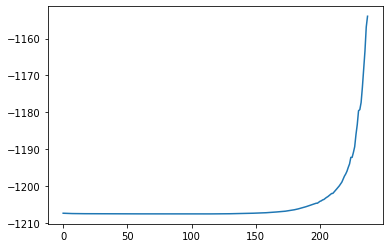

In [5]:
plt.plot(lik_ls[:238])

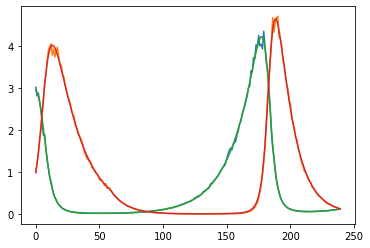

In [6]:
plt.plot(observations[:, 0])
plt.plot(observations[:, 1])
plt.plot(pointwise_xlatent_torch.detach().numpy()[:, 0])
plt.plot(pointwise_xlatent_torch.detach().numpy()[:, 1])


Text(0.5, 1.0, '$\\gamma$')

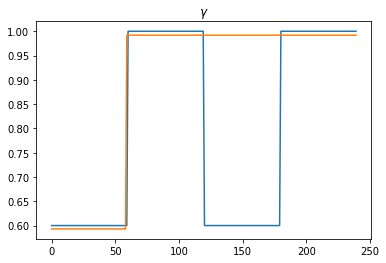

In [14]:
# plt.plot(gamma_true)
gamma_true = np.concatenate((0.6 * np.ones(60000), 1. * np.ones(60000), 0.6 * np.ones(60000), 1. * np.ones(60000)))
plt.plot(gamma_true[::1000])
plt.plot(construct(torch.tensor(vals_ls[-1]).reshape(-1, 1), occurence_times_ls[-1].astype(int)).numpy().reshape(-1, 1))
plt.title(r'$\gamma$')

In [10]:
days = 20  
obs_per_day = 12
nobs = 240
X = np.arange(0, days, 1./(obs_per_day * 1000))
alpha_true = 0.6
beta_true = 0.75 
delta_true = 1. 

alpha = time_constant_param_ls[0].item()
beta = time_constant_param_ls[1].item()
delta = time_constant_param_ls[2].item()


gamma_true = np.concatenate((0.6 * np.ones(60), 1.5 * np.ones(60), 0.6 * np.ones(60), 1.5 * np.ones(60)))

def recover_data(alpha, beta, delta, gamma, days, obs_per_day, state0=[3., 1.], linspace=1000, noise=True):
    nobs = days
    step_size = 1. / (linspace * obs_per_day)
    state_ls = np.ones((days * linspace * obs_per_day, 2))
    state_ls[0] = state0.copy()
    for i in range(1, linspace * days * obs_per_day):
        index = int((i - 1) / 1000)
        state_ls[i][0] = state_ls[i - 1][0] + step_size * (
                    alpha * state_ls[i - 1][0] - beta * state_ls[i - 1][0] * state_ls[i - 1][1])
        state_ls[i][1] = state_ls[i - 1][1] + step_size * (
                    delta * state_ls[i - 1][0] * state_ls[i - 1][1] - gamma[index]  * state_ls[i - 1][1])
    states = state_ls[::linspace]
    return states

for i in range(238):
    print(i)
    gamma = construct(torch.tensor(vals_ls[i]).reshape(-1, 1), occurence_times_ls[i].astype(int)).numpy().reshape(-1, 1)
    reconstructed = recover_data(alpha, beta, delta, gamma, days, obs_per_day)
    truth = recover_data(alpha_true, beta_true, delta_true, gamma_true, days, obs_per_day)
    plt.subplot(1, 2, 1)
    plt.plot(reconstructed[:, 0])
    plt.plot(truth[:, 0], label='true')
    plt.legend()
    plt.title('Rabbit')
    plt.subplot(1, 2, 2)
    plt.plot(reconstructed[:, 1])
    plt.plot(truth[:, 1], label='true')
    plt.title('Fox')
    plt.legend()
    plt.suptitle(str(i)+'th Iteration')
    plt.savefig('new-LV-x/plot-'+str(i)+'.png')
    plt.clf()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237


<Figure size 432x288 with 0 Axes>

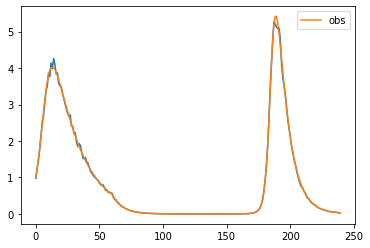

In [26]:
plt.plot(observations[:, 1])
plt.plot(truth[:, 1], label='obs')
plt.legend()

In [25]:
time_constant_param_ls_tmp

[tensor([0.6548], dtype=torch.float64, requires_grad=True),
 tensor([0.8838], dtype=torch.float64, requires_grad=True),
 tensor([0.8602], dtype=torch.float64, requires_grad=True)]

In [28]:
inferred_theta
# sigma_torch

array([0.6398801 , 0.86445002, 0.75831829, 0.73189768])

In [ ]:
plt.plot(observations[:, 0], label='f')
plt.plot(observations[:, 0], label='r')